# Problem Statement:
To forecast the Federal Funds Effective Rate(Interest Rate) from Novermber 2024 to April 2025 based on the data provided [here](https://fred.stlouisfed.org/series/FEDFUNDS).  

This data spans from July 1954 to October 2024.

Develop Deep Learning and Time Series models to perform the adove tasks and provide justification for selection.

Provide detailed explanation of neural network layers or alternative model components, and reasoning behind design choices (e.g., reasons for activation functions, regularization).

Provide code in a well-organized, readable, and thoroughly commented, making the implementation
clear and professional.

Provide justification for selection of model evaluation techniques, present reuslts clearly and interpret results.





# Data Importing and preprocessing:

In [104]:
# Importing the dataset downloaded from the link above and saved in Google Drive:
import pandas as pd
data = pd.read_csv('/content/drive/MyDrive/CS583_DeepLearningFinalProject/FEDFUNDS_DATA.csv')
print(data.head())

         DATE  FEDFUNDS
0  1954-07-01      0.80
1  1954-08-01      1.22
2  1954-09-01      1.07
3  1954-10-01      0.85
4  1954-11-01      0.83


## Checking the number of missing values in the provided dataset:

In [105]:
print(f'The number of missing values in the dataset is:\n{data.isnull().sum()}')

The number of missing values in the dataset is:
DATE        0
FEDFUNDS    0
dtype: int64


**So there are no missing values in the given dataset.**

In [106]:
# Converting the 'DATE' column in the pandas Datetime dataset:
data['DATE'] = pd.to_datetime(data['DATE'])

## Data Range:

In [107]:
start_date = data['DATE'].min()
end_date = data['DATE'].max()
print(f"Date range in the dataset: {start_date} to {end_date}")

Date range in the dataset: 1954-07-01 00:00:00 to 2024-10-01 00:00:00


So we have data for monthly Federal Funds Effective Rate(Interest Rate) from July 1954 to October 2024.

# Statistical Summary of Federal Funds Effective Rate (aka,”interest rates”):

In [108]:
print(f"Summary Statistics for FEDFUNDS column:\n{data['FEDFUNDS'].describe()}")

Summary Statistics for FEDFUNDS column:
count    844.000000
mean       4.609467
std        3.571818
min        0.050000
25%        1.820000
50%        4.265000
75%        6.177500
max       19.100000
Name: FEDFUNDS, dtype: float64


# Visualization Time series data of Fedral Fund Effective Rate(Interest Rate:)

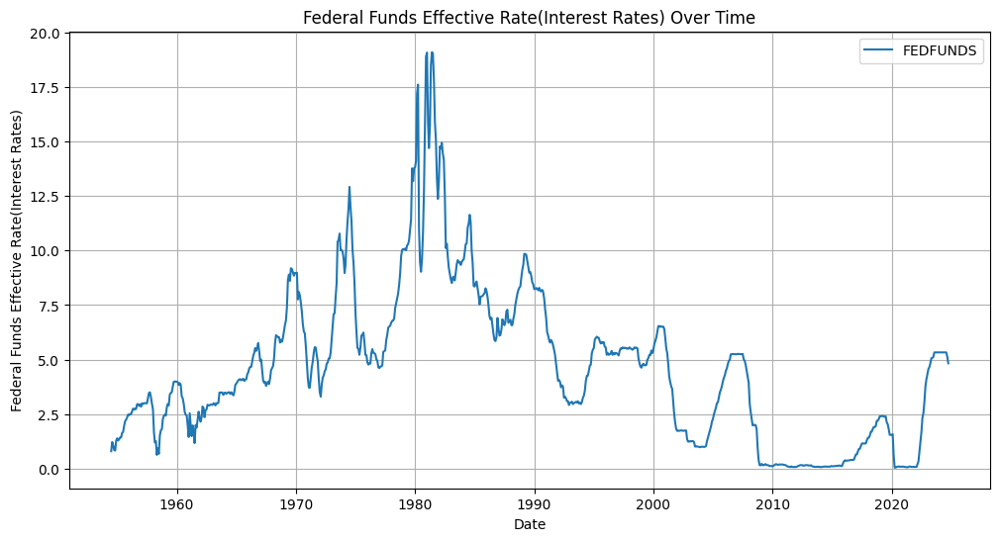

In [109]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))
plt.plot(data['DATE'], data['FEDFUNDS'], label='FEDFUNDS')
plt.title('Federal Funds Effective Rate(Interest Rates) Over Time')
plt.xlabel('Date')
plt.ylabel('Federal Funds Effective Rate(Interest Rates)')
plt.grid(True)
plt.legend()
plt.show()

# Components of Time Series Data
The data provided is Time series data. Time series data typically consists of four main components, which define its structure and characteristics over time:

## 1. **Trend**
   - **Definition**: The long-term movement or direction in the data over time.
   - **Characteristics**:
     - Can be upward, downward, or flat.
     - Reflects gradual changes in the data.
   - **Example**: An increasing trend in GDP over decades due to economic growth.

---

## 2. **Seasonality**
   - **Definition**: Regular, repeating patterns in the data over a fixed period (e.g., daily, monthly, yearly).
   - **Characteristics**:
     - Caused by periodic influences such as weather, holidays, or business cycles.
     - Has a constant frequency and amplitude.
   - **Example**: Retail sales peaking during the holiday season.

---

## 3. **Cyclic Component**
   - **Definition**: Fluctuations that occur over irregular intervals due to economic, social, or natural factors.
   - **Characteristics**:
     - Unlike seasonality, cycles are not of fixed duration.
     - Typically associated with business or economic cycles.
   - **Example**: Economic expansions and recessions affecting stock market indices.

---

## 4. **Irregular Component (Noise/Residual)**
   - **Definition**: Random variations or noise that cannot be explained by the trend, seasonality, or cycles.
   - **Characteristics**:
     - Unpredictable and erratic in nature.
     - Often caused by one-off events or measurement errors.
   - **Example**: A sudden drop in stock prices due to an unexpected geopolitical event.



## Function to process the dataset and produce 5 80-20 train-test datasets for implementation and cross validation of time series models

**Function Description:**

process_data()

        inputs:
            window_size: int - size of context window (number of months) per data point to our models
            offset: int - offset into our first window to start our next window of window_size
        outputs:
            list of 5 different 80/20 train/test splits

        description:
            The output is a list of 5 datasets. Each is a tuple of (train,test) where each dataset
            is a different 80/20 train/test split of the original dataset. Since we are splitting 80/20,
            there are 5 total datasets. This is for cross-validation training.

            Each dataset is again a tuple (train,test). Each data point in both train and test are
            (13,) dimensional numpy arrays where the first 12 values are 12 consecutive months (a year) of
            interest rates (X) and the 13th value of the array is our (Y), the following months interest rate.

            So, given the 5 datasets, we will train neural networks to take as input 12 dimensional vectors
            from the train set and output the 13th value, the label representing the next month after a full year
            cycle of interest rates. Since we have 5 datasets, we train on the 5 different train sets and test
            on their corresponding test sets. We will use the notion of cross validation to select the model
            that does the best on its corresponding test set.

            If we want to predict say, 5 months in 2025, we can use our model to take in the last 12 months and predict
            the 13th month, the first month of 2025. Now we have 13 values. We can take the last 12, not including our
            first month, and use that to give us the following month. In 5 inference steps we can generate our
            next however many months we want. This is the paradigm of "next word" prediction used by most LLM's.

            So to reiterate,
            5 Datasets:
                Each Dataset:
                    (train, test) 80%-20% split
                    Each example is size (13,)
                    X = First 12 Months interest rates
                    Y = 13th Months interest rate
            
            Our neural networks should take as input a (12) dimensional vector of consecutive interests rates
            and output a single scalar value for the next month's interest rate based on the previous 12 month context.


        example:

            splits = process_data(
                window_size=12,
                offset=3,
            )
            print(len(splits))

            for i, (train, test) in enumerate(splits):
                print(f"Split {i + 1}:")
                print(f"Train data shape: {train.shape}")
                print(f"Test data shape: {test.shape}")
                print()

            output:

            5
            Split 1:
            Train data shape: (223, 13) # 223 data points of size (13,)
            Test data shape: (55, 13)

            Split 2:
            Train data shape: (223, 13)
            Test data shape: (55, 13)

            Split 3:
            Train data shape: (223, 13)
            Test data shape: (55, 13)

            Split 4:
            Train data shape: (223, 13)
            Test data shape: (55, 13)

            Split 5:
            Train data shape: (223, 13)
            Test data shape: (55, 13)




In [116]:
import numpy as np
import numpy as np

def process_data(data, window_size: int = 12, offset: int = 1):
    """
    Prepares data for time series prediction with lagged features.

    Parameters:
    - data: The original time series data as a 1D numpy array.
    - window_size: The number of lagged observations to use as features.
    - offset: The step size for creating overlapping windows.

    Returns:
    - splits: A list of tuples containing train and test datasets for cross-validation.
    """
    # Ensure data is a numpy array
    if not isinstance(data, np.ndarray):
        data = np.array(data)

    # Create lagged features
    groups = []
    for i in range(len(data) - window_size):
        X = data[i : i + window_size]  # Lagged features
        y = data[i + window_size]     # Target value
        groups.append(np.append(X, y))

    groups = np.array(groups)  # Shape: (num_samples, window_size + 1)

    # Define splits for cross-validation (5-fold)
    splits = []
    num_samples = len(groups)
    test_size = num_samples // 5

    for i in range(5):
        test_start = i * test_size
        test_end = test_start + test_size

        test_data = groups[test_start:test_end]
        train_data = np.concatenate([groups[:test_start], groups[test_end:]])

        splits.append((train_data, test_data))

    return splits

# Example Usage
# Assume `data` is a numpy array or a pandas Series of time series values

splits = process_data(data, window_size=500, offset=1)

# Check the shapes of the splits
for i, (train, test) in enumerate(splits):
    print(f"Split {i + 1}:")
    print(f"  Train shape: {train.shape}")
    print(f"  Test shape: {test.shape}")
    print()


Split 1:
  Train shape: (400, 501)
  Test shape: (100, 501)

Split 2:
  Train shape: (400, 501)
  Test shape: (100, 501)

Split 3:
  Train shape: (400, 501)
  Test shape: (100, 501)

Split 4:
  Train shape: (400, 501)
  Test shape: (100, 501)

Split 5:
  Train shape: (400, 501)
  Test shape: (100, 501)



In [111]:
!pip install statsmodels


# Classical Statistical Time Series Models:

## a. ARIMA (AutoRegressive Integrated Moving Average)

The ARIMA model is a widely used statistical method for analyzing and forecasting time series data. It is especially effective for non-stationary data that can be made stationary through differencing.

---

## **1. Components of ARIMA**

### **a. AutoRegressive (AR) Component**
- Relies on the relationship between an observation and its lagged values.
- Controlled by the parameter \(p\) (number of lagged observations).
  
---

### **b. Integrated (I) Component**
- Involves differencing the data to make it stationary.
- Controlled by the parameter \(d\) (number of differencing steps).
  

---

### **c. Moving Average (MA) Component**
- Models the dependency between an observation and the residual errors from previous steps.
- Controlled by the parameter ($q$) (number of lagged forecast errors).

---

## **2. Mathematical Representation**

The ARIMA model is expressed as: \\

\begin{equation*}
Y_t = c + \phi_1(Y_{t-1}) + \phi_2(Y_{t-2}) + \ldots + \phi_p(Y_{t-p}) + \epsilon_t + \theta_1(\epsilon_{t-1}) + \theta_2(\epsilon_{t-2}) + \ldots + \theta_q(\epsilon_{t-q})
\end{equation*}


*Auto-regressive part = $\Phi_1(Y_{t-1})$ + $\Phi_2(Y_{t-2})$ + $\ldots$ + $\phi_p(Y_{t-p})$*

*Moving Average part = $\theta_1\epsilon_{t-1}$ + $\theta_2\epsilon_{t-2}$ + $\ldots$ + $\theta_q\epsilon_{t-q}$*


Where:
- *Auto-regressive part = $\Phi_1(Y_{t-1})$ + $\Phi_2(Y_{t-2})$ + $\ldots$ + $\phi_p(Y_{t-p})$*
- *Moving Average part = $\theta_1\epsilon_{t-1}$ + $\theta_2\epsilon_{t-2}$ + $\ldots$ + $\theta_q\epsilon_{t-q}$*
- $Y_t$: Current observation.
- $\phi$: Coefficients of the AR terms.
- $theta$: Coefficients of the MA terms.
- $epsilon_t$: Error term.
- $c$: Constant.

---

## **3. Steps in ARIMA Modeling**

1. **Identify Stationarity**:
   - Use the Augmented Dickey-Fuller (ADF) test.
   - Perform differencing if necessary.

2. **Choose Parameters (\(p, d, q\))**:
   - Use ACF and PACF plots to determine \(p\) and \(q\).
   - Select \(d\) based on stationarity.

3. **Fit the Model**:
   - Train the ARIMA model using historical data.

4. **Evaluate Residuals**:
   - Ensure residuals are random and have no pattern.

5. **Forecast**:
   - Predict future values using the trained model.

---

## **4. Strengths of ARIMA**
- Effective for univariate time series forecasting.
- Can handle data with trends and seasonal patterns (via SARIMA).

---

## **5. Limitations of ARIMA**
- Assumes linear relationships in data.
- Struggles with non-linear patterns or sudden shocks.
- Requires manual tuning of $(p, d, q)$.

---


Processing Split 1...


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Split 1 Metrics:
MAE: 0.5596, MSE: 0.5759, RMSE: 0.7589, MAPE: 11.47%
Best ARIMA Order for Split 1: (0, 1, 0)



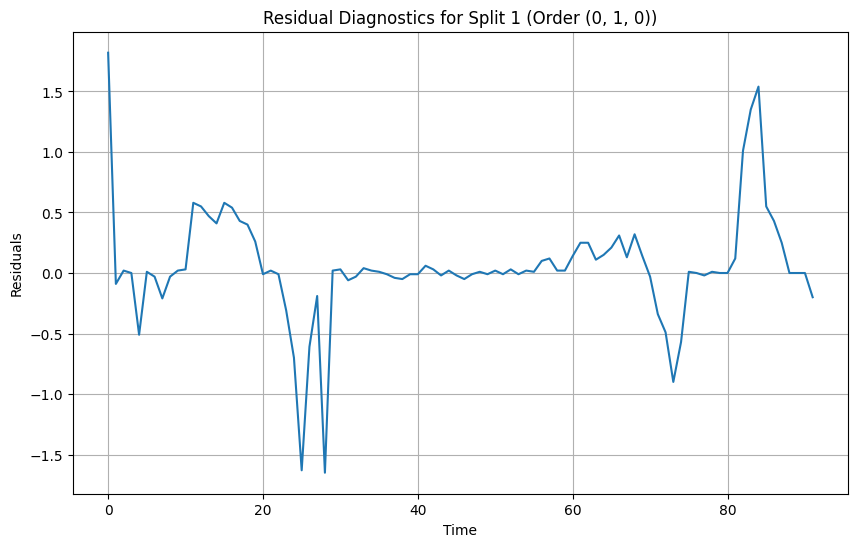

Processing Split 2...


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Split 2 Metrics:
MAE: 1.4042, MSE: 2.8465, RMSE: 1.6872, MAPE: 59.62%
Best ARIMA Order for Split 2: (0, 0, 0)



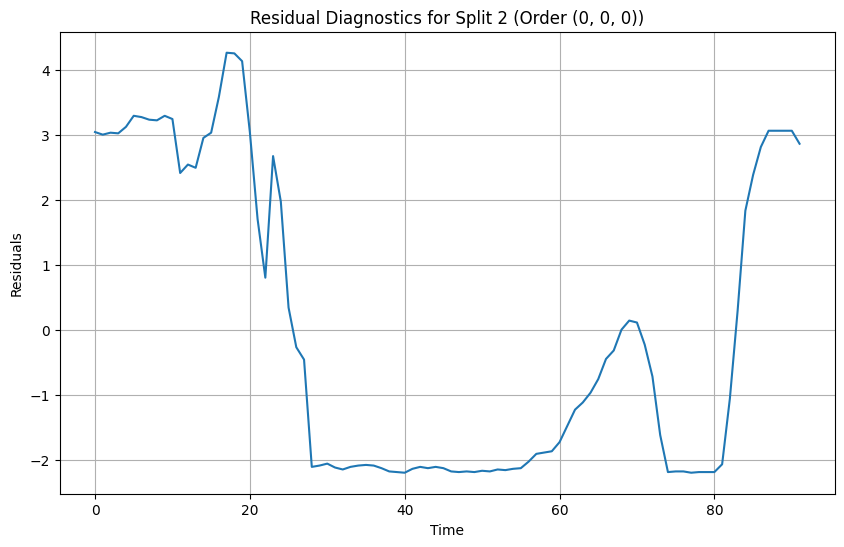

Processing Split 3...


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Split 3 Metrics:
MAE: 2.2801, MSE: 5.6887, RMSE: 2.3851, MAPE: 1530.24%
Best ARIMA Order for Split 3: (0, 0, 0)



/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


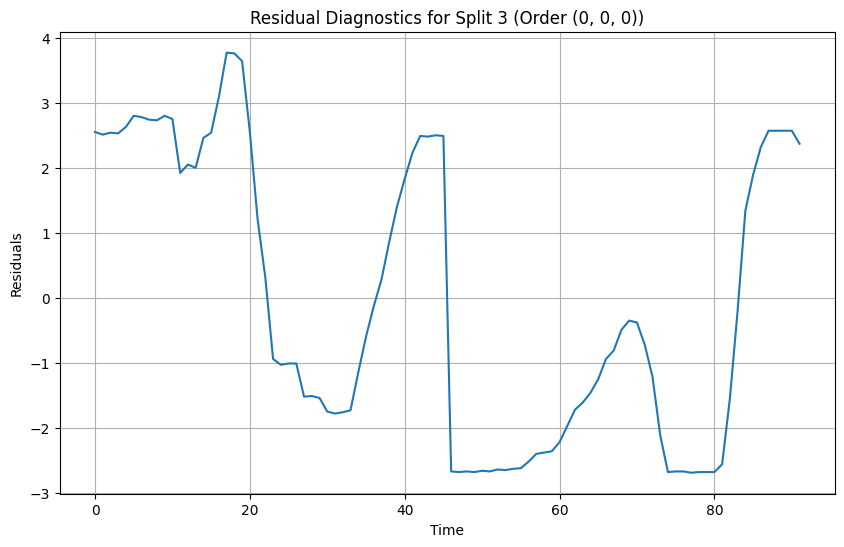

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Processing Split 4...
Split 4 Metrics:
MAE: 2.1488, MSE: 5.0809, RMSE: 2.2541, MAPE: 1363.08%
Best ARIMA Order for Split 4: (0, 0, 0)



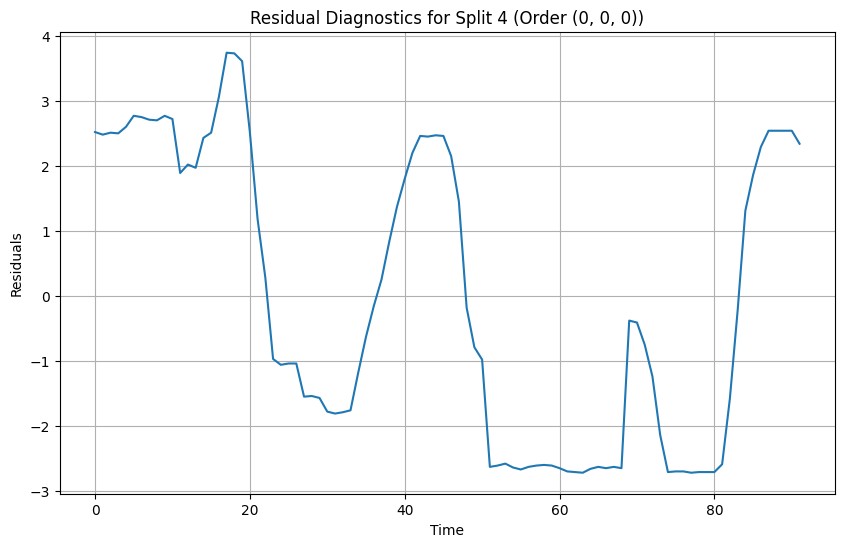

Processing Split 5...


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Split 5 Metrics:
MAE: 1.8991, MSE: 4.5562, RMSE: 2.1345, MAPE: 905.44%
Best ARIMA Order for Split 5: (0, 1, 0)



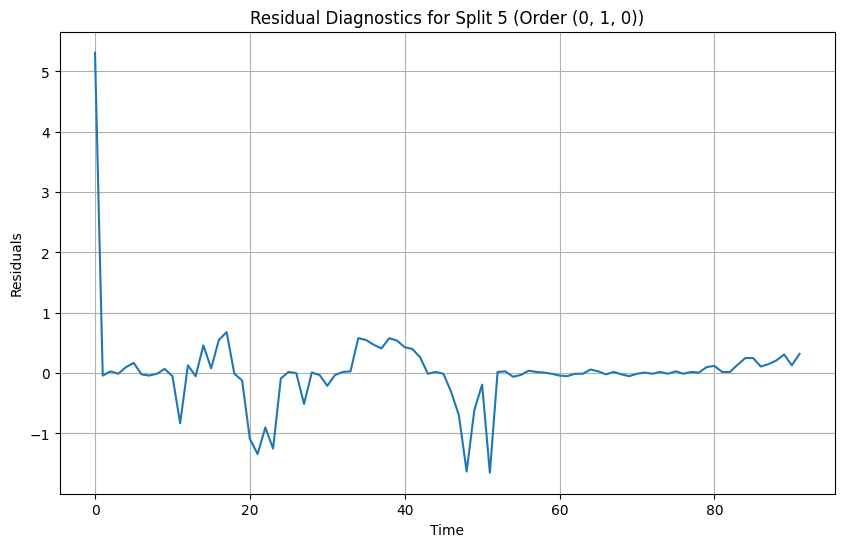

Best Model:
Order: (0, 1, 0)
MAE: 0.5596
MSE: 0.5759
RMSE: 0.7589
MAPE: 11.4672


In [45]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np
import matplotlib.pyplot as plt

# Function to evaluate metrics
def evaluate_metrics(actual, predicted):
    mae = mean_absolute_error(actual, predicted)
    mse = mean_squared_error(actual, predicted)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100
    return mae, mse, rmse, mape

# Function for Grid Search
def grid_search_arima(train_data, test_data, p_values, d_values, q_values):
    best_model = None
    best_mape = float('inf')
    best_order = None

    for p in p_values:
        for d in d_values:
            for q in q_values:
                try:
                    # Train ARIMA model
                    model = ARIMA(train_data, order=(p, d, q))
                    fitted_model = model.fit()

                    # Forecast for the test set length
                    forecast = fitted_model.forecast(steps=len(test_data))

                    # Calculate MAPE
                    actual = test_data
                    mape = np.mean(np.abs((actual - forecast) / actual)) * 100

                    # Update best model if current MAPE is lower
                    if mape < best_mape:
                        best_mape = mape
                        best_model = fitted_model
                        best_order = (p, d, q)
                except:
                    continue
    return best_model, best_order, best_mape

# Cross-validation with ARIMA and Residual Diagnostics
def arima_cross_validation_with_diagnostics(splits, p_values, d_values, q_values):
    best_model = None
    best_mape = float('inf')
    best_metrics = {}
    best_order = None

    for i, (train, test) in enumerate(splits):
        print(f"Processing Split {i + 1}...")

        # Prepare train and test data
        train_data = train[:, -1]  # Use only Y values for ARIMA
        test_data = test[:, -1]

        # Perform grid search to find the best ARIMA parameters for the split
        model, order, mape = grid_search_arima(train_data, test_data, p_values, d_values, q_values)

        if model:
            # Forecast for the test set
            forecast = model.forecast(steps=len(test_data))

            # Evaluate metrics
            mae, mse, rmse, mape = evaluate_metrics(test_data, forecast)
            print(f"Split {i + 1} Metrics:")
            print(f"MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAPE: {mape:.2f}%")
            print(f"Best ARIMA Order for Split {i + 1}: {order}\n")

            # Residual Diagnostics
            residuals = model.resid
            plt.figure(figsize=(10, 6))
            plt.plot(residuals)
            plt.title(f'Residual Diagnostics for Split {i + 1} (Order {order})')
            plt.xlabel('Time')
            plt.ylabel('Residuals')
            plt.grid(True)
            plt.show()

            # Update the best model if this split has the lowest MAPE
            if mape < best_mape:
                best_mape = mape
                best_model = model
                best_metrics = {'MAE': mae, 'MSE': mse, 'RMSE': rmse, 'MAPE': mape}
                best_order = order

    return best_model, best_order, best_metrics

# Grid search parameters
p_values = range(0, 3)
d_values = range(0, 2)
q_values = range(0, 3)

# Perform cross-validation with diagnostics
best_model, best_order, best_metrics = arima_cross_validation_with_diagnostics(splits, p_values, d_values, q_values)

# Print best model details
print("Best Model:")
print(f"Order: {best_order}")
for metric, value in best_metrics.items():
    print(f"{metric}: {value:.4f}")


In [27]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).



## b. SARIMA (Seasonal AutoRegressive Integrated Moving Average)

The **SARIMA** model extends ARIMA by incorporating seasonal components, making it suitable for time series data with repeating seasonal patterns.

---

#### **1. SARIMA Notation**
$$
SARIMA(p, d, q)(P, D, Q, s)
$$

Where:
- $p$: Non-seasonal autoregressive order.
- $d$: Non-seasonal differencing order.
- $q$: Non-seasonal moving average order.
- $P$: Seasonal autoregressive order.
- $D$: Seasonal differencing order.
- $Q$: Seasonal moving average order.
- $s$: Length of the seasonal cycle (e.g., 12 for monthly data).

---

#### **2. SARIMA Equation**

The SARIMA model is expressed as:

![SARIMA Equation](https://drive.google.com/uc?id=1-3UZ_SMaPHKrZNiIRBAaUJuFNaMBRW4s)

Where:
- $y_t$: Current observation.
- $B$: Backshift operator (e.g., $B Y_t = Y_{t-1}$).
- $\phi_p(B)$: Non-seasonal autoregressive (AR) component.
- $\Phi_P(B^s)$: Seasonal autoregressive (AR) component.
- $\theta_q(B)$: Non-seasonal moving average (MA) component.
- $\Theta_Q(B^s)$: Seasonal moving average (MA) component.
- $\e_t$: Error term (white noise).

---

#### **3. Applications**
SARIMA is effective for:
- **Seasonal data** (e.g., monthly sales, temperature readings).
- Modeling both short-term dynamics and seasonal trends.

---

#### **4. Strengths and Limitations**

##### **Strengths:**
- Models both seasonal and non-seasonal patterns.
- Flexible for a wide range of time series.

##### **Limitations:**
- Requires manual tuning of parameters.
- Assumes linear relationships.

---

#### **Example of SARIMA Workflow**
1. Perform seasonal differencing ($D$) to remove seasonality.
2. Use **Autocorrelation Function(ACF):** [It measures the linear correlation between a time series and its lagged value] and \\ **Partial Autocorrelation Function(PACF):**[PACF measures the correlation between a time series and its lagged values while controlling for the effects of intermediate lags] and create plots to determine $p, q, P, Q$.
3. Fit the SARIMA model with appropriate parameters.
4. Evaluate residuals to ensure randomness.

---


Processing Split 1...
Split 1 Metrics:
MAE: 0.5596, MSE: 0.5759, RMSE: 0.7589, MAPE: 11.47%
Best Order: (0, 1, 0), Best Seasonal Order: (0, 0, 0, 4)

Residual ADF Statistic: -5.863428255202621, p-value: 3.3685543386376933e-07


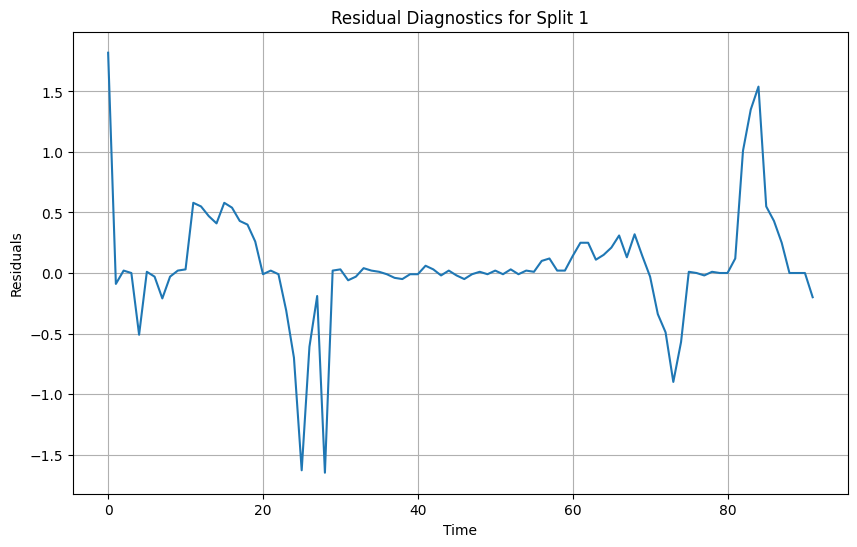

Processing Split 2...
Split 2 Metrics:
MAE: 2.4674, MSE: 9.5855, RMSE: 3.0960, MAPE: 83.71%
Best Order: (0, 0, 2), Best Seasonal Order: (0, 0, 1, 4)

Residual ADF Statistic: -1.774218907481701, p-value: 0.3933343050158341


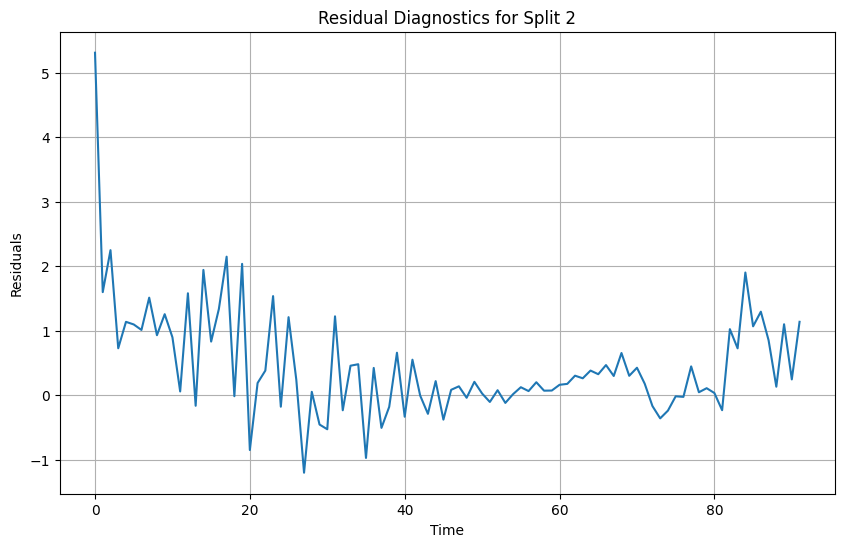

Processing Split 3...
Split 3 Metrics:
MAE: 0.3571, MSE: 0.3716, RMSE: 0.6096, MAPE: 85.59%
Best Order: (0, 0, 2), Best Seasonal Order: (0, 0, 1, 4)

Residual ADF Statistic: -2.8984354709446496, p-value: 0.04553023363585263


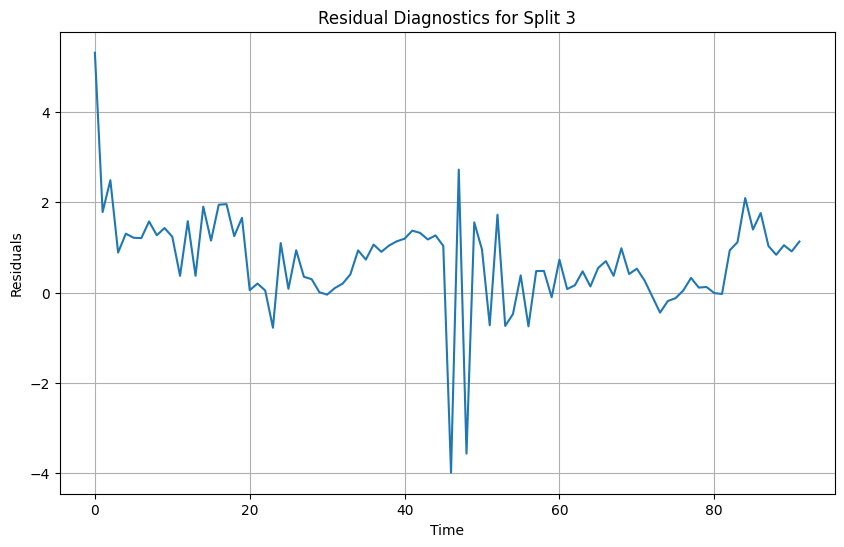

Processing Split 4...
Split 4 Metrics:
MAE: 0.6426, MSE: 0.8765, RMSE: 0.9362, MAPE: 100.00%
Best Order: (0, 0, 0), Best Seasonal Order: (0, 0, 0, 4)

Residual ADF Statistic: -2.549647403630829, p-value: 0.10385696270555089


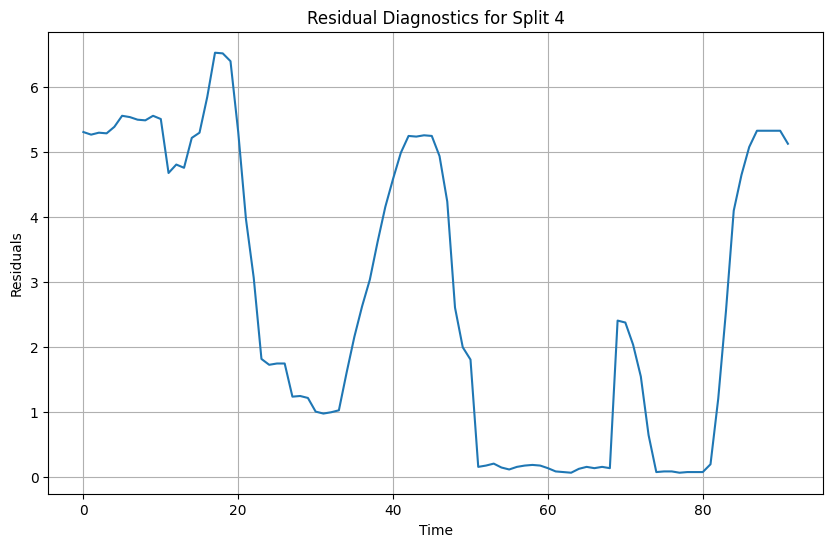

Processing Split 5...
Split 5 Metrics:
MAE: 2.1017, MSE: 9.3828, RMSE: 3.0631, MAPE: 85.47%
Best Order: (0, 0, 1), Best Seasonal Order: (0, 0, 1, 4)

Residual ADF Statistic: -2.079136904602296, p-value: 0.2529860784537378


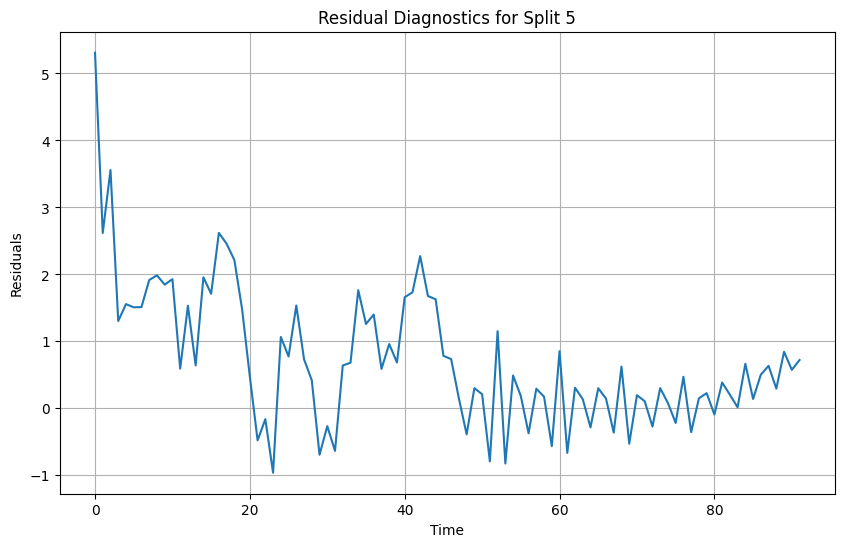

Best model saved as 'best_sarimax_model.pkl'.
Best Model:
Order: (0, 1, 0)
Seasonal Order: (0, 0, 0, 4)
MAE: 0.5596
MSE: 0.5759
RMSE: 0.7589
MAPE: 11.4672


In [25]:
import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import pickle
from statsmodels.tsa.stattools import adfuller
import warnings

warnings.filterwarnings("ignore", category=UserWarning, module="statsmodels")


# SARIMAX grid search function
def grid_search_sarimax_fixed(train_data, test_data, p_values, d_values, q_values, P_values, D_values, Q_values, s):
    best_model = None
    best_mape = float('inf')
    best_order = None
    best_seasonal_order = None

    for p in p_values:
        for d in d_values:
            for q in q_values:
                for P in P_values:
                    for D in D_values:
                        for Q in Q_values:
                          for s in s_values:
                            try:
                                # Train SARIMAX model
                                model = SARIMAX(train_data, order=(p, d, q), seasonal_order=(P, D, Q, s))

                                # Use 'xtol' instead of 'tol'
                                fitted_model = model.fit(method='powell', maxiter=500, xtol=1e-4, disp=False)

                                # Forecast for the test set
                                forecast = fitted_model.forecast(steps=len(test_data))

                                # Calculate MAPE
                                mape = np.mean(np.abs((test_data - forecast) / test_data)) * 100

                                # Update the best model if MAPE improves
                                if mape < best_mape:
                                    best_mape = mape
                                    best_model = fitted_model
                                    best_order = (p, d, q)
                                    best_seasonal_order = (P, D, Q, s)
                            except Exception as e:
                                print(f"Warning for parameters {(p, d, q), (P, D, Q, s)}: {e}")
                                continue

    # If no valid model found, raise an error
    if best_model is None:
        raise ValueError("No valid SARIMAX model was found. Please check your parameter ranges or input data.")

    return best_model, best_order, best_seasonal_order, best_mape

# Cross-validation function
def sarimax_cross_validation(splits, p_values, d_values, q_values, P_values, D_values, Q_values, s):
    best_model = None
    best_mape = float('inf')
    best_metrics = {}
    best_order = None
    best_seasonal_order = None

    for i, (train, test) in enumerate(splits):
        print(f"Processing Split {i + 1}...")

        # Extract univariate data for SARIMAX
        train_data = train[:, -1]  # Extract Y values
        test_data = test[:, -1]

        try:
            # Perform grid search to find the best SARIMAX parameters for the split
            model, order, seasonal_order, mape = grid_search_sarimax_fixed(
                train_data, test_data, p_values, d_values, q_values, P_values, D_values, Q_values, s
            )

            # Forecast for the test set
            forecast = model.forecast(steps=len(test_data))

            # Evaluate metrics
            mae, mse, rmse, mape = evaluate_metrics(test_data, forecast)
            print(f"Split {i + 1} Metrics:")
            print(f"MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAPE: {mape:.2f}%")
            print(f"Best Order: {order}, Best Seasonal Order: {seasonal_order}\n")

            # Residual Diagnostics
            residuals = model.resid
            adf_test = adfuller(residuals)
            print(f"Residual ADF Statistic: {adf_test[0]}, p-value: {adf_test[1]}")

            plt.figure(figsize=(10, 6))
            plt.plot(residuals)
            plt.title(f"Residual Diagnostics for Split {i + 1}")
            plt.xlabel("Time")
            plt.ylabel("Residuals")
            plt.grid()
            plt.show()

            # Update the best model if this split has the lowest MAPE
            if mape < best_mape:
                best_mape = mape
                best_model = model
                best_metrics = {'MAE': mae, 'MSE': mse, 'RMSE': rmse, 'MAPE': mape}
                best_order = order
                best_seasonal_order = seasonal_order
        except Exception as e:
            print(f"Error for Split {i + 1}: {e}")
            continue

    return best_model, best_order, best_seasonal_order, best_metrics

# Define grid search parameters
p_values = range(0, 3)
d_values = range(0, 2)
q_values = range(0, 3)
P_values = range(0, 2)
D_values = range(0, 1)
Q_values = range(0, 2)
s_values = [4,7,12]

# Perform cross-validation
best_model, best_order, best_seasonal_order, best_metrics = sarimax_cross_validation(
    splits, p_values, d_values, q_values, P_values, D_values, Q_values, s)

# Save the best model
if best_model:
    with open('best_sarimax_model.pkl', 'wb') as file:
        pickle.dump(best_model, file)
    print("Best model saved as 'best_sarimax_model.pkl'.")

# Print the best model details
print("Best Model:")
print(f"Order: {best_order}")
print(f"Seasonal Order: {best_seasonal_order}")
for metric, value in best_metrics.items():
    print(f"{metric}: {value:.4f}")


So the SARIMAX did not reduce the MAPE further, perhaps because the data dosen't have a linear seasonal trend. It too generated a model with:  

**MAPE: 11.4672**

**p(Order of Autoregressive (AR) Component):0** \\
p determines the number of lagged observations used in the model. \\
Typical range 0 - 3.

**d(Order of Differencing): 1** \\
d determines the number of differencing steps to make the time series stationary.
Typical range 0 - 2.

**q(Order of Moving Average (MA) Component): 0** \\
q determines the number of lagged forecast errors used in the model.
Typical 0 - 3.

**P(Seasonal autoregressive order): 0** \\
Determines the number of lagged seasonal terms in the autoregressive model. \\
Typical 0 - 2.

**D(Seasonal Differencing Order): 0** \\
Number of seasonal differencing steps needed to remove seasonal patterns. \\
Typical range 0 - 1.

**Q(Seasonal MA Order):** 0\\
Determines the number of lagged forecast errors for seasonal components. \\
Typical range 0 - 2.

**s(Seasonal Period): 4** \\
Defines the length of the seasonal cycle. \\
Example values: \\
* s=12: Monthly data with yearly seasonality.
* s=4: Quarterly data with quaterly seasonality.
* s=7: Daily data with weekly seasonality.






## c. Exponential Smoothing (ETS, Holt-Winters)



The **Holt-Winters Exponential Smoothing (ETS)** model is used for time series data that exhibit trend and/or seasonality. It extends simple exponential smoothing by adding trend and seasonal components.

---



### 1. Holt-Winters Exponential Smoothing Equations


---

#### Overall Equation
$$
\hat{Y}_{t+h} = l_t + h b_t + s_{t+h-m}
$$

Where:
- $l_t$: Level at time $t$.
- $b_t$: Trend at time $t$.
- $s_{t+h-m}$: Seasonal component adjusted for period $m$.

---

#### Level Equation
$$
l_t = \alpha (Y_t - s_{t-m}) + (1 - \alpha)(l_{t-1} + b_{t-1})
$$

---

#### Trend Equation
$$
b_t = \beta (l_t - l_{t-1}) + (1 - \beta)b_{t-1}
$$

---

#### Seasonality Equation
$$
s_t = \gamma (Y_t - l_{t-1} - b_{t-1}) + (1 - \gamma)s_{t-m}
$$

---

Where:
- $\alpha$: Smoothing parameter for the level.
- $\beta$: Smoothing parameter for the trend.
- $\gamma$: Smoothing parameter for the seasonality.
- $m$: Length of the seasonal period (e.g., 12 for monthly data).

---

### 2. Description
- The **Overall Equation** combines level, trend, and seasonality to forecast the value at time $t + h$.
- The **Level Equation** updates the baseline value by accounting for seasonality.
- The **Trend Equation** adjusts the growth rate over time.
- The **Seasonality Equation** captures repeating patterns in the data.


---

### 3. Applications

Holt-Winters is suitable for:
- Time series with **trend** and **seasonality** (e.g., sales data, temperature readings).
- Short- to medium-term forecasting.

---

### 4. Strengths and Limitations

#### Strengths:
- Captures both trend and seasonal patterns.
- Simple to implement and interpret.

#### Limitations:
- Assumes additive or multiplicative seasonality.
- Requires seasonality to be constant over time.

---

### 5. Example Holt-Winters Workflow
1. Identify the trend and seasonality type (additive or multiplicative).
2. Tune smoothing parameters (\(\alpha, \beta, \gamma\)).
3. Fit the model to the data.
4. Evaluate the residuals to ensure randomness.


Processing Split 1...


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:84: RuntimeWarning: overflow encountered in matmul
  return err.T @ err


Split 1 Metrics:
MAE: 0.4914, MSE: 0.5042, RMSE: 0.7101, MAPE: 10.32%
Best Parameters: (None, 'add', 12)

Residual ADF Statistic: -4.383812692972568, p-value: 0.0003170368021612618


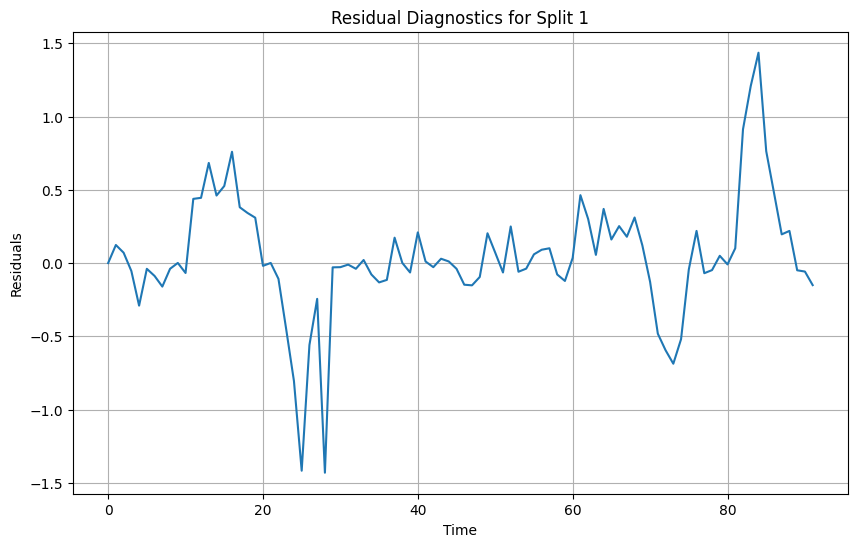

Processing Split 2...
Split 2 Metrics:
MAE: 2.0990, MSE: 6.1335, RMSE: 2.4766, MAPE: 148.00%
Best Parameters: ('add', 'mul', 12)

Residual ADF Statistic: -2.8626779550023964, p-value: 0.049863365058495035


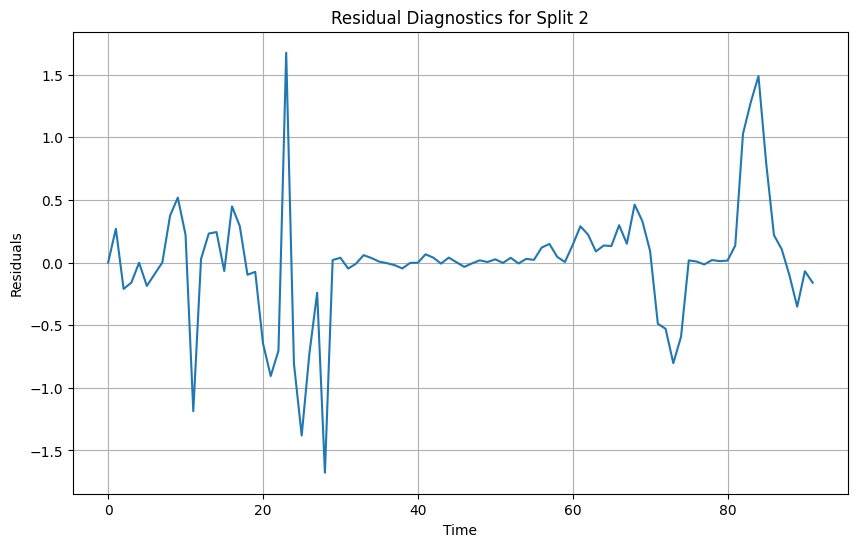

Processing Split 3...
Split 3 Metrics:
MAE: 2.5891, MSE: 8.1881, RMSE: 2.8615, MAPE: 1767.56%
Best Parameters: ('mul', 'mul', 12)

Residual ADF Statistic: -7.160264326254095, p-value: 2.9807599622598327e-10


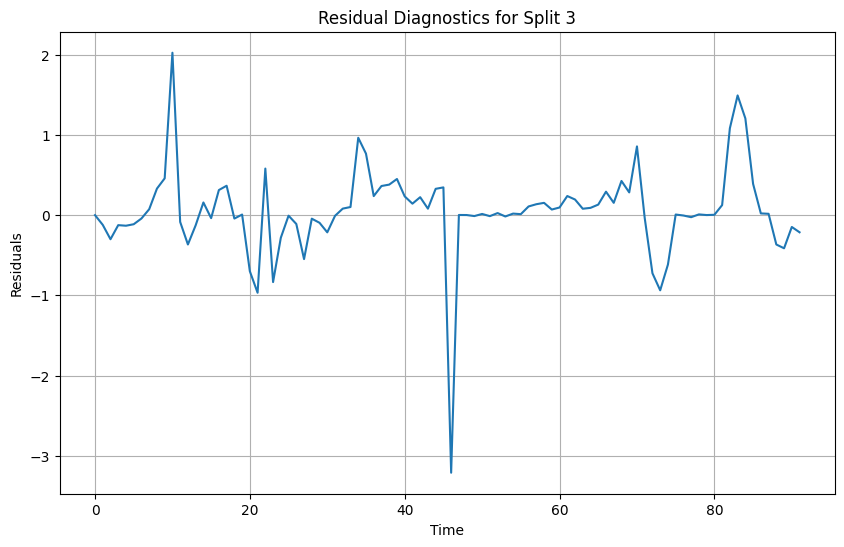

Processing Split 4...
Split 4 Metrics:
MAE: 2.3937, MSE: 7.8975, RMSE: 2.8103, MAPE: 1372.02%
Best Parameters: ('add', 'mul', 12)

Residual ADF Statistic: -9.269176165886865, p-value: 1.3412279683944327e-15


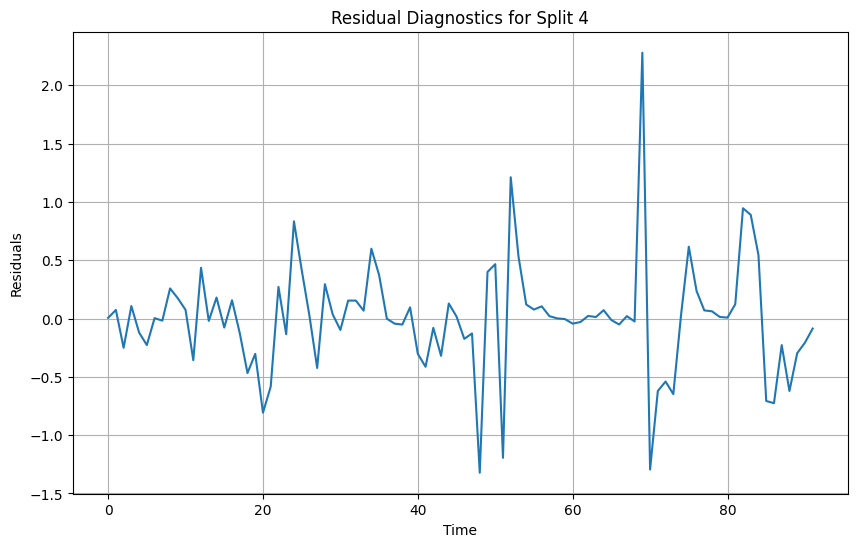

Processing Split 5...
Split 5 Metrics:
MAE: 1.9030, MSE: 4.9167, RMSE: 2.2174, MAPE: 789.58%
Best Parameters: (None, 'add', 12)

Residual ADF Statistic: -3.6864882928483462, p-value: 0.004307272777471834


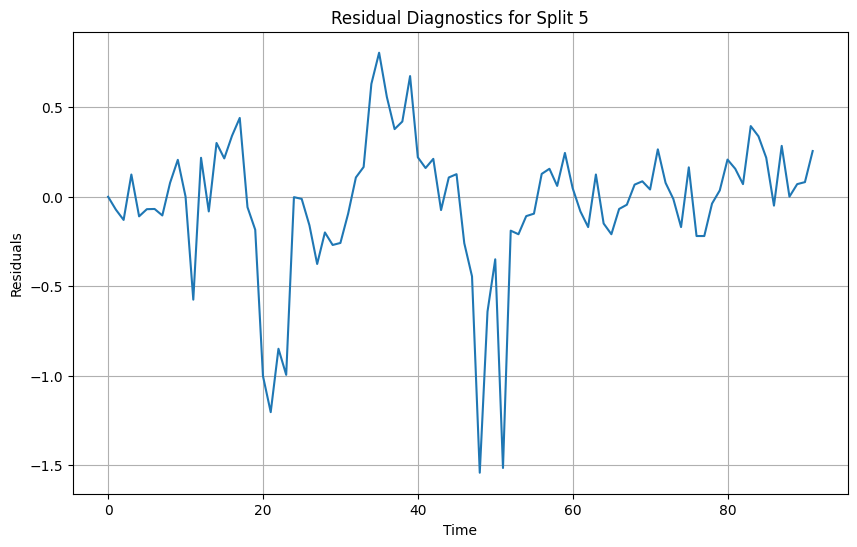

Best model saved as 'best_ets_model.pkl'.
Best Model:
Parameters: (None, 'add', 12)
MAE: 0.4914
MSE: 0.5042
RMSE: 0.7101
MAPE: 10.3193


In [26]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
warnings.filterwarnings("ignore", category=UserWarning, module="statsmodels")




# Grid search for ETS Holt-Winters
def grid_search_ets(train_data, test_data, seasonal_periods, trend_options, seasonal_options):
    best_model = None
    best_mape = float('inf')
    best_params = None

    for trend in trend_options:
        for seasonal in seasonal_options:
            for sp in seasonal_periods:
                try:
                    # Train ETS Holt-Winters model
                    model = ExponentialSmoothing(
                        train_data,
                        trend=trend,
                        seasonal=seasonal,
                        seasonal_periods=sp
                    )
                    fitted_model = model.fit(optimized=True)

                    # Forecast for the test set
                    forecast = fitted_model.forecast(steps=len(test_data))

                    # Evaluate MAPE
                    mae, mse, rmse, mape = evaluate_metrics(test_data, forecast)

                    # Update best model if MAPE improves
                    if mape < best_mape:
                        best_mape = mape
                        best_model = fitted_model
                        best_params = (trend, seasonal, sp)
                except Exception as e:
                    print(f"Warning for parameters Trend: {trend}, Seasonal: {seasonal}, Periods: {sp} - {e}")
                    continue

    if best_model is None:
        raise ValueError("No valid ETS Holt-Winters model was found. Please check your parameter ranges or input data.")

    return best_model, best_params, best_mape


# Cross-validation function
def ets_cross_validation(splits, seasonal_periods, trend_options, seasonal_options):
    best_model = None
    best_mape = float('inf')
    best_metrics = {}
    best_params = None

    for i, (train, test) in enumerate(splits):
        print(f"Processing Split {i + 1}...")

        # Extract train and test data
        train_data = train[:, -1]  # Extract Y values
        test_data = test[:, -1]

        try:
            # Perform grid search
            model, params, mape = grid_search_ets(train_data, test_data, seasonal_periods, trend_options, seasonal_options)

            # Forecast for the test set
            forecast = model.forecast(steps=len(test_data))

            # Evaluate metrics
            mae, mse, rmse, mape = evaluate_metrics(test_data, forecast)
            print(f"Split {i + 1} Metrics:")
            print(f"MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAPE: {mape:.2f}%")
            print(f"Best Parameters: {params}\n")

            # Residual diagnostics
            residuals = model.resid
            adf_test = adfuller(residuals)
            print(f"Residual ADF Statistic: {adf_test[0]}, p-value: {adf_test[1]}")

            plt.figure(figsize=(10, 6))
            plt.plot(residuals)
            plt.title(f"Residual Diagnostics for Split {i + 1}")
            plt.xlabel("Time")
            plt.ylabel("Residuals")
            plt.grid()
            plt.show()

            # Update best model if this split has the lowest MAPE
            if mape < best_mape:
                best_mape = mape
                best_model = model
                best_metrics = {'MAE': mae, 'MSE': mse, 'RMSE': rmse, 'MAPE': mape}
                best_params = params
        except Exception as e:
            print(f"Error for Split {i + 1}: {e}")
            continue

    return best_model, best_params, best_metrics


# Define grid search parameters
seasonal_periods = [12]  # For yearly seasonality (monthly data)
trend_options = ['add', 'mul', None]  # Additive, multiplicative, or no trend
seasonal_options = ['add', 'mul', None]  # Additive, multiplicative, or no seasonality

# Perform cross-validation
best_model, best_params, best_metrics = ets_cross_validation(
    splits, seasonal_periods, trend_options, seasonal_options
)

# Save the best model
if best_model:
    with open('best_ets_model.pkl', 'wb') as file:
        pickle.dump(best_model, file)
    print("Best model saved as 'best_ets_model.pkl'.")

# Print the best model details
print("Best Model:")
print(f"Parameters: {best_params}")
for metric, value in best_metrics.items():
    print(f"{metric}: {value:.4f}")


So the **MAPE=10.3193** slightly impoved as it reduced from **11.4672** which was the lowest MAPE value obtained for both ARIMA and SARIMA models.

# Machine Learning Models:

## a. Random forest for time series forecasting:

Random Forest is a versatile machine learning algorithm that can be applied to time series data by using **lagged features**. In this approach, lagged values of the time series are used as input features to predict future values.

### Equation

The Random Forest model predicts the next value $ \hat{Y}_{t+h} $ based on lagged features $ X $ as follows:

$$
\hat{Y}_{t+h} = \frac{1}{N} \sum_{i=1}^{N} f_i(X)
$$

Where:
- $ \hat{Y}_{t+h} $: Predicted value at time $ t+h $.
- $ N $: Number of decision trees in the forest.
- $ f_i(X) $: Prediction from the $ i $-th decision tree.
- $ X $: Input feature vector (e.g., lagged values $ [Y_{t}, Y_{t-1}, \dots, Y_{t-p}] $).

### Key Steps in Random Forest for Time Series Prediction
1. **Lagged Features Creation**: Generate lagged values of the time series as features.
2. **Train-Test Split**: Divide the time series data into training and testing sets.
3. **Model Training**: Train a Random Forest model using the lagged features and the target values.
4. **Prediction**: Use the trained model to predict future values.

### Advantages
- Handles non-linearity and complex interactions in the data.
- Robust to overfitting due to the ensemble approach.
- Provides feature importance to understand the influence of each lag.

### Limitations
- Does not inherently account for temporal order or seasonality in data.
- Requires careful feature engineering (e.g., selection of lags).

Random Forest is particularly useful for time series data with complex relationships and non-linear patterns, making it a powerful tool for forecasting tasks.


Processing Split 1...
Parameters: {'n_estimators': 50, 'max_depth': 3}, Metrics: MAE=1.0657, MSE=1.4097, RMSE=1.1873, MAPE=19.49%
Residual ADF Statistic: 0.16909074612499703, p-value: 0.9704737197810033


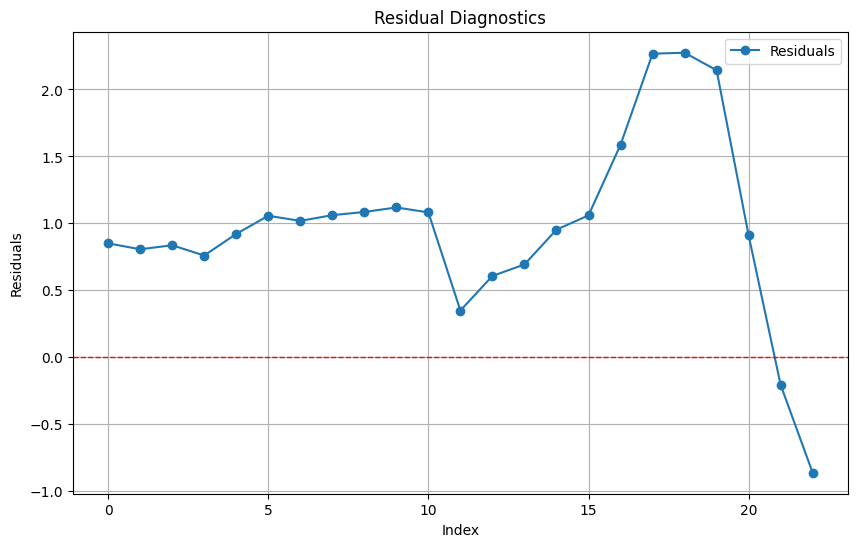

Parameters: {'n_estimators': 50, 'max_depth': 5}, Metrics: MAE=1.1939, MSE=1.7291, RMSE=1.3149, MAPE=21.82%
Residual ADF Statistic: 0.6596033775917541, p-value: 0.9889962276396533


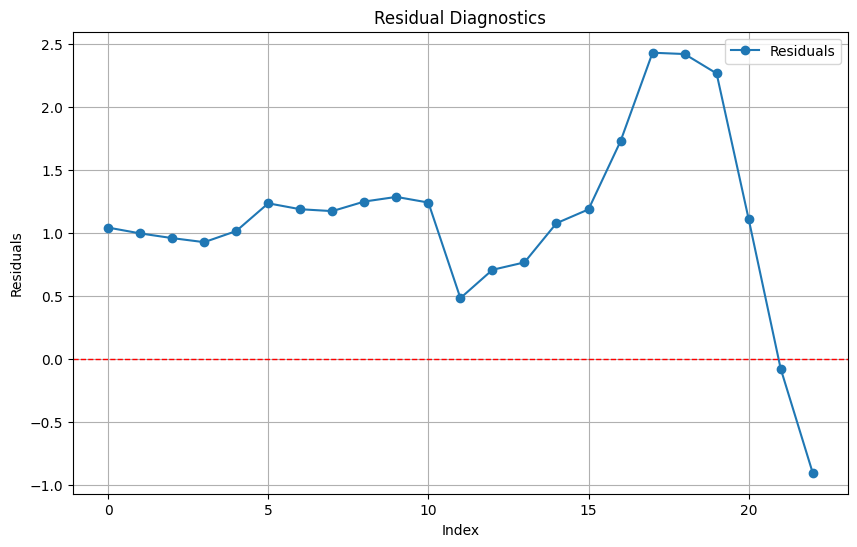

Parameters: {'n_estimators': 50, 'max_depth': 7}, Metrics: MAE=1.2498, MSE=1.8398, RMSE=1.3564, MAPE=22.88%
Residual ADF Statistic: -0.20934378699070252, p-value: 0.9373986595412975


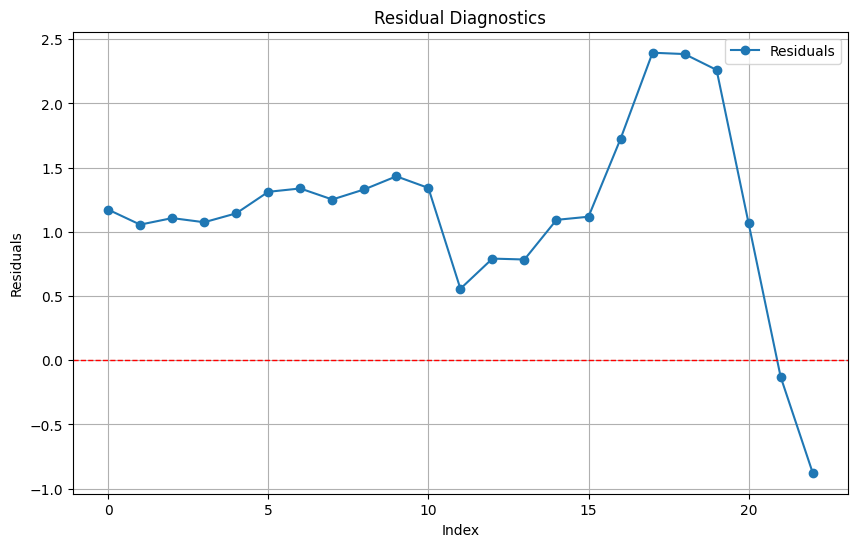

Parameters: {'n_estimators': 100, 'max_depth': 3}, Metrics: MAE=1.2103, MSE=1.7502, RMSE=1.3229, MAPE=22.15%
Residual ADF Statistic: -0.16877946033567412, p-value: 0.9421421435240909


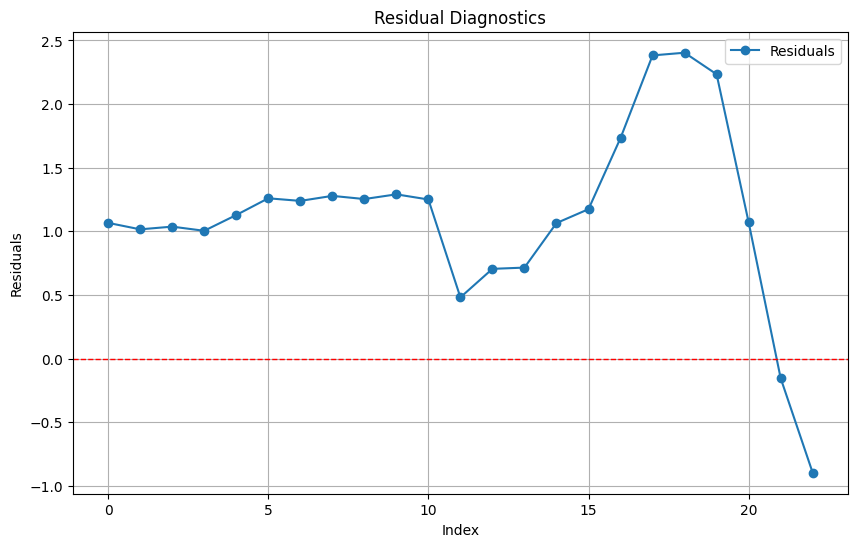

Parameters: {'n_estimators': 100, 'max_depth': 5}, Metrics: MAE=1.2017, MSE=1.7345, RMSE=1.3170, MAPE=22.03%
Residual ADF Statistic: 0.12259671827125106, p-value: 0.9675704407832332


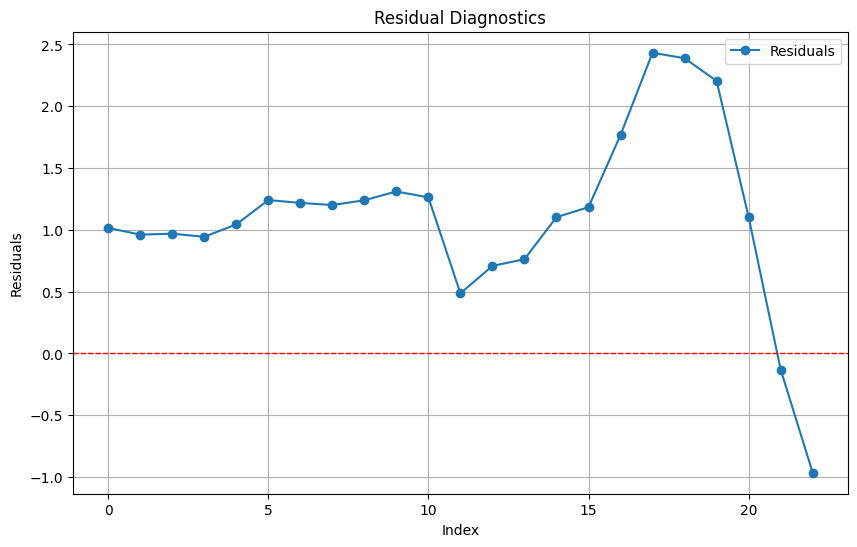

Parameters: {'n_estimators': 100, 'max_depth': 7}, Metrics: MAE=1.2558, MSE=1.8703, RMSE=1.3676, MAPE=23.00%
Residual ADF Statistic: 0.14432351089431994, p-value: 0.9689601827066028


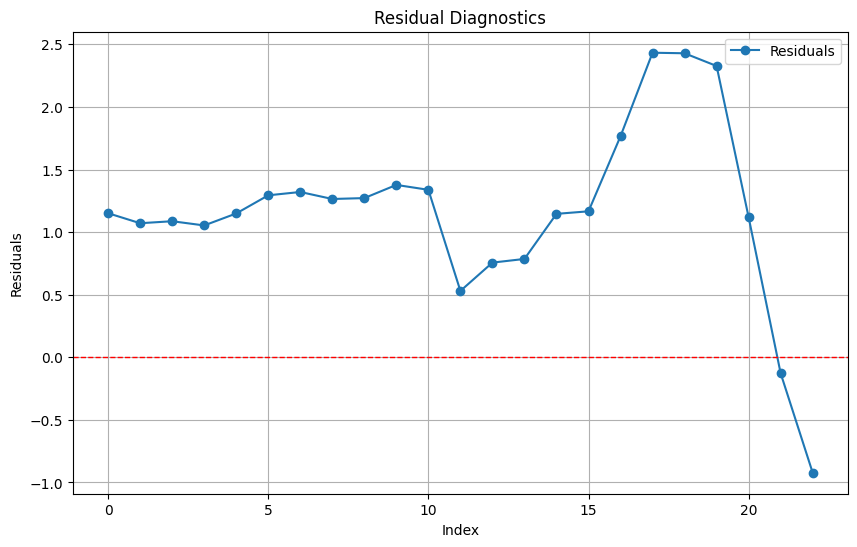

Processing Split 2...
Parameters: {'n_estimators': 50, 'max_depth': 3}, Metrics: MAE=0.2802, MSE=0.1032, RMSE=0.3212, MAPE=14.70%
Residual ADF Statistic: -2.5675940800419386, p-value: 0.09988156638753326


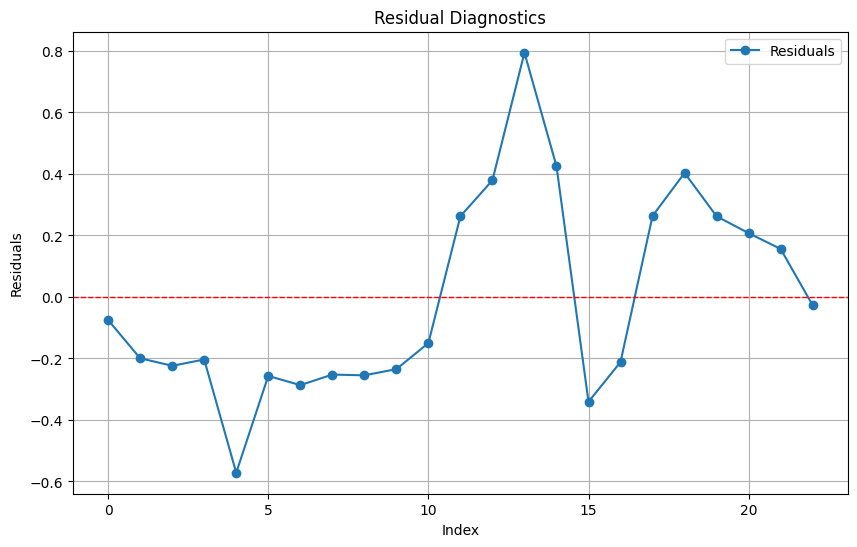

Parameters: {'n_estimators': 50, 'max_depth': 5}, Metrics: MAE=0.2495, MSE=0.0985, RMSE=0.3138, MAPE=11.09%
Residual ADF Statistic: -2.428637545003464, p-value: 0.13381624912090045


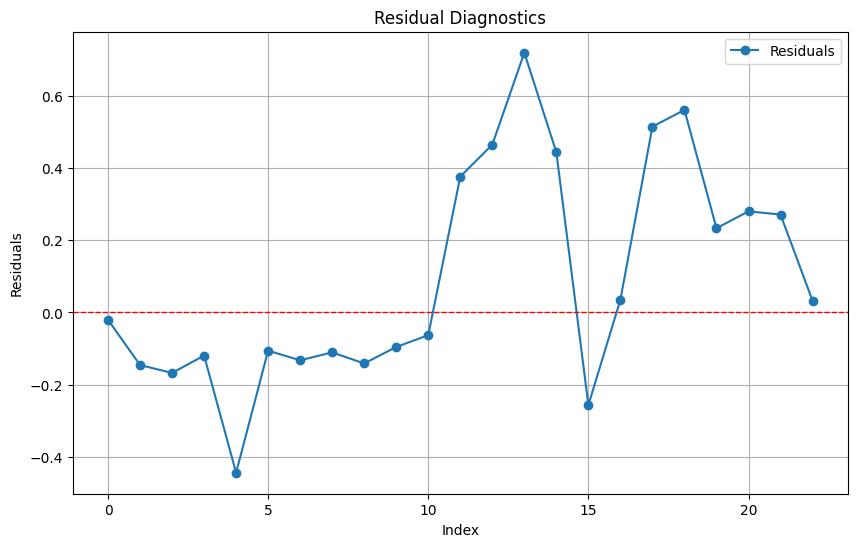

Parameters: {'n_estimators': 50, 'max_depth': 7}, Metrics: MAE=0.2397, MSE=0.0825, RMSE=0.2873, MAPE=12.52%
Residual ADF Statistic: -2.4611463767156594, p-value: 0.12521623486573913


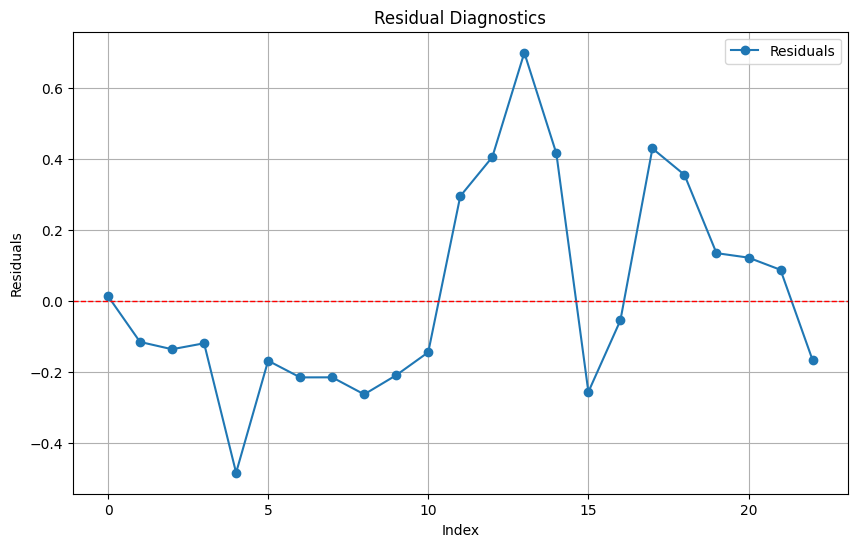

Parameters: {'n_estimators': 100, 'max_depth': 3}, Metrics: MAE=0.2800, MSE=0.1102, RMSE=0.3320, MAPE=15.06%
Residual ADF Statistic: -2.2487157256395394, p-value: 0.18904164496493586


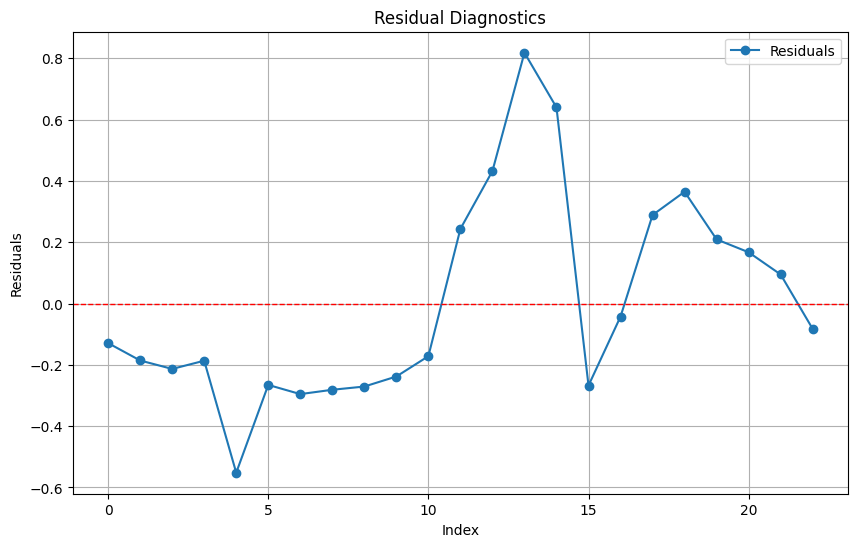

Parameters: {'n_estimators': 100, 'max_depth': 5}, Metrics: MAE=0.2570, MSE=0.1032, RMSE=0.3212, MAPE=12.69%
Residual ADF Statistic: -2.1630251432056755, p-value: 0.21993773580165776


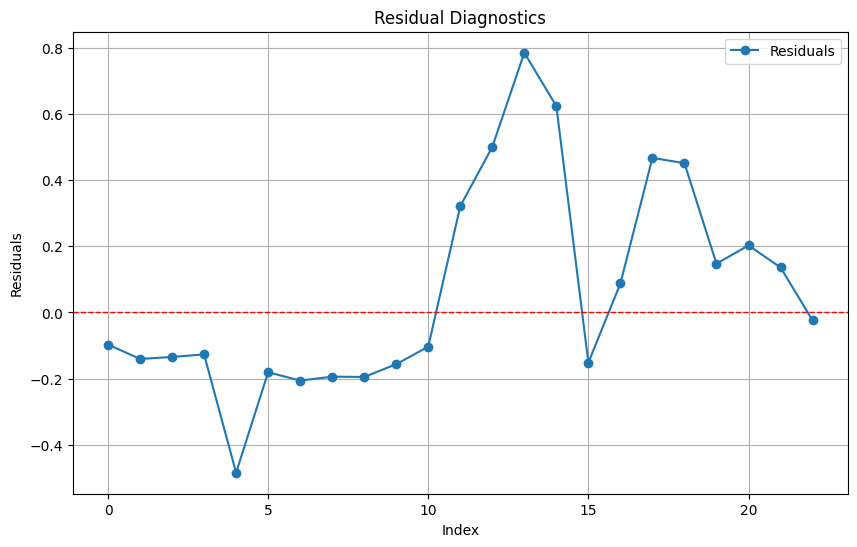

Parameters: {'n_estimators': 100, 'max_depth': 7}, Metrics: MAE=0.2461, MSE=0.0949, RMSE=0.3081, MAPE=12.78%
Residual ADF Statistic: -2.1239638530926266, p-value: 0.2349884206632698


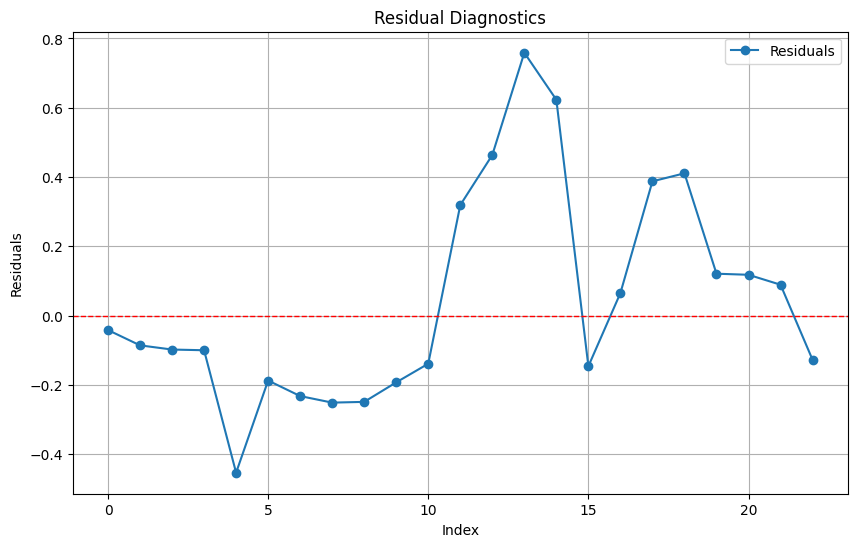

Processing Split 3...
Parameters: {'n_estimators': 50, 'max_depth': 3}, Metrics: MAE=0.2908, MSE=0.1305, RMSE=0.3612, MAPE=141.55%
Residual ADF Statistic: -2.0958852000764647, p-value: 0.2461723991725383


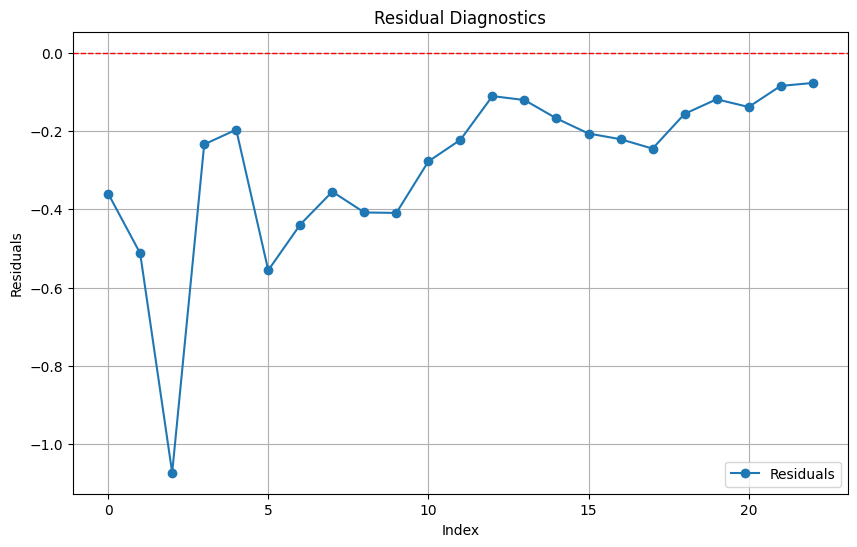

Parameters: {'n_estimators': 50, 'max_depth': 5}, Metrics: MAE=0.2990, MSE=0.1420, RMSE=0.3768, MAPE=153.69%
Residual ADF Statistic: -2.51459732691131, p-value: 0.11196291491080163


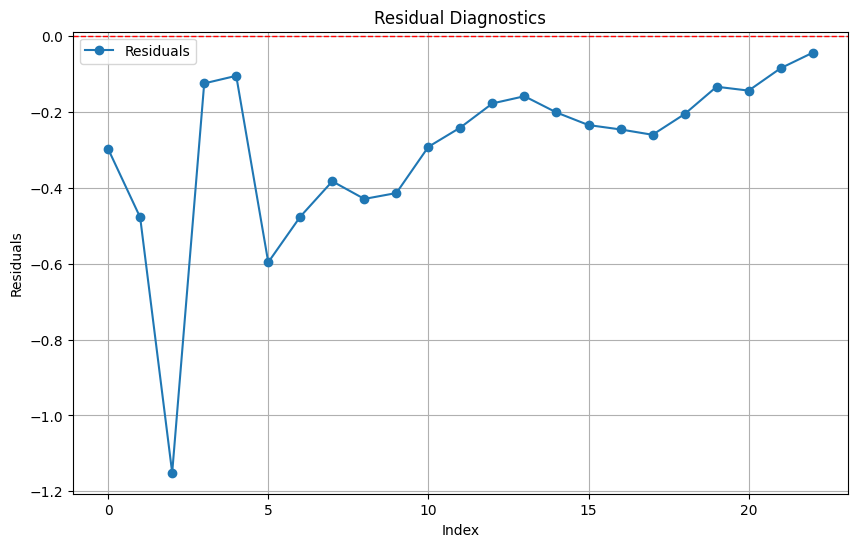

Parameters: {'n_estimators': 50, 'max_depth': 7}, Metrics: MAE=0.2884, MSE=0.1307, RMSE=0.3616, MAPE=143.26%
Residual ADF Statistic: -2.951090103101503, p-value: 0.03972134479745637


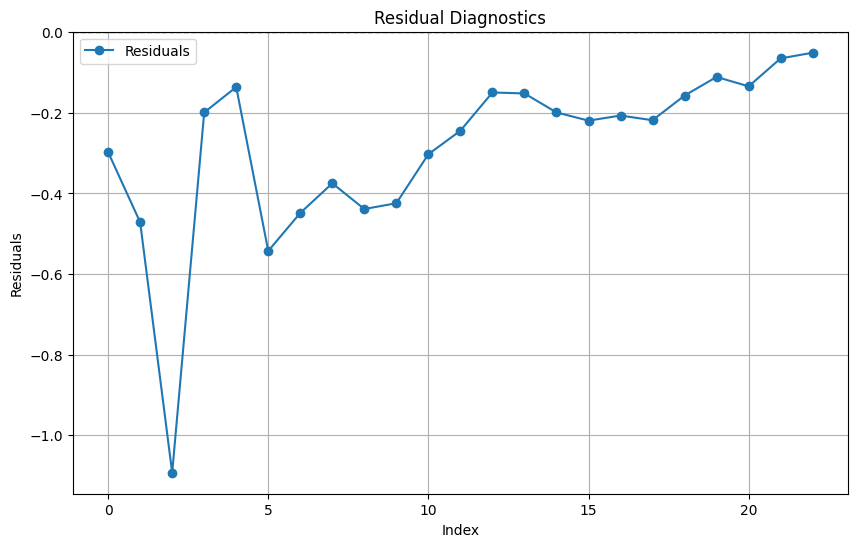

Parameters: {'n_estimators': 100, 'max_depth': 3}, Metrics: MAE=0.3098, MSE=0.1449, RMSE=0.3807, MAPE=151.33%
Residual ADF Statistic: -3.303051634183422, p-value: 0.014742616205197543


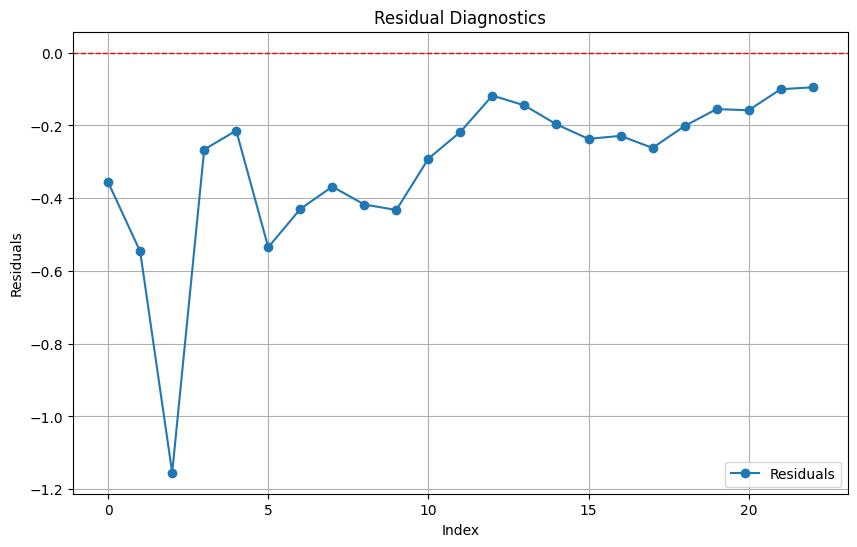

Parameters: {'n_estimators': 100, 'max_depth': 5}, Metrics: MAE=0.3036, MSE=0.1363, RMSE=0.3692, MAPE=158.42%
Residual ADF Statistic: -2.006986494742742, p-value: 0.28351819170313697


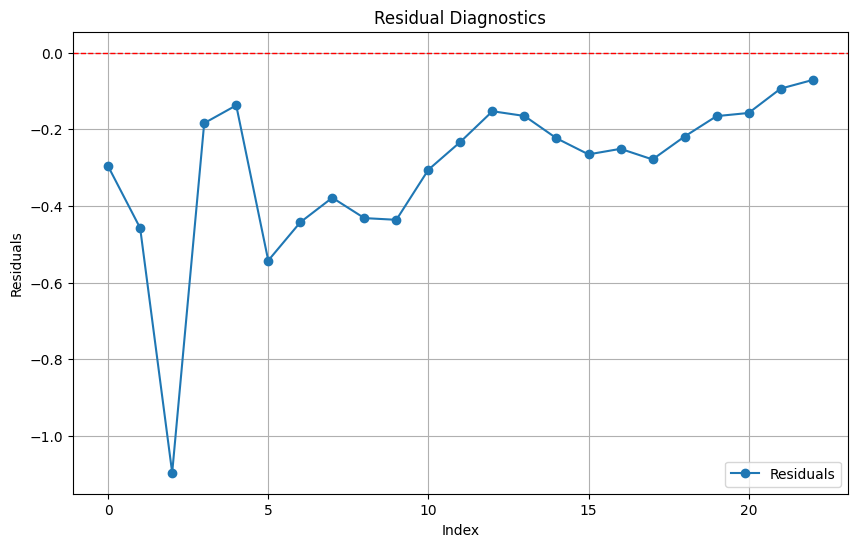

Parameters: {'n_estimators': 100, 'max_depth': 7}, Metrics: MAE=0.3008, MSE=0.1360, RMSE=0.3688, MAPE=152.78%
Residual ADF Statistic: -1.759671241282181, p-value: 0.40065950635782455


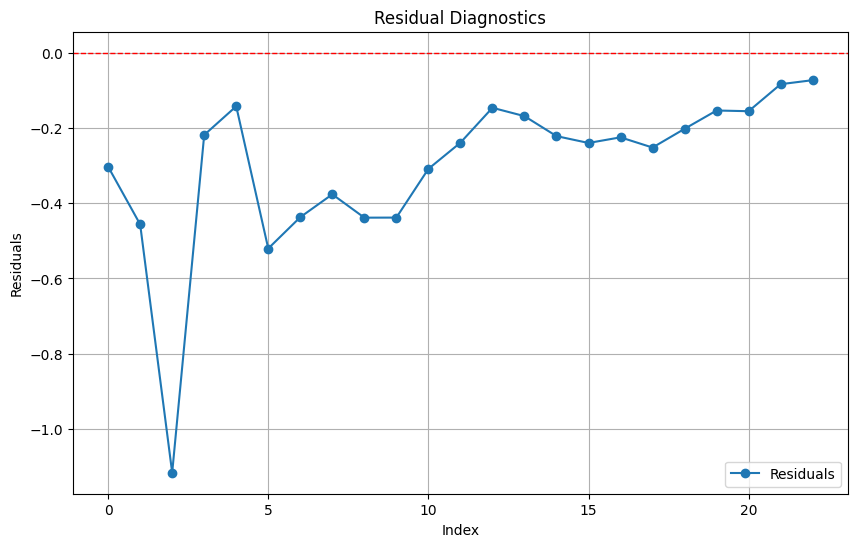

Processing Split 4...
Parameters: {'n_estimators': 50, 'max_depth': 3}, Metrics: MAE=0.0887, MSE=0.0133, RMSE=0.1152, MAPE=29.75%
Residual ADF Statistic: -2.4989216721112237, p-value: 0.11573691408460468


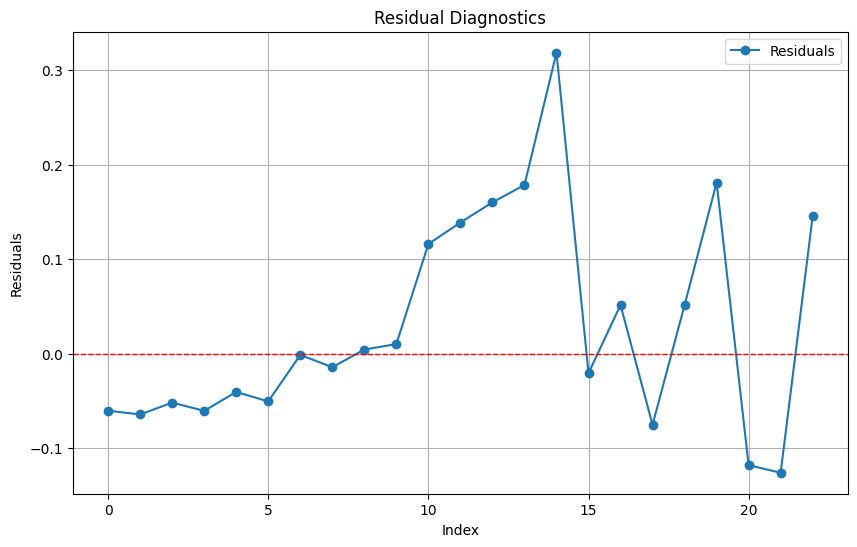

Parameters: {'n_estimators': 50, 'max_depth': 5}, Metrics: MAE=0.1099, MSE=0.0204, RMSE=0.1428, MAPE=32.44%
Residual ADF Statistic: -2.5693685897314222, p-value: 0.09949484793400215


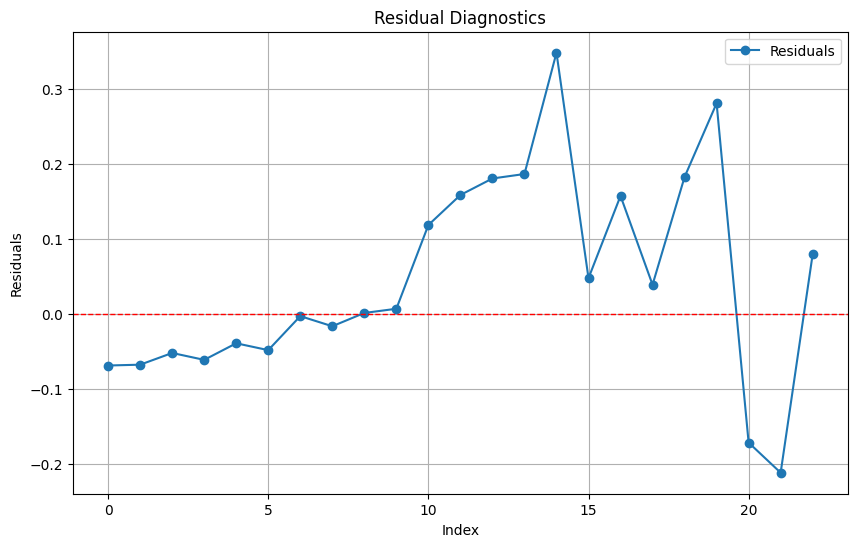

Parameters: {'n_estimators': 50, 'max_depth': 7}, Metrics: MAE=0.1036, MSE=0.0184, RMSE=0.1357, MAPE=31.17%
Residual ADF Statistic: -2.567471386096815, p-value: 0.09990834713242858


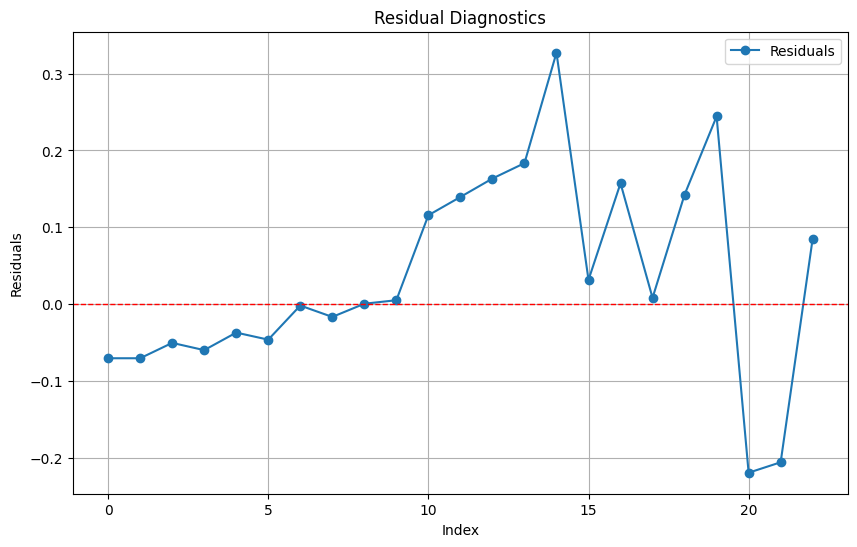

Parameters: {'n_estimators': 100, 'max_depth': 3}, Metrics: MAE=0.0787, MSE=0.0094, RMSE=0.0969, MAPE=29.66%
Residual ADF Statistic: -2.040273407182309, p-value: 0.26919842397435434


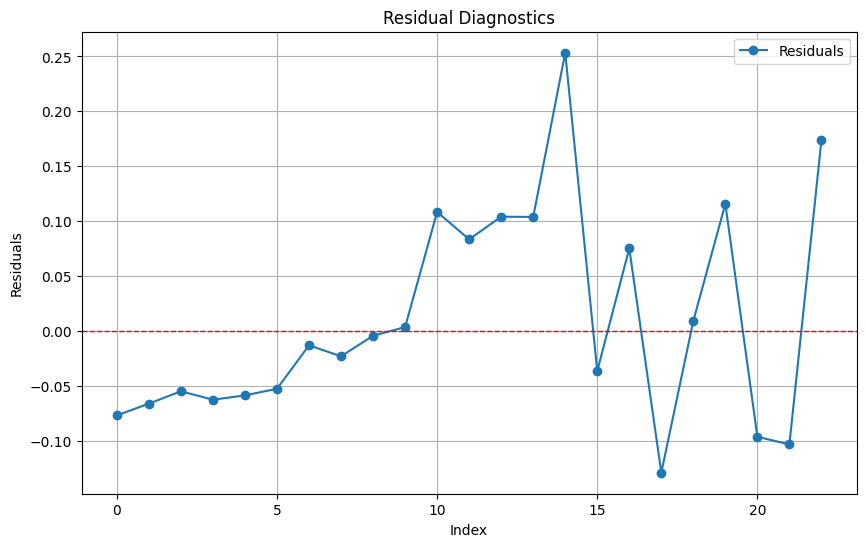

Parameters: {'n_estimators': 100, 'max_depth': 5}, Metrics: MAE=0.0878, MSE=0.0114, RMSE=0.1068, MAPE=31.50%
Residual ADF Statistic: -2.4928711786294384, p-value: 0.1172184931538271


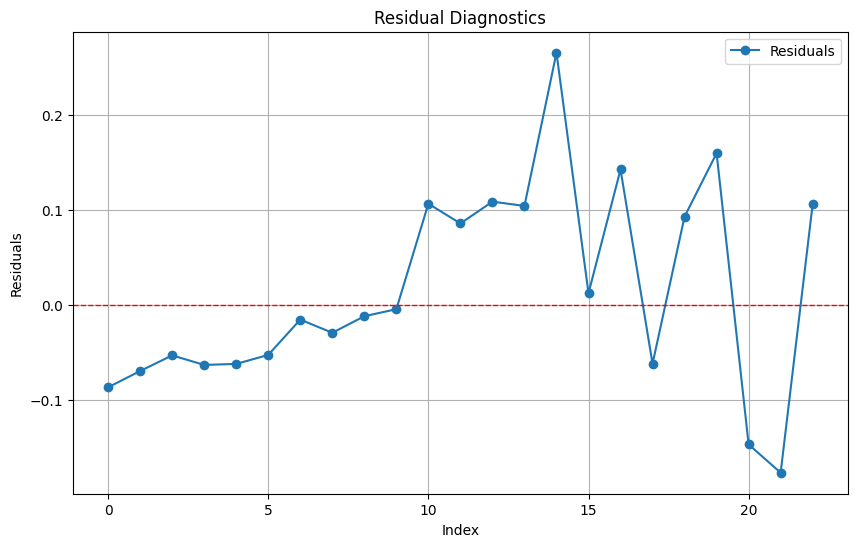

Parameters: {'n_estimators': 100, 'max_depth': 7}, Metrics: MAE=0.0912, MSE=0.0123, RMSE=0.1108, MAPE=31.93%
Residual ADF Statistic: -3.08798626453041, p-value: 0.02745512817258558


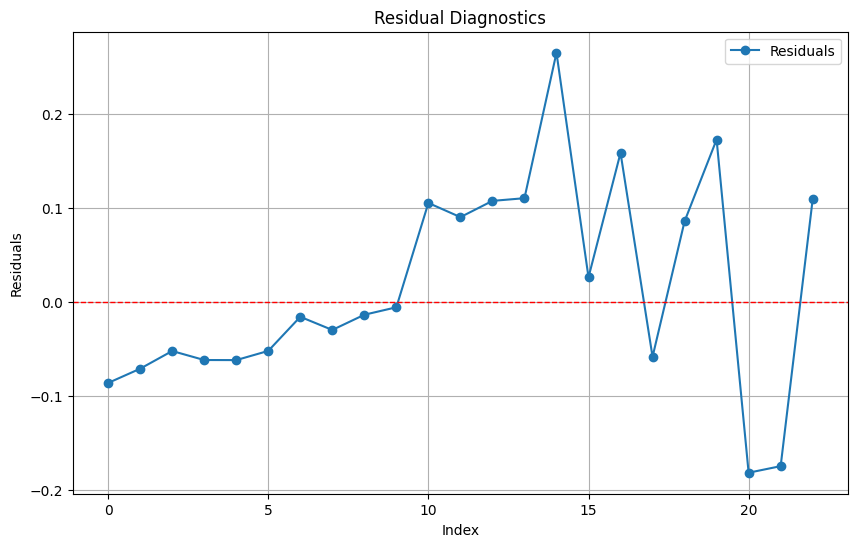

Processing Split 5...
Parameters: {'n_estimators': 50, 'max_depth': 3}, Metrics: MAE=0.3812, MSE=0.2323, RMSE=0.4820, MAPE=64.14%
Residual ADF Statistic: -1.8487483059158807, p-value: 0.3565419153286511


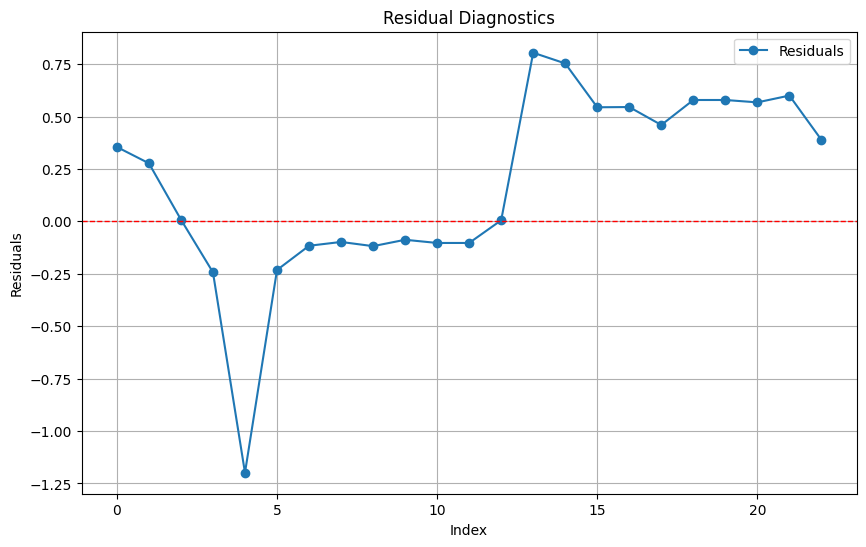

Parameters: {'n_estimators': 50, 'max_depth': 5}, Metrics: MAE=0.3914, MSE=0.2523, RMSE=0.5023, MAPE=62.81%
Residual ADF Statistic: -1.8874358131137194, p-value: 0.33799458841358165


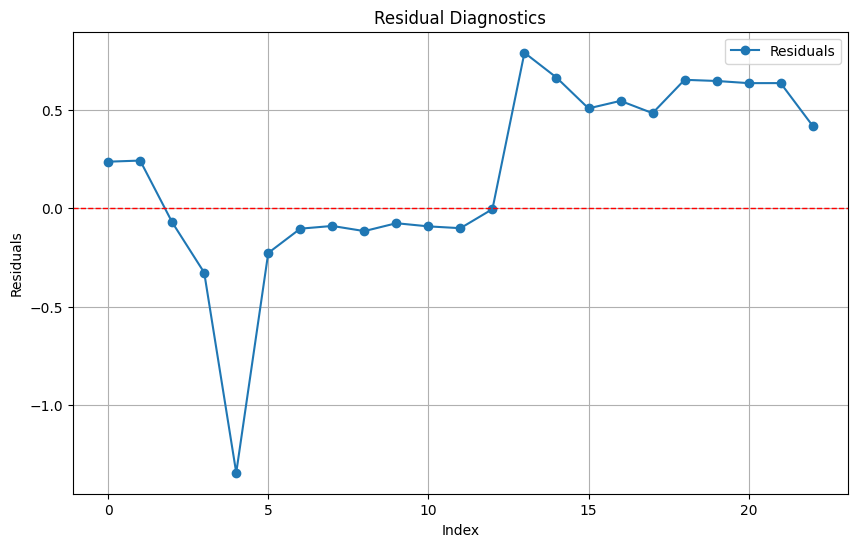

Parameters: {'n_estimators': 50, 'max_depth': 7}, Metrics: MAE=0.3679, MSE=0.2301, RMSE=0.4797, MAPE=60.29%
Residual ADF Statistic: -2.1568736946101543, p-value: 0.22226828831822038


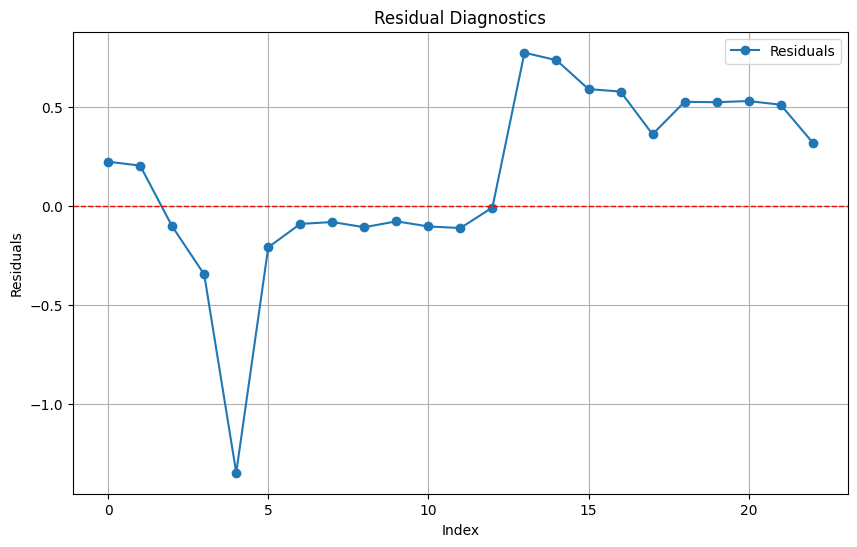

Parameters: {'n_estimators': 100, 'max_depth': 3}, Metrics: MAE=0.3971, MSE=0.2412, RMSE=0.4911, MAPE=74.55%
Residual ADF Statistic: -1.9335857527858047, p-value: 0.31642994471987274


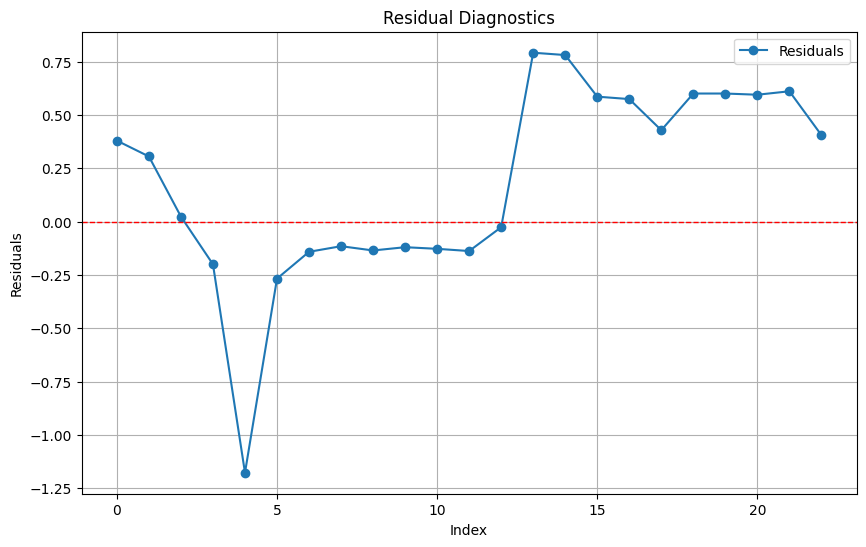

Parameters: {'n_estimators': 100, 'max_depth': 5}, Metrics: MAE=0.3725, MSE=0.2231, RMSE=0.4723, MAPE=73.45%
Residual ADF Statistic: -4.645806628174066, p-value: 0.00010625685523212464


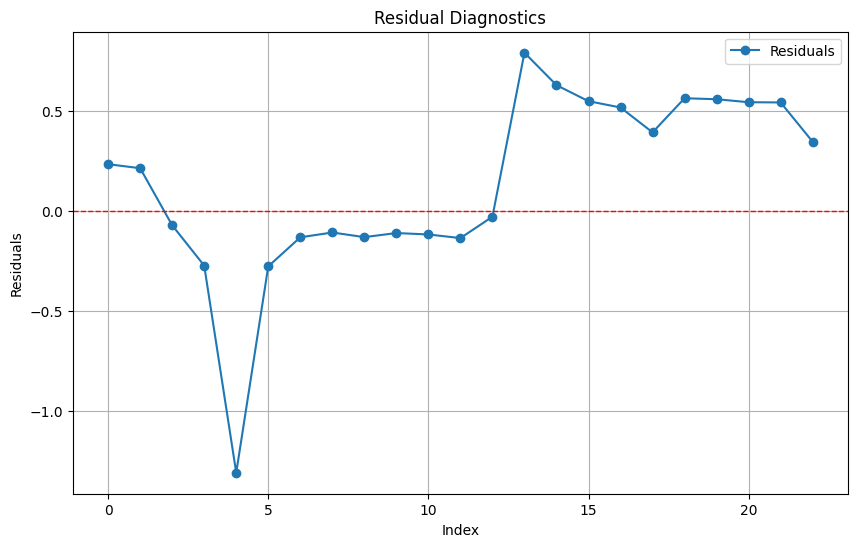

Parameters: {'n_estimators': 100, 'max_depth': 7}, Metrics: MAE=0.3691, MSE=0.2227, RMSE=0.4719, MAPE=71.75%
Residual ADF Statistic: -1.5605862786500688, p-value: 0.5033560697407734


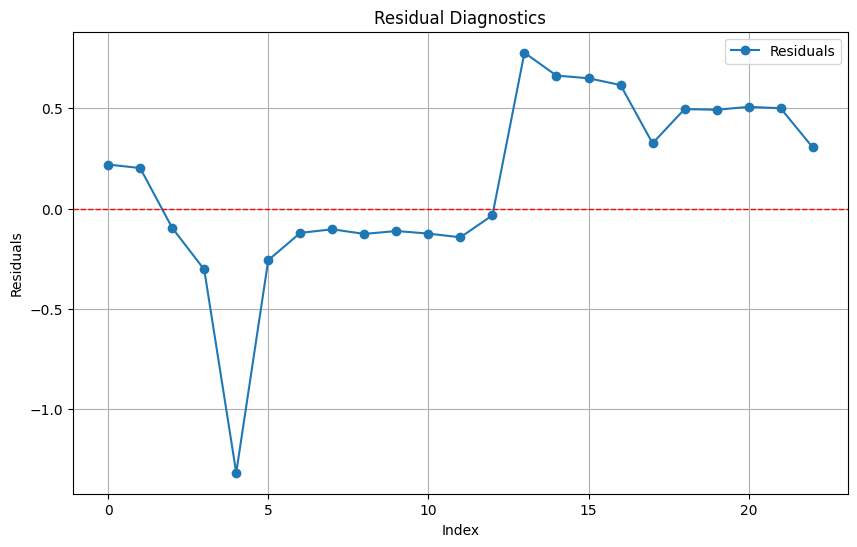

Best model saved as 'best_ets_model.pkl'.
Best Model Parameters: {'n_estimators': 50, 'max_depth': 5}
Best Model Metrics: {'MAE': 0.24950223595885337, 'MSE': 0.09845269852866458, 'RMSE': 0.3137717299704748, 'MAPE': 11.091902631987557}


In [43]:
from itertools import product
from sklearn.ensemble import RandomForestRegressor

def grid_search_rf_with_residuals(splits, param_grid):
    best_model = None
    best_metrics = {}
    best_params = None
    best_mape = float('inf')

    for i, (train, test) in enumerate(splits):
        print(f"Processing Split {i + 1}...")

        X_train, y_train = train[:, :-1], train[:, -1]
        X_test, y_test = test[:, :-1], test[:, -1]

        for params in product(*param_grid.values()):
            param_dict = dict(zip(param_grid.keys(), params))
            rf = RandomForestRegressor(**param_dict, random_state=42)
            rf.fit(X_train, y_train)
            predictions = rf.predict(X_test)

            # Evaluate metrics
            mae, mse, rmse, mape = evaluate_metrics(y_test, predictions)
            print(f"Parameters: {param_dict}, Metrics: MAE={mae:.4f}, MSE={mse:.4f}, RMSE={rmse:.4f}, MAPE={mape:.2f}%")

            # Residual diagnostics
            residuals = y_test - predictions
            adf_test = adfuller(residuals)
            print(f"Residual ADF Statistic: {adf_test[0]}, p-value: {adf_test[1]}")

            # Plot residuals
            plt.figure(figsize=(10, 6))
            plt.plot(residuals, marker='o', linestyle='-', label='Residuals')
            plt.axhline(0, color='red', linestyle='--', linewidth=1)
            plt.title("Residual Diagnostics")
            plt.xlabel("Index")
            plt.ylabel("Residuals")
            plt.legend()
            plt.grid(True)
            plt.show()

            # Update the best model
            if mape < best_mape:
                best_mape = mape
                best_model = rf
                best_metrics = {'MAE': mae, 'MSE': mse, 'RMSE': rmse, 'MAPE': mape}
                best_params = param_dict

    return best_model, best_params, best_metrics

# Define parameter grid
param_grid = {
    'n_estimators': [50, 100],
    'max_depth': [3, 5, 7]
}

# Perform grid search with residual diagnostics
best_model, best_params, best_metrics = grid_search_rf_with_residuals(splits, param_grid)

# Save the best model
if best_model:
    with open('best_rf_model.pkl', 'wb') as file:
        pickle.dump(best_model, file)
    print("Best model saved as 'best_ets_model.pkl'.")
# Output results
print("Best Model Parameters:", best_params)
print("Best Model Metrics:", best_metrics)


**We notice that MAE, MSE and RMSE have reduced but MAPE is gone up slightly when compared to the Holt-Winter model.**

## b. Using XGBoost for time series forecasting

In [45]:
!pip install xgboost


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.9/153.9 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.0/199.0 MB 5.4 MB/s eta 0:00:00


In [46]:
import xgboost
print(xgboost.__version__)


2.1.3


Processing Split 1...
Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=2.9120, MSE=9.2495, RMSE=3.0413, MAPE=54.03%
Residual ADF Statistic: -4.767673097404722, p-value: 6.268284496507971e-05


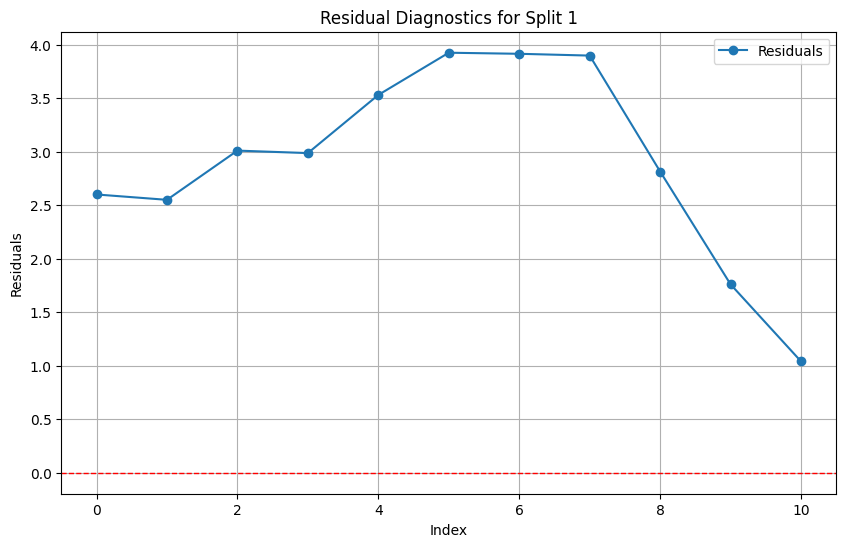

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=2.9302, MSE=9.2574, RMSE=3.0426, MAPE=54.72%
Residual ADF Statistic: -3.9346035283239273, p-value: 0.0017944396720901254


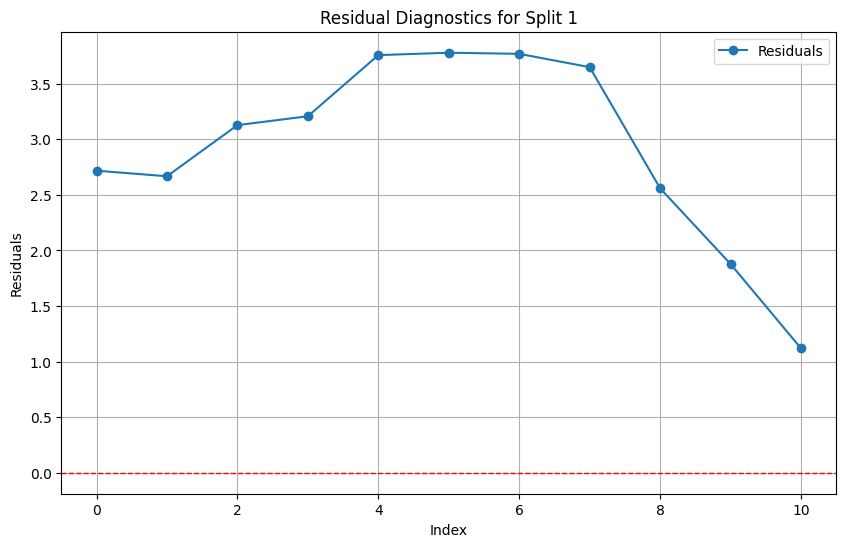

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=2.3992, MSE=6.3475, RMSE=2.5194, MAPE=44.35%
Residual ADF Statistic: -3.5397055387194865, p-value: 0.007024040167277406


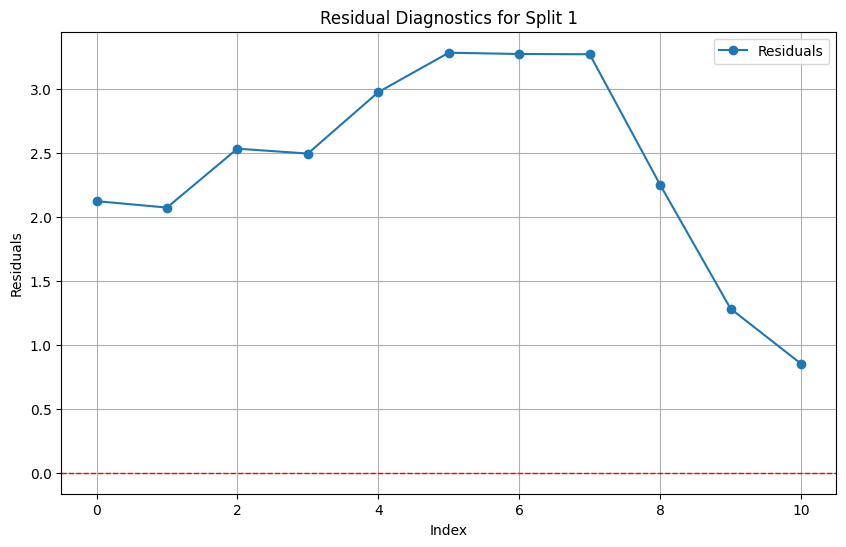

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=2.4284, MSE=6.4070, RMSE=2.5312, MAPE=45.33%
Residual ADF Statistic: -2.205036140818994, p-value: 0.20442270856646205


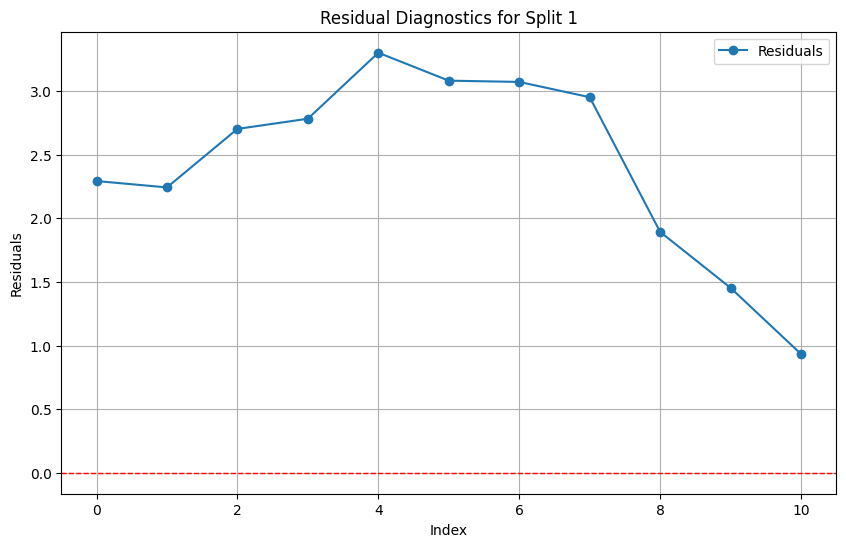

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=1.8854, MSE=3.9777, RMSE=1.9944, MAPE=34.72%
Residual ADF Statistic: -2.819834601317577, p-value: 0.055495916042412094


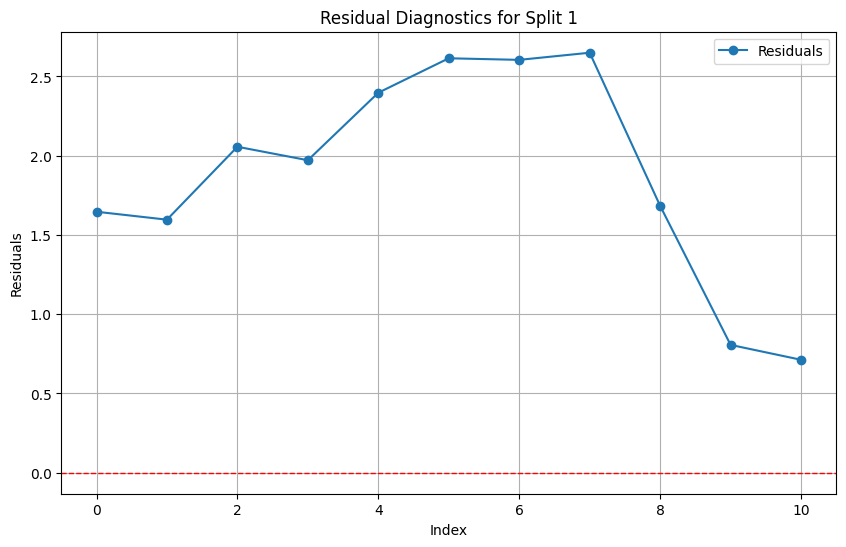

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=1.8999, MSE=3.9927, RMSE=1.9982, MAPE=35.28%
Residual ADF Statistic: -1.5458299383754044, p-value: 0.5107305188276725


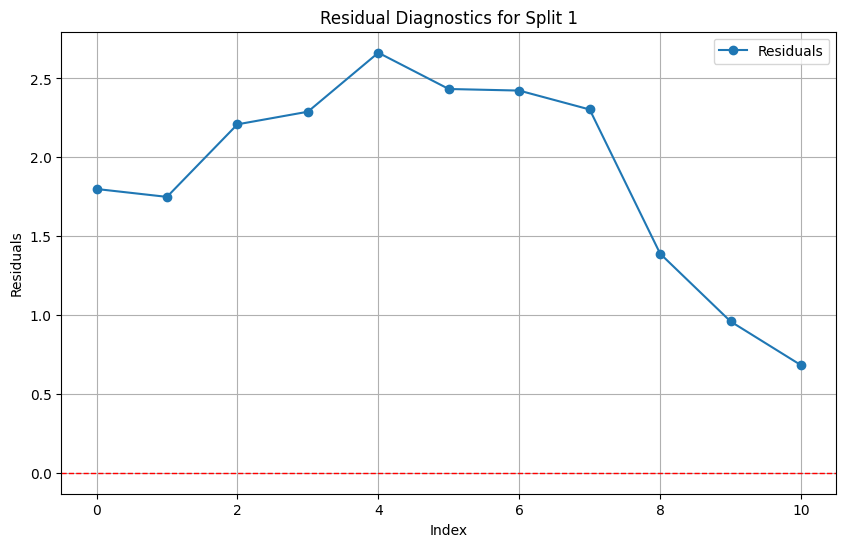

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=2.9635, MSE=9.5538, RMSE=3.0909, MAPE=55.04%
Residual ADF Statistic: -5.038807293995818, p-value: 1.85855034293665e-05


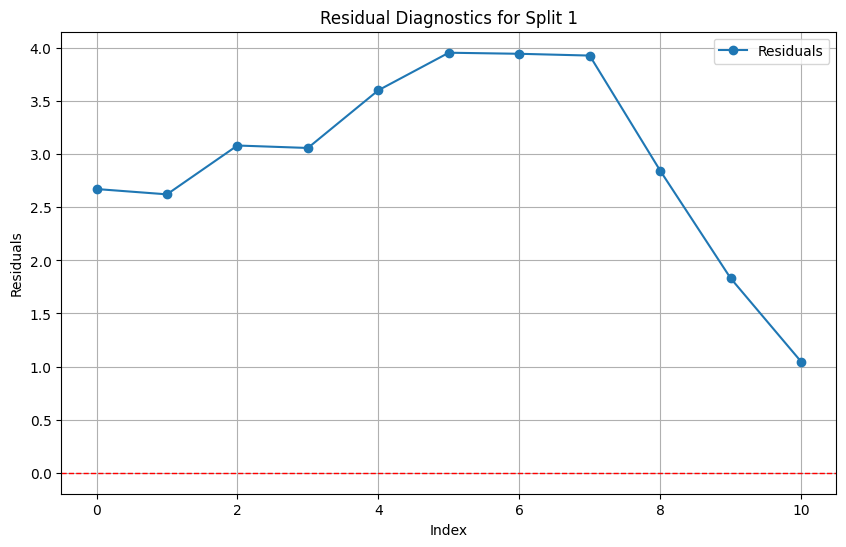

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=3.0194, MSE=9.8308, RMSE=3.1354, MAPE=56.35%
Residual ADF Statistic: -4.106786167176298, p-value: 0.0009438093987751377


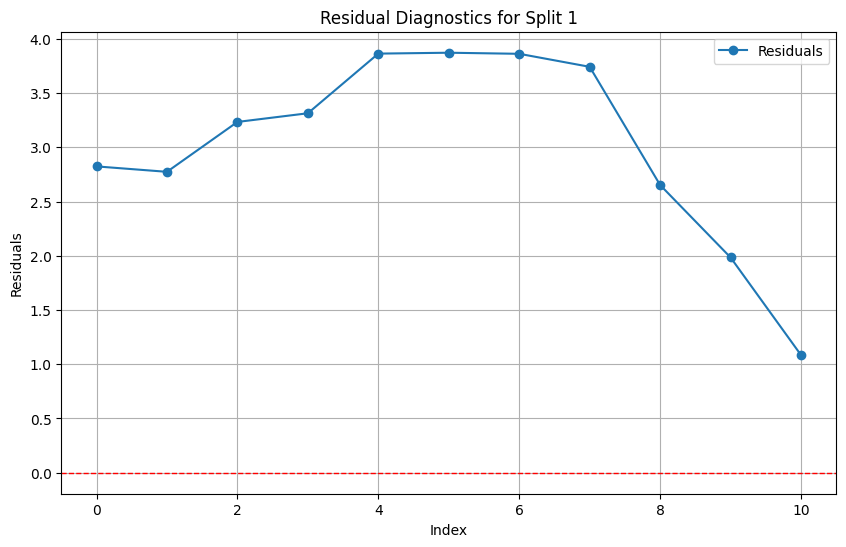

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=2.5037, MSE=6.8605, RMSE=2.6193, MAPE=46.39%
Residual ADF Statistic: -3.7762450071024363, p-value: 0.0031599281191090076


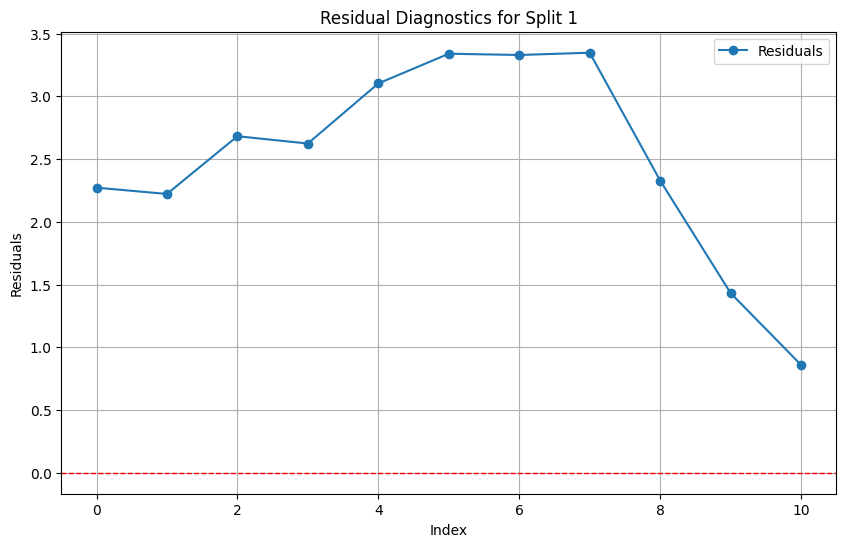

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=2.4585, MSE=6.5904, RMSE=2.5672, MAPE=45.78%
Residual ADF Statistic: -2.8487093962870054, p-value: 0.05164576800458819


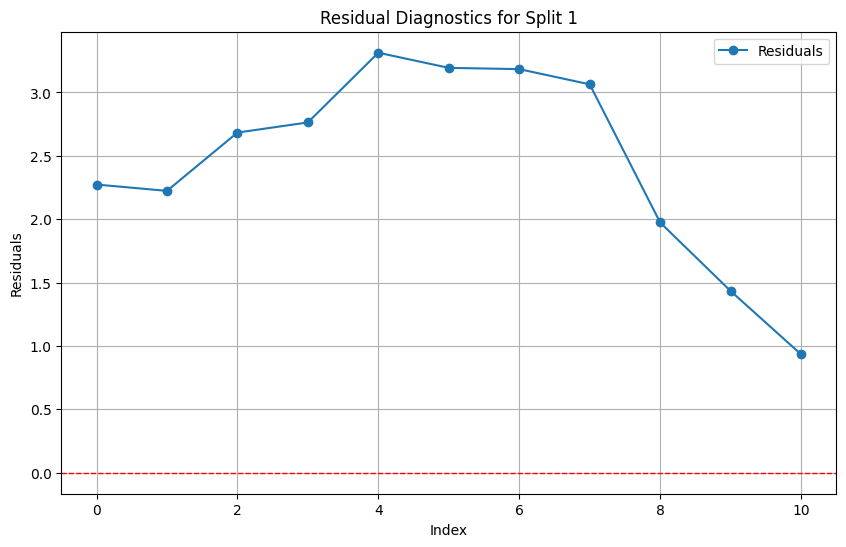

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=1.9508, MSE=4.2226, RMSE=2.0549, MAPE=36.02%
Residual ADF Statistic: -2.84312572483458, p-value: 0.05237271661665016


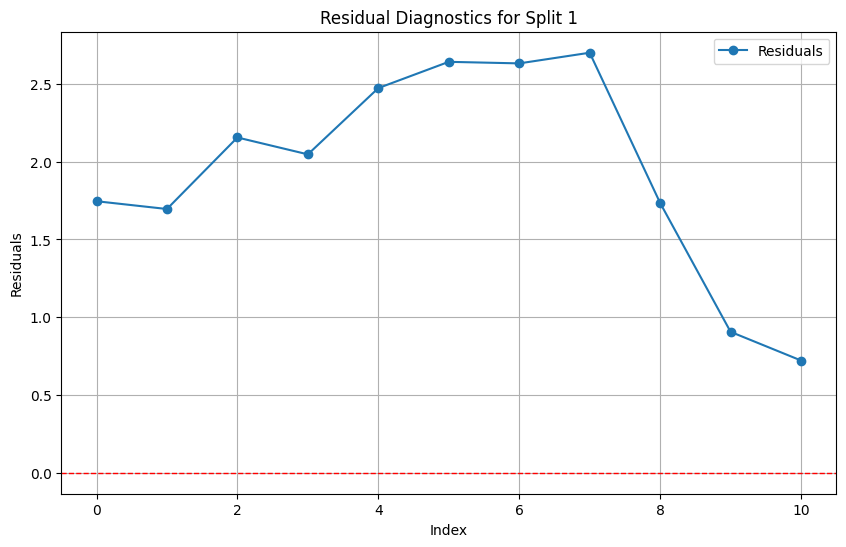

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=1.8582, MSE=3.8208, RMSE=1.9547, MAPE=34.51%
Residual ADF Statistic: -1.9905434377869948, p-value: 0.2907348032309649


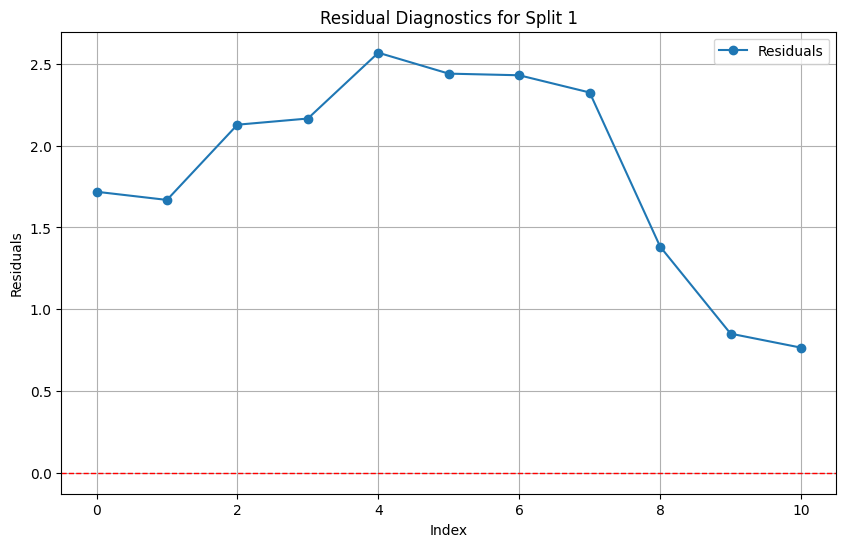

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=2.9635, MSE=9.5539, RMSE=3.0909, MAPE=55.04%
Residual ADF Statistic: -5.0387599366219655, p-value: 1.858953993008067e-05


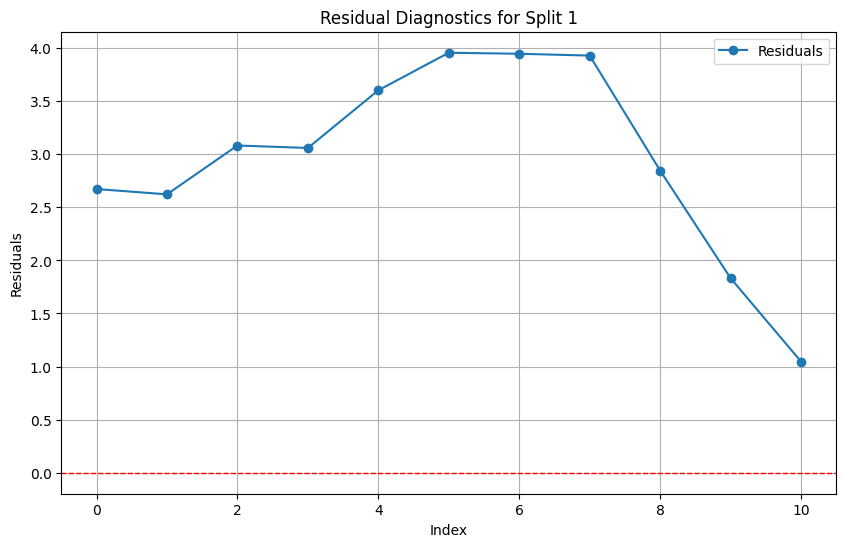

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=3.0194, MSE=9.8308, RMSE=3.1354, MAPE=56.35%
Residual ADF Statistic: -4.106786167176298, p-value: 0.0009438093987751377


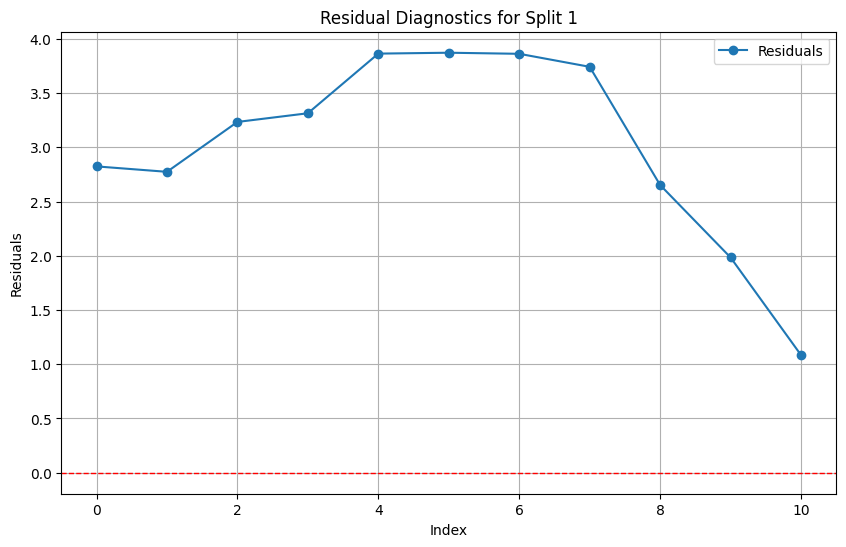

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=2.4956, MSE=6.8216, RMSE=2.6118, MAPE=46.23%
Residual ADF Statistic: -3.773244300875803, p-value: 0.003193234726697272


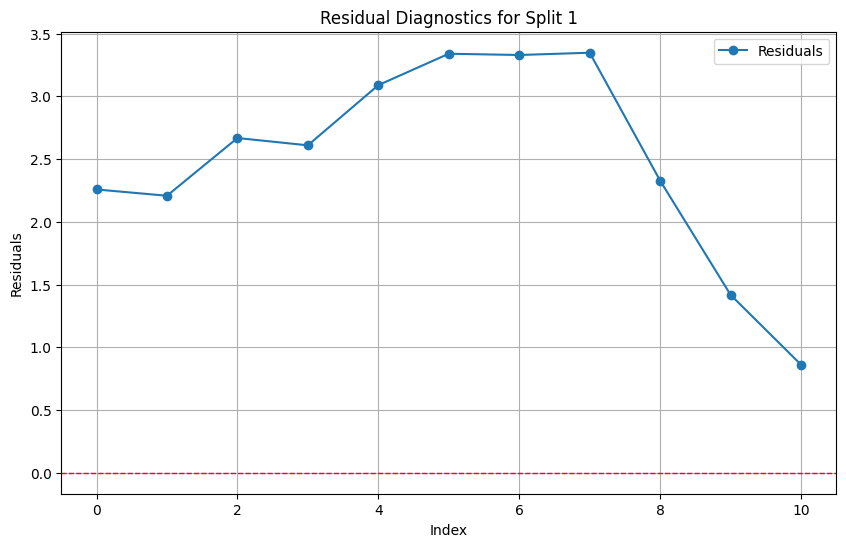

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=2.5026, MSE=6.8138, RMSE=2.6103, MAPE=46.66%
Residual ADF Statistic: -2.4737150805216133, p-value: 0.12200140660626724


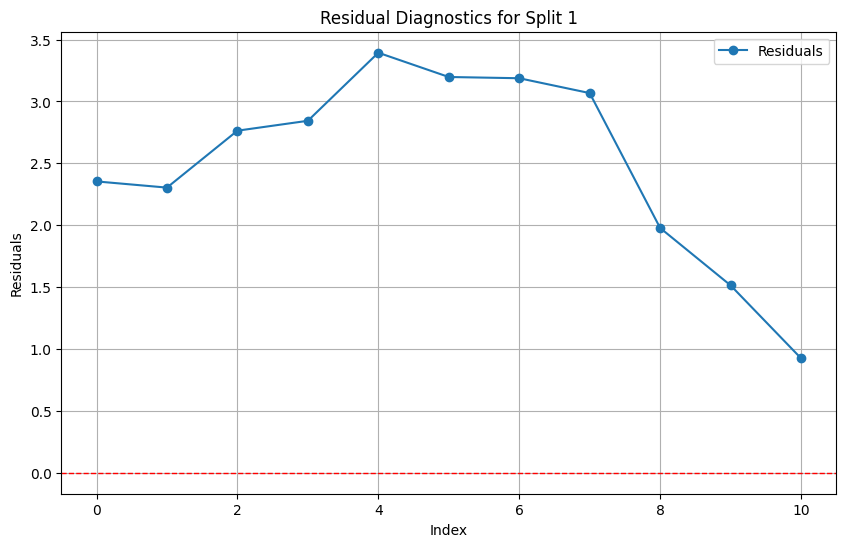

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=1.9428, MSE=4.1921, RMSE=2.0475, MAPE=35.86%
Residual ADF Statistic: -2.884240401183851, p-value: 0.047211556463676425


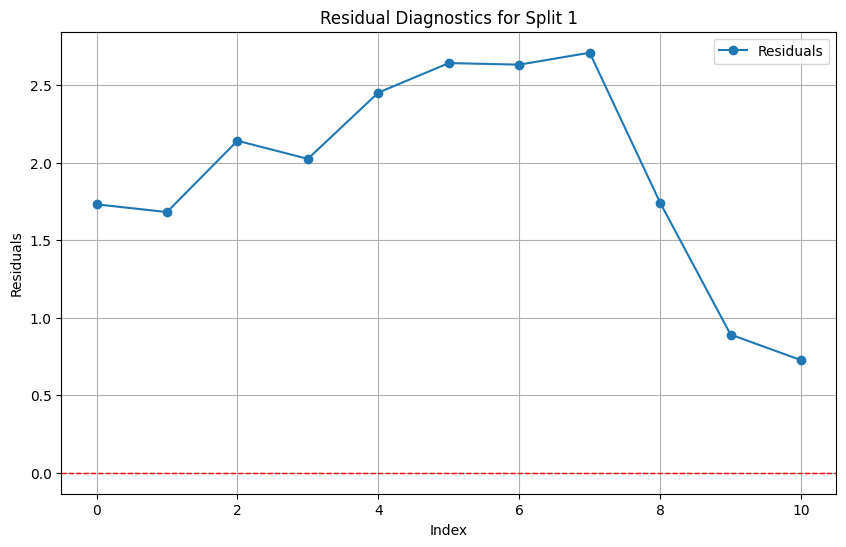

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=1.9013, MSE=3.9763, RMSE=1.9941, MAPE=35.44%
Residual ADF Statistic: -1.751883372957967, p-value: 0.4045981034567108


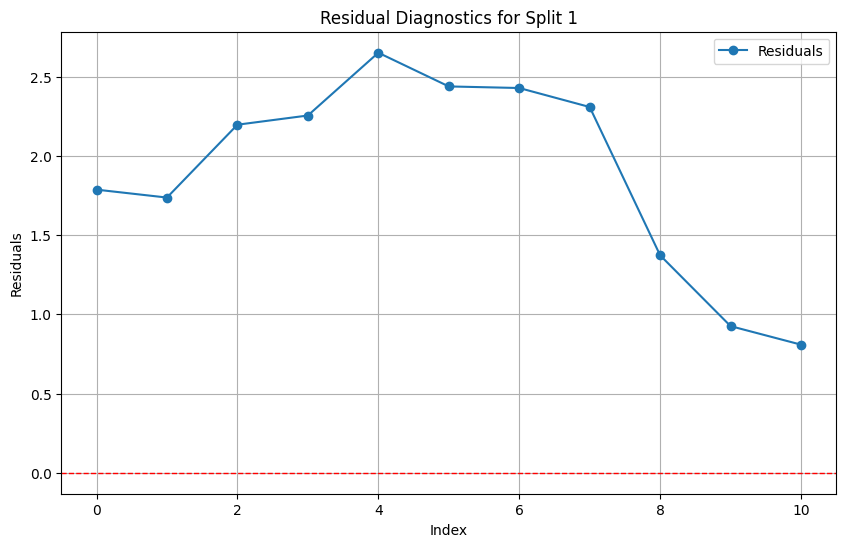

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=1.6851, MSE=3.1724, RMSE=1.7811, MAPE=31.30%
Residual ADF Statistic: -1.524668441362245, p-value: 0.521274843836108


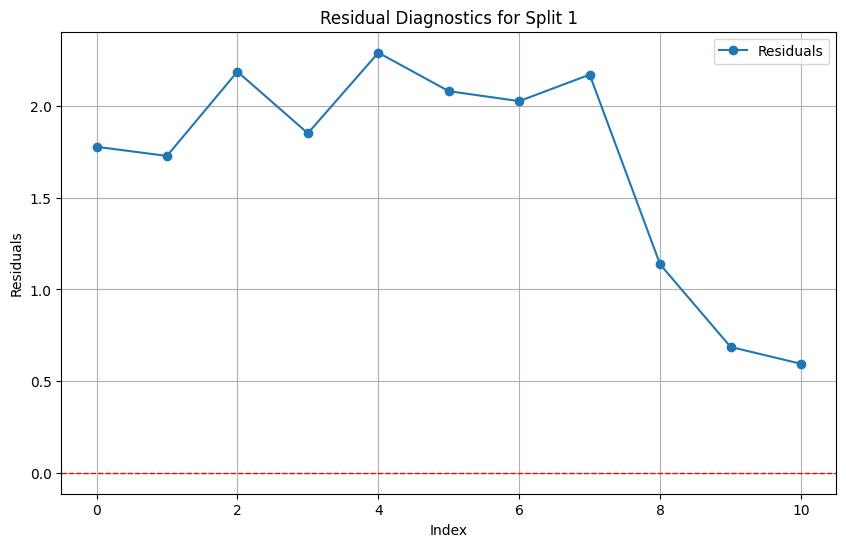

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=1.5933, MSE=2.8313, RMSE=1.6827, MAPE=29.62%
Residual ADF Statistic: -0.17255458435922405, p-value: 0.9417149459430794


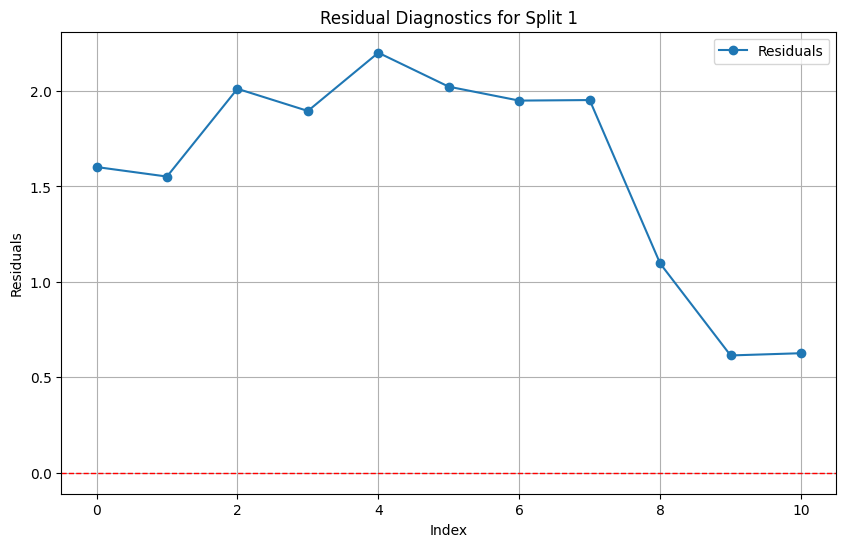

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=1.7438, MSE=3.3797, RMSE=1.8384, MAPE=32.63%
Residual ADF Statistic: -1.1979462418224582, p-value: 0.6744785622605346


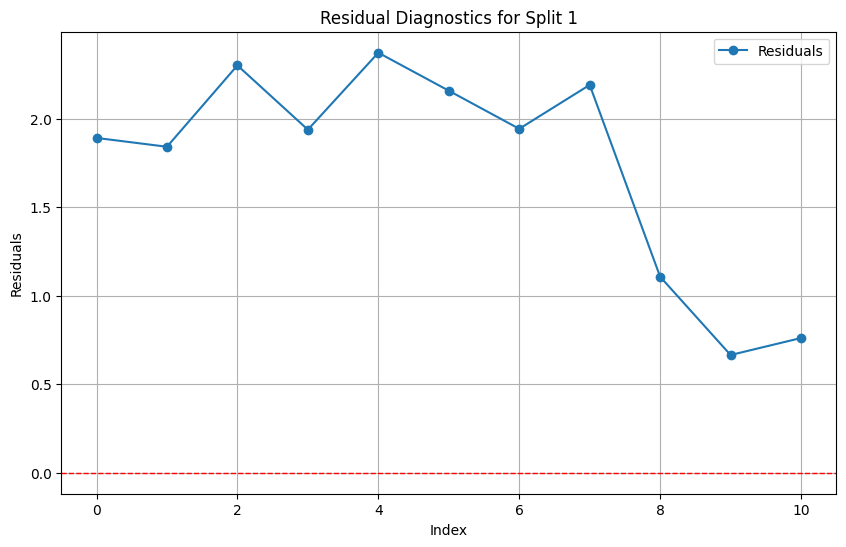

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=1.6380, MSE=2.9935, RMSE=1.7302, MAPE=30.50%
Residual ADF Statistic: -0.29310518991248424, p-value: 0.9264751830184891


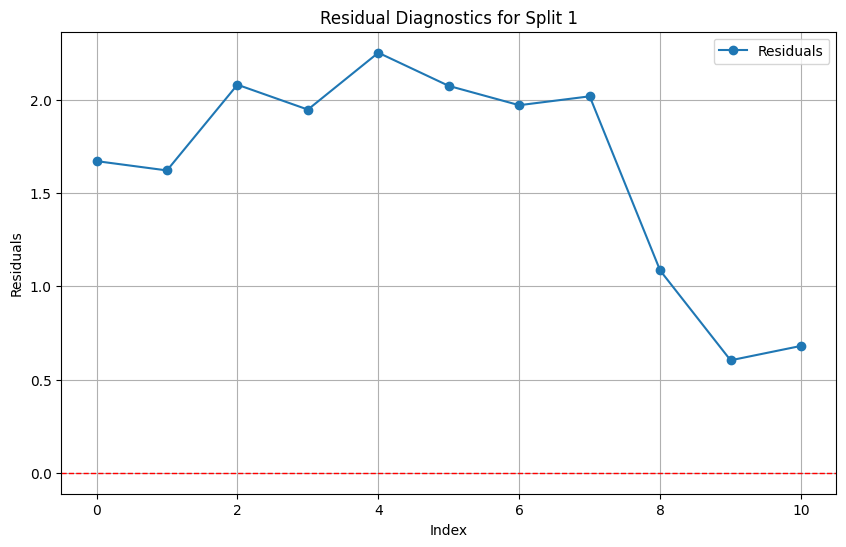

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=1.7360, MSE=3.3492, RMSE=1.8301, MAPE=32.49%
Residual ADF Statistic: -1.0868886856200526, p-value: 0.7202721237182784


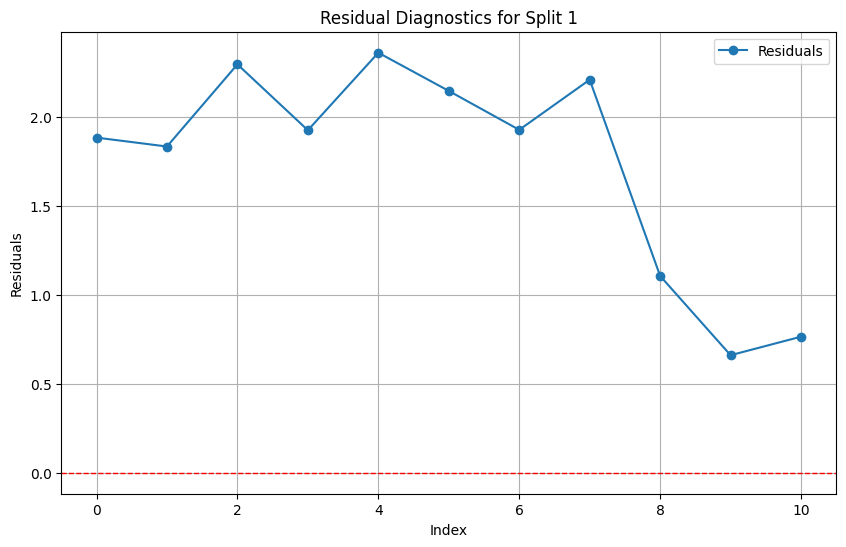

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=1.6274, MSE=2.9497, RMSE=1.7175, MAPE=30.31%
Residual ADF Statistic: -0.33688066151109275, p-value: 0.9201160738102132


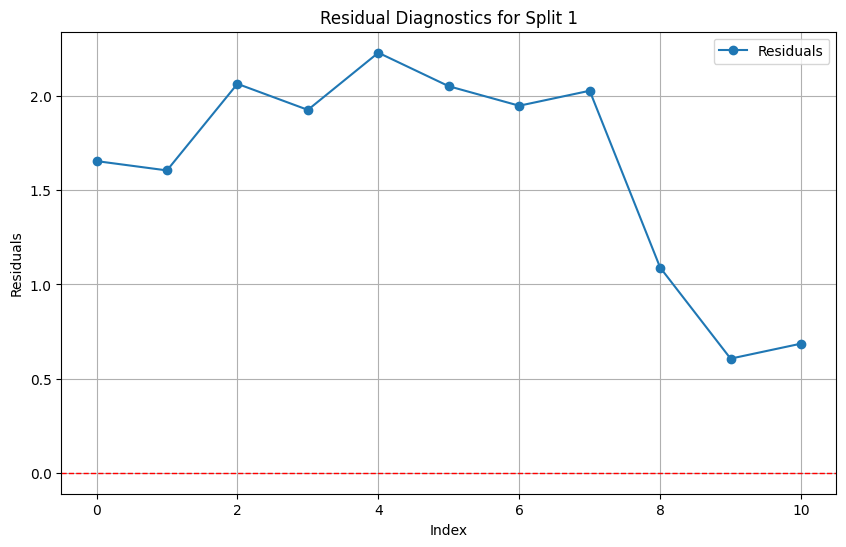

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=1.7151, MSE=3.2714, RMSE=1.8087, MAPE=31.93%
Residual ADF Statistic: -1.082972422595831, p-value: 0.7218143208056902


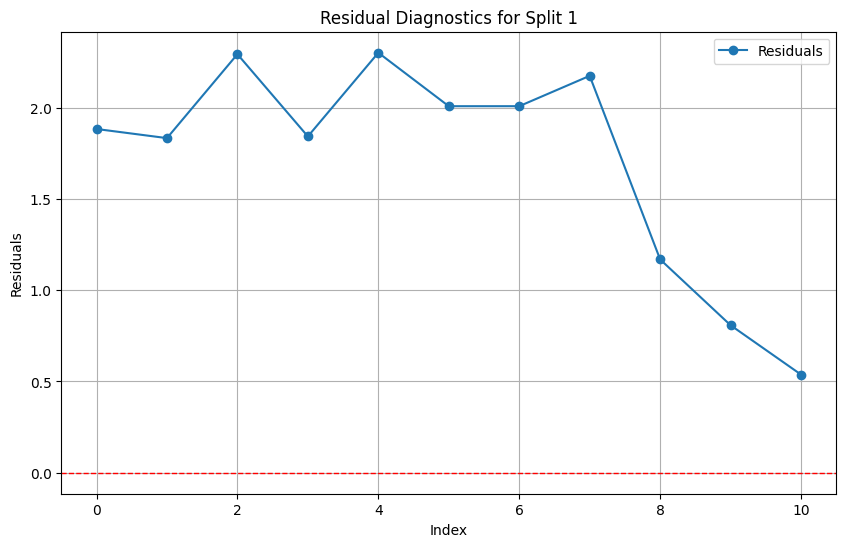

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=1.6592, MSE=3.0448, RMSE=1.7449, MAPE=31.10%
Residual ADF Statistic: -0.3109745007231323, p-value: 0.9239355687301535


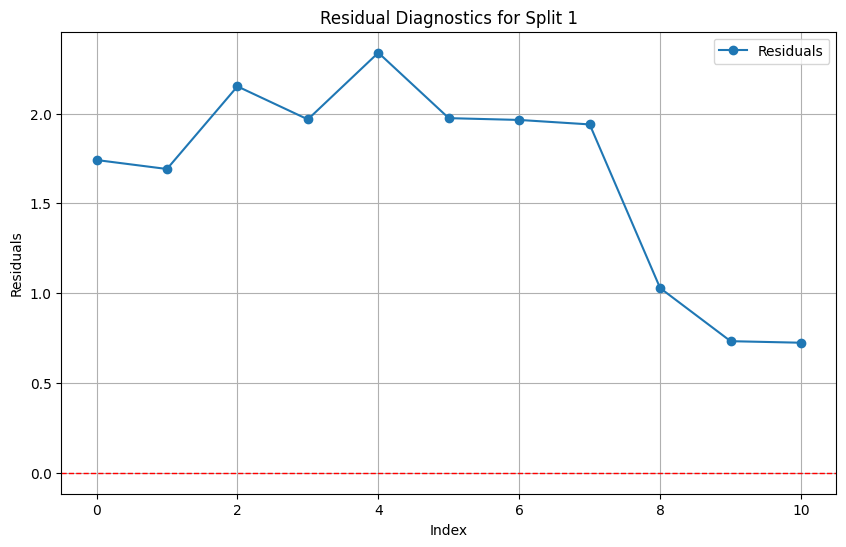

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=1.8057, MSE=3.6301, RMSE=1.9053, MAPE=33.83%
Residual ADF Statistic: -0.9109302237733521, p-value: 0.7843516301561646


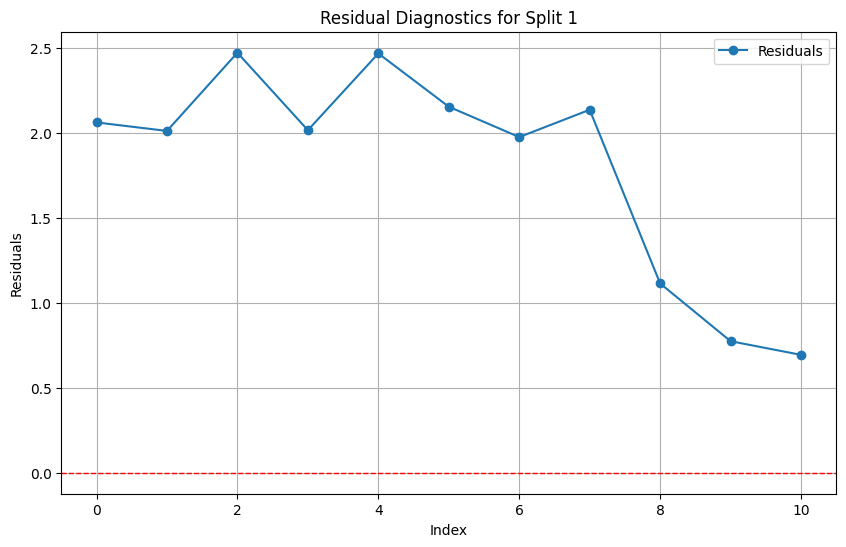

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=1.6691, MSE=3.0851, RMSE=1.7564, MAPE=31.30%
Residual ADF Statistic: -0.33729771532521186, p-value: 0.920053228897302


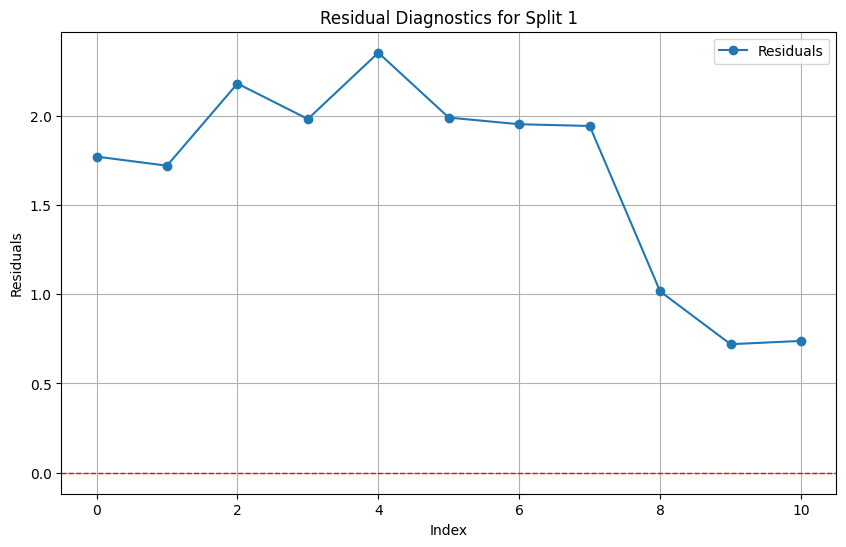

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=1.8175, MSE=3.6776, RMSE=1.9177, MAPE=34.08%
Residual ADF Statistic: -0.9640167080440967, p-value: 0.7661611702580153


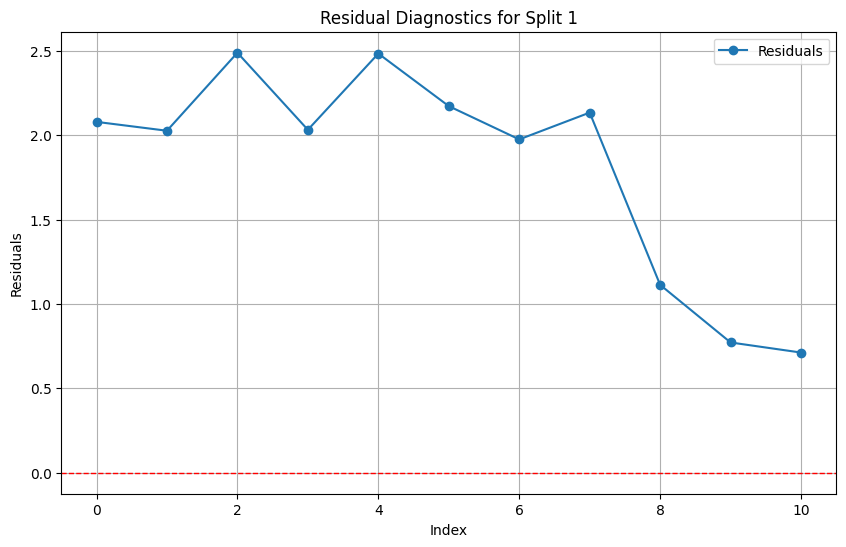

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=1.6725, MSE=3.0987, RMSE=1.7603, MAPE=31.37%
Residual ADF Statistic: -0.34039878107419447, p-value: 0.9195845727992554


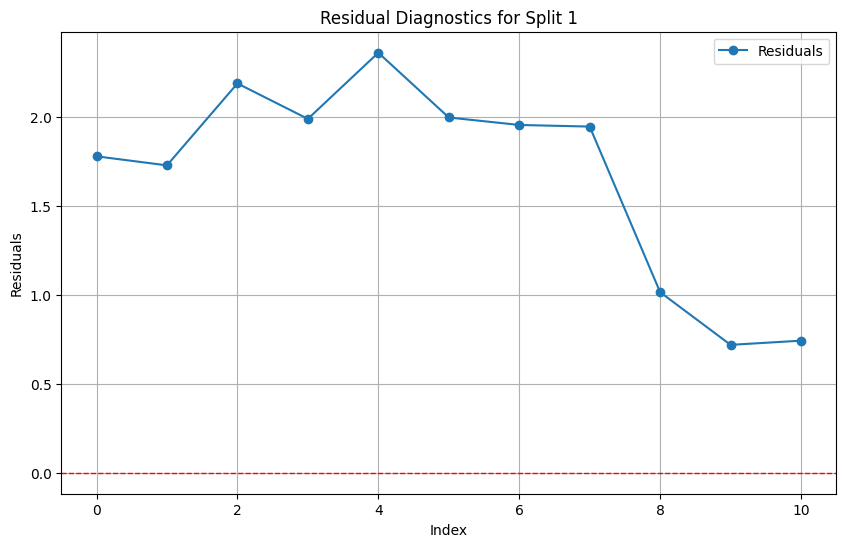

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=1.6950, MSE=3.1977, RMSE=1.7882, MAPE=31.61%
Residual ADF Statistic: -1.1216602118572494, p-value: 0.7063572273575984


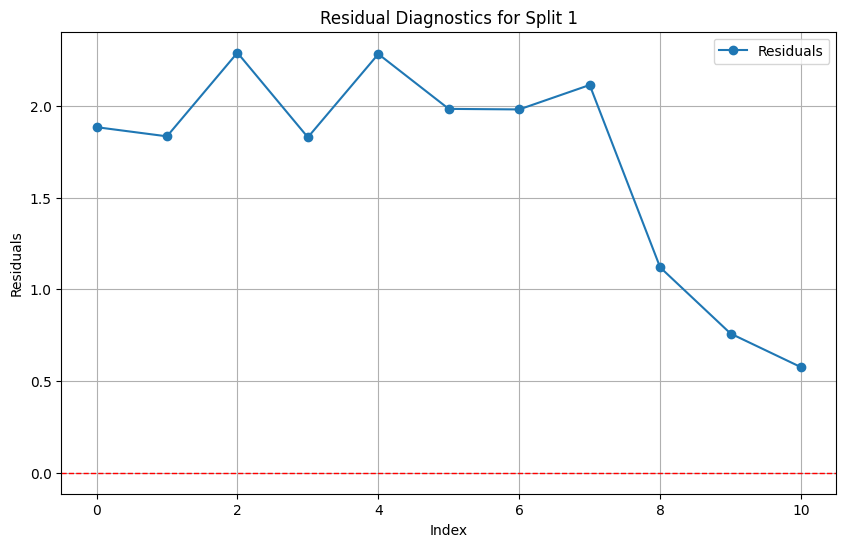

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=1.7331, MSE=3.3317, RMSE=1.8253, MAPE=32.50%
Residual ADF Statistic: -0.2949510668811752, p-value: 0.9262163745232633


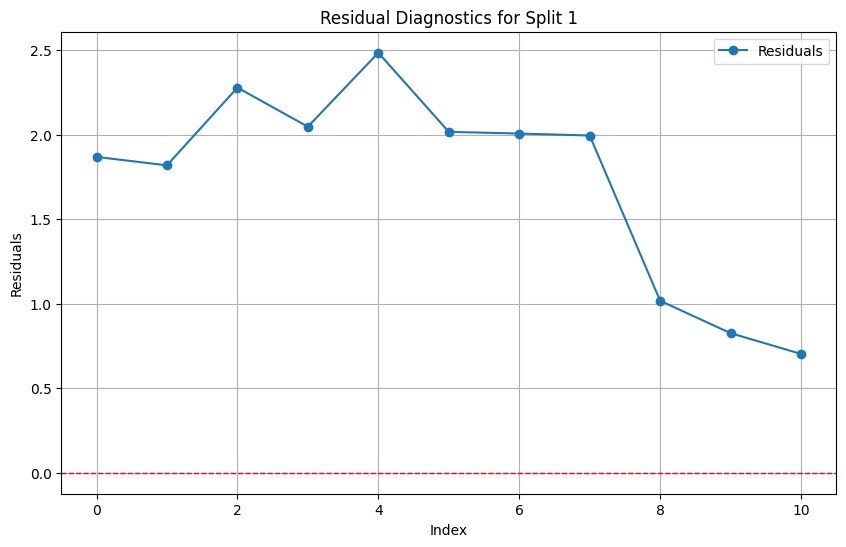

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=1.7842, MSE=3.5480, RMSE=1.8836, MAPE=33.51%
Residual ADF Statistic: -1.0025645895472046, p-value: 0.7523277771671624


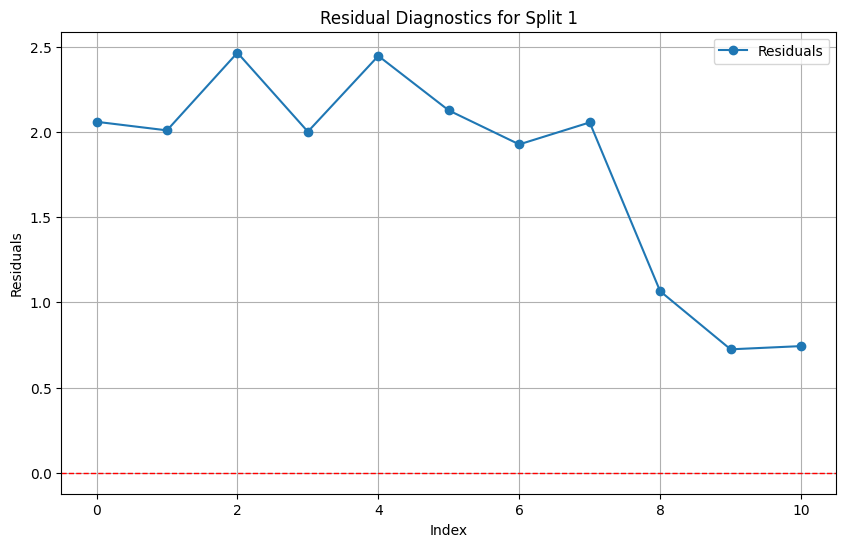

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=1.7324, MSE=3.3297, RMSE=1.8247, MAPE=32.52%
Residual ADF Statistic: -0.3208463296947488, p-value: 0.9224995367839951


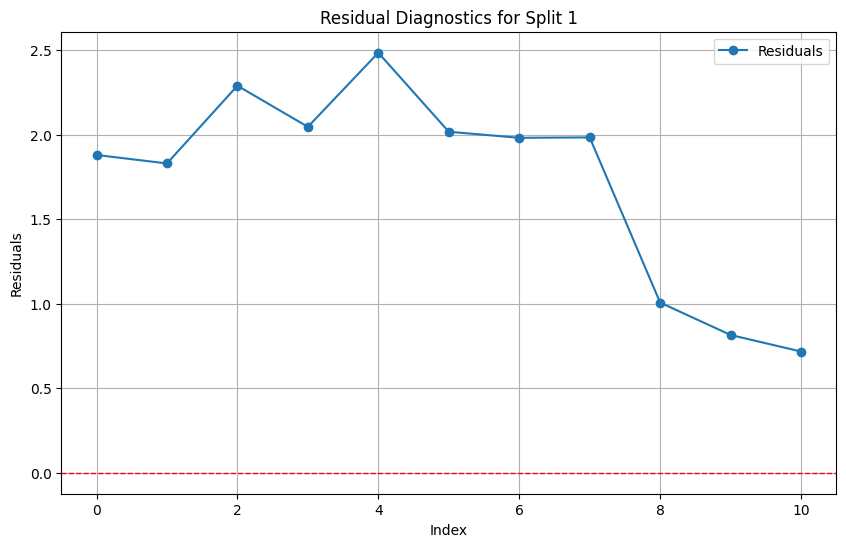

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=1.8016, MSE=3.6187, RMSE=1.9023, MAPE=33.87%
Residual ADF Statistic: -1.0739035187665789, p-value: 0.7253659092105901


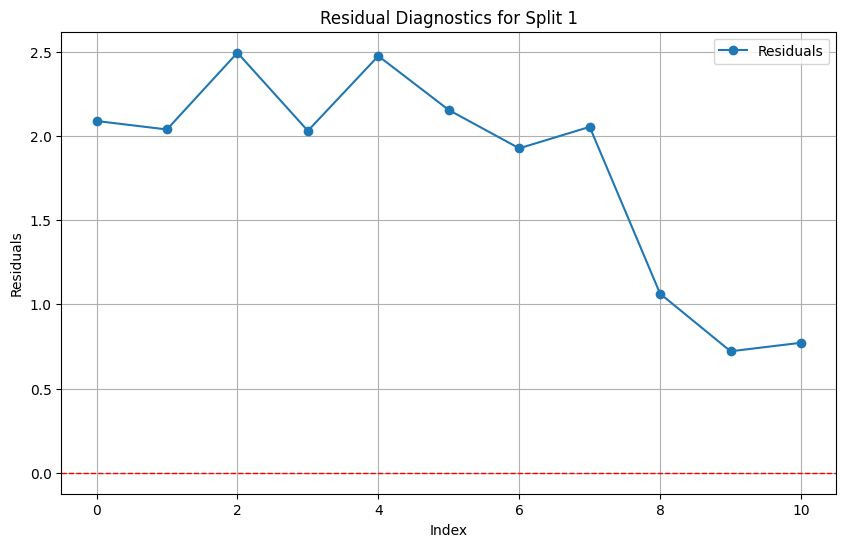

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=1.7369, MSE=3.3471, RMSE=1.8295, MAPE=32.61%
Residual ADF Statistic: -0.3232480409670448, p-value: 0.9221465667732006


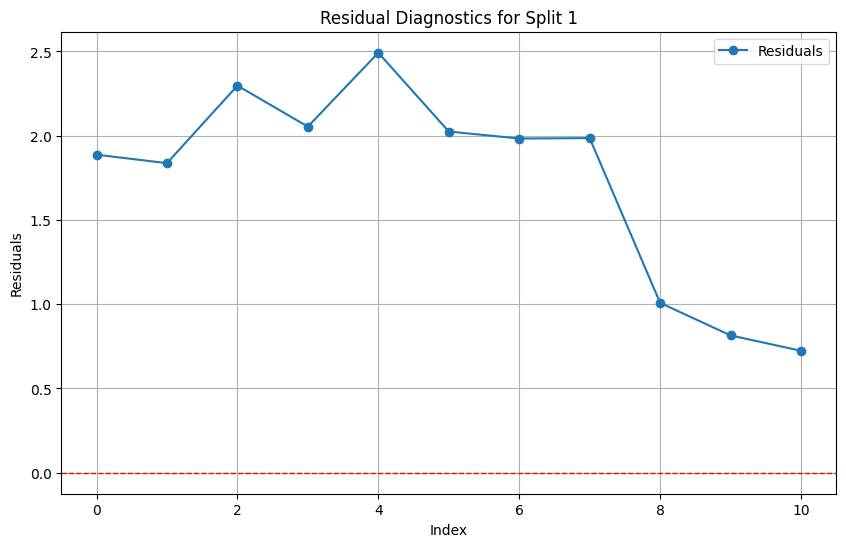

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=1.8082, MSE=3.5879, RMSE=1.8942, MAPE=34.09%
Residual ADF Statistic: -3.1811014352343387, p-value: 0.02110499617105074


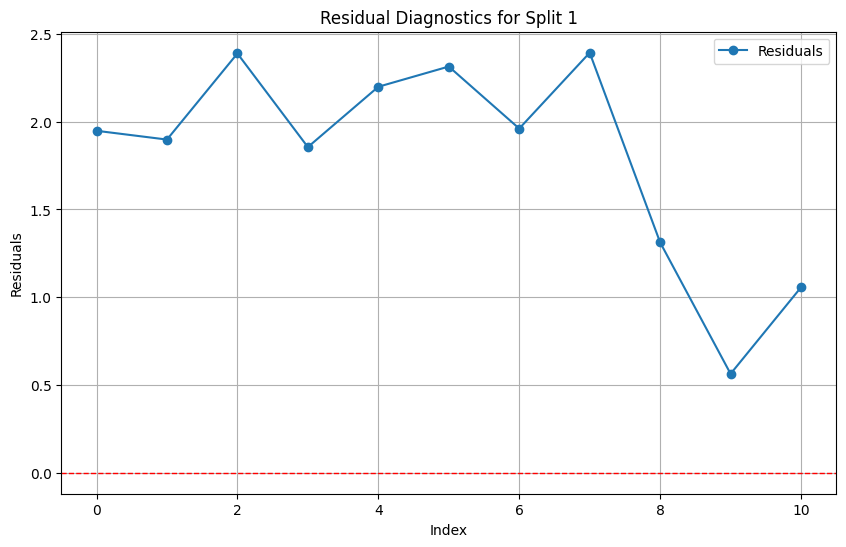

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=1.5315, MSE=2.6037, RMSE=1.6136, MAPE=28.66%
Residual ADF Statistic: -0.5360417536744976, p-value: 0.8847892373794852


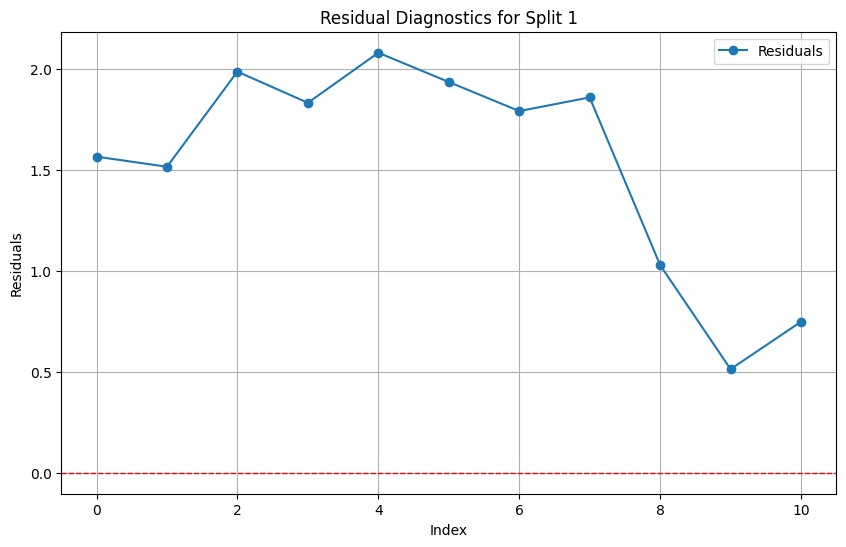

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=1.8003, MSE=3.5524, RMSE=1.8848, MAPE=33.96%
Residual ADF Statistic: -2.9584994681181755, p-value: 0.03895601111899215


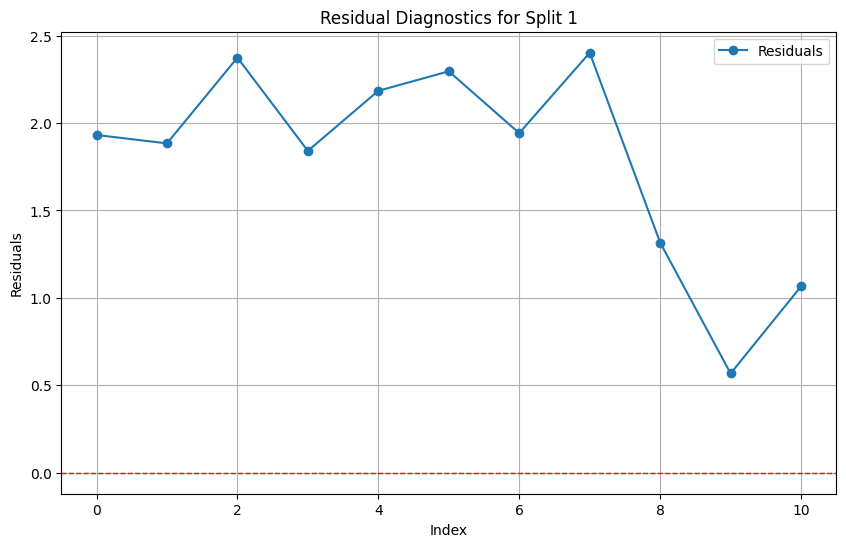

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=1.5393, MSE=2.6326, RMSE=1.6225, MAPE=28.79%
Residual ADF Statistic: -0.5330890075401282, p-value: 0.8853960635654956


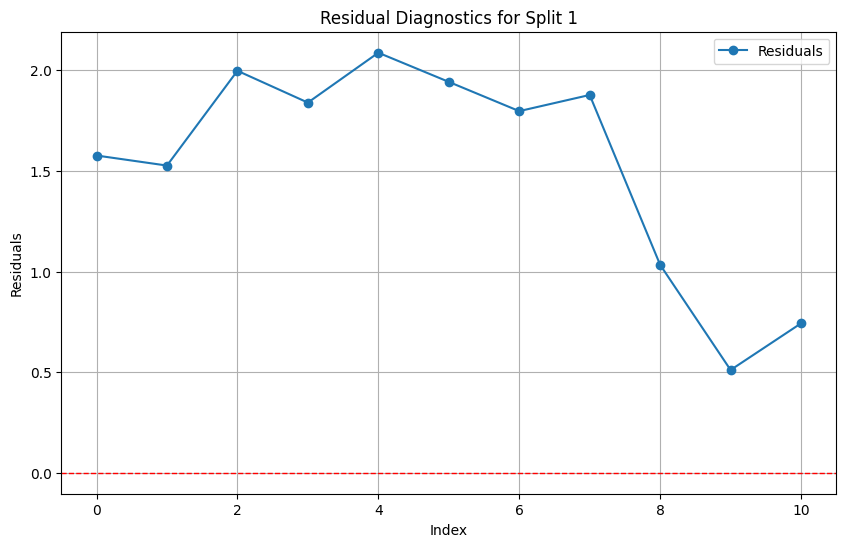

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=1.7974, MSE=3.5419, RMSE=1.8820, MAPE=33.90%
Residual ADF Statistic: -2.8845138519445763, p-value: 0.04717868972758284


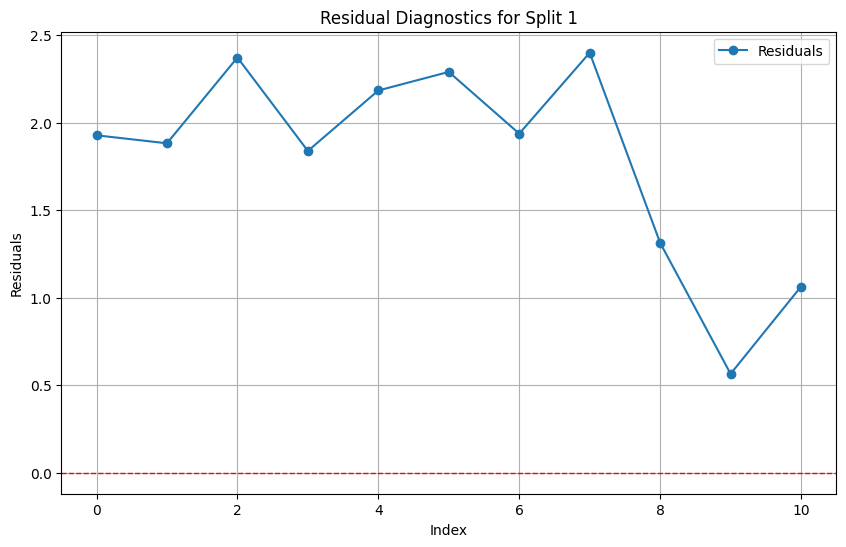

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=1.5408, MSE=2.6383, RMSE=1.6243, MAPE=28.81%
Residual ADF Statistic: -0.5328555024016087, p-value: 0.8854439385867154


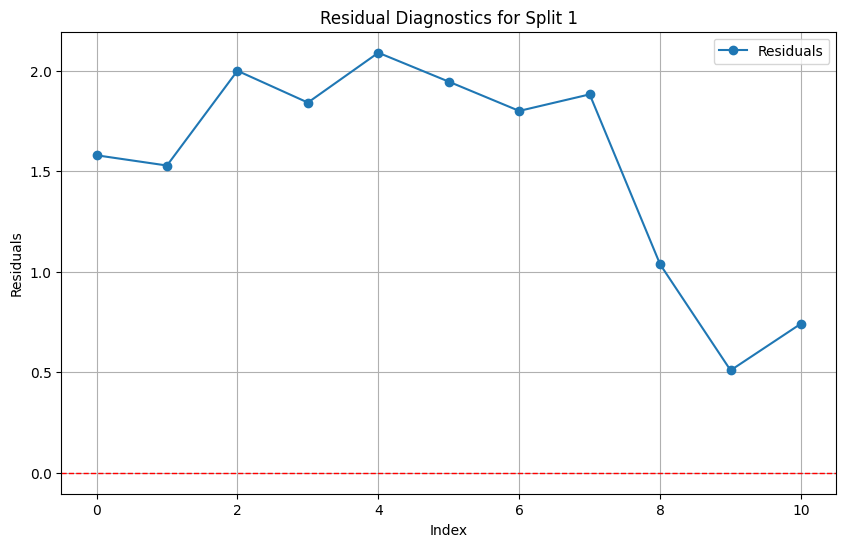

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=1.8068, MSE=3.6183, RMSE=1.9022, MAPE=33.96%
Residual ADF Statistic: -3.9181110247983373, p-value: 0.0019055299374002176


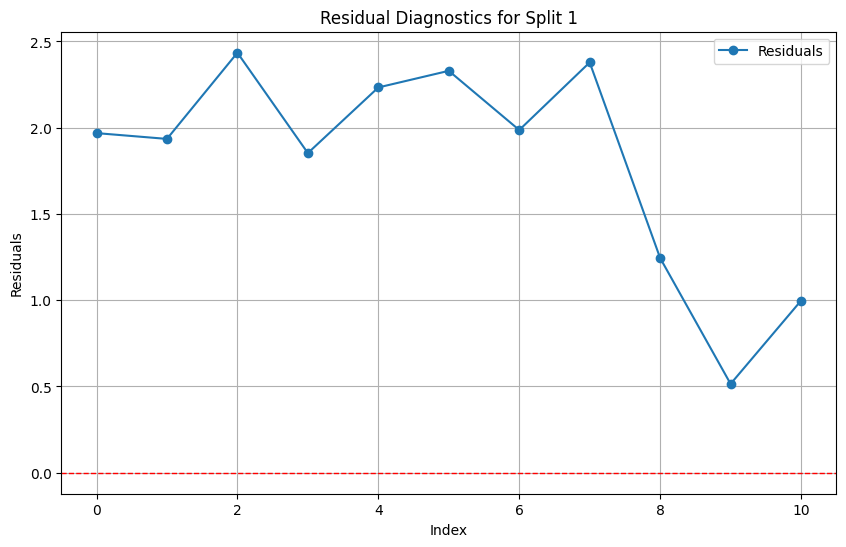

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=1.7637, MSE=3.4619, RMSE=1.8606, MAPE=33.00%
Residual ADF Statistic: -1.3193475037541753, p-value: 0.6202749834738699


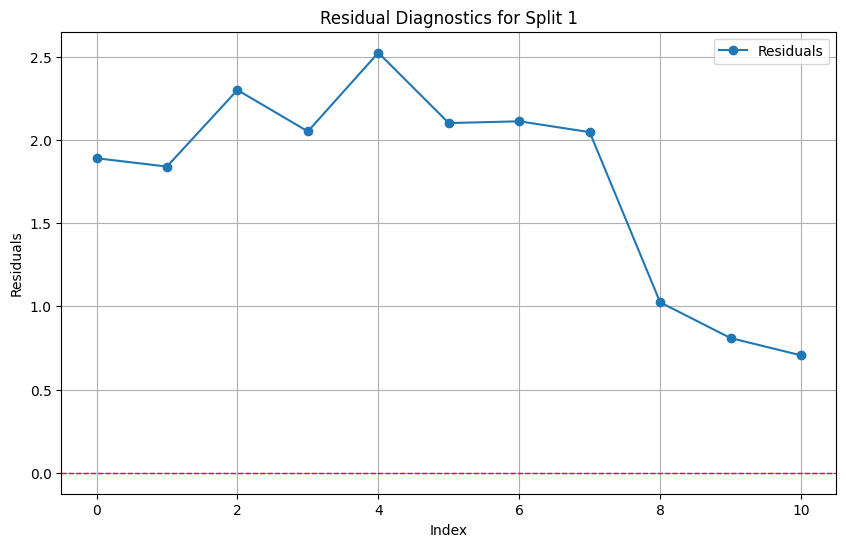

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=1.8110, MSE=3.6392, RMSE=1.9077, MAPE=34.04%
Residual ADF Statistic: -3.805847158695217, p-value: 0.002848054279952145


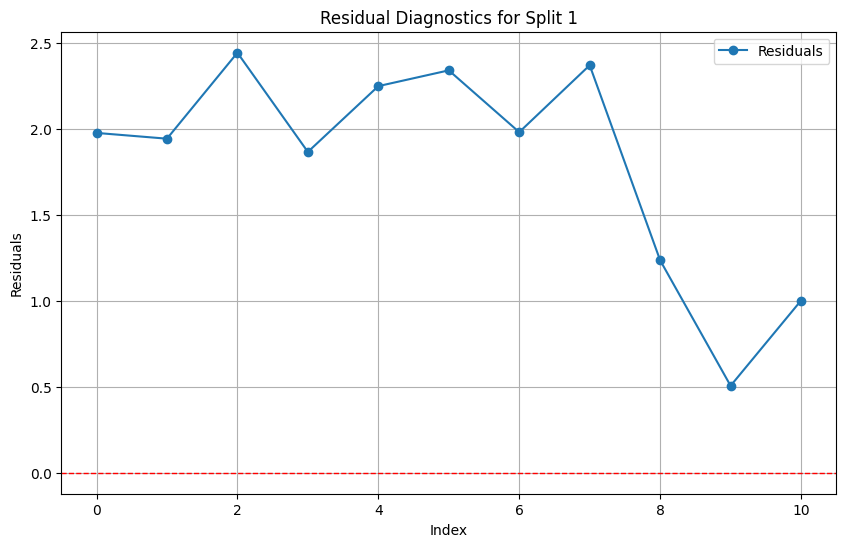

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=1.7647, MSE=3.4655, RMSE=1.8616, MAPE=33.02%
Residual ADF Statistic: -1.3135463197758102, p-value: 0.6229522939300889


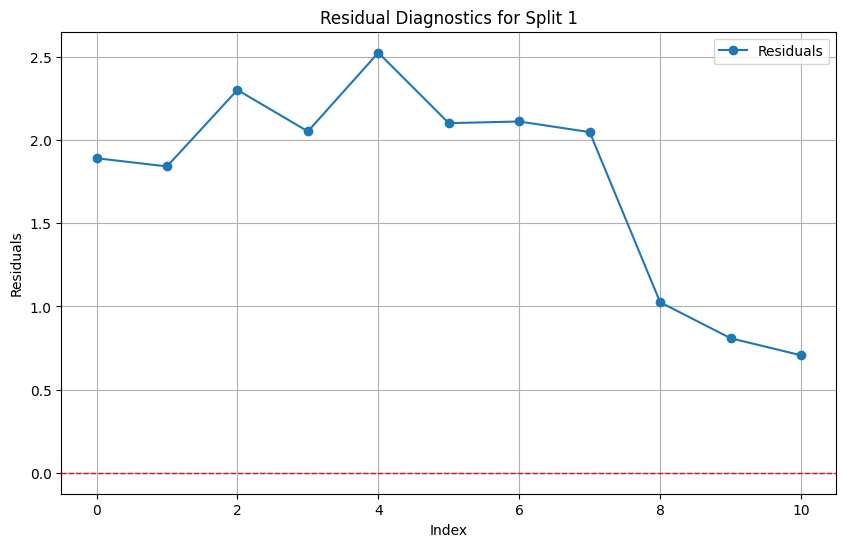

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=1.8109, MSE=3.6388, RMSE=1.9076, MAPE=34.04%
Residual ADF Statistic: -3.8029629360703083, p-value: 0.002877145344432701


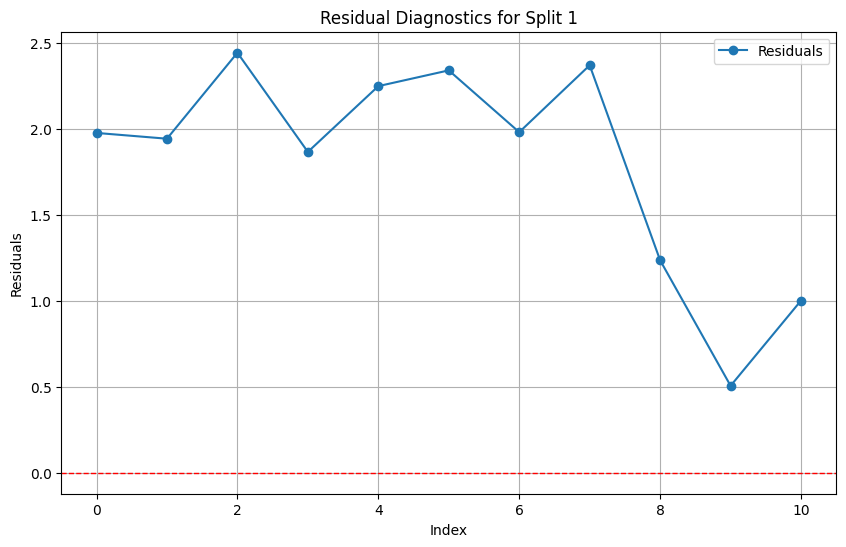

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=1.7647, MSE=3.4655, RMSE=1.8616, MAPE=33.02%
Residual ADF Statistic: -1.3135463197758102, p-value: 0.6229522939300889


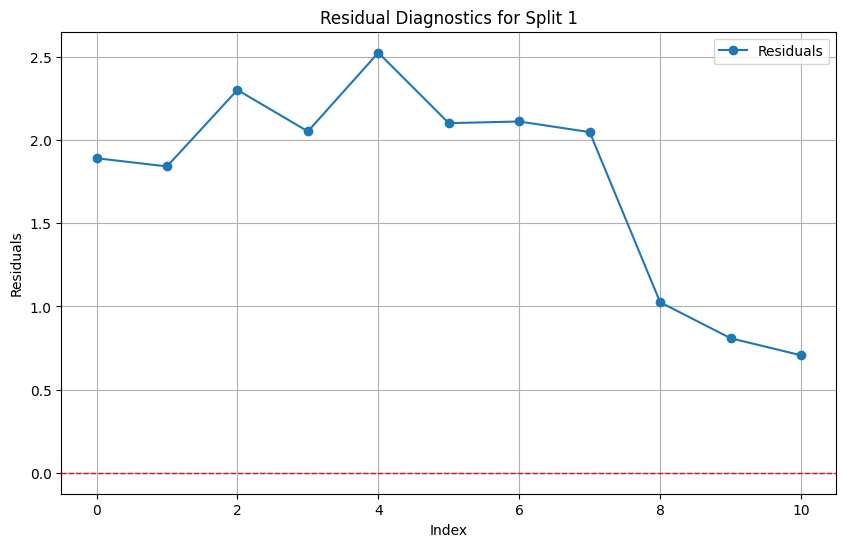

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=1.7900, MSE=3.5349, RMSE=1.8801, MAPE=33.75%
Residual ADF Statistic: -3.0578659645521697, p-value: 0.029832540216528196


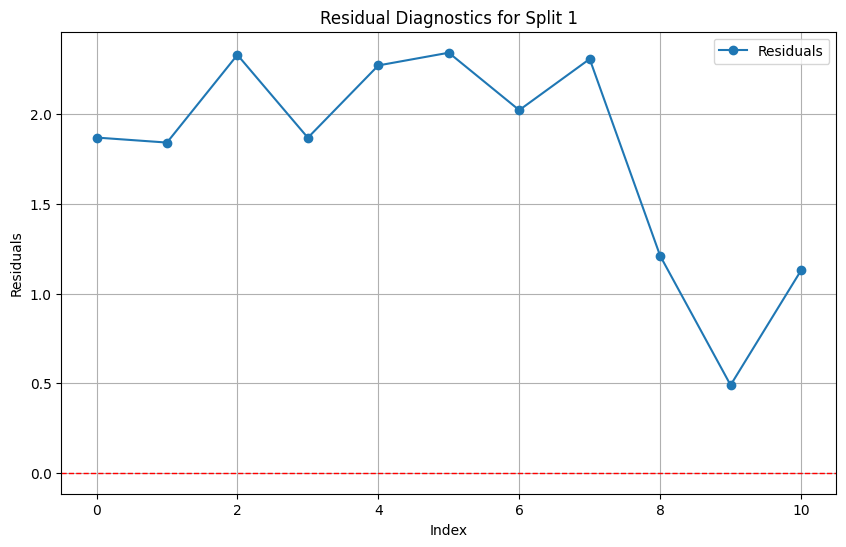

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=1.6389, MSE=2.9581, RMSE=1.7199, MAPE=30.72%
Residual ADF Statistic: -0.3540150375235656, p-value: 0.9174981480225732


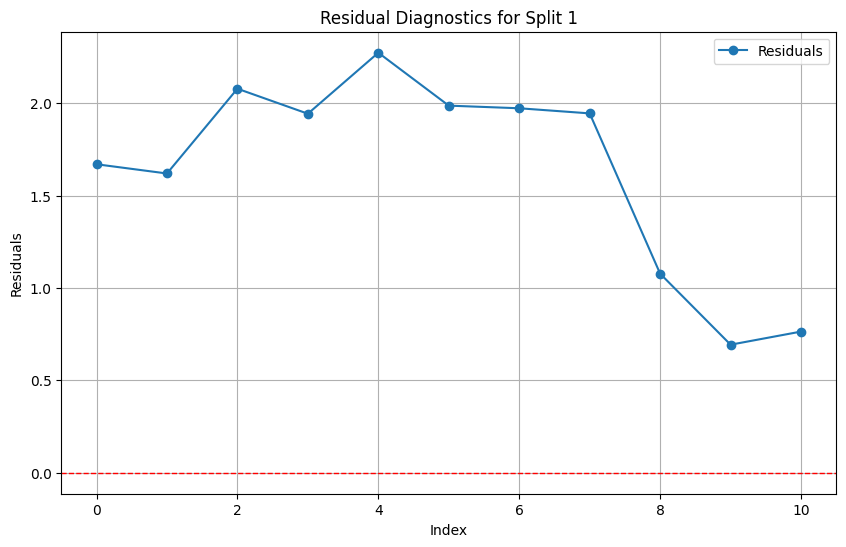

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=1.8042, MSE=3.6015, RMSE=1.8978, MAPE=34.03%
Residual ADF Statistic: -3.0220303803008983, p-value: 0.03288763302118382


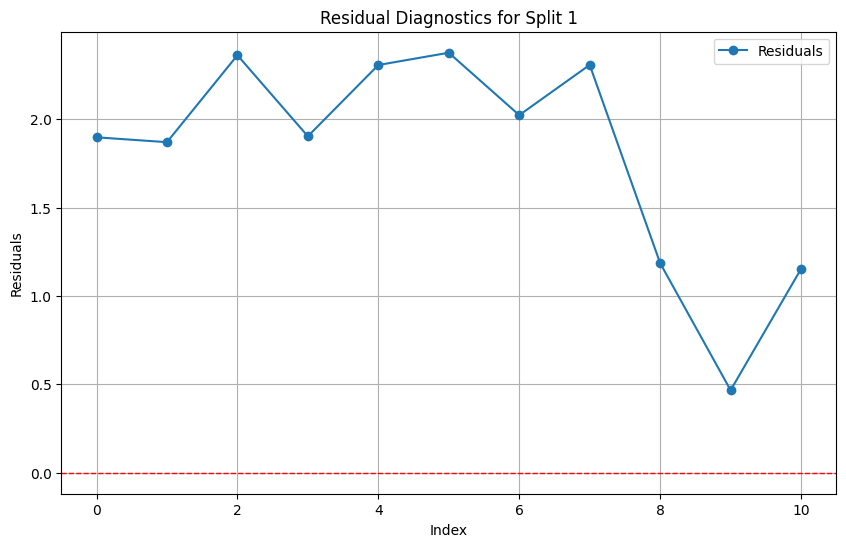

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=1.6426, MSE=2.9713, RMSE=1.7237, MAPE=30.79%
Residual ADF Statistic: -0.35675720888487444, p-value: 0.9170722787331433


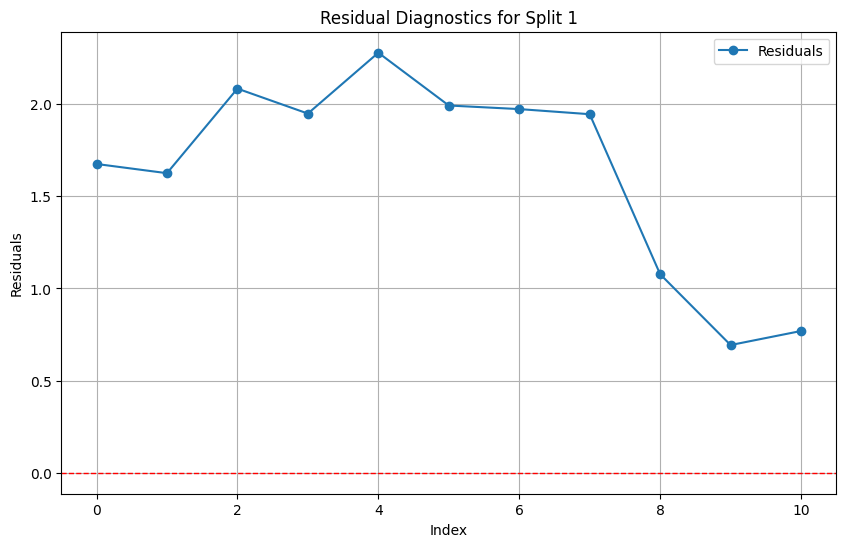

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=1.8044, MSE=3.6020, RMSE=1.8979, MAPE=34.03%
Residual ADF Statistic: -3.0220321149580944, p-value: 0.03288747894452916


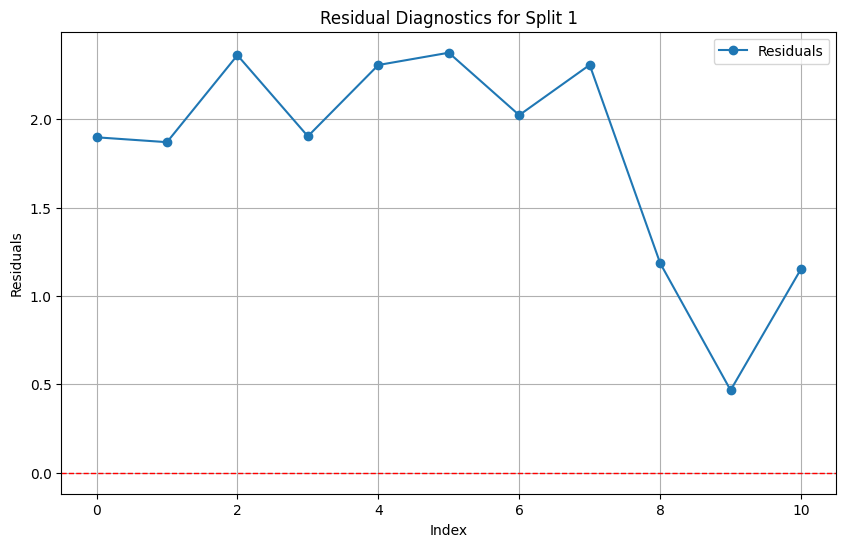

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=1.6426, MSE=2.9713, RMSE=1.7237, MAPE=30.79%
Residual ADF Statistic: -0.35675720888487444, p-value: 0.9170722787331433


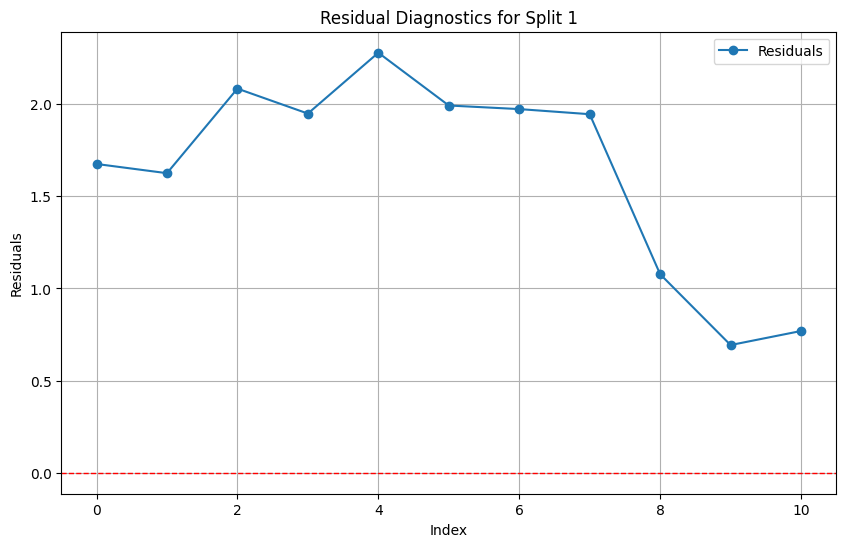

Processing Split 2...
Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=1.3870, MSE=2.4511, RMSE=1.5656, MAPE=30.68%
Residual ADF Statistic: -6.101042378816269, p-value: 9.834121858123905e-08


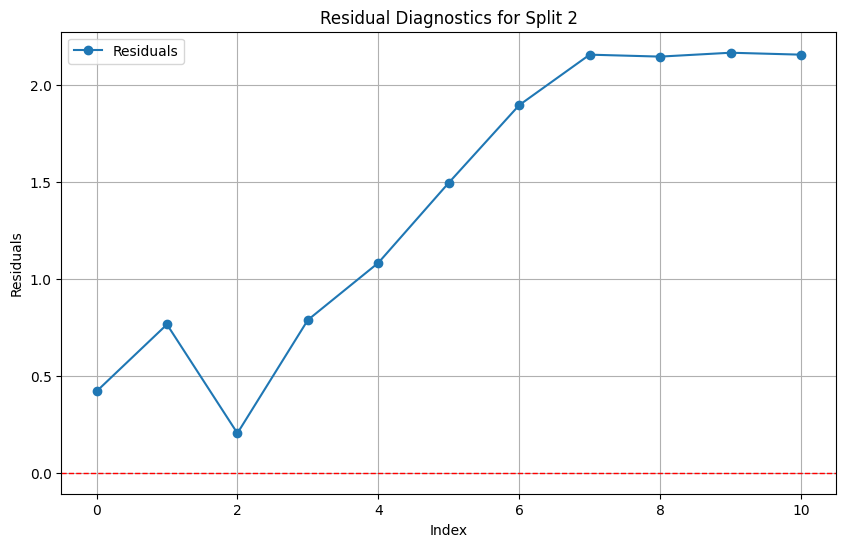

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=1.3391, MSE=2.3763, RMSE=1.5415, MAPE=29.35%
Residual ADF Statistic: -2.738410194453452, p-value: 0.06762418247934729


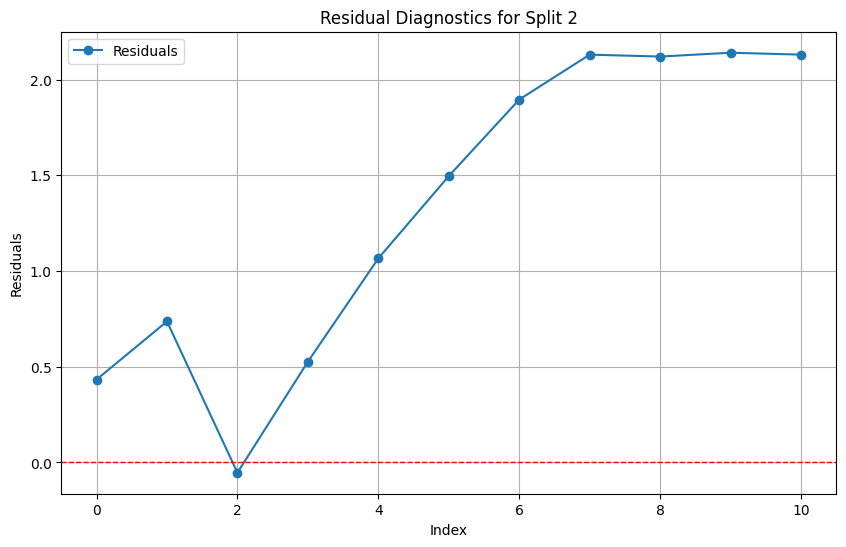

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.8709, MSE=0.9324, RMSE=0.9656, MAPE=20.15%
Residual ADF Statistic: -2.2185636944668476, p-value: 0.19957702475607403


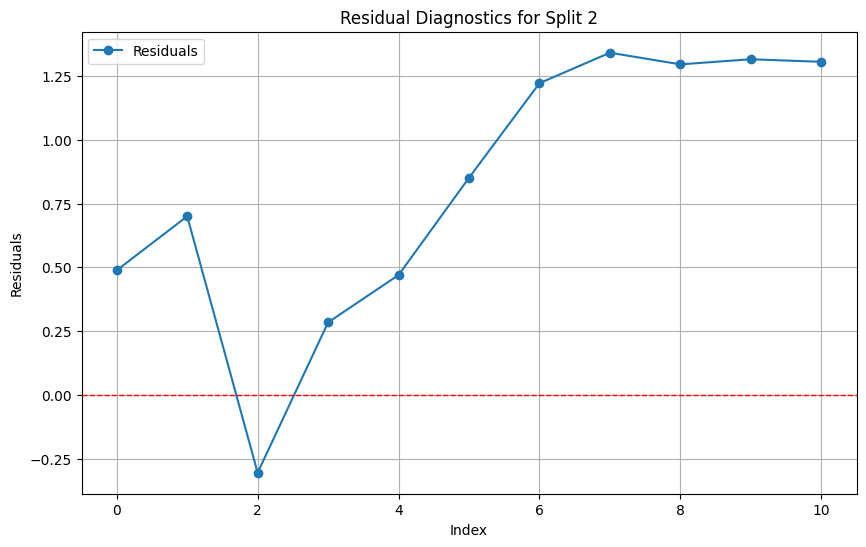

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.8561, MSE=0.9100, RMSE=0.9539, MAPE=19.71%
Residual ADF Statistic: -5.431148843377812, p-value: 2.9125995758183318e-06


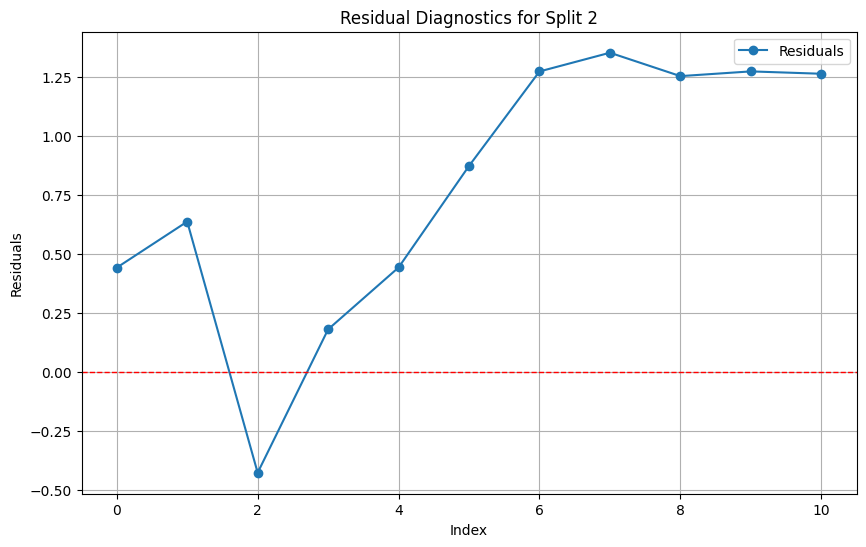

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.4351, MSE=0.2303, RMSE=0.4799, MAPE=11.68%
Residual ADF Statistic: -2.4331570297934046, p-value: 0.13259589475192118


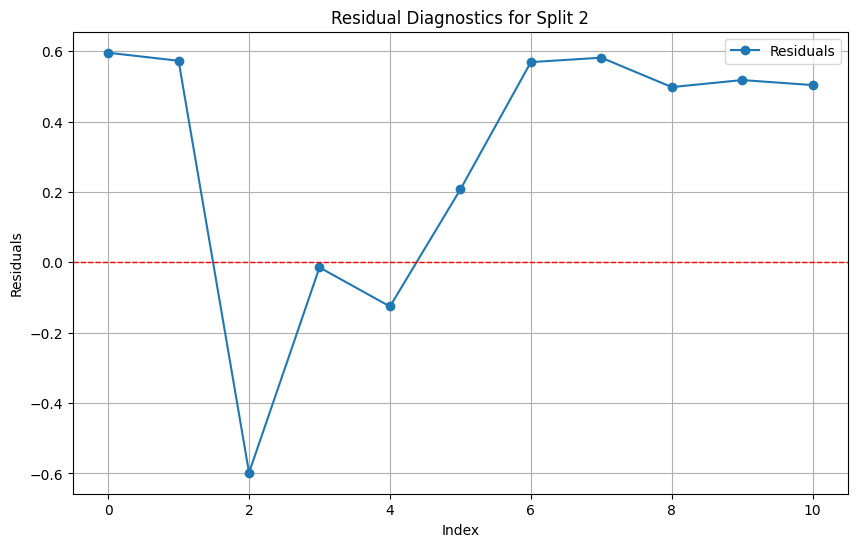

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.4665, MSE=0.2584, RMSE=0.5084, MAPE=12.39%
Residual ADF Statistic: -1.9163839042630282, p-value: 0.3243932917359083


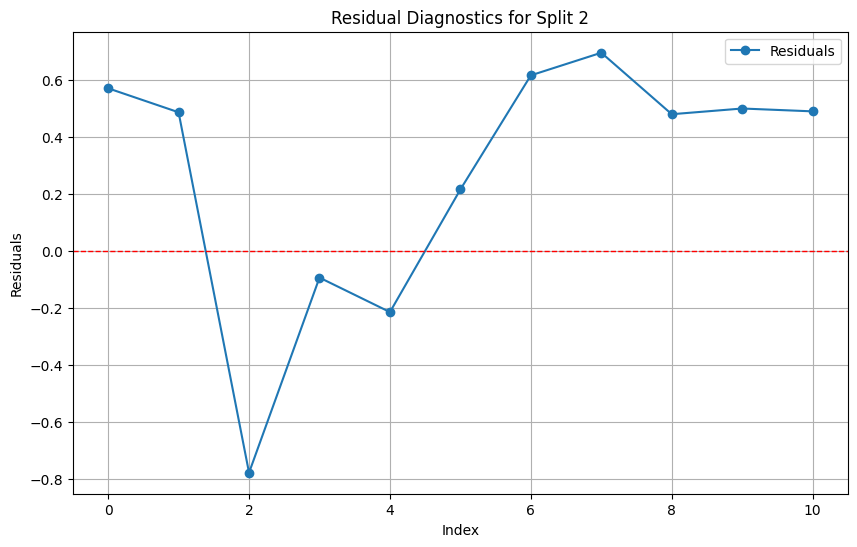

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=1.3798, MSE=2.4408, RMSE=1.5623, MAPE=30.41%
Residual ADF Statistic: -5.975035608180252, p-value: 1.896356749900316e-07


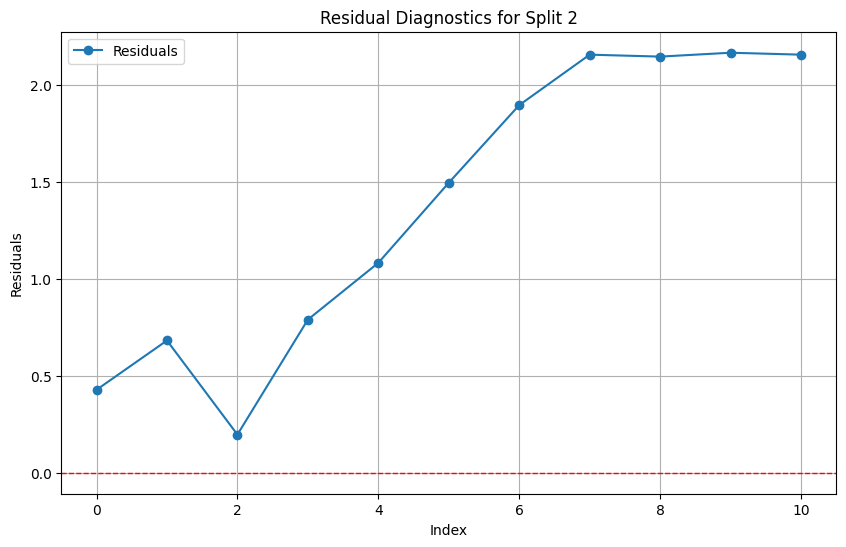

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=1.3741, MSE=2.4212, RMSE=1.5560, MAPE=30.44%
Residual ADF Statistic: -9.004731524592005, p-value: 6.356787054813888e-15


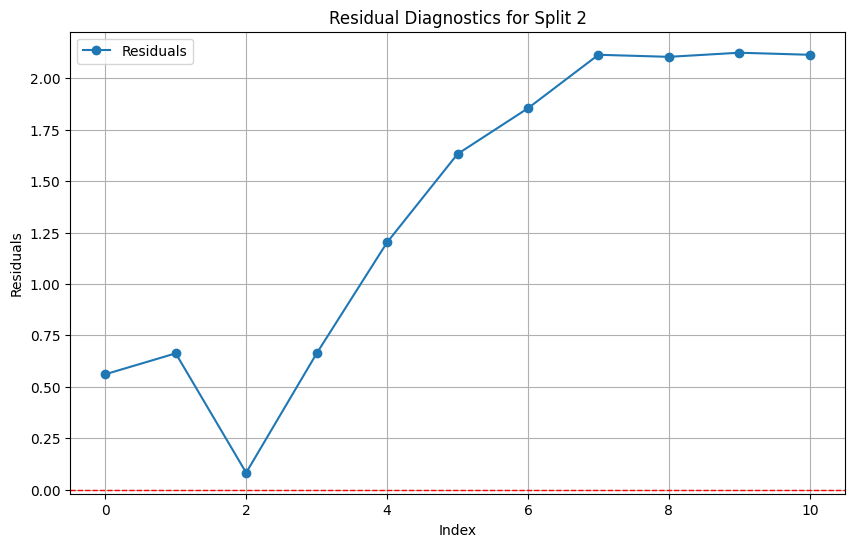

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.8545, MSE=0.9049, RMSE=0.9513, MAPE=19.46%
Residual ADF Statistic: -7.149753019195783, p-value: 3.163678605193428e-10


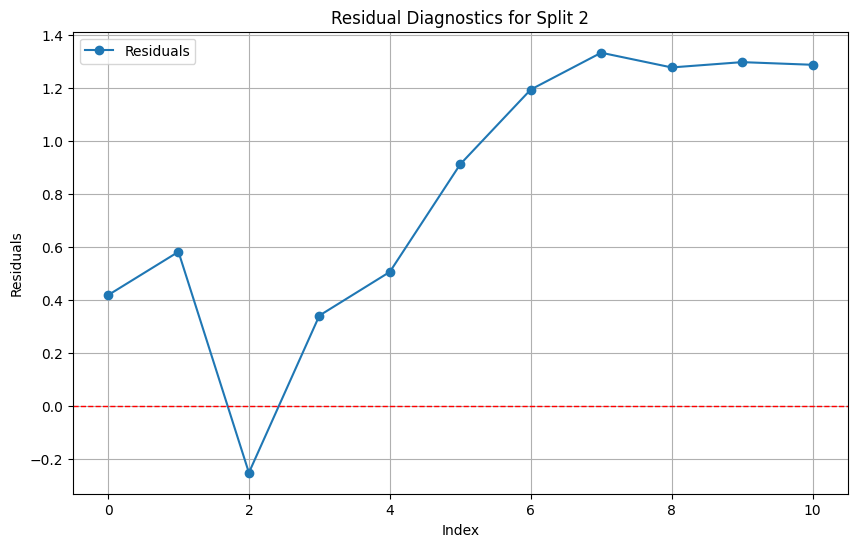

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.8600, MSE=0.9125, RMSE=0.9553, MAPE=19.84%
Residual ADF Statistic: -5.3113418739241585, p-value: 5.187085647896283e-06


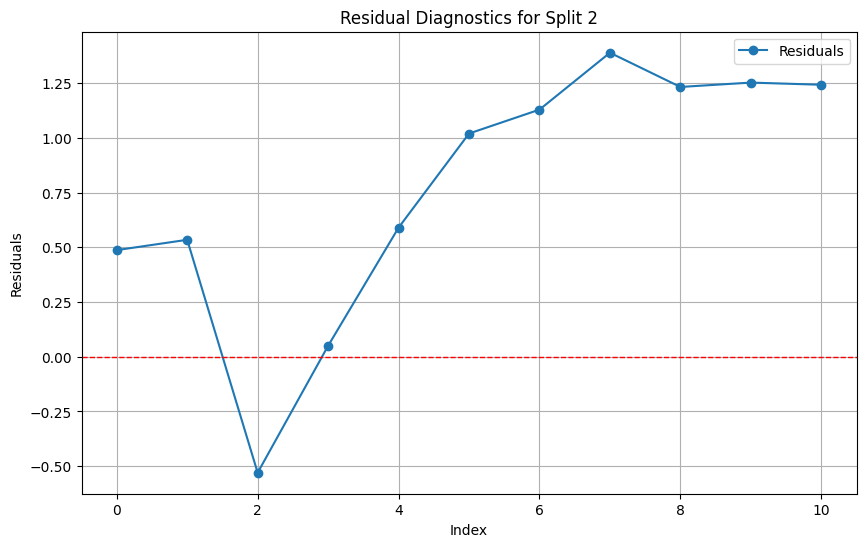

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.4153, MSE=0.2063, RMSE=0.4542, MAPE=10.88%
Residual ADF Statistic: -2.3168485182953282, p-value: 0.16659155351339866


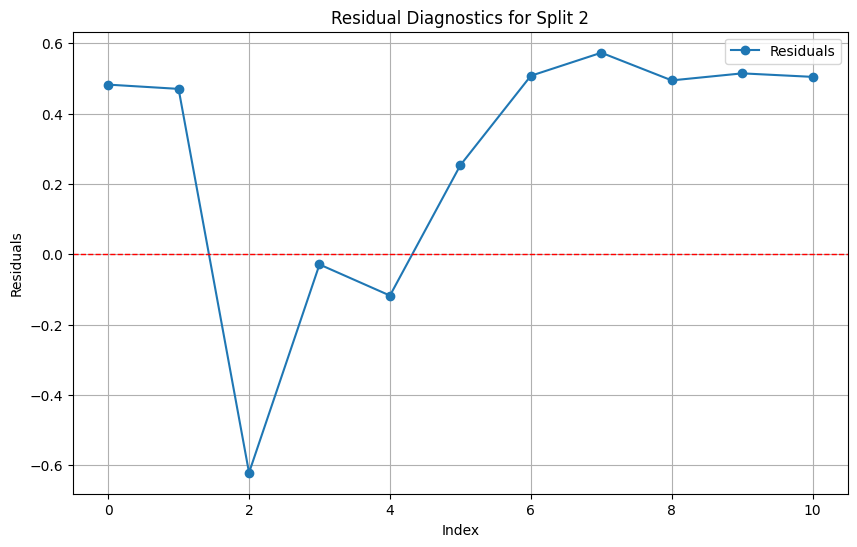

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.4646, MSE=0.2612, RMSE=0.5111, MAPE=12.16%
Residual ADF Statistic: -4.792685472444344, p-value: 5.616553918019291e-05


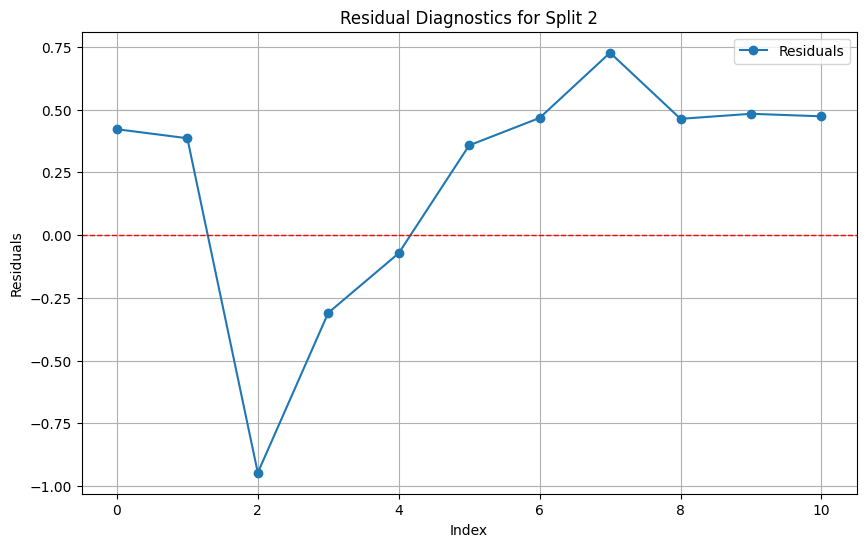

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=1.3788, MSE=2.4395, RMSE=1.5619, MAPE=30.37%
Residual ADF Statistic: -5.941165449613212, p-value: 2.2592056584542976e-07


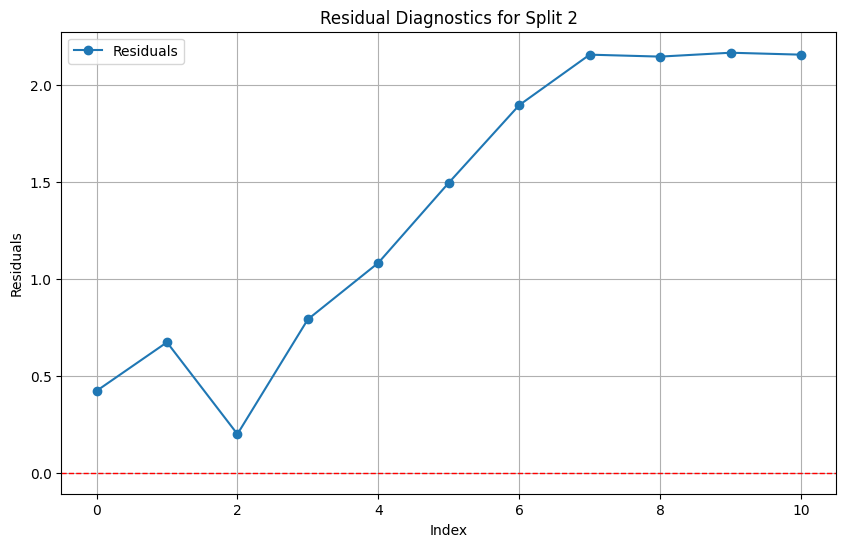

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=1.3802, MSE=2.4284, RMSE=1.5583, MAPE=30.74%
Residual ADF Statistic: -8.924543647226383, p-value: 1.019671154275613e-14


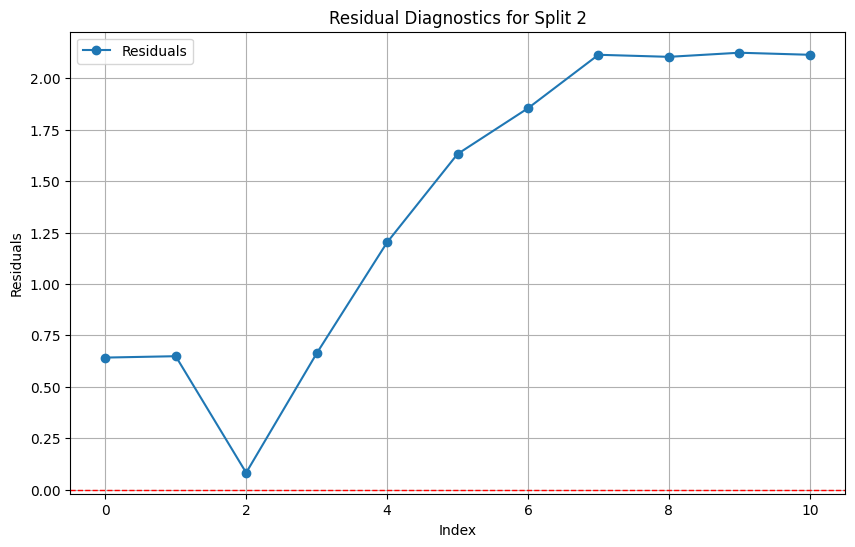

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.8520, MSE=0.9039, RMSE=0.9507, MAPE=19.35%
Residual ADF Statistic: -6.677678099187322, p-value: 4.4227024641464275e-09


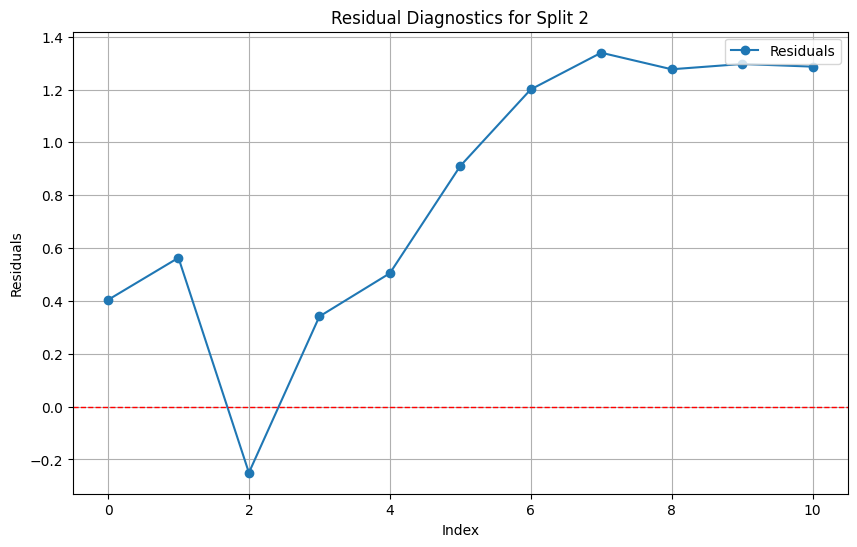

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.8776, MSE=0.9334, RMSE=0.9661, MAPE=20.66%
Residual ADF Statistic: -5.2740127434619195, p-value: 6.196787120552268e-06


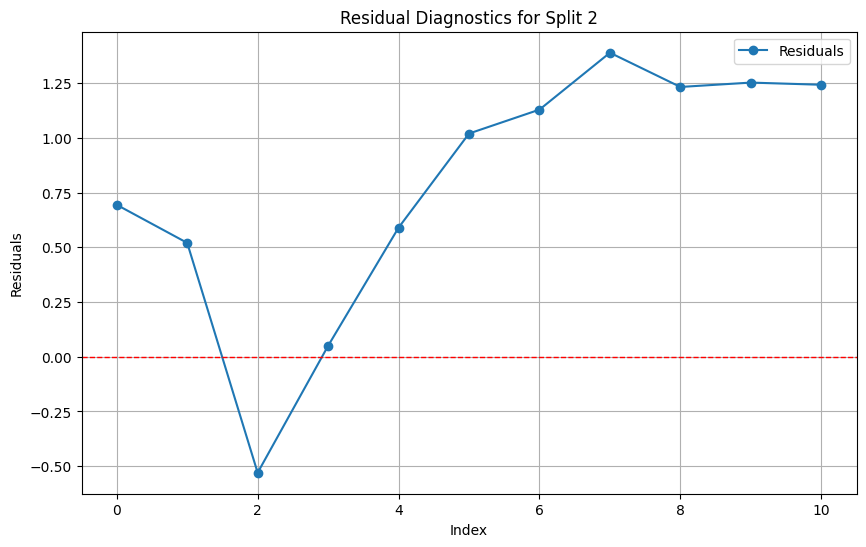

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.4113, MSE=0.2024, RMSE=0.4499, MAPE=10.73%
Residual ADF Statistic: -2.2545515386228447, p-value: 0.18704500804714352


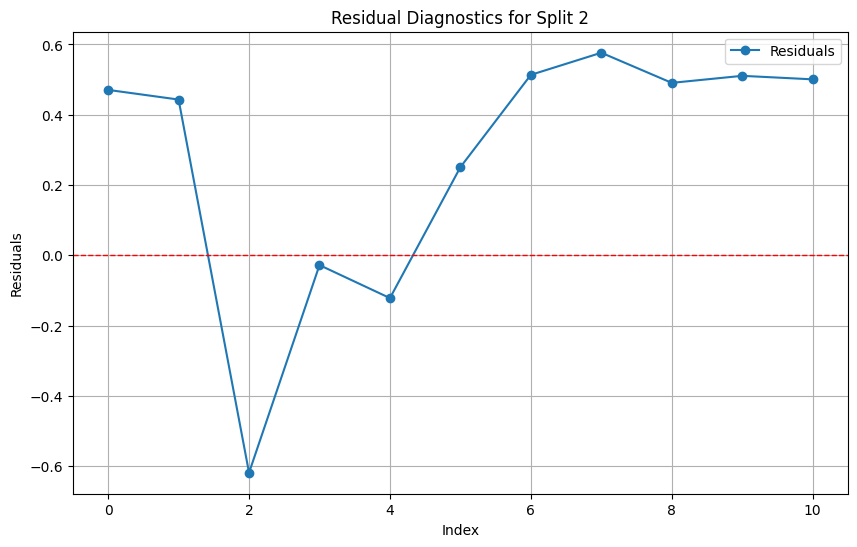

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.4973, MSE=0.2963, RMSE=0.5443, MAPE=13.58%
Residual ADF Statistic: -4.82917658415718, p-value: 4.7811083542457884e-05


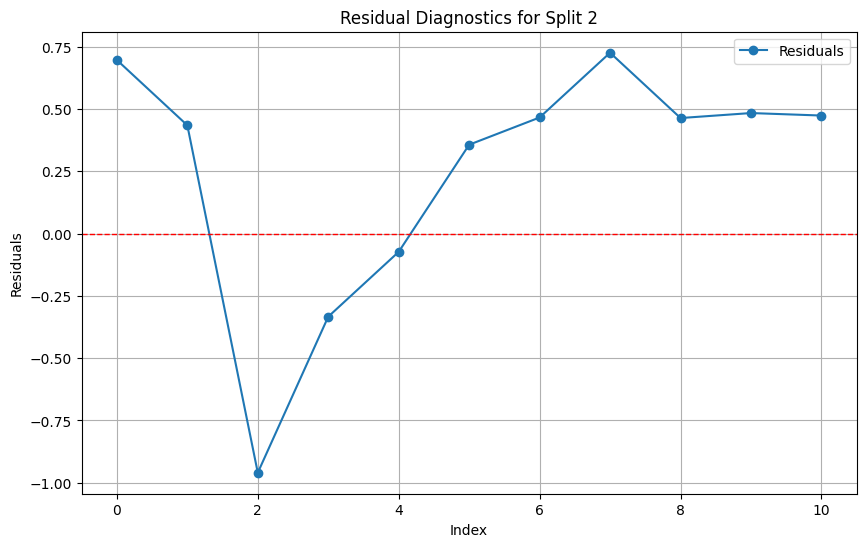

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.3157, MSE=0.1569, RMSE=0.3960, MAPE=9.79%
Residual ADF Statistic: -2.917468511522925, p-value: 0.04335403121171383


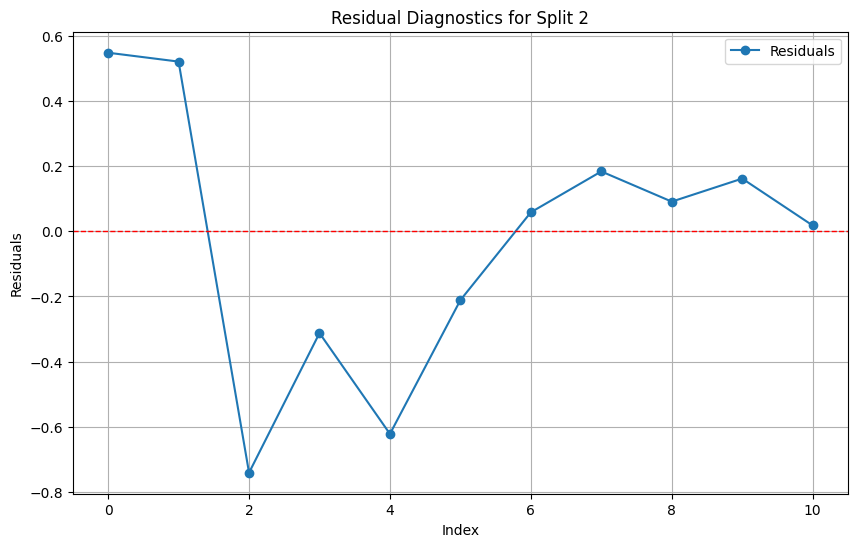

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.3157, MSE=0.1685, RMSE=0.4105, MAPE=9.80%
Residual ADF Statistic: -2.418796263587965, p-value: 0.13650142571183704


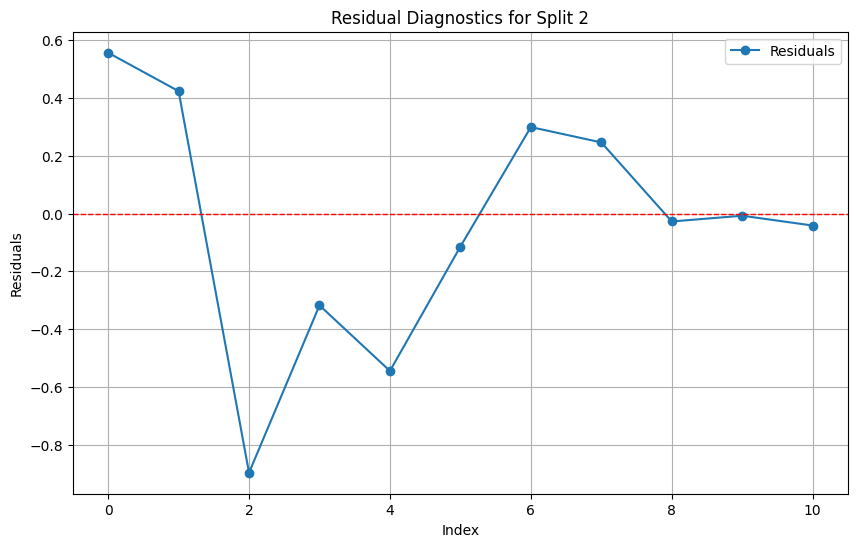

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.3266, MSE=0.1587, RMSE=0.3984, MAPE=9.99%
Residual ADF Statistic: -2.997647247393882, p-value: 0.035114702704833516


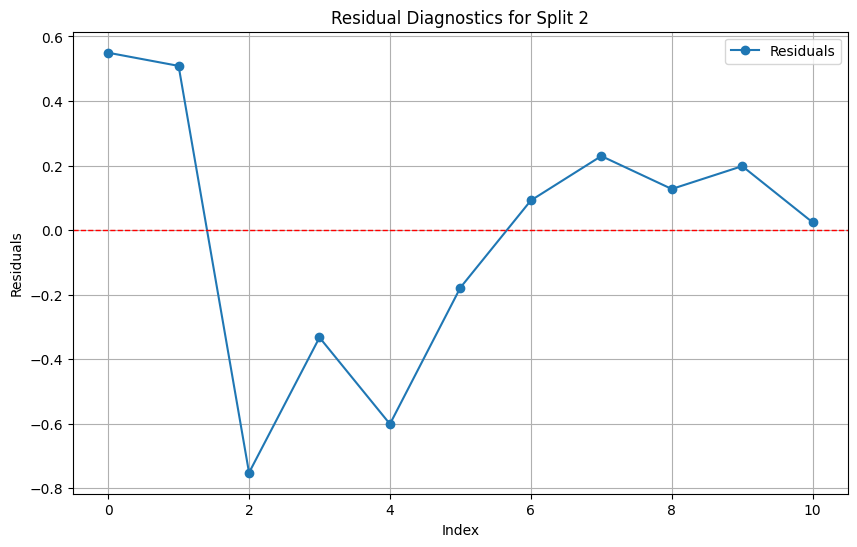

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.3162, MSE=0.1683, RMSE=0.4102, MAPE=9.76%
Residual ADF Statistic: -2.49453996736047, p-value: 0.11680846812842288


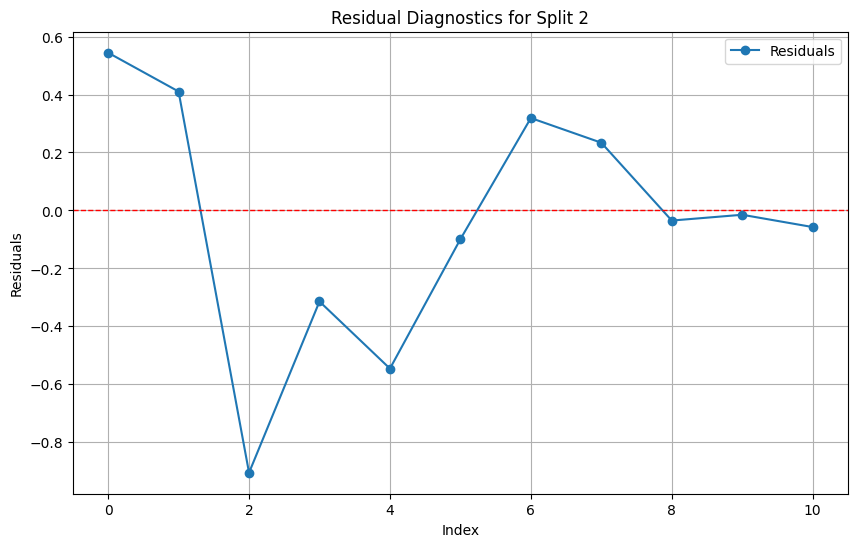

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.3315, MSE=0.1638, RMSE=0.4047, MAPE=10.12%
Residual ADF Statistic: -3.1240312700509536, p-value: 0.024825130431520393


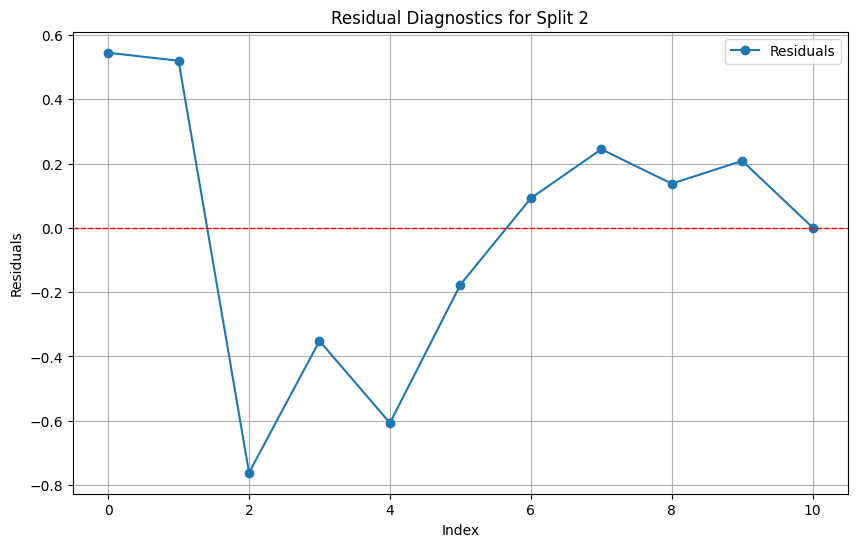

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.3177, MSE=0.1693, RMSE=0.4114, MAPE=9.79%
Residual ADF Statistic: -2.578471078335134, p-value: 0.09752899317742486


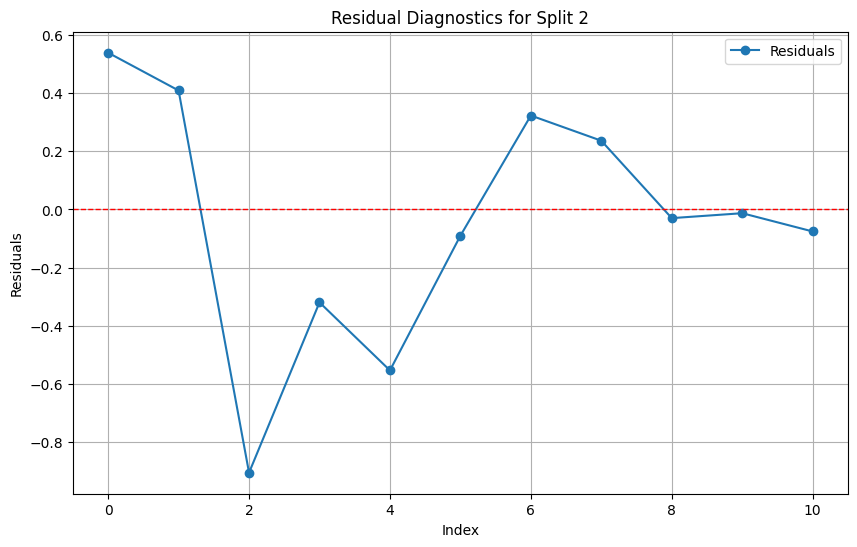

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.2992, MSE=0.1641, RMSE=0.4051, MAPE=9.63%
Residual ADF Statistic: -2.595921358792205, p-value: 0.09384317314357771


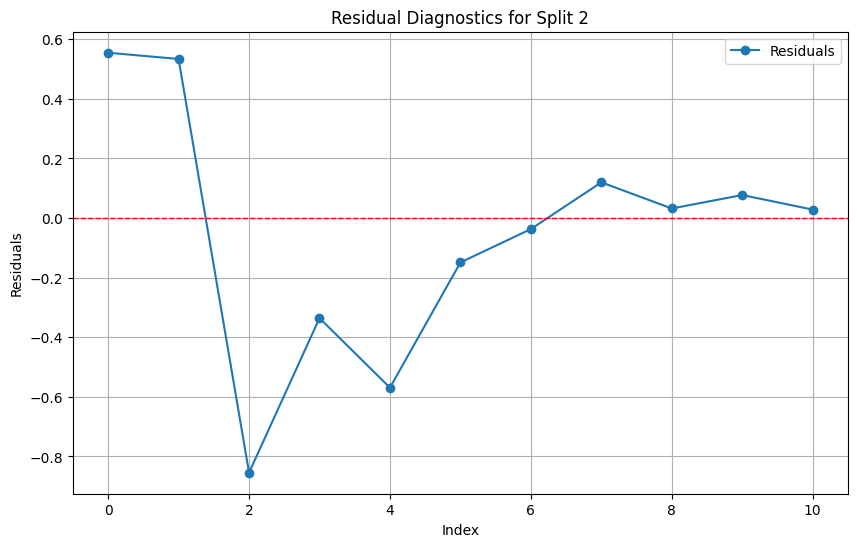

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.3344, MSE=0.2483, RMSE=0.4983, MAPE=10.33%
Residual ADF Statistic: -4.6029253090032265, p-value: 0.00012757544275930478


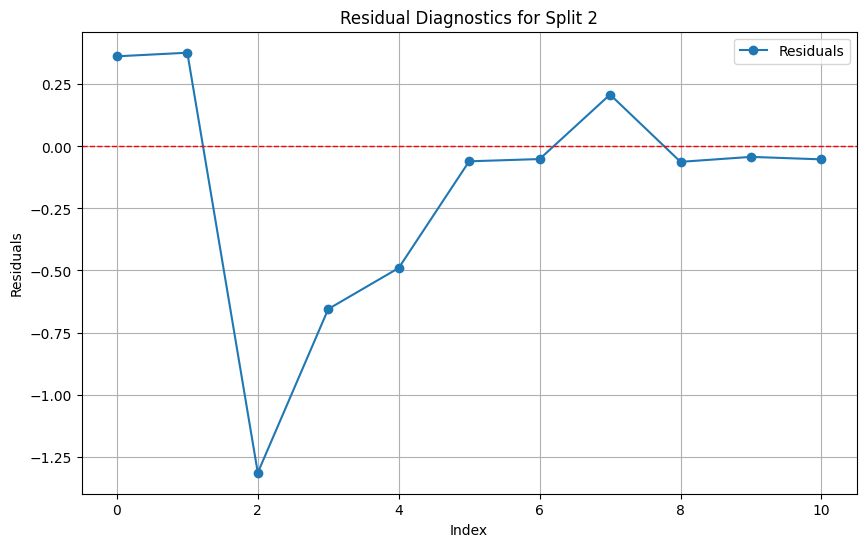

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.3007, MSE=0.1649, RMSE=0.4061, MAPE=9.70%
Residual ADF Statistic: -2.8806329328545495, p-value: 0.04764692071636645


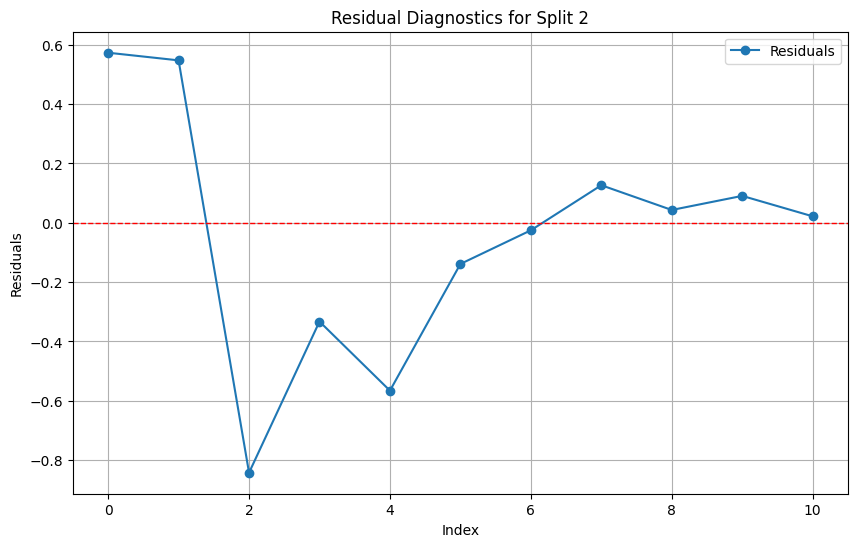

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.3451, MSE=0.2531, RMSE=0.5031, MAPE=10.57%
Residual ADF Statistic: -4.80675967904194, p-value: 5.278953361048161e-05


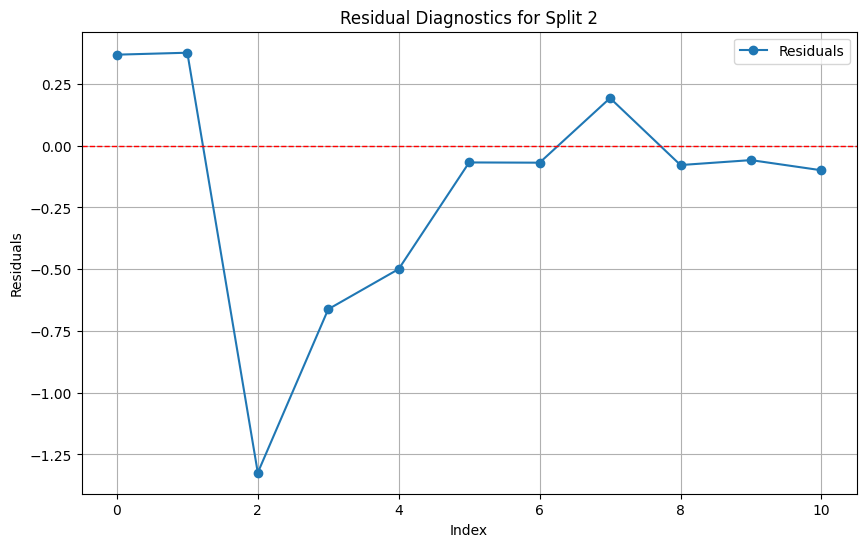

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.3007, MSE=0.1645, RMSE=0.4056, MAPE=9.70%
Residual ADF Statistic: -3.069496361604104, p-value: 0.028894507973579498


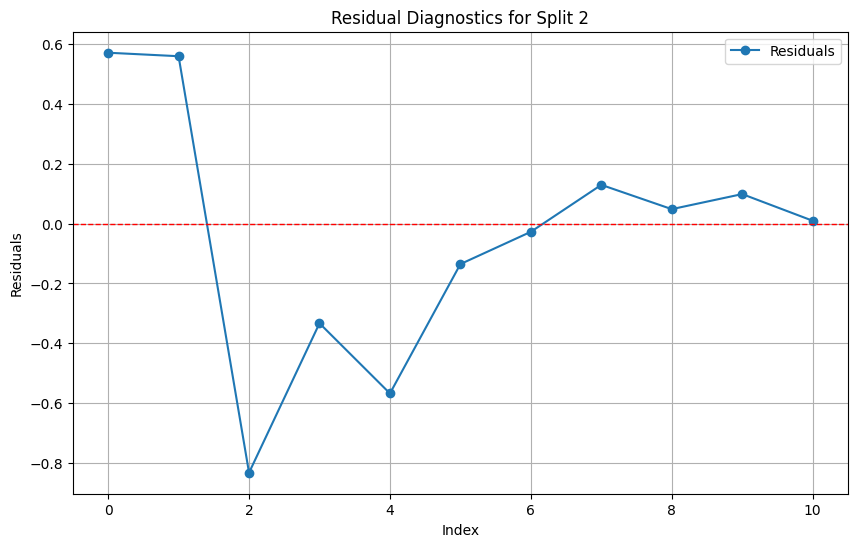

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.3454, MSE=0.2536, RMSE=0.5036, MAPE=10.58%
Residual ADF Statistic: -4.77971354329605, p-value: 5.945984861152844e-05


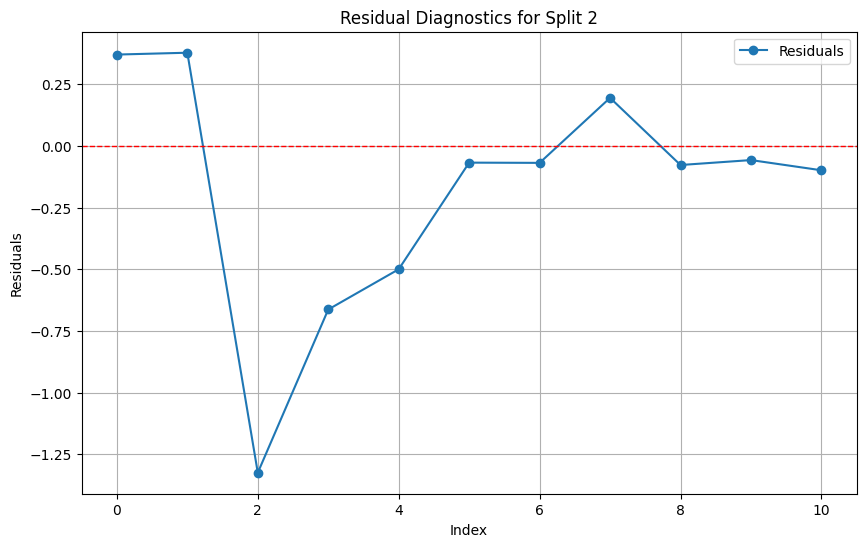

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.3170, MSE=0.1854, RMSE=0.4306, MAPE=10.10%
Residual ADF Statistic: -5.039018002398734, p-value: 1.8567553974372746e-05


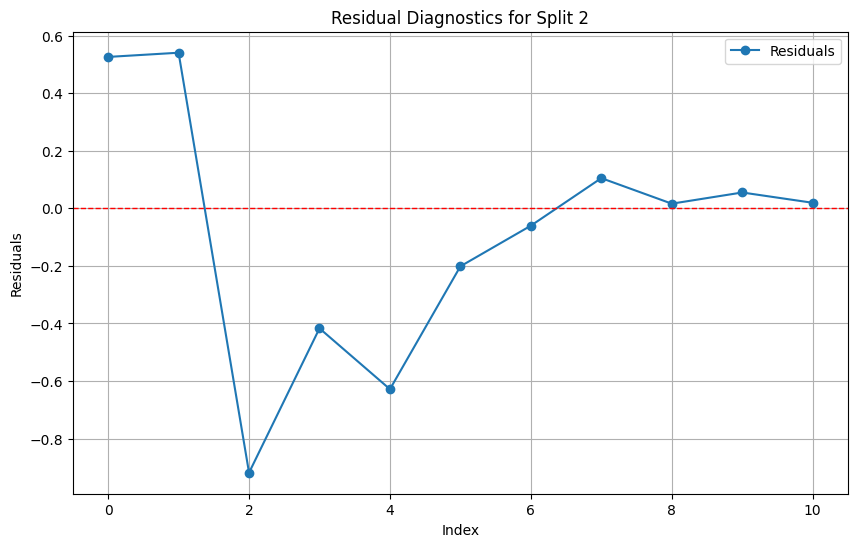

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.3652, MSE=0.2767, RMSE=0.5260, MAPE=11.68%
Residual ADF Statistic: -4.751770780909342, p-value: 6.719707598815964e-05


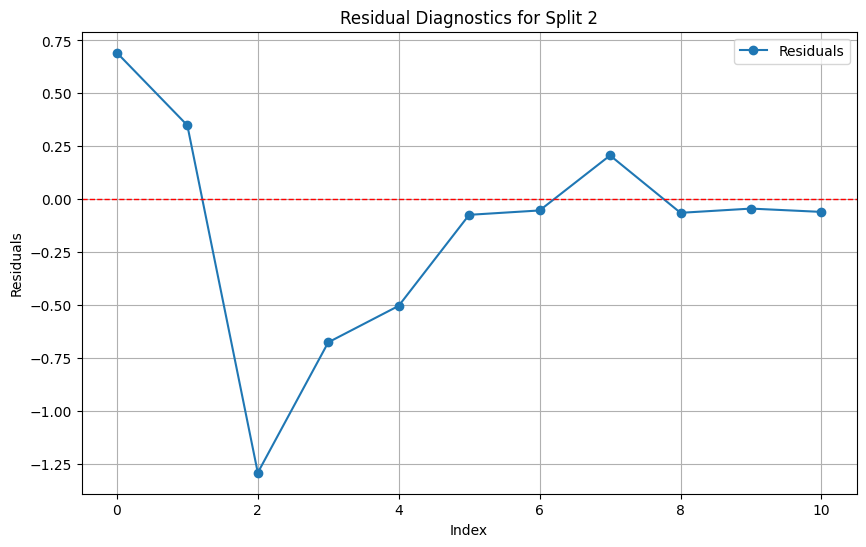

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.3119, MSE=0.1841, RMSE=0.4291, MAPE=10.04%
Residual ADF Statistic: -2.6617858149732765, p-value: 0.08088761879114564


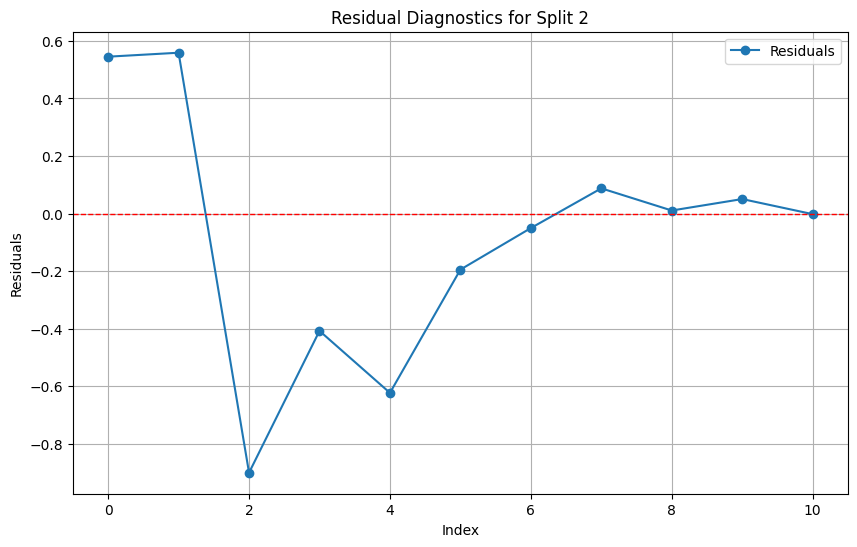

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.3760, MSE=0.2804, RMSE=0.5296, MAPE=11.89%
Residual ADF Statistic: -5.013678144150804, p-value: 2.085060153661879e-05


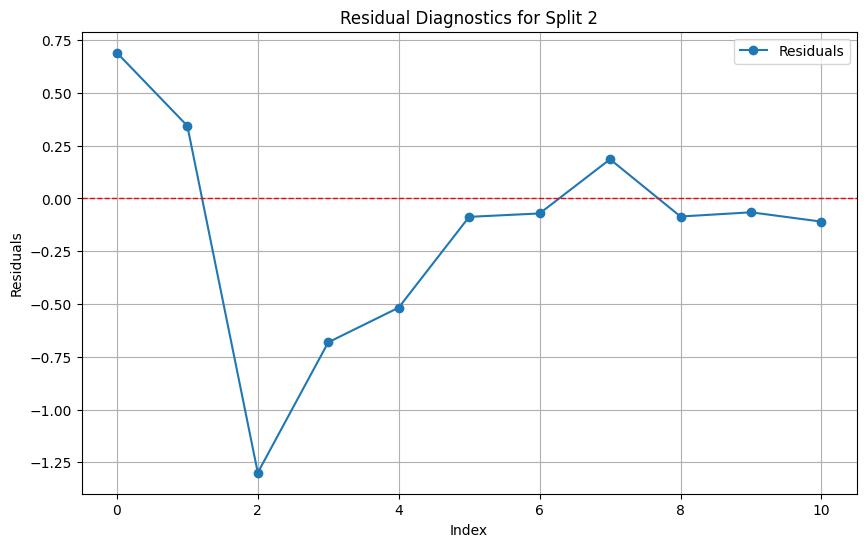

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.3138, MSE=0.1848, RMSE=0.4299, MAPE=10.09%
Residual ADF Statistic: -2.715500530609893, p-value: 0.07139419347763552


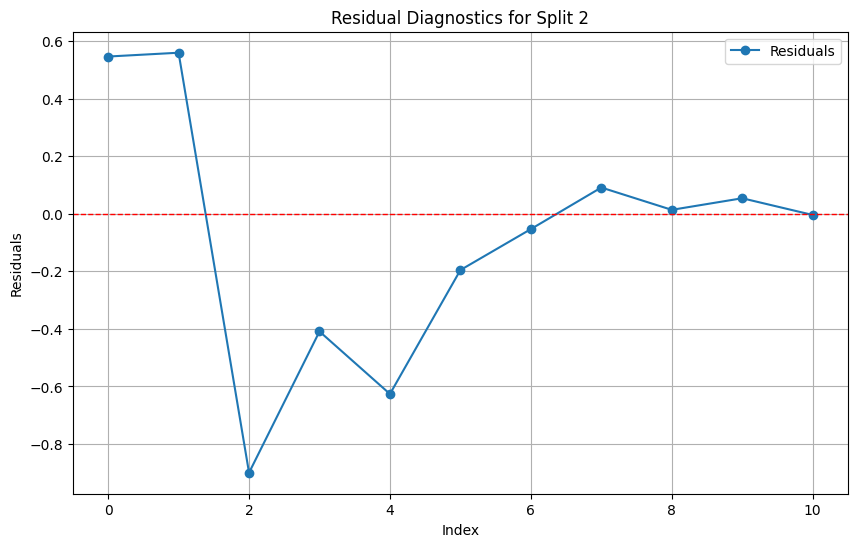

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.3759, MSE=0.2803, RMSE=0.5295, MAPE=11.89%
Residual ADF Statistic: -5.02220230120351, p-value: 2.005392527470473e-05


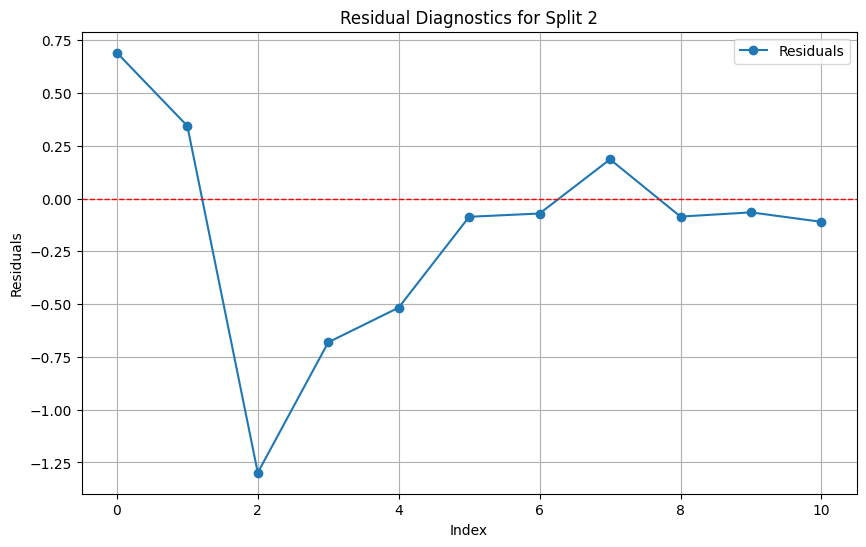

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.3376, MSE=0.1863, RMSE=0.4316, MAPE=10.62%
Residual ADF Statistic: -2.708749296130628, p-value: 0.07253645717344831


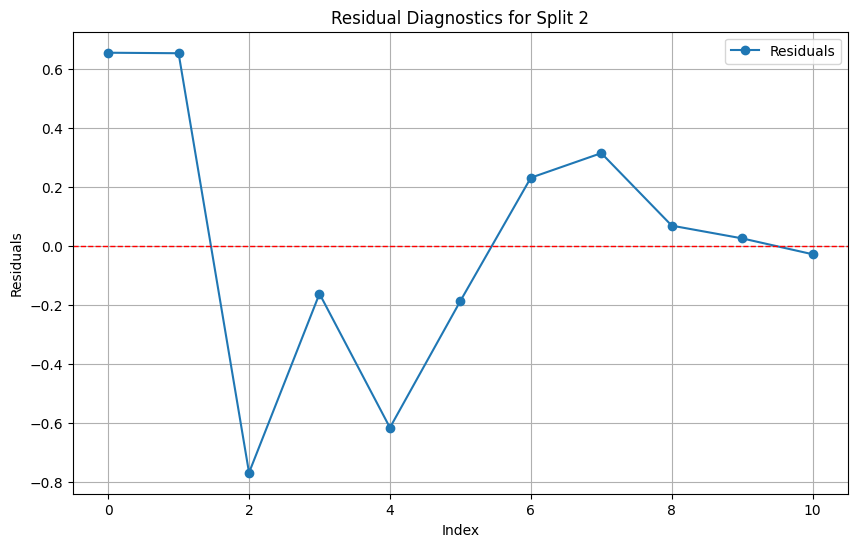

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.3357, MSE=0.1940, RMSE=0.4404, MAPE=10.55%
Residual ADF Statistic: -2.2506314516363646, p-value: 0.18838468742947068


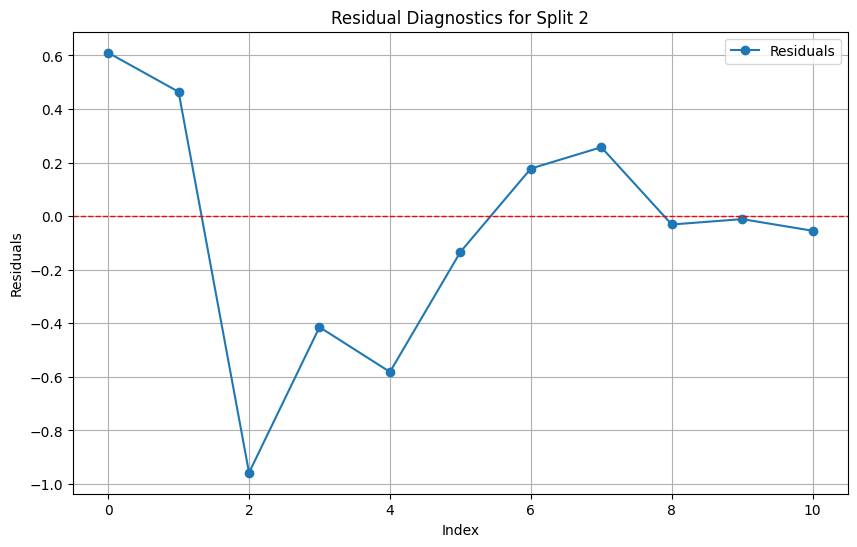

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.3458, MSE=0.1902, RMSE=0.4361, MAPE=10.83%
Residual ADF Statistic: -2.8754124061148016, p-value: 0.048282819518142665


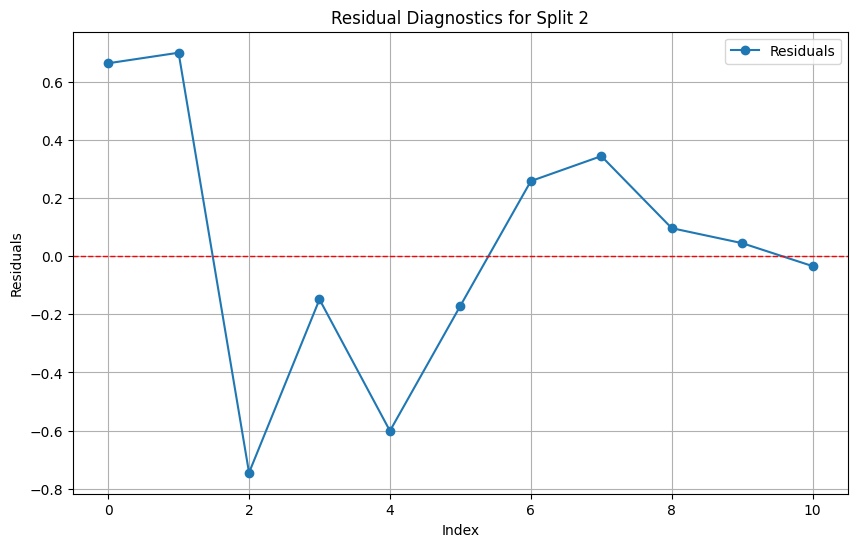

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.3301, MSE=0.1900, RMSE=0.4359, MAPE=10.37%
Residual ADF Statistic: -2.2436748098796757, p-value: 0.19077741567974743


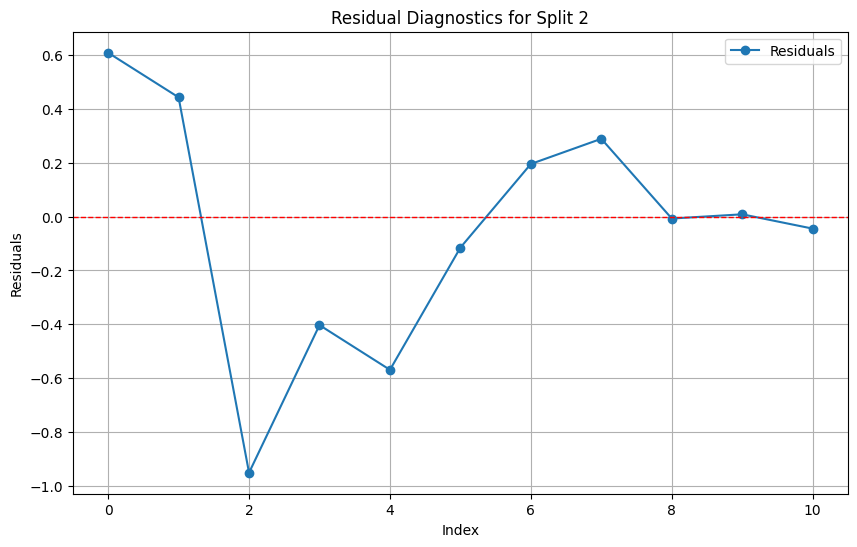

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.3448, MSE=0.1892, RMSE=0.4350, MAPE=10.78%
Residual ADF Statistic: -2.8650638147921517, p-value: 0.04956404453140731


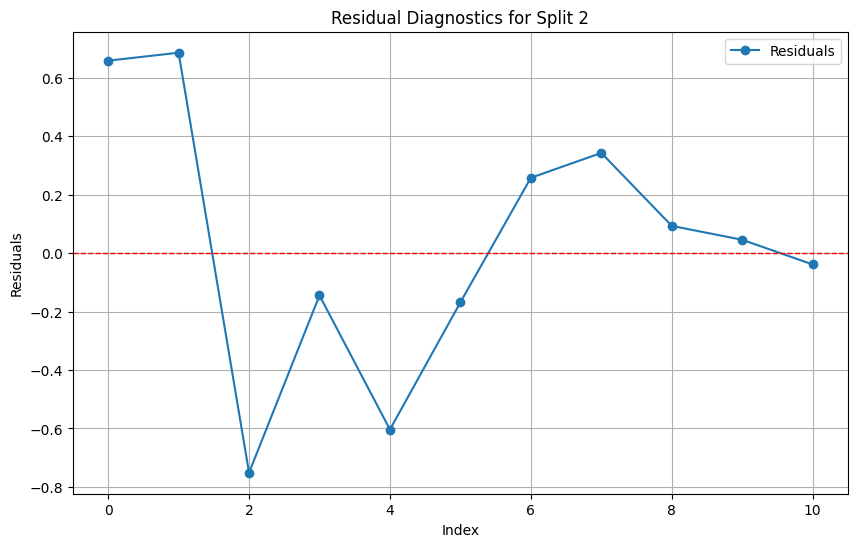

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.3306, MSE=0.1914, RMSE=0.4375, MAPE=10.37%
Residual ADF Statistic: -2.230199480198868, p-value: 0.19546789683970545


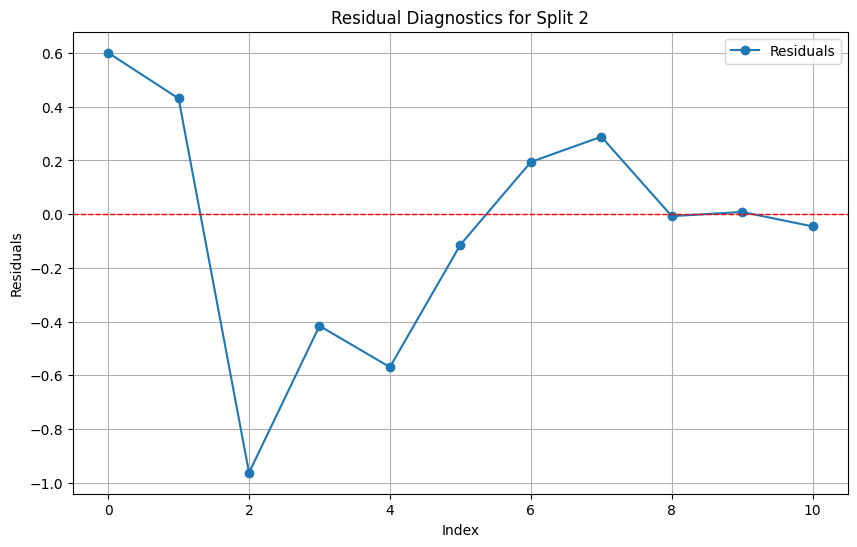

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.3816, MSE=0.2516, RMSE=0.5016, MAPE=11.99%
Residual ADF Statistic: -2.3934863124418135, p-value: 0.14358329510249845


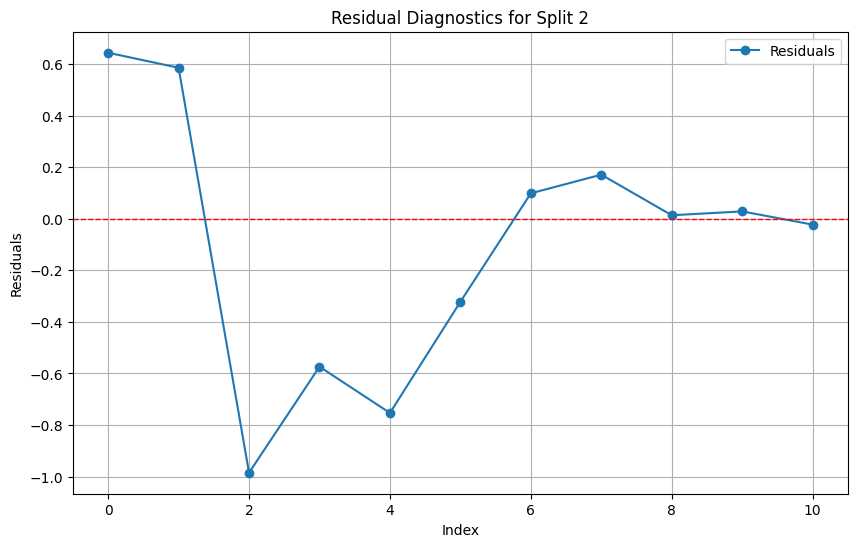

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.3069, MSE=0.1734, RMSE=0.4164, MAPE=9.55%
Residual ADF Statistic: -3.368606644019043, p-value: 0.01207677353310687


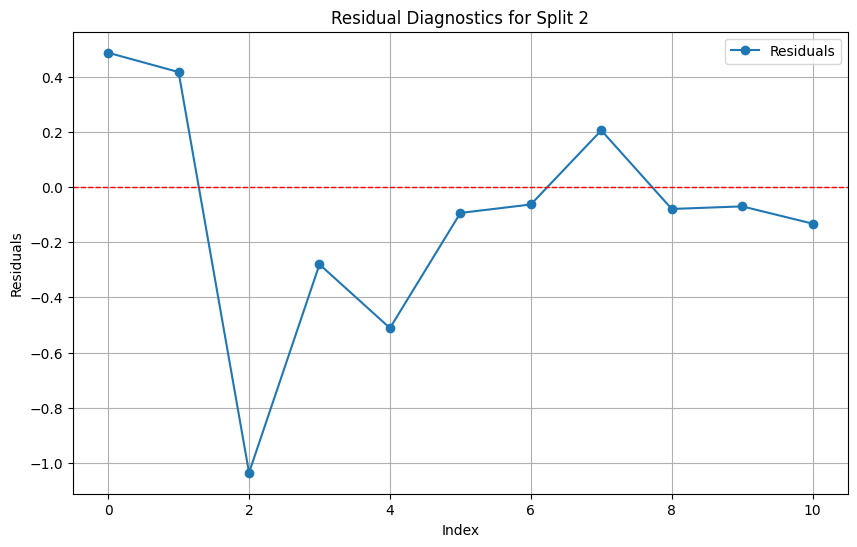

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.3839, MSE=0.2542, RMSE=0.5042, MAPE=12.07%
Residual ADF Statistic: -2.4984185326025306, p-value: 0.1158595871892919


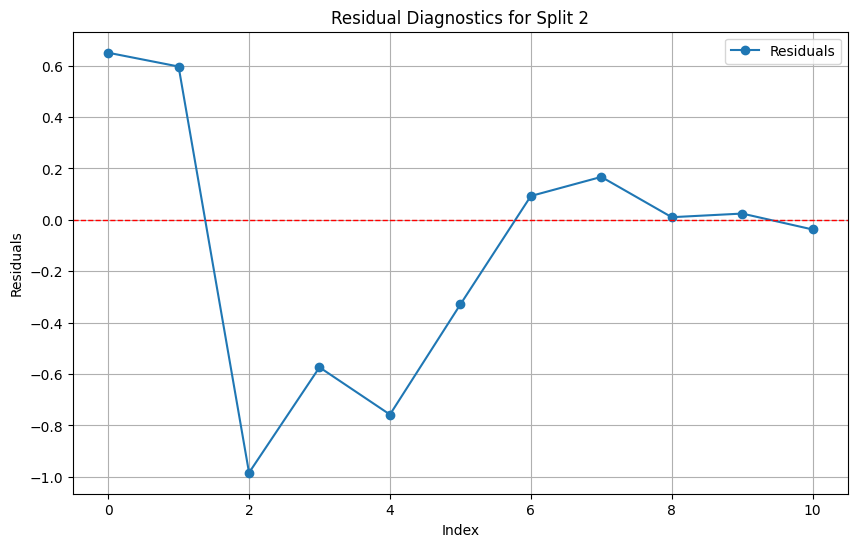

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.3070, MSE=0.1736, RMSE=0.4167, MAPE=9.55%
Residual ADF Statistic: -3.383663520101176, p-value: 0.011528548881665766


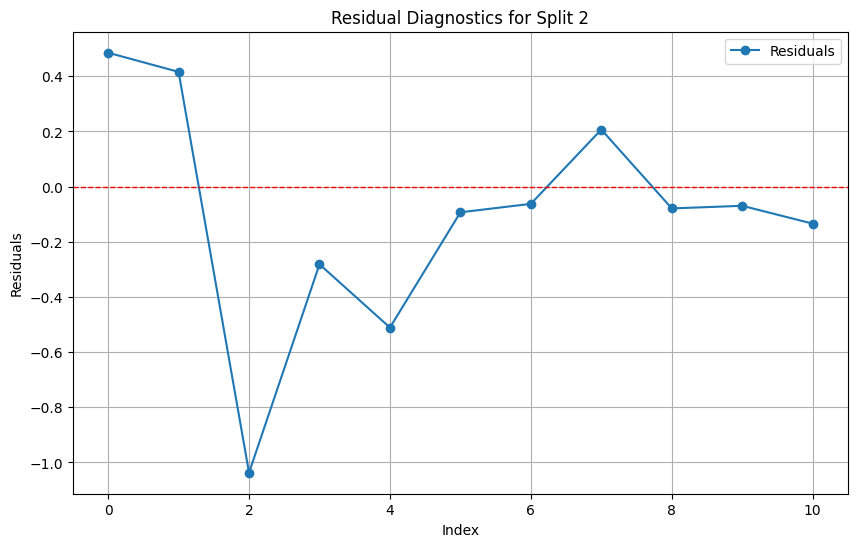

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.3839, MSE=0.2542, RMSE=0.5042, MAPE=12.07%
Residual ADF Statistic: -2.500545482286374, p-value: 0.11534165943705088


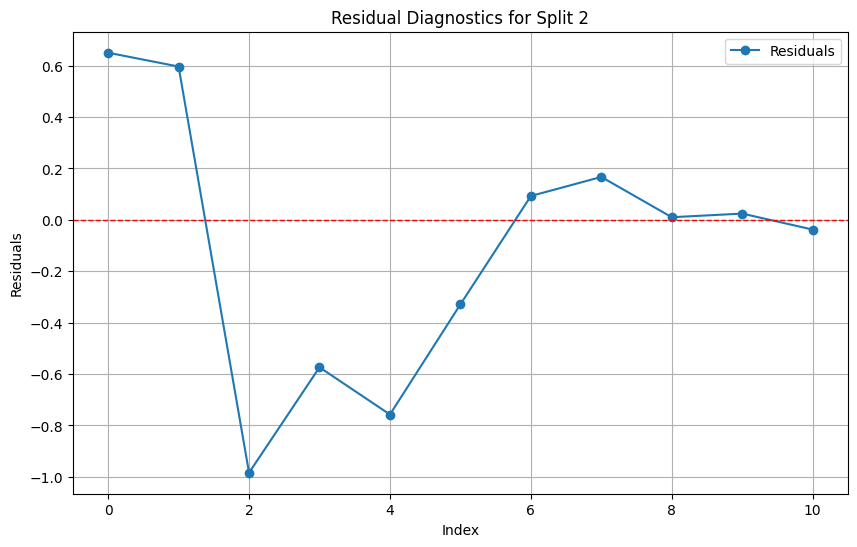

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.3070, MSE=0.1736, RMSE=0.4167, MAPE=9.55%
Residual ADF Statistic: -3.383663520101176, p-value: 0.011528548881665766


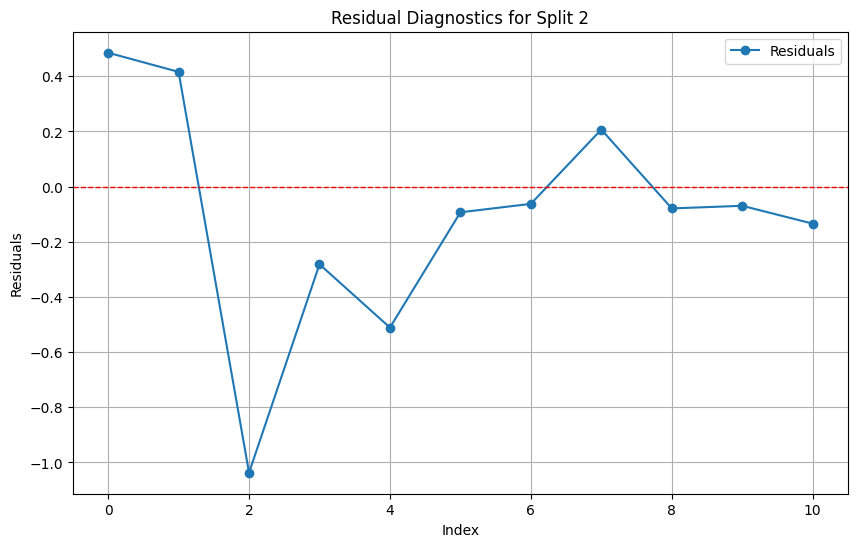

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.3620, MSE=0.2395, RMSE=0.4894, MAPE=12.15%
Residual ADF Statistic: -2.6671332381081547, p-value: 0.079900363991468


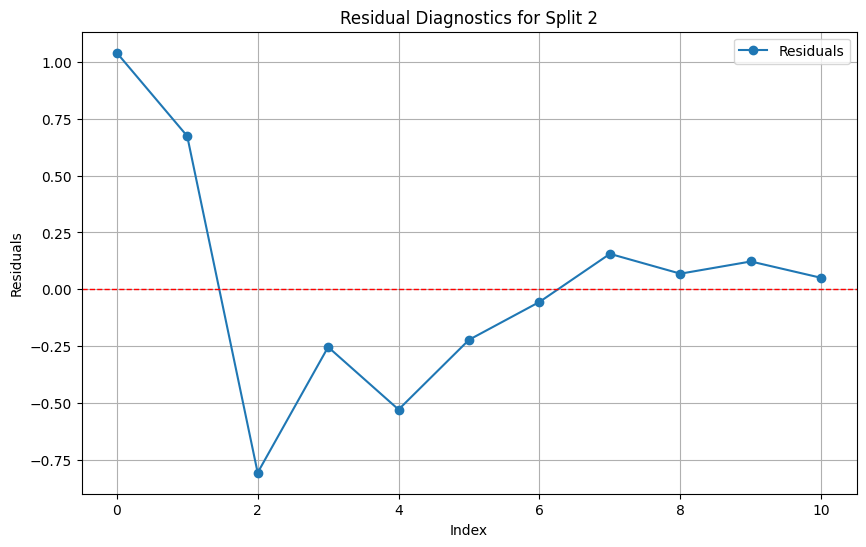

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.3310, MSE=0.1936, RMSE=0.4400, MAPE=10.34%
Residual ADF Statistic: -3.1561773843239376, p-value: 0.022665612197861652


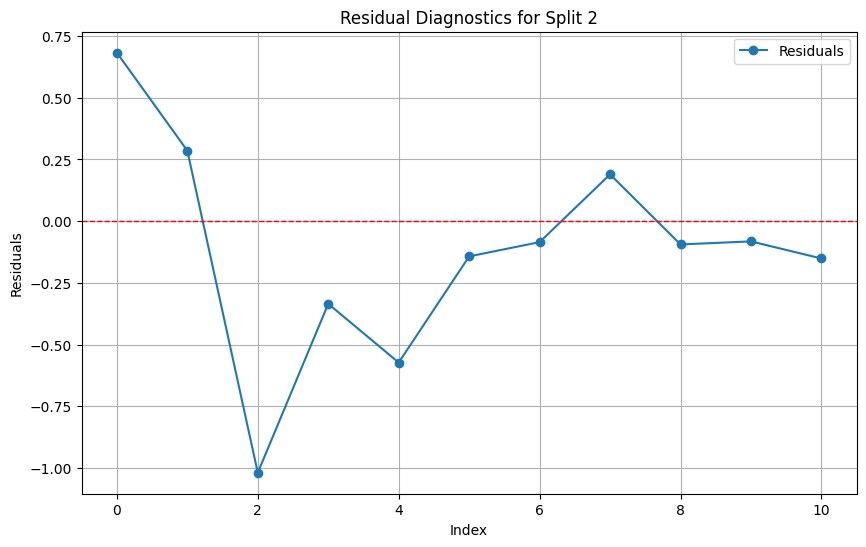

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.3611, MSE=0.2381, RMSE=0.4879, MAPE=12.12%
Residual ADF Statistic: -2.6899530633869464, p-value: 0.07579302225773472


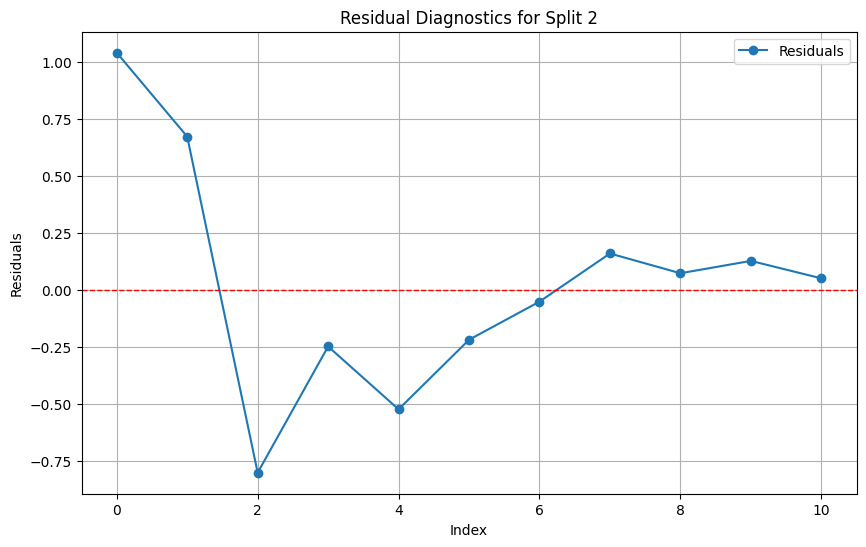

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.3311, MSE=0.1938, RMSE=0.4402, MAPE=10.34%
Residual ADF Statistic: -3.1507615518991416, p-value: 0.023017635557558307


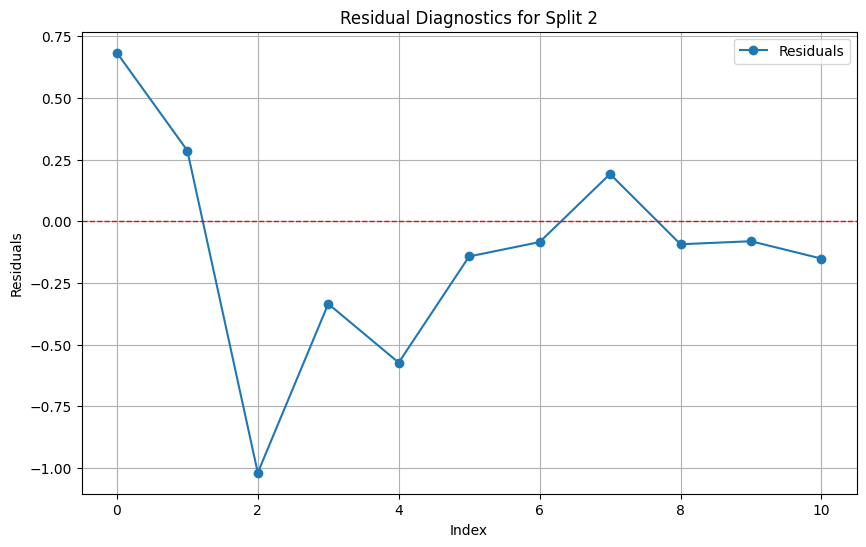

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.3610, MSE=0.2380, RMSE=0.4879, MAPE=12.12%
Residual ADF Statistic: -2.690271493796882, p-value: 0.07573690789059782


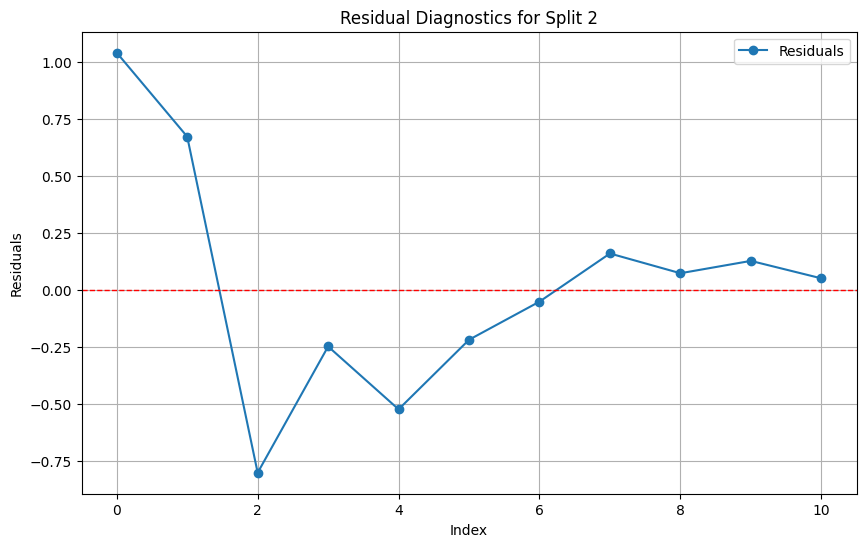

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.3311, MSE=0.1938, RMSE=0.4402, MAPE=10.34%
Residual ADF Statistic: -3.1507615518991416, p-value: 0.023017635557558307


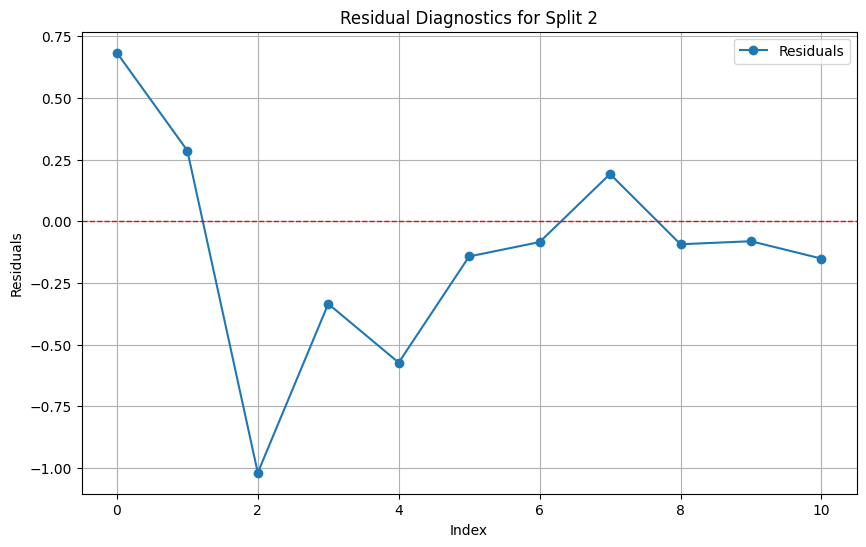

Processing Split 3...
Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=1.4497, MSE=2.1105, RMSE=1.4527, MAPE=1198.05%
Residual ADF Statistic: -2.605240036335326, p-value: 0.09191908763134116


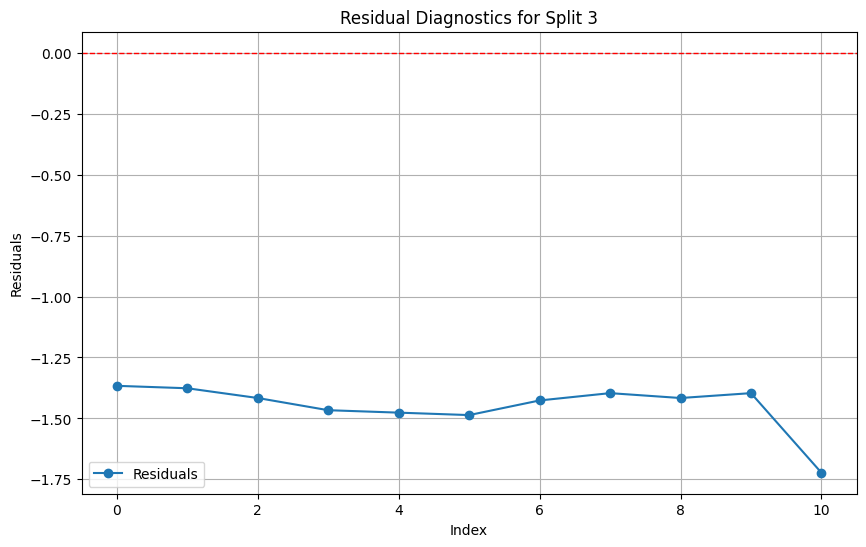

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=1.4408, MSE=2.0850, RMSE=1.4439, MAPE=1190.73%
Residual ADF Statistic: -2.597229807072747, p-value: 0.0935711627240523


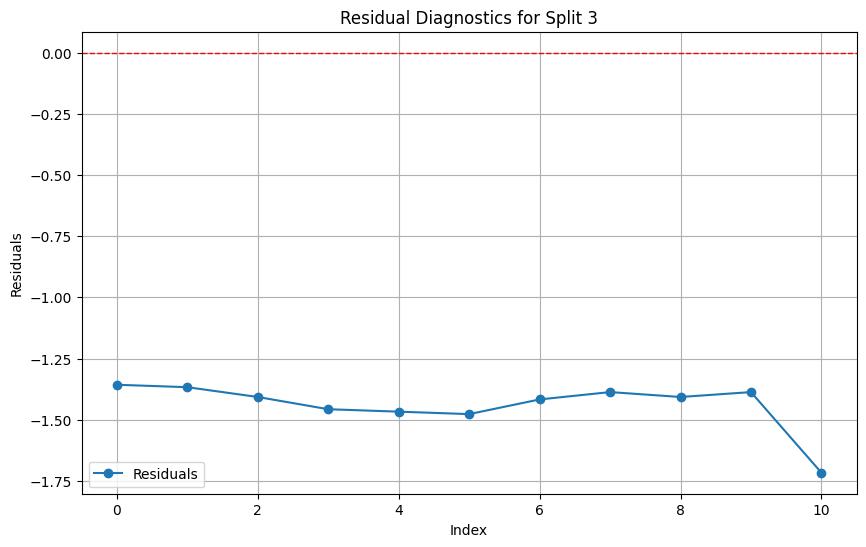

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.9475, MSE=0.9174, RMSE=0.9578, MAPE=784.27%
Residual ADF Statistic: -2.3096425410091825, p-value: 0.16887691738386706


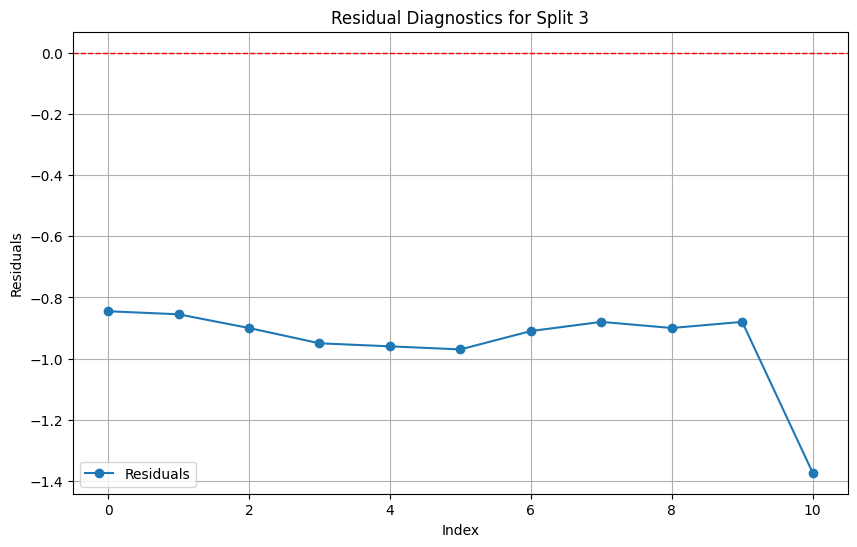

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.9336, MSE=0.8897, RMSE=0.9432, MAPE=772.73%
Residual ADF Statistic: -2.3379206996181296, p-value: 0.16002921675016413


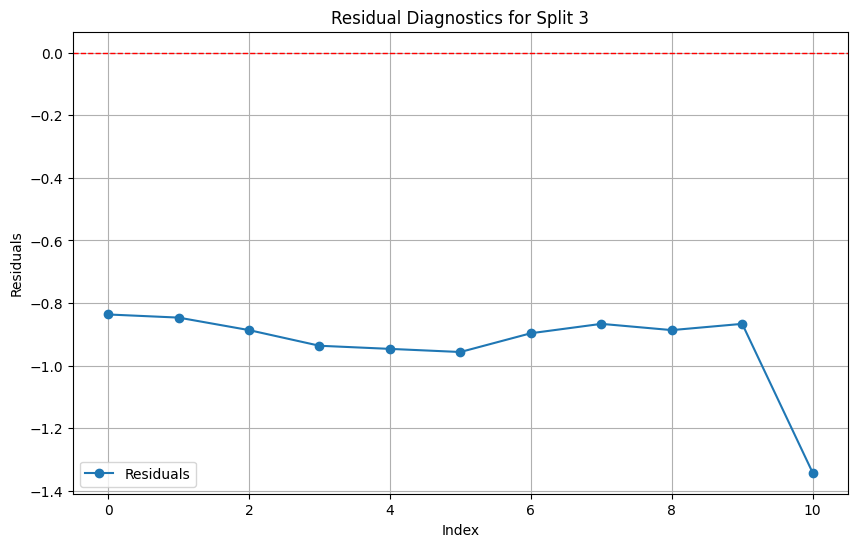

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.4501, MSE=0.2310, RMSE=0.4807, MAPE=375.02%
Residual ADF Statistic: -1.7685324422677833, p-value: 0.3961925364919183


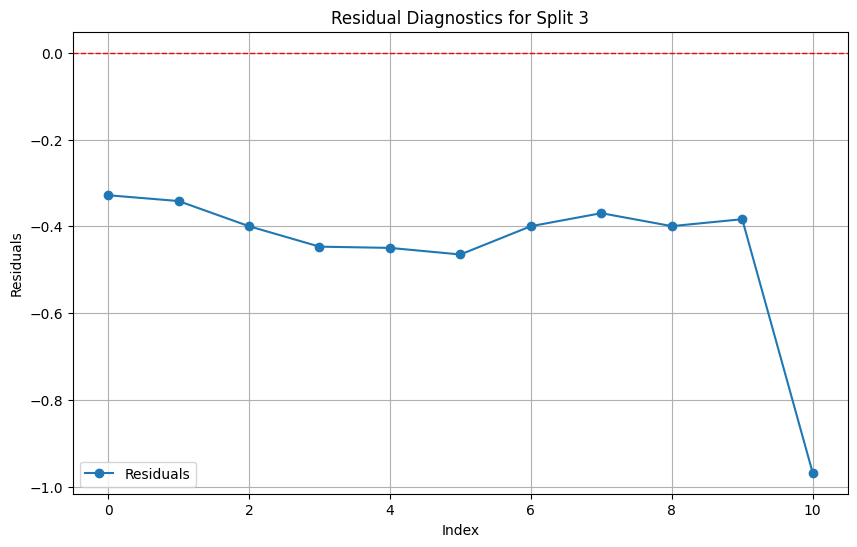

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.4468, MSE=0.2279, RMSE=0.4774, MAPE=374.59%
Residual ADF Statistic: -0.6685934668705865, p-value: 0.8547177080053463


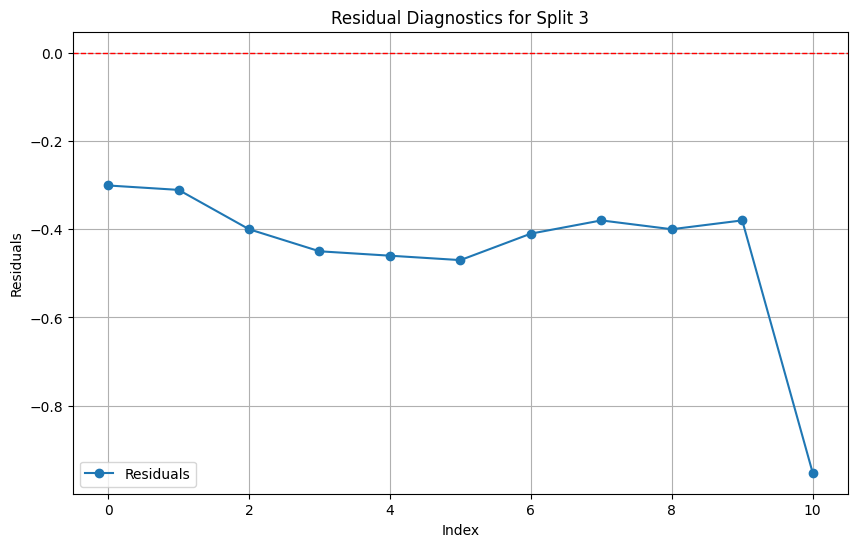

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=1.4512, MSE=2.1194, RMSE=1.4558, MAPE=1198.54%
Residual ADF Statistic: -2.4393110804531903, p-value: 0.13094706930708688


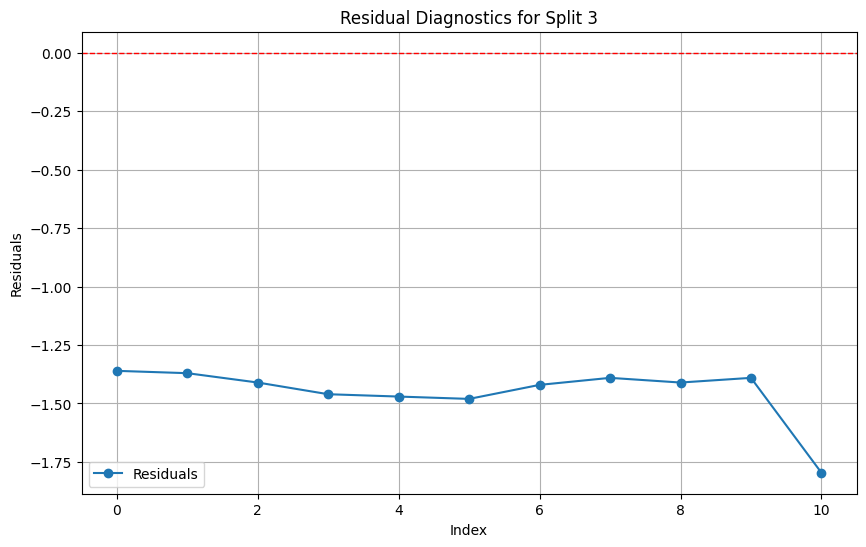

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=1.4444, MSE=2.1014, RMSE=1.4496, MAPE=1192.69%
Residual ADF Statistic: -2.39596494979569, p-value: 0.14287851209792185


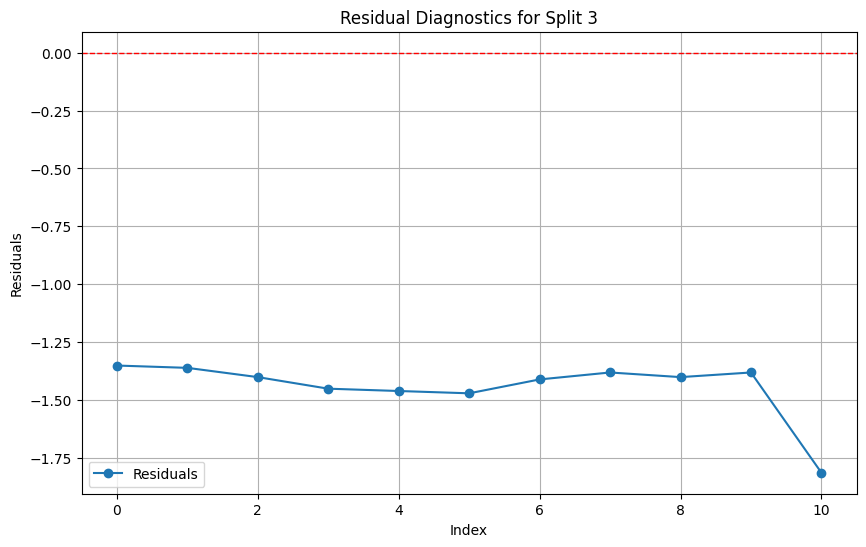

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.9479, MSE=0.9264, RMSE=0.9625, MAPE=783.59%
Residual ADF Statistic: -2.217948176592485, p-value: 0.19979591103652455


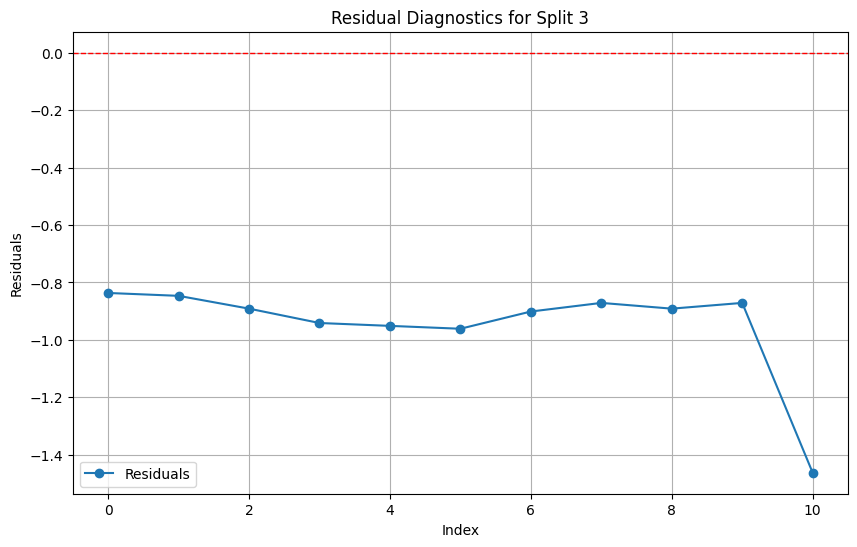

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.9279, MSE=0.8890, RMSE=0.9429, MAPE=767.00%
Residual ADF Statistic: -2.22228756645309, p-value: 0.19825601934579334


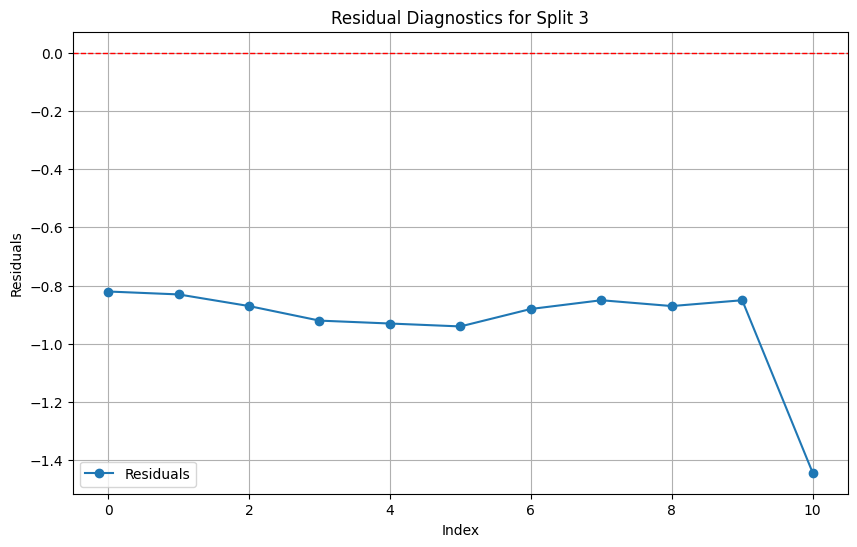

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.4428, MSE=0.2446, RMSE=0.4946, MAPE=368.13%
Residual ADF Statistic: -0.5131807534793011, p-value: 0.8894185941494569


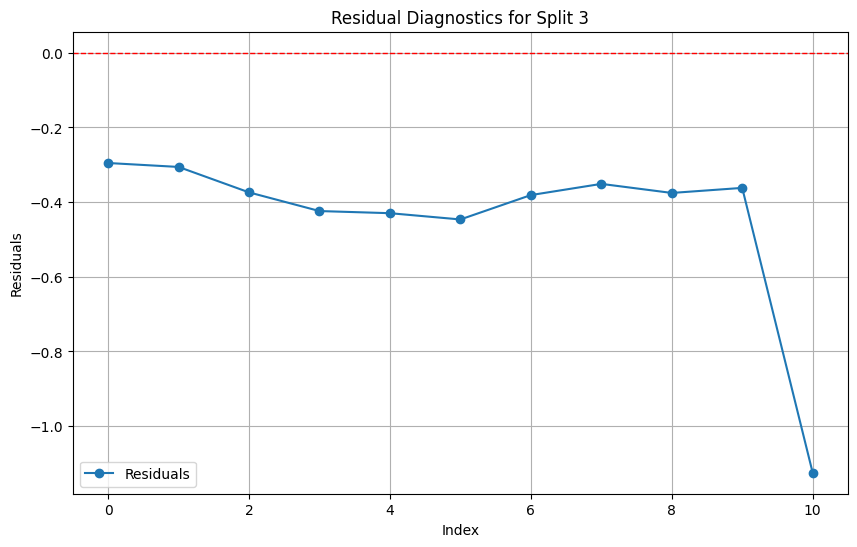

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.4224, MSE=0.2334, RMSE=0.4831, MAPE=351.21%
Residual ADF Statistic: -0.6248890411706027, p-value: 0.865258370799691


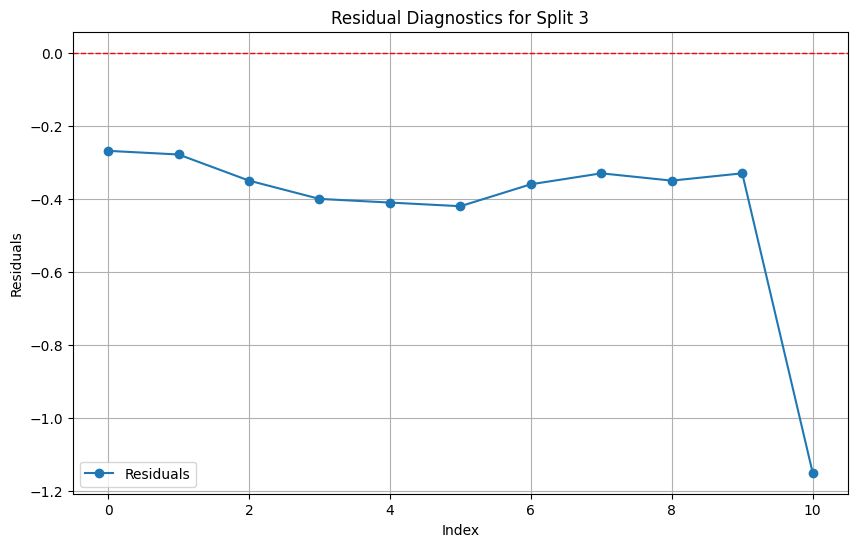

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=1.4511, MSE=2.1197, RMSE=1.4559, MAPE=1198.35%
Residual ADF Statistic: -2.423236599092849, p-value: 0.13528515938398916


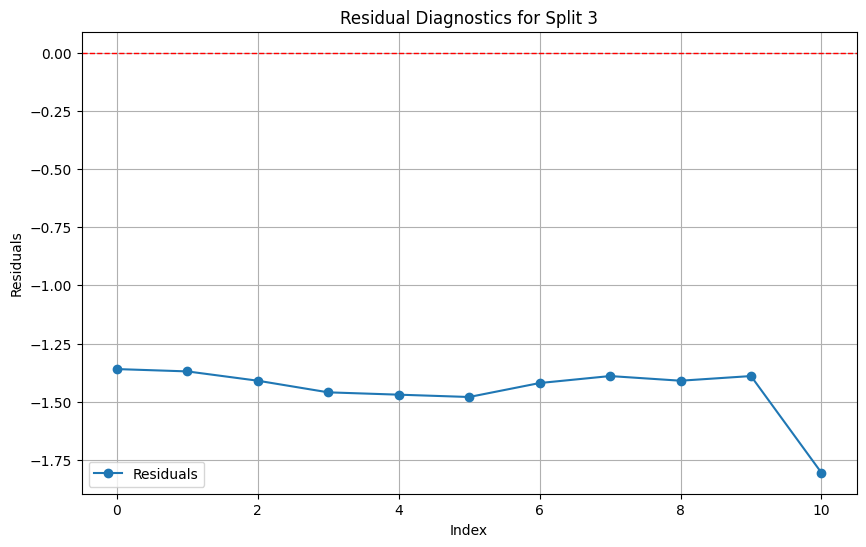

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=1.4444, MSE=2.1014, RMSE=1.4496, MAPE=1192.69%
Residual ADF Statistic: -2.39596494979569, p-value: 0.14287851209792185


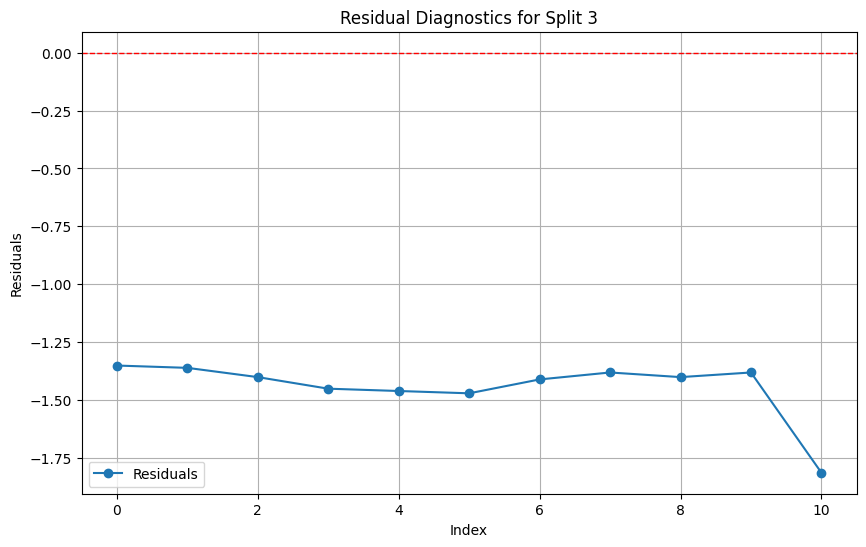

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.9474, MSE=0.9257, RMSE=0.9621, MAPE=783.24%
Residual ADF Statistic: -2.2174428541639433, p-value: 0.19997572432234145


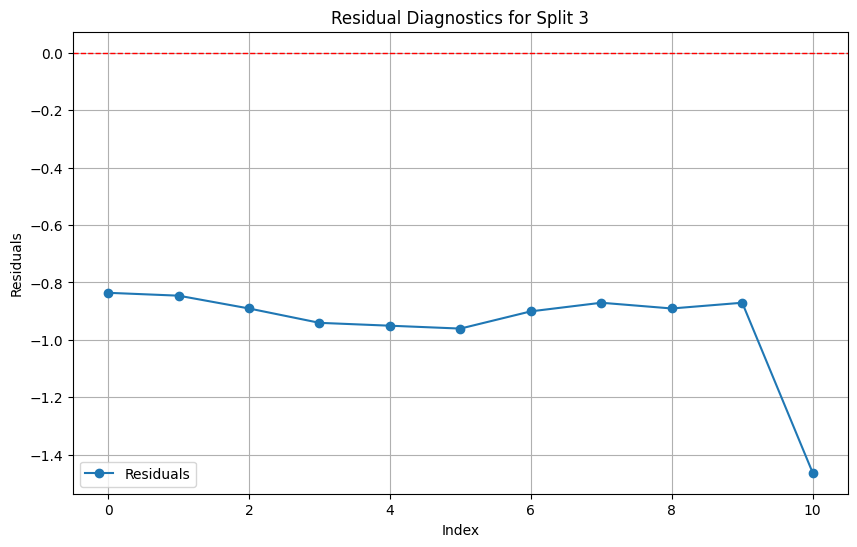

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.9266, MSE=0.8859, RMSE=0.9412, MAPE=765.95%
Residual ADF Statistic: -2.227610646444053, p-value: 0.19637741187271618


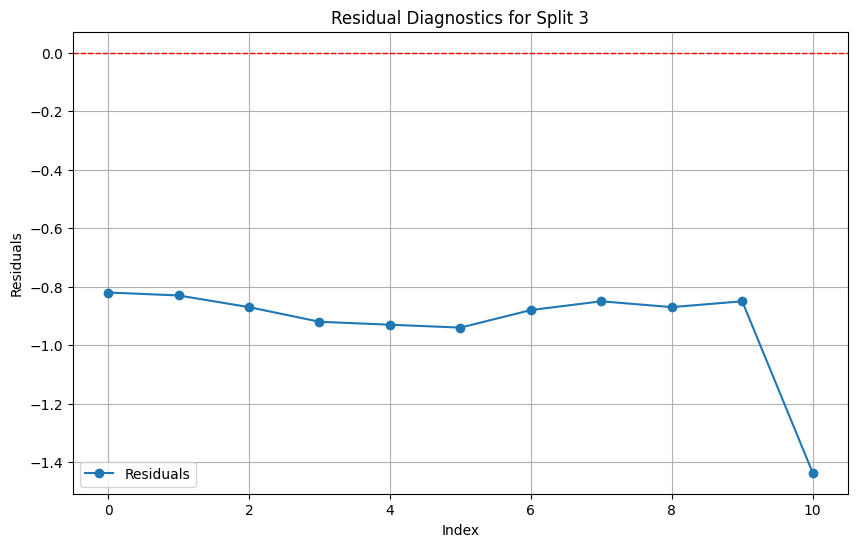

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.4434, MSE=0.2479, RMSE=0.4979, MAPE=368.49%
Residual ADF Statistic: -0.5217792235117082, p-value: 0.8876958988948038


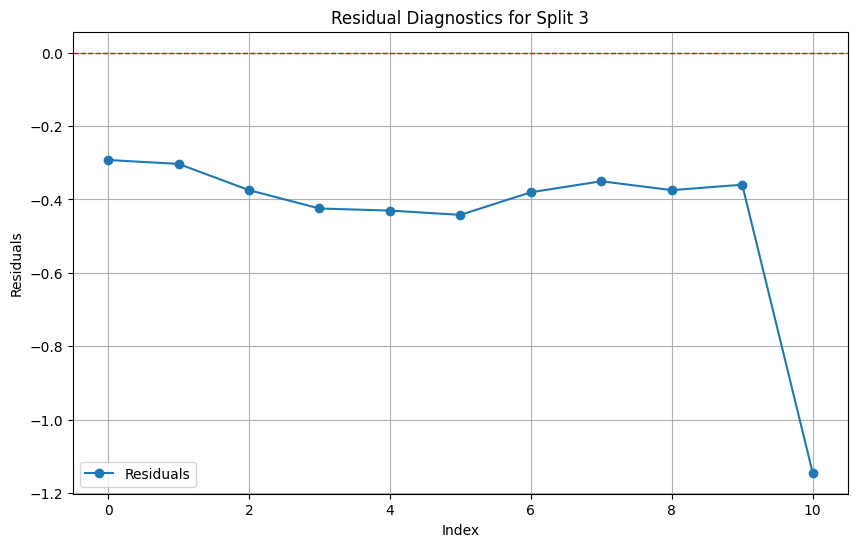

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.4413, MSE=0.2482, RMSE=0.4982, MAPE=368.28%
Residual ADF Statistic: -0.5353535913936565, p-value: 0.8849309005906787


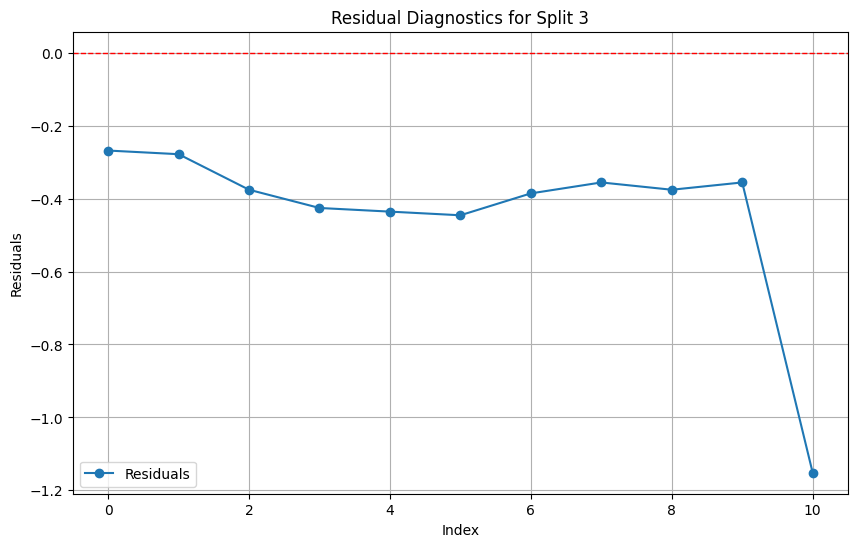

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.2209, MSE=0.0839, RMSE=0.2896, MAPE=177.47%
Residual ADF Statistic: -1.227142740525376, p-value: 0.661811984050209


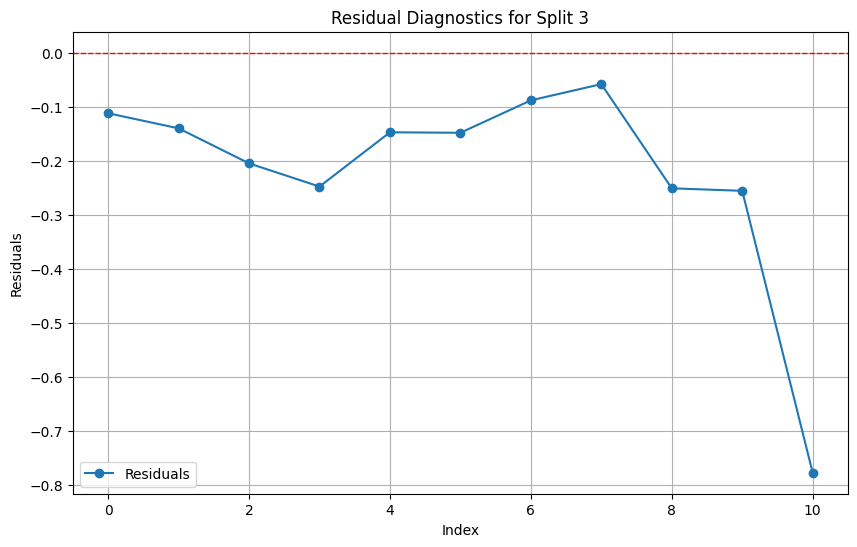

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.1609, MSE=0.0606, RMSE=0.2462, MAPE=134.54%
Residual ADF Statistic: -0.3880920968264086, p-value: 0.9120680661604625


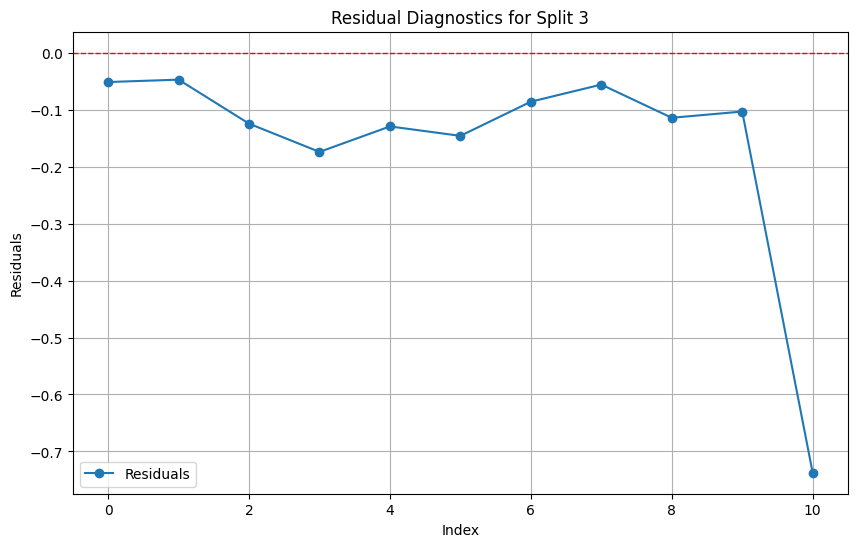

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.1984, MSE=0.0770, RMSE=0.2775, MAPE=163.13%
Residual ADF Statistic: -1.4592114343295823, p-value: 0.5535838046417214


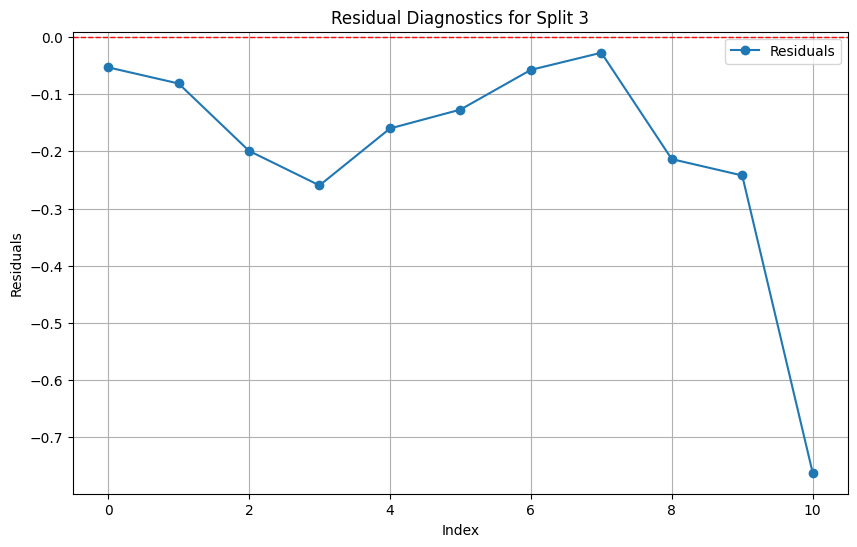

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.1575, MSE=0.0600, RMSE=0.2449, MAPE=132.60%
Residual ADF Statistic: 0.10280052736844449, p-value: 0.966251779743991


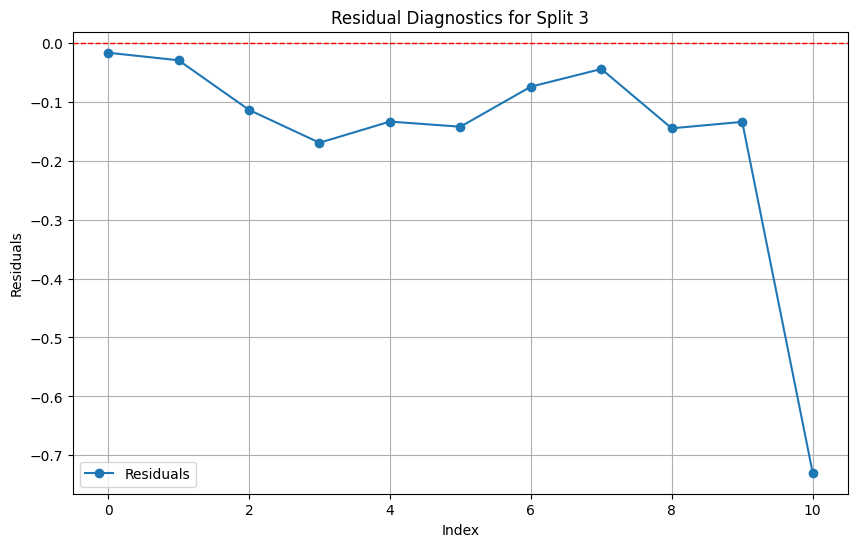

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.2122, MSE=0.0847, RMSE=0.2911, MAPE=177.22%
Residual ADF Statistic: 0.684436613797764, p-value: 0.9895221026705129


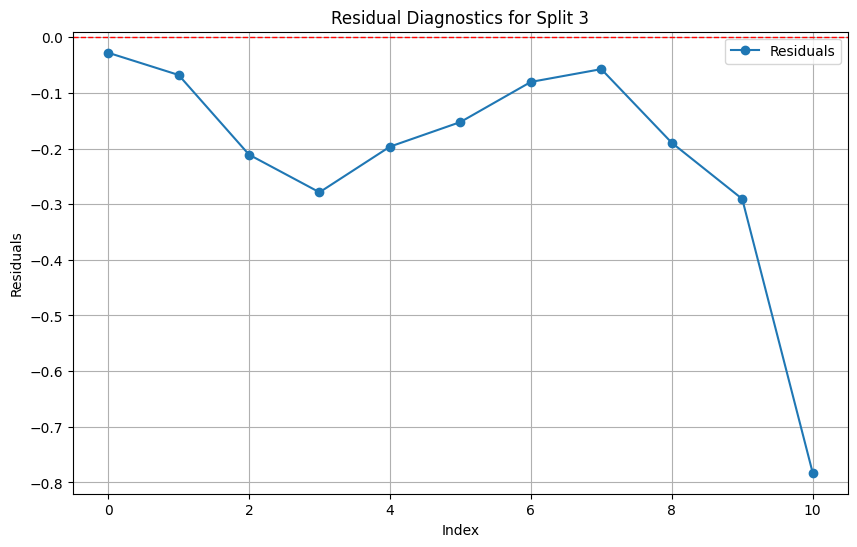

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.1654, MSE=0.0682, RMSE=0.2611, MAPE=141.85%
Residual ADF Statistic: 0.513995113226553, p-value: 0.9852923161633778


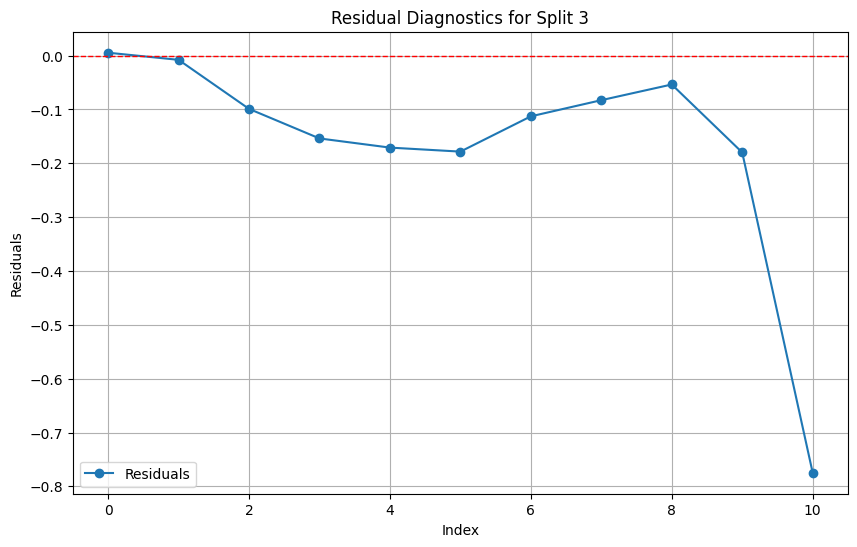

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.1767, MSE=0.0994, RMSE=0.3152, MAPE=149.25%
Residual ADF Statistic: -0.40218798063558253, p-value: 0.9097328214832944


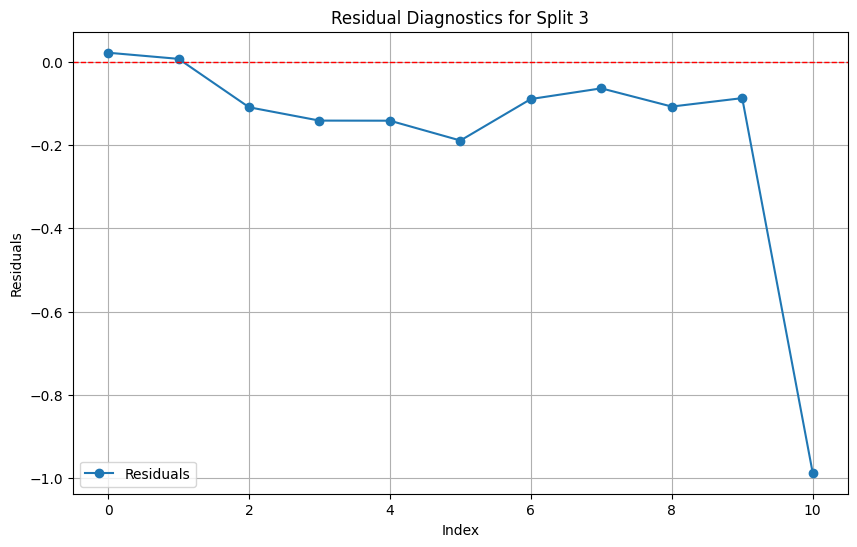

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.1626, MSE=0.0868, RMSE=0.2946, MAPE=137.33%
Residual ADF Statistic: -0.6895519811337373, p-value: 0.8494372807177653


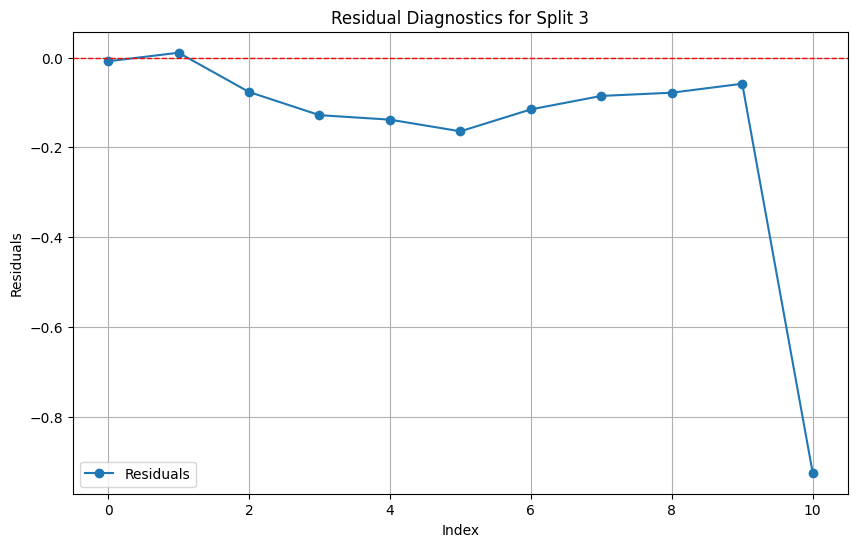

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.1751, MSE=0.0943, RMSE=0.3070, MAPE=146.40%
Residual ADF Statistic: -0.3196151003193348, p-value: 0.9226799377517092


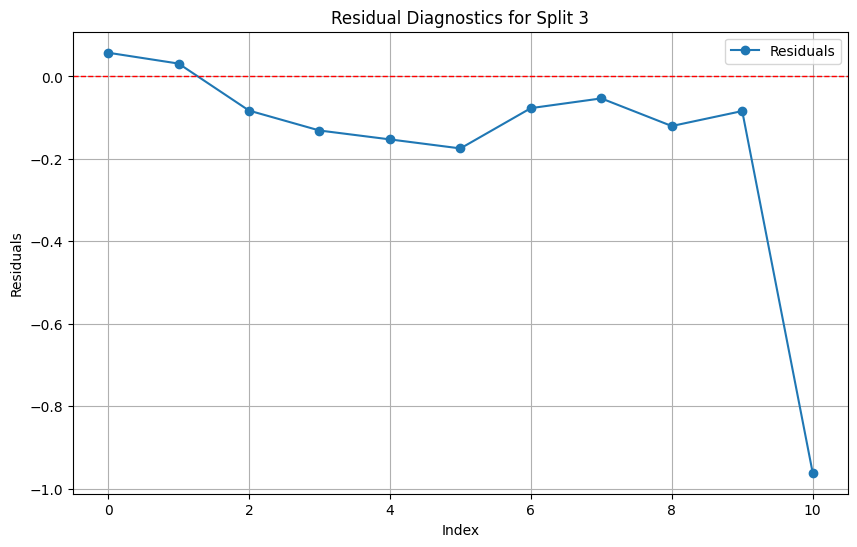

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.1575, MSE=0.0828, RMSE=0.2878, MAPE=132.84%
Residual ADF Statistic: -0.8452419996397543, p-value: 0.8054701493133087


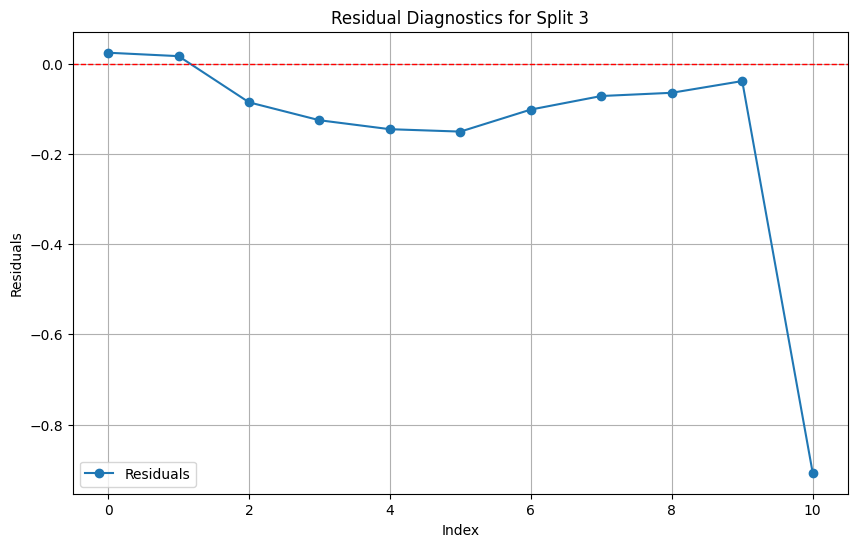

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.1749, MSE=0.0946, RMSE=0.3075, MAPE=146.77%
Residual ADF Statistic: -0.3258072728812602, p-value: 0.9217688874611867


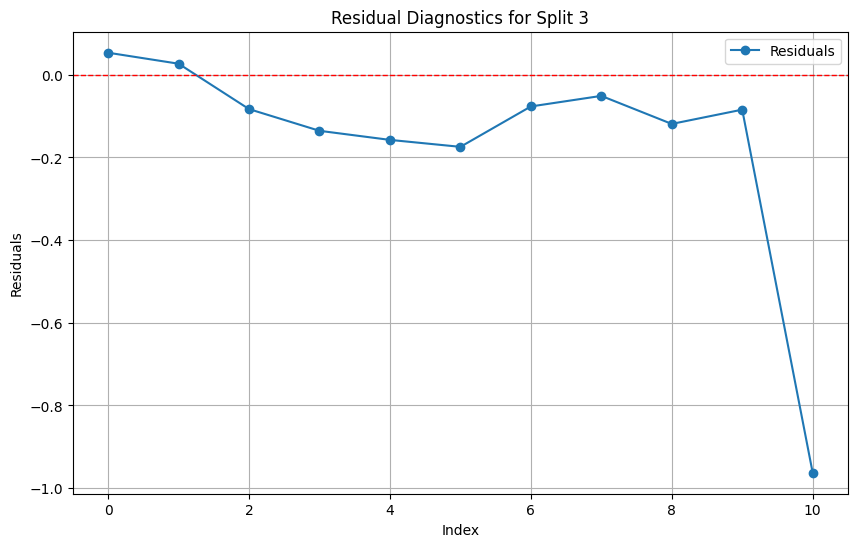

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.1577, MSE=0.0820, RMSE=0.2863, MAPE=133.39%
Residual ADF Statistic: -0.9124029172509719, p-value: 0.7838605231425102


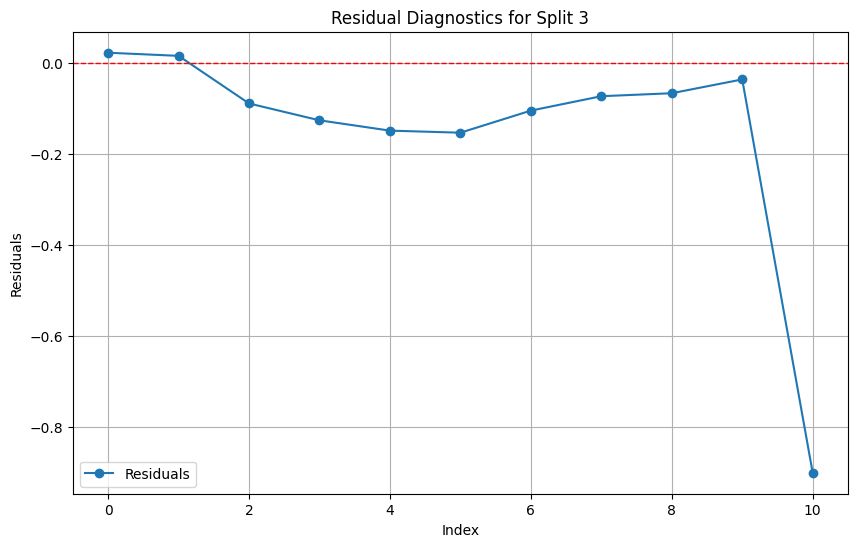

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.1546, MSE=0.0973, RMSE=0.3119, MAPE=127.06%
Residual ADF Statistic: -0.3800076768910731, p-value: 0.913383646449


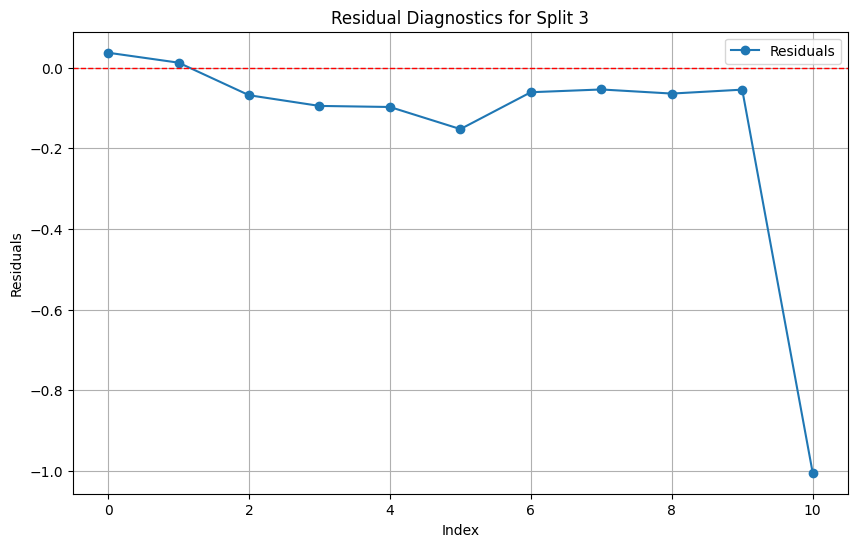

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.1530, MSE=0.0845, RMSE=0.2908, MAPE=125.92%
Residual ADF Statistic: -0.13178297855139745, p-value: 0.9461793604475993


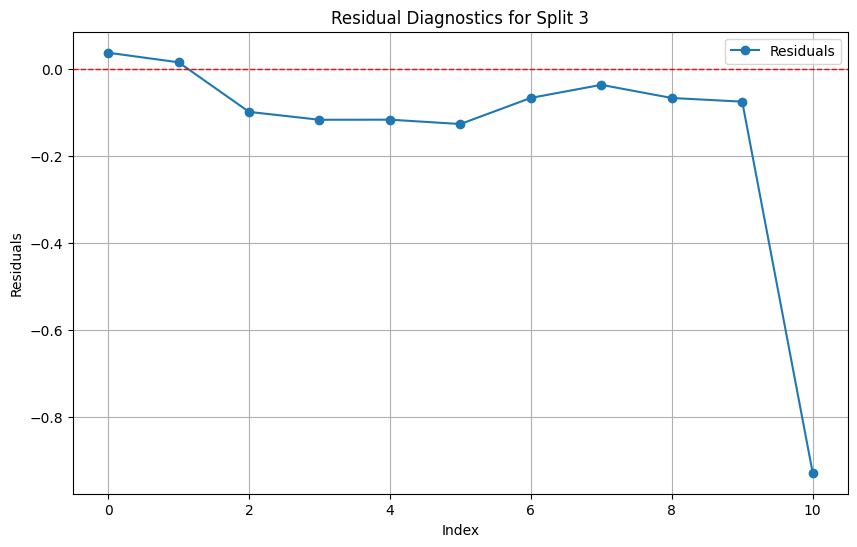

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.1380, MSE=0.0902, RMSE=0.3003, MAPE=111.06%
Residual ADF Statistic: -0.2945075438952346, p-value: 0.9262786341646784


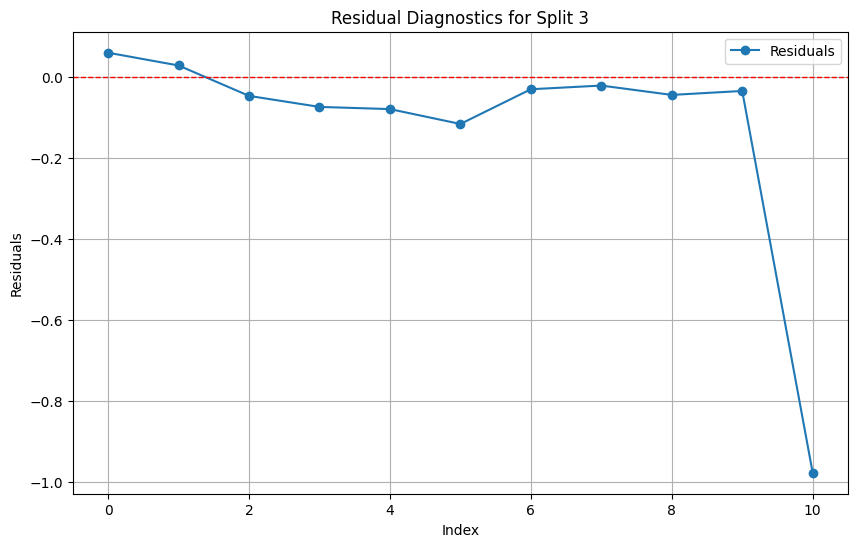

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.1375, MSE=0.0776, RMSE=0.2785, MAPE=112.02%
Residual ADF Statistic: -0.3044258830121223, p-value: 0.9248751514826732


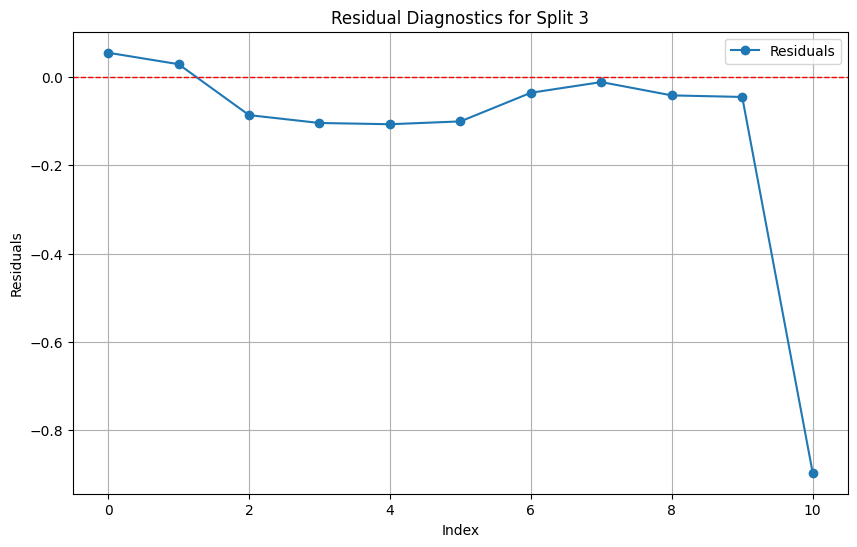

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.1344, MSE=0.0889, RMSE=0.2981, MAPE=107.77%
Residual ADF Statistic: -0.27723750816967324, p-value: 0.9286668846637244


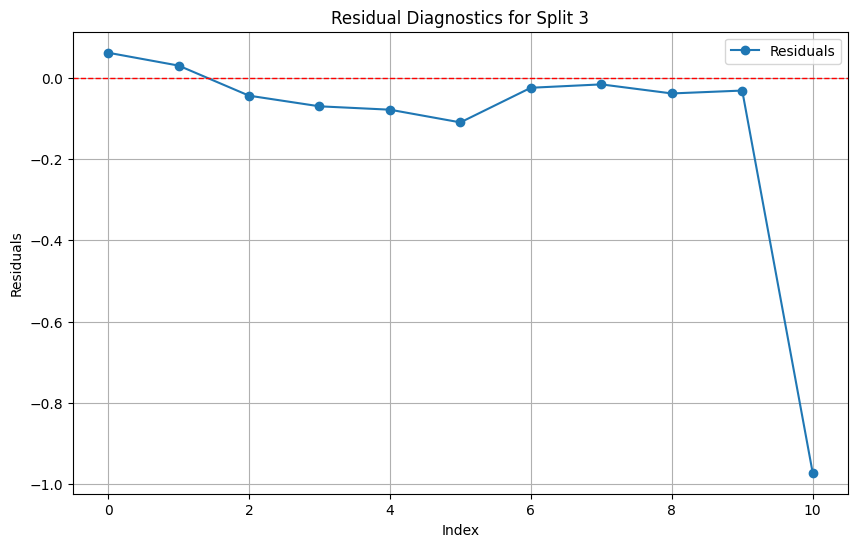

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.1369, MSE=0.0772, RMSE=0.2778, MAPE=111.63%
Residual ADF Statistic: -0.3168919623979965, p-value: 0.923077618854002


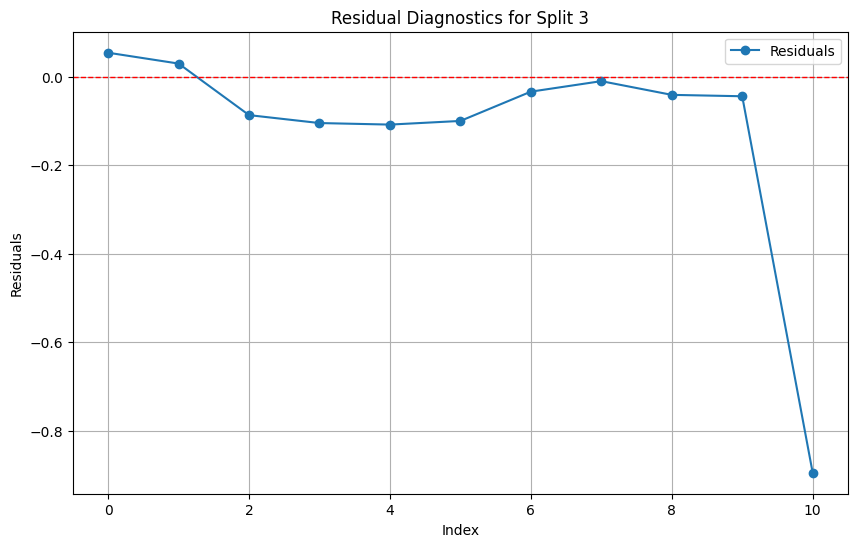

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.3094, MSE=0.1385, RMSE=0.3722, MAPE=266.83%
Residual ADF Statistic: -0.223945966252531, p-value: 0.9356064776768066


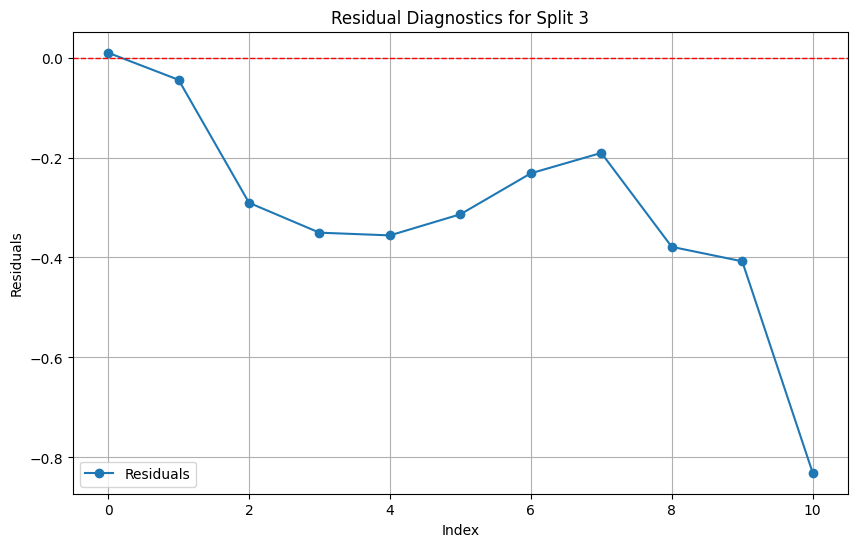

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.1612, MSE=0.0670, RMSE=0.2589, MAPE=135.21%
Residual ADF Statistic: -0.006629568895433743, p-value: 0.9579803793269009


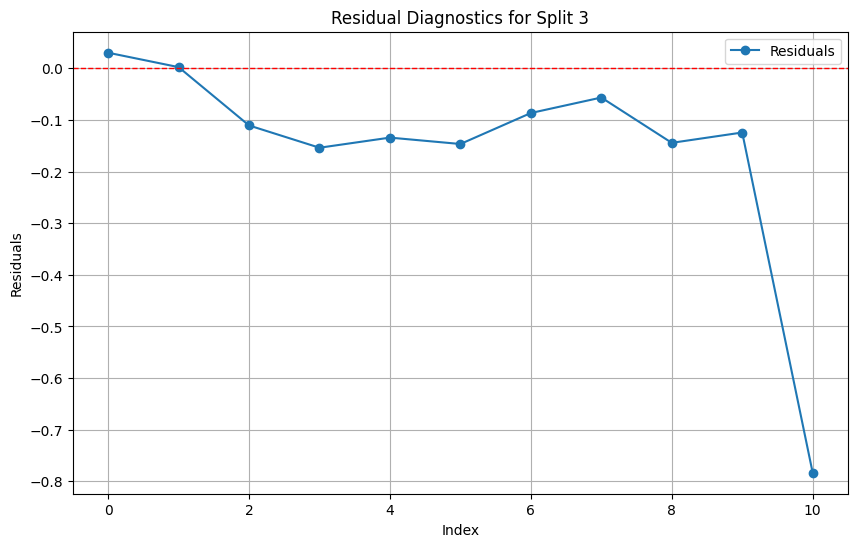

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.3325, MSE=0.1559, RMSE=0.3949, MAPE=287.14%
Residual ADF Statistic: -0.22774022364089147, p-value: 0.9351332638264959


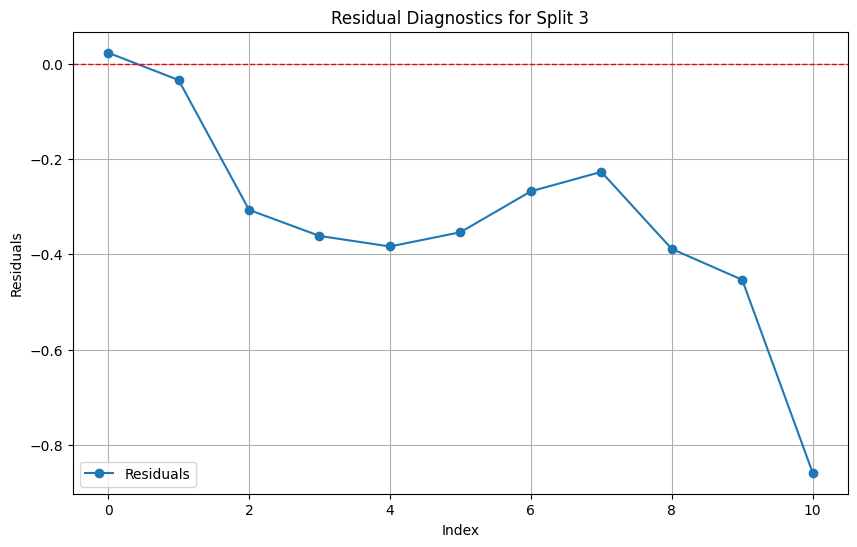

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.1707, MSE=0.0738, RMSE=0.2716, MAPE=143.87%
Residual ADF Statistic: 0.49254858666905543, p-value: 0.9846448482732687


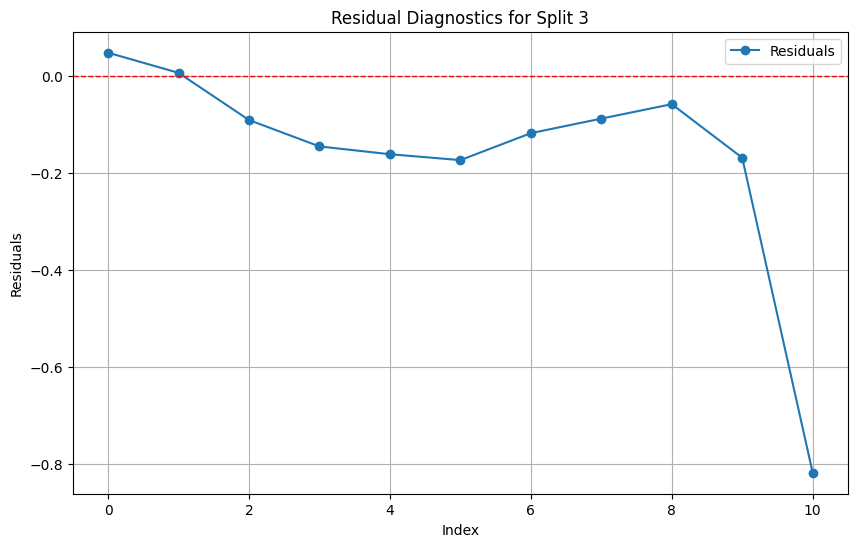

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.3316, MSE=0.1548, RMSE=0.3934, MAPE=286.25%
Residual ADF Statistic: -0.21702680948189373, p-value: 0.9364614001088005


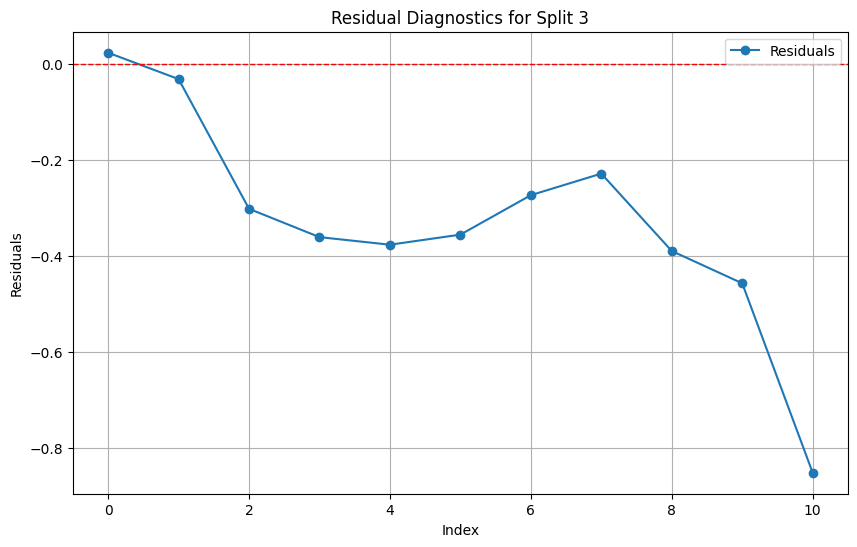

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.1854, MSE=0.0829, RMSE=0.2879, MAPE=158.09%
Residual ADF Statistic: -0.5974678263431863, p-value: 0.8715531684162112


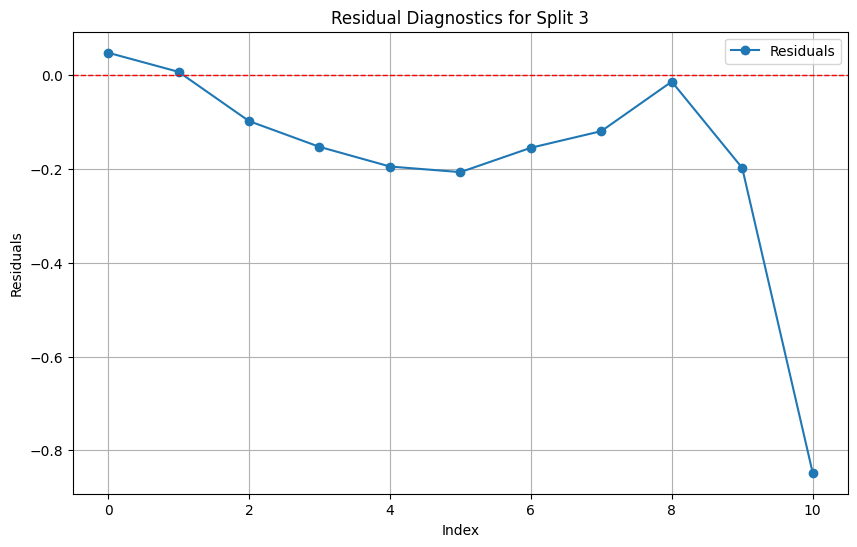

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.1612, MSE=0.0828, RMSE=0.2877, MAPE=134.74%
Residual ADF Statistic: -1.9972727974812372, p-value: 0.2877701612368896


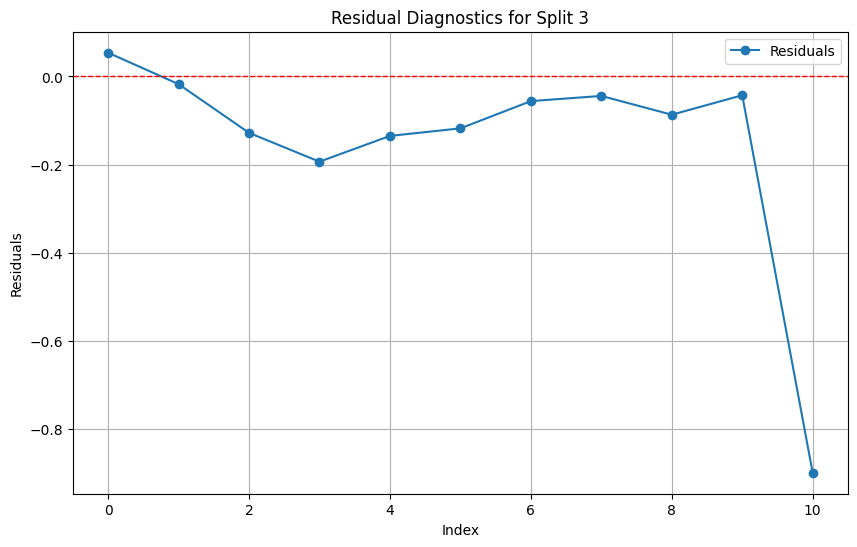

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.1416, MSE=0.0999, RMSE=0.3161, MAPE=114.19%
Residual ADF Statistic: -0.39170770384804926, p-value: 0.9114741146046574


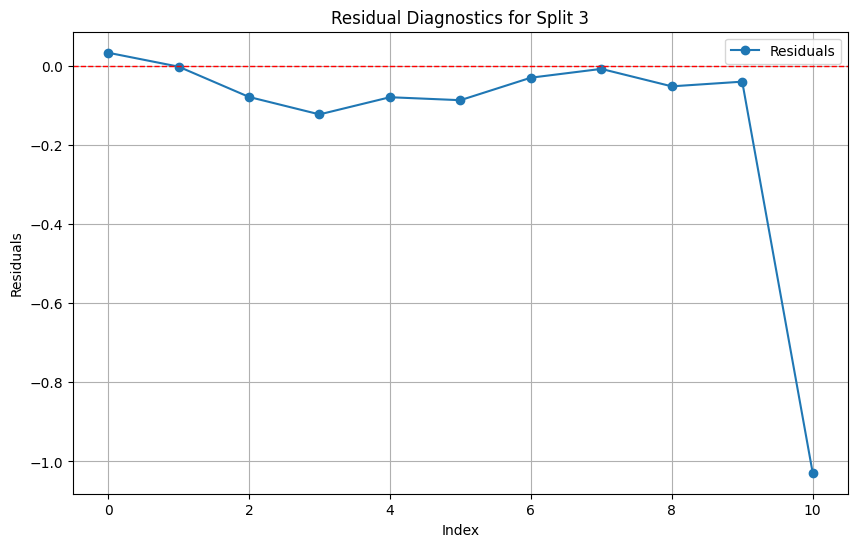

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.1627, MSE=0.0828, RMSE=0.2877, MAPE=136.20%
Residual ADF Statistic: -1.8422825935609446, p-value: 0.3596806656399093


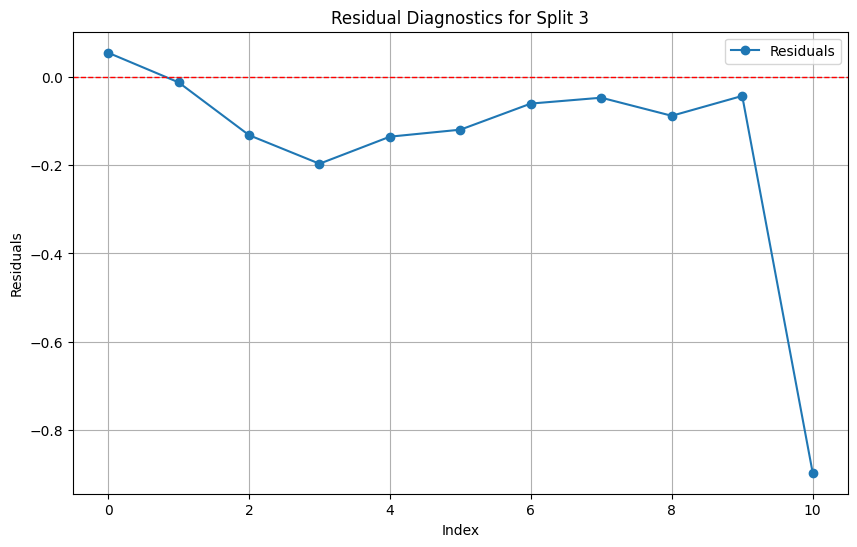

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.1415, MSE=0.0988, RMSE=0.3143, MAPE=114.44%
Residual ADF Statistic: -0.4977806494472215, p-value: 0.892448860830444


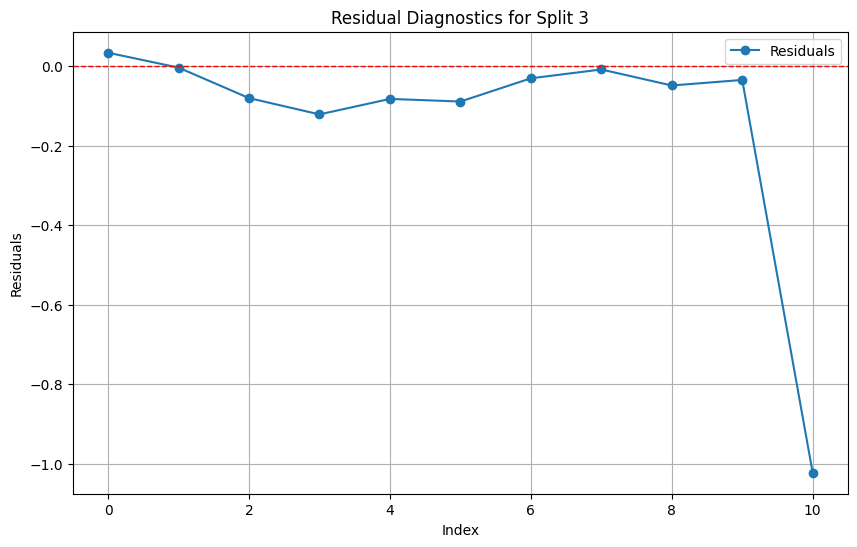

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.1626, MSE=0.0827, RMSE=0.2876, MAPE=136.17%
Residual ADF Statistic: -1.8404131857258956, p-value: 0.36059016203387656


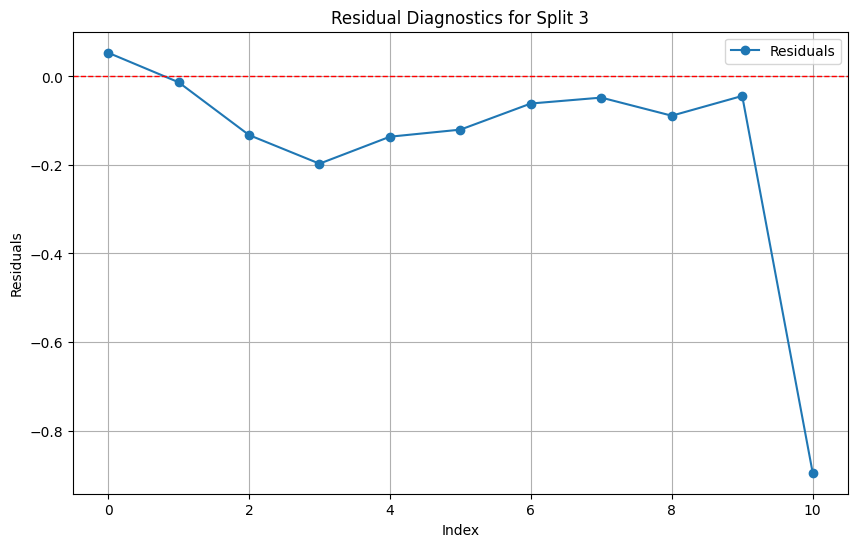

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.1415, MSE=0.0988, RMSE=0.3143, MAPE=114.43%
Residual ADF Statistic: -0.4977804857543477, p-value: 0.8924488926667771


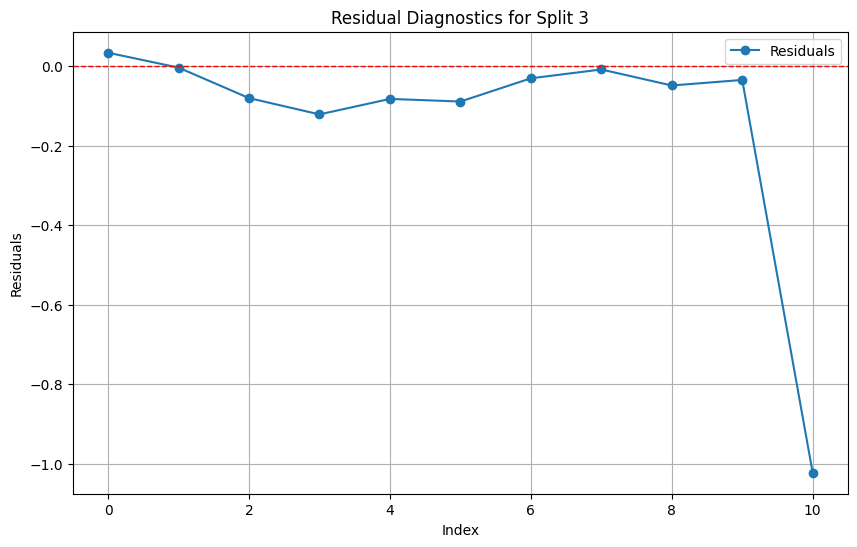

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.2044, MSE=0.1058, RMSE=0.3253, MAPE=169.80%
Residual ADF Statistic: -0.4836820133722764, p-value: 0.8951616979788777


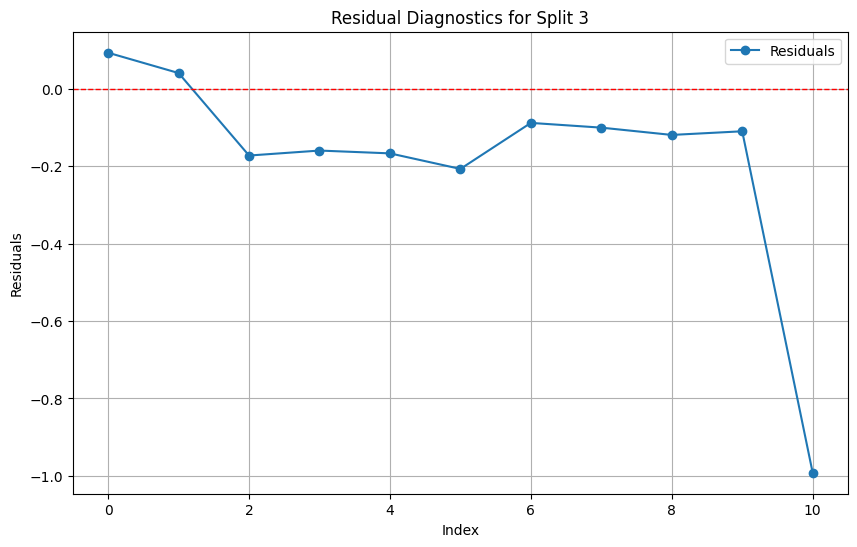

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.1587, MSE=0.1083, RMSE=0.3291, MAPE=128.98%
Residual ADF Statistic: -0.04655259812369895, p-value: 0.9545086783704886


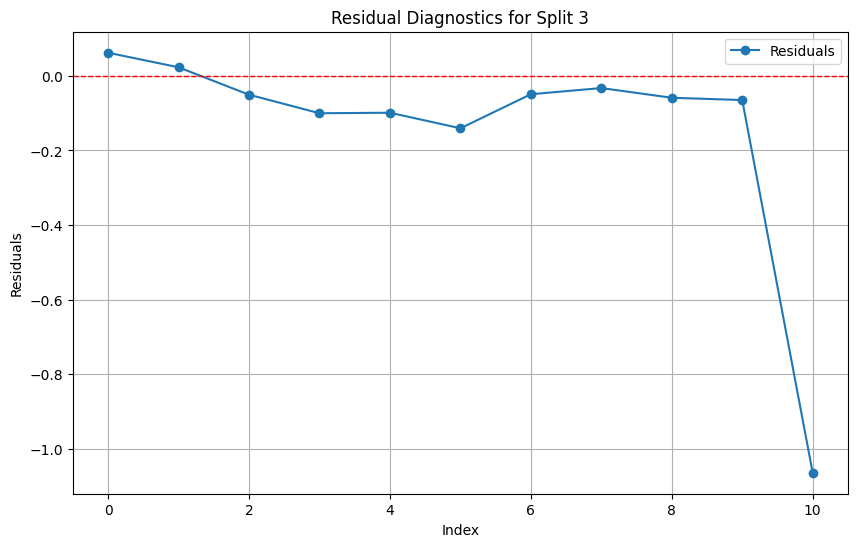

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.2027, MSE=0.1052, RMSE=0.3243, MAPE=168.30%
Residual ADF Statistic: -0.47618398085212416, p-value: 0.8965808405689121


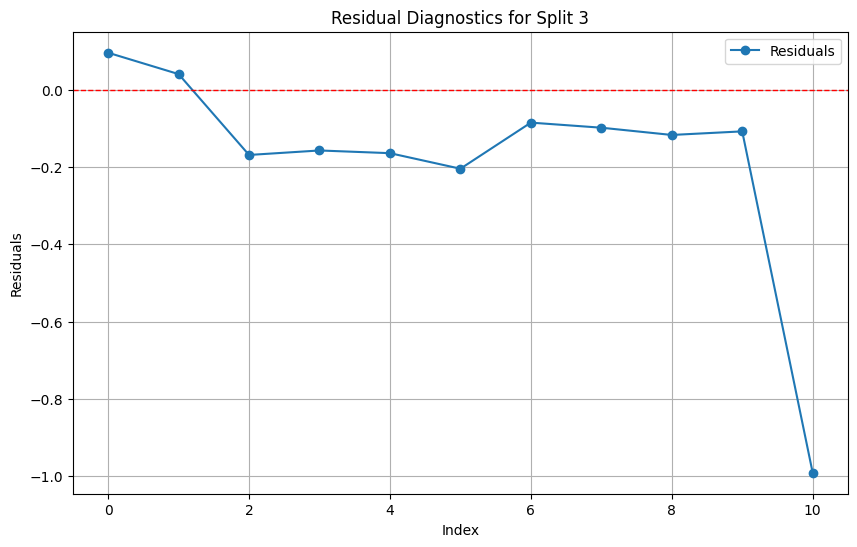

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.1586, MSE=0.1076, RMSE=0.3280, MAPE=129.11%
Residual ADF Statistic: -0.05352014550051317, p-value: 0.9538757871800255


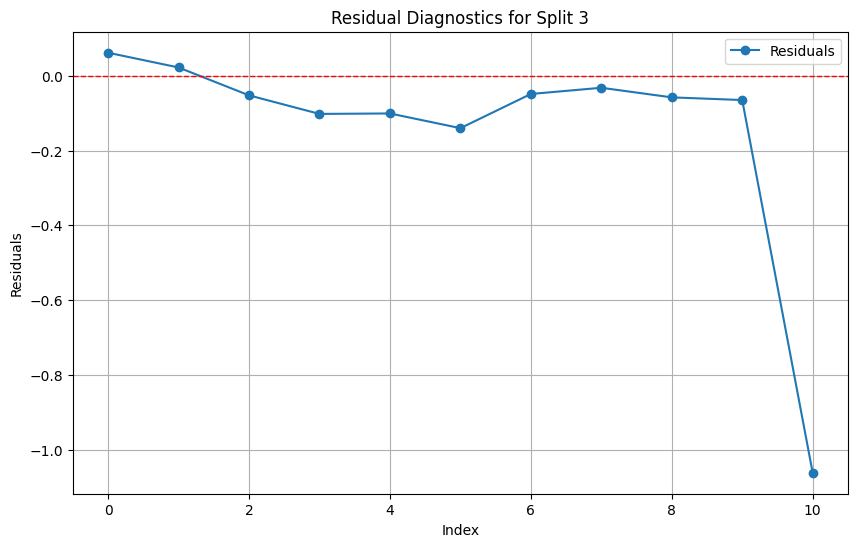

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.2029, MSE=0.1053, RMSE=0.3244, MAPE=168.47%
Residual ADF Statistic: -0.4743688314587003, p-value: 0.8969219437994045


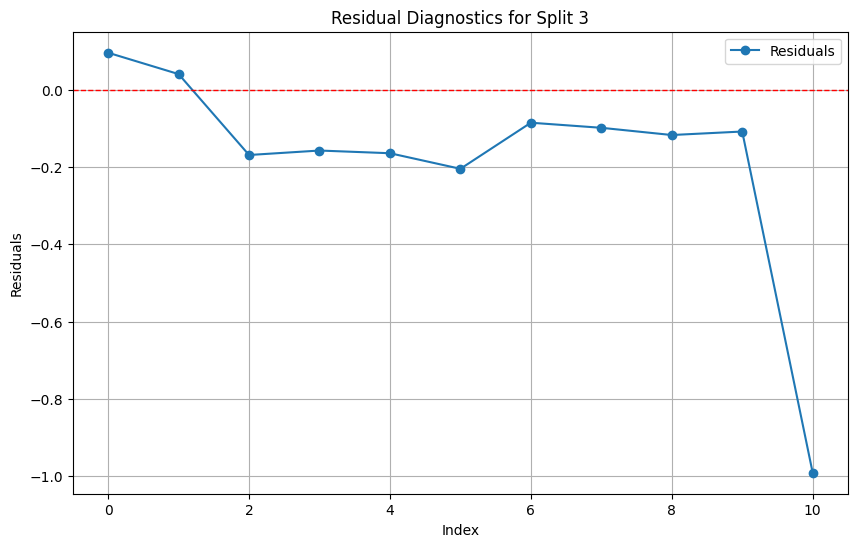

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.1586, MSE=0.1076, RMSE=0.3280, MAPE=129.11%
Residual ADF Statistic: -0.053519995199462406, p-value: 0.9538758009211222


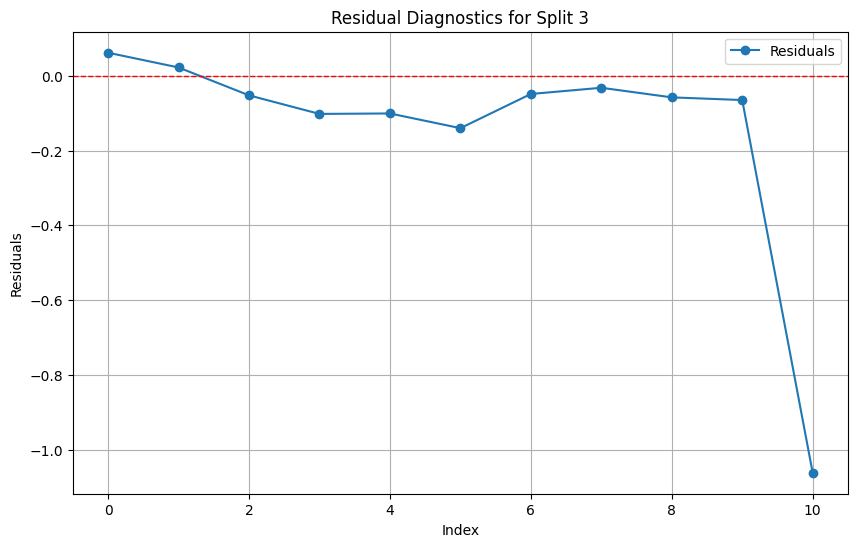

Processing Split 4...
Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.8112, MSE=0.8553, RMSE=0.9248, MAPE=123.48%
Residual ADF Statistic: -0.3595686391653839, p-value: 0.9166336599669315


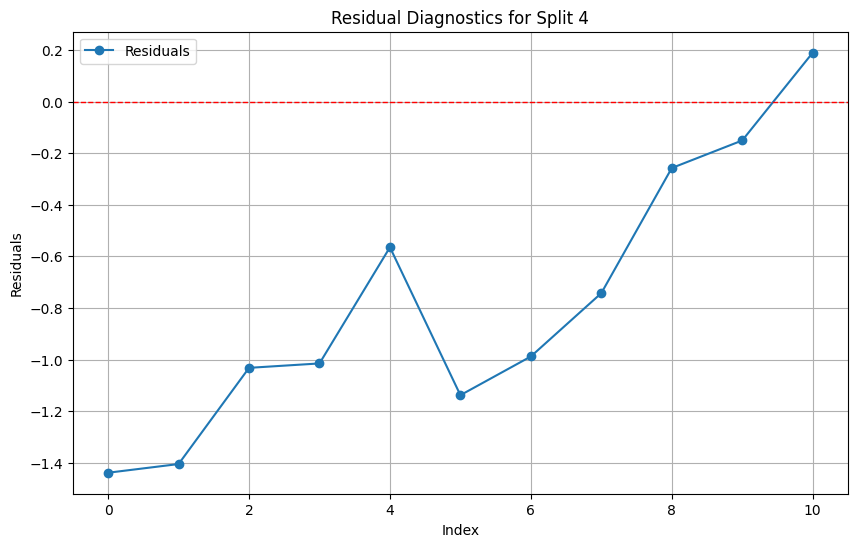

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.8594, MSE=0.9814, RMSE=0.9907, MAPE=131.39%
Residual ADF Statistic: -0.6667653536666306, p-value: 0.8551713036256647


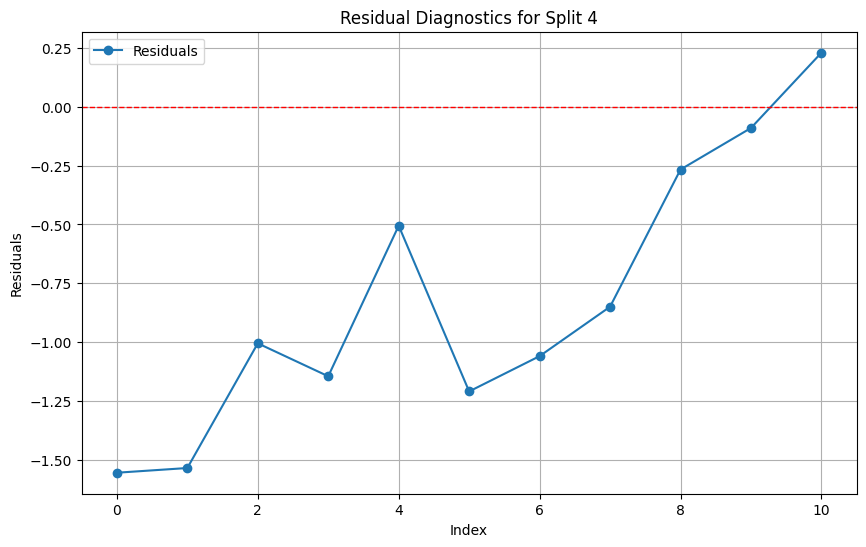

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.5390, MSE=0.4272, RMSE=0.6536, MAPE=82.28%
Residual ADF Statistic: -1.1580370637016588, p-value: 0.6913817796509024


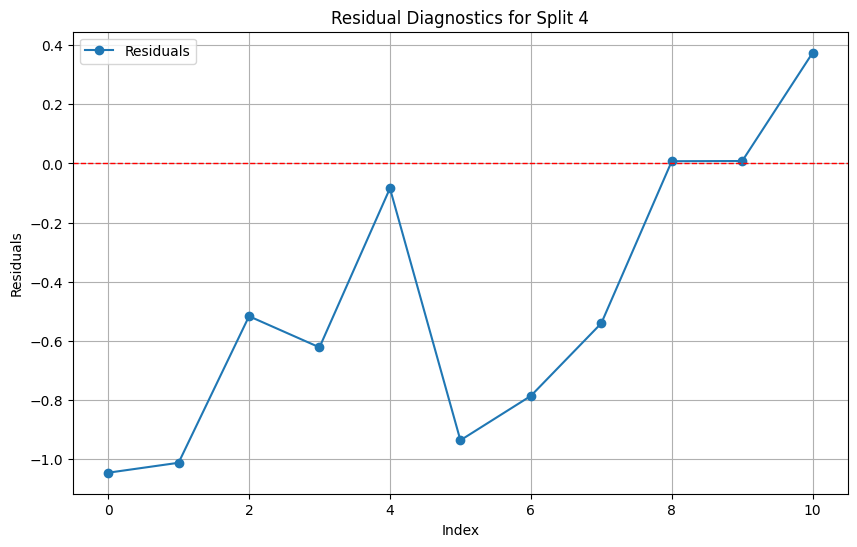

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.6368, MSE=0.6137, RMSE=0.7834, MAPE=97.82%
Residual ADF Statistic: -1.642587220977288, p-value: 0.4609092166561436


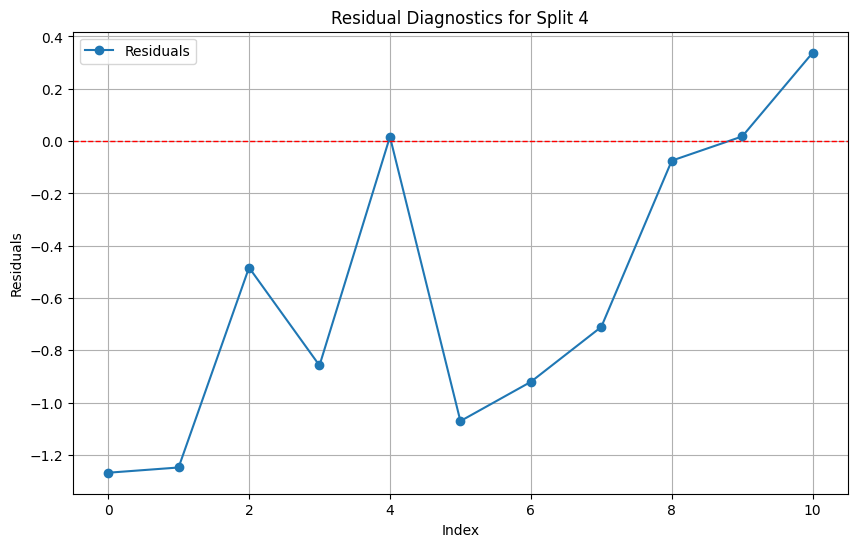

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.4253, MSE=0.2315, RMSE=0.4811, MAPE=56.41%
Residual ADF Statistic: -2.036580960405962, p-value: 0.2707674399258737


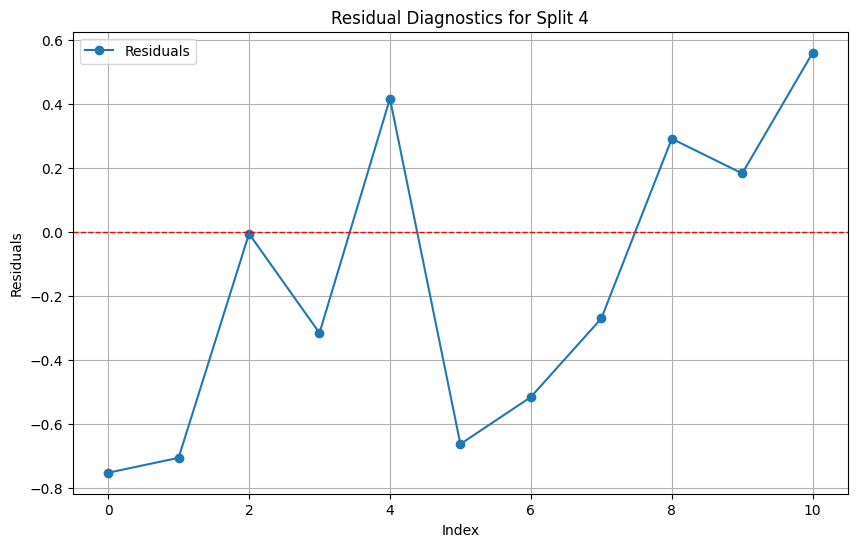

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.5331, MSE=0.3707, RMSE=0.6088, MAPE=75.39%
Residual ADF Statistic: -2.5165308300751787, p-value: 0.11150382831725197


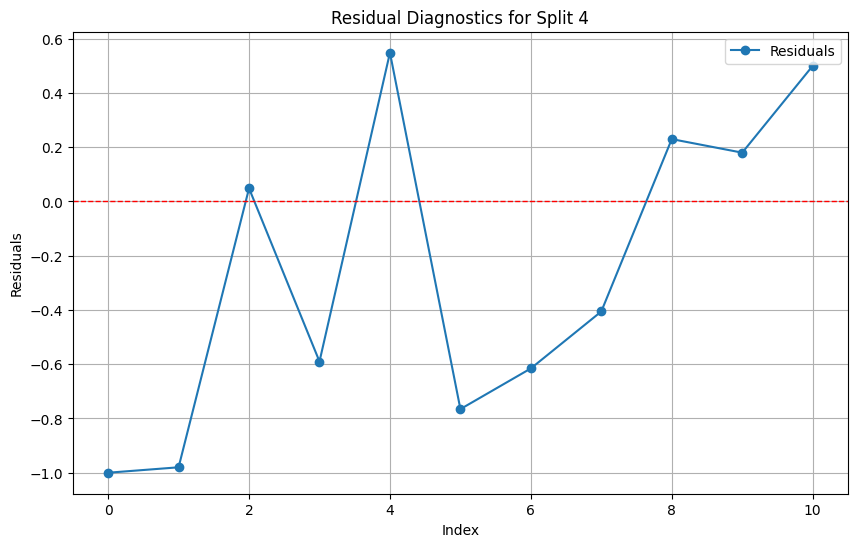

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.7609, MSE=0.7459, RMSE=0.8637, MAPE=113.24%
Residual ADF Statistic: -0.055050117924051185, p-value: 0.9537357122578554


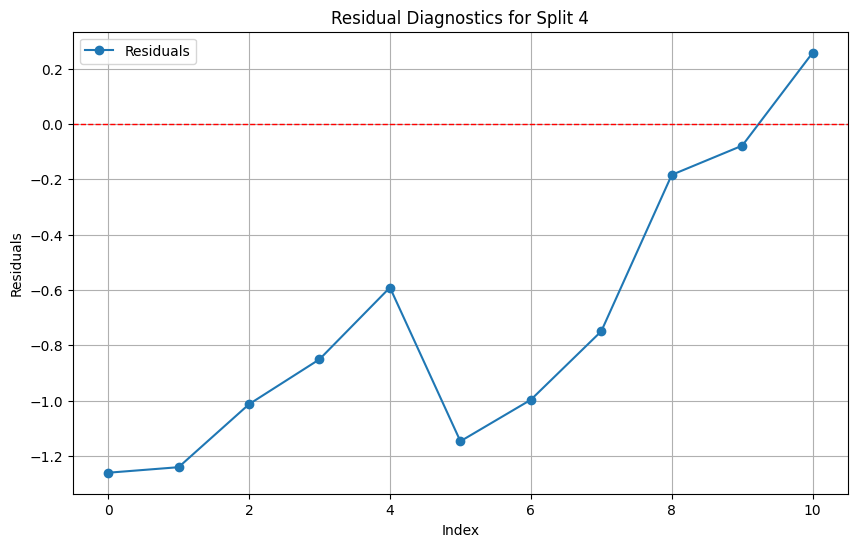

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.7629, MSE=0.7627, RMSE=0.8733, MAPE=109.12%
Residual ADF Statistic: -0.38139022004858203, p-value: 0.9131598829484484


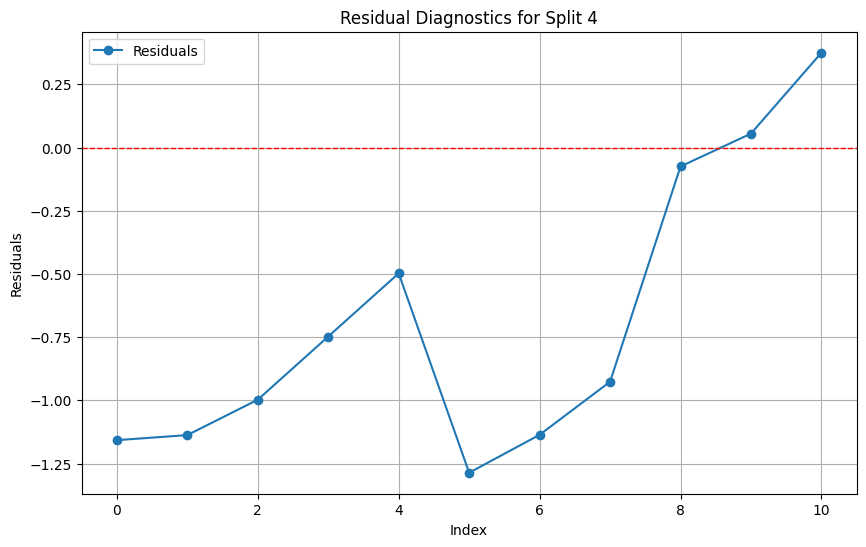

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.5131, MSE=0.3540, RMSE=0.5950, MAPE=69.56%
Residual ADF Statistic: -0.7788906677091647, p-value: 0.8252442740233654


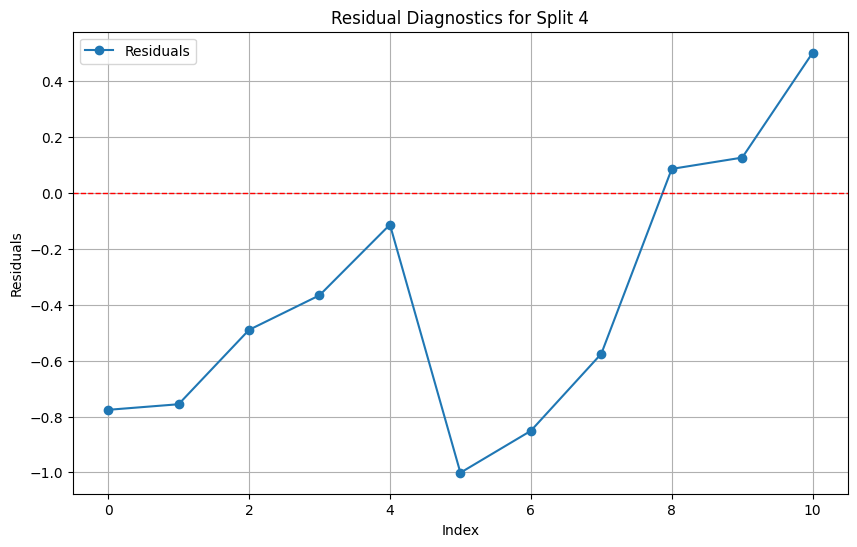

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.5758, MSE=0.4542, RMSE=0.6739, MAPE=66.79%
Residual ADF Statistic: -0.9874503045994896, p-value: 0.7578139501649376


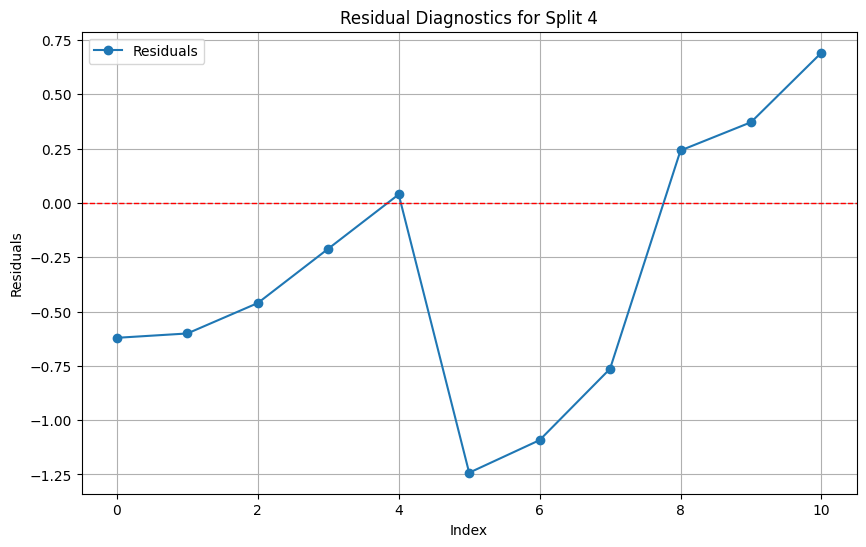

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.3900, MSE=0.2036, RMSE=0.4512, MAPE=38.36%
Residual ADF Statistic: -2.1988820186231184, p-value: 0.20665146980907195


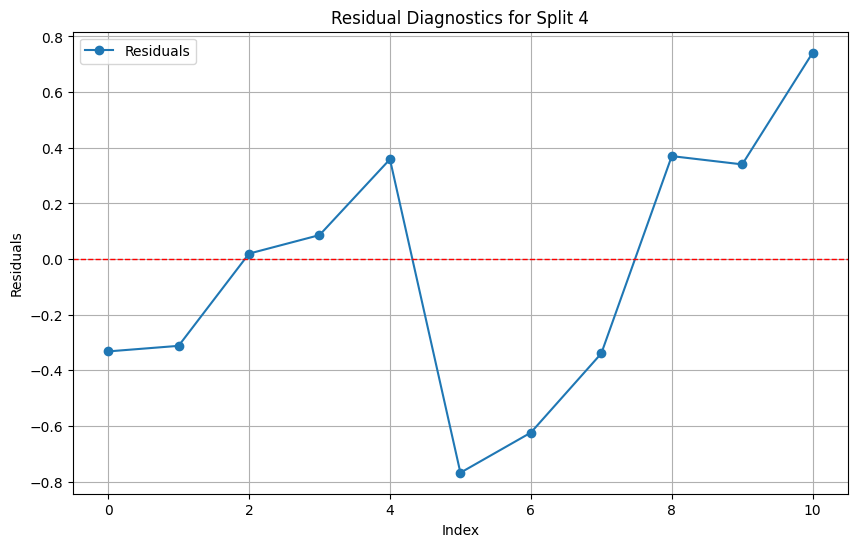

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.5359, MSE=0.4098, RMSE=0.6402, MAPE=41.73%
Residual ADF Statistic: -2.190175722036779, p-value: 0.20983040577057005


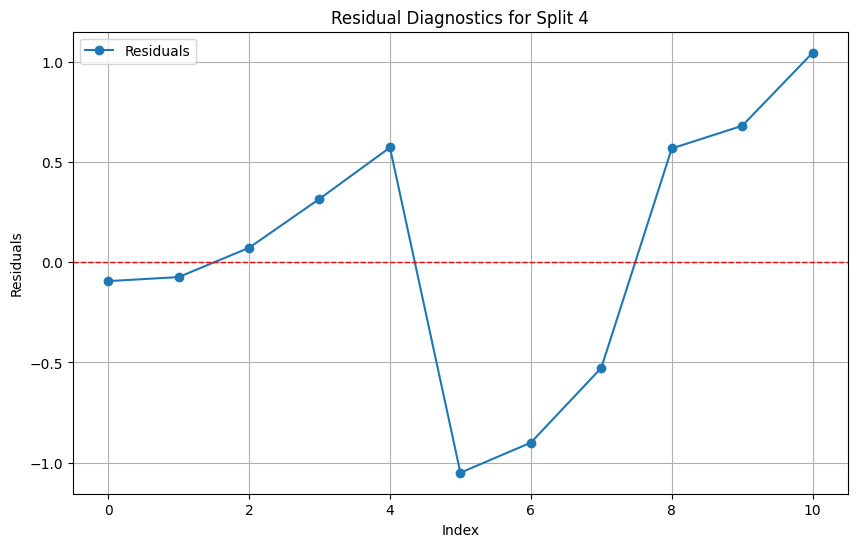

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.7591, MSE=0.7439, RMSE=0.8625, MAPE=113.11%
Residual ADF Statistic: -0.04144257886009162, p-value: 0.9549676514388312


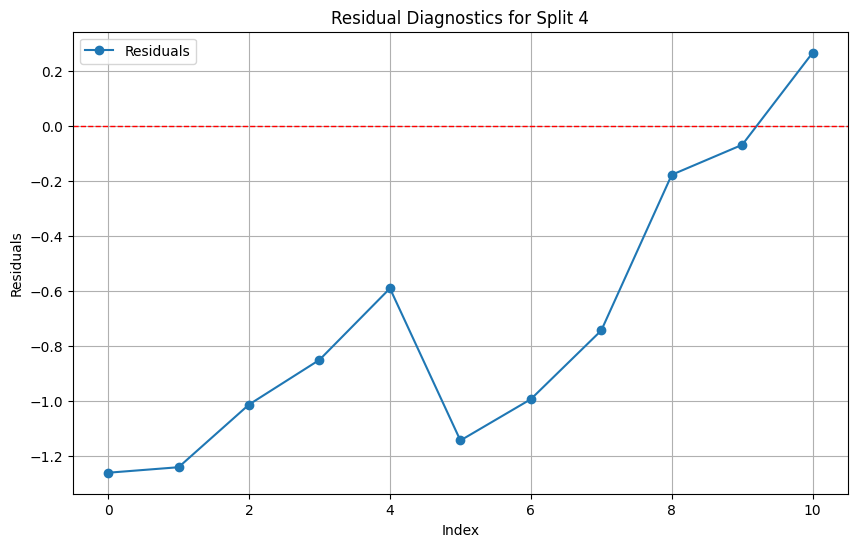

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.7649, MSE=0.7673, RMSE=0.8760, MAPE=109.26%
Residual ADF Statistic: -0.39377244742921136, p-value: 0.9111333746396972


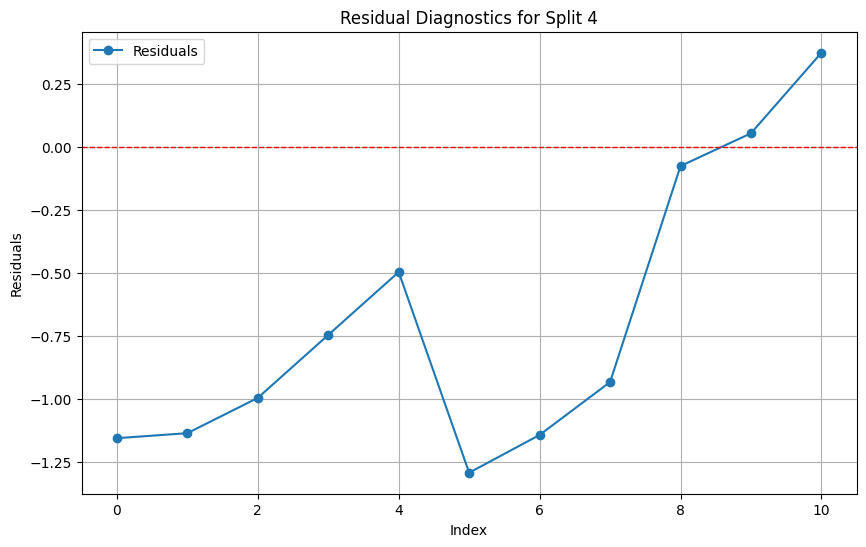

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.5162, MSE=0.3554, RMSE=0.5961, MAPE=69.74%
Residual ADF Statistic: -0.7431774773920196, p-value: 0.8352464516707457


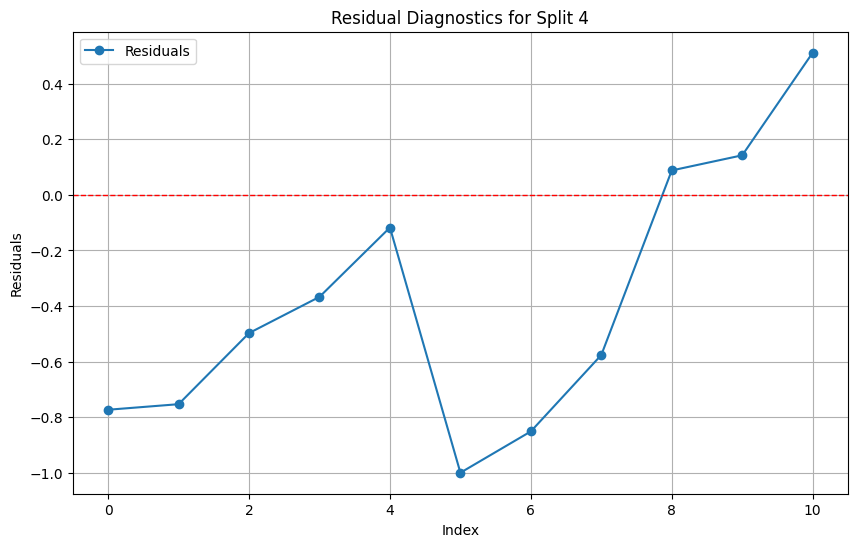

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.5811, MSE=0.4612, RMSE=0.6791, MAPE=67.14%
Residual ADF Statistic: -2.021392337111031, p-value: 0.27727278383409903


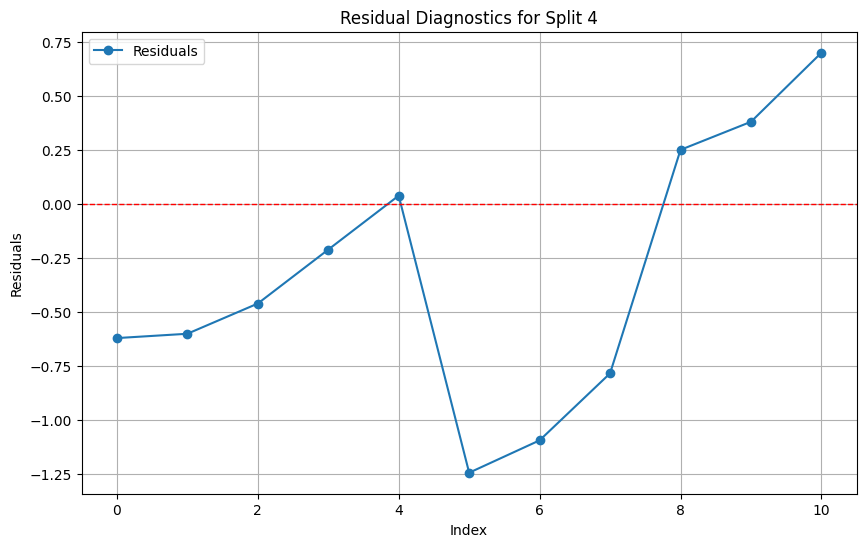

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.3860, MSE=0.2006, RMSE=0.4479, MAPE=37.82%
Residual ADF Statistic: -2.221895536914802, p-value: 0.19839482481016973


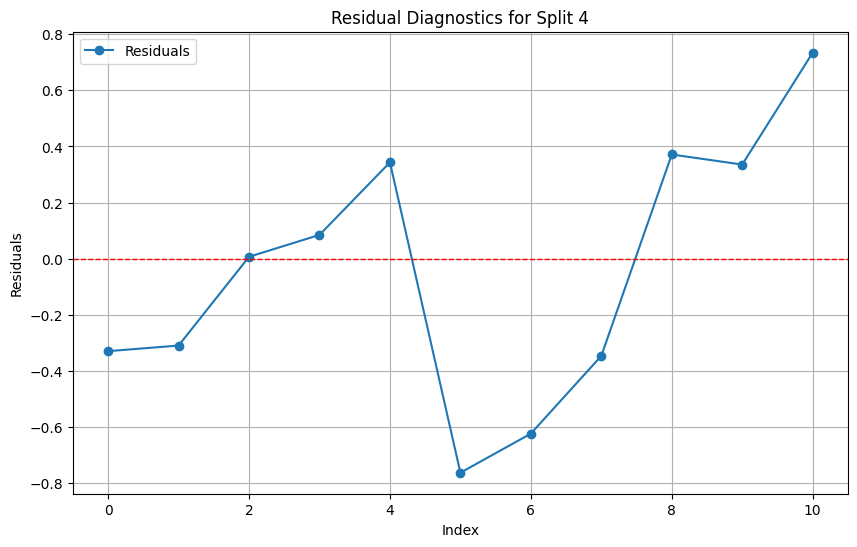

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.5876, MSE=0.5048, RMSE=0.7105, MAPE=44.90%
Residual ADF Statistic: -2.2673098419153415, p-value: 0.18272799756080466


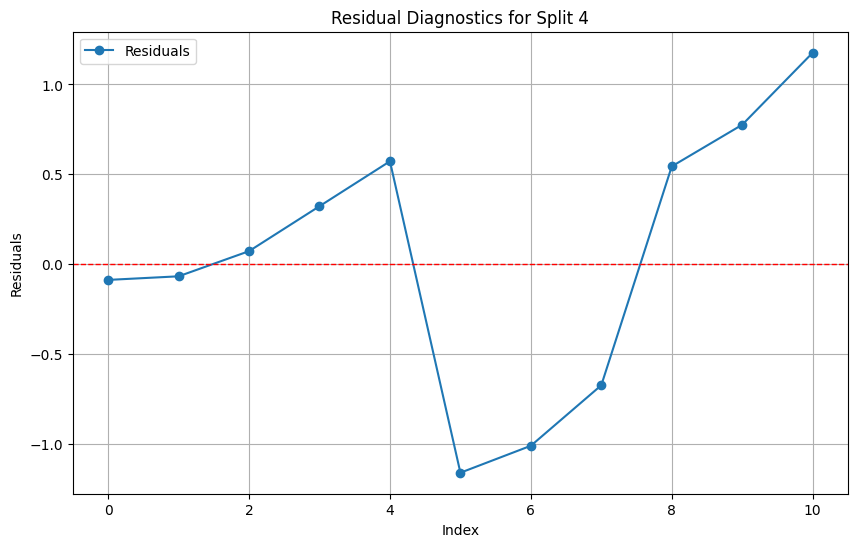

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.3832, MSE=0.1898, RMSE=0.4357, MAPE=52.41%
Residual ADF Statistic: -1.6311229592133631, p-value: 0.4669029662108566


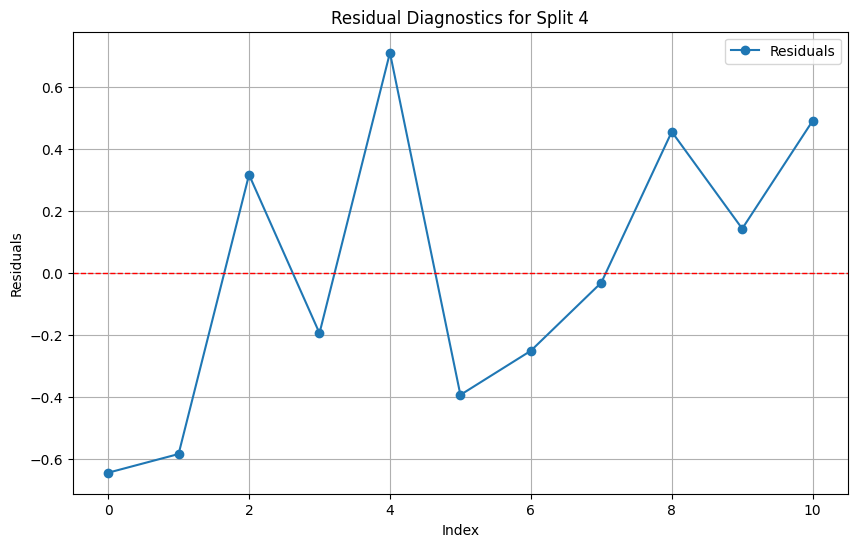

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.5006, MSE=0.3130, RMSE=0.5595, MAPE=67.22%
Residual ADF Statistic: -2.219261403846031, p-value: 0.19932909447426445


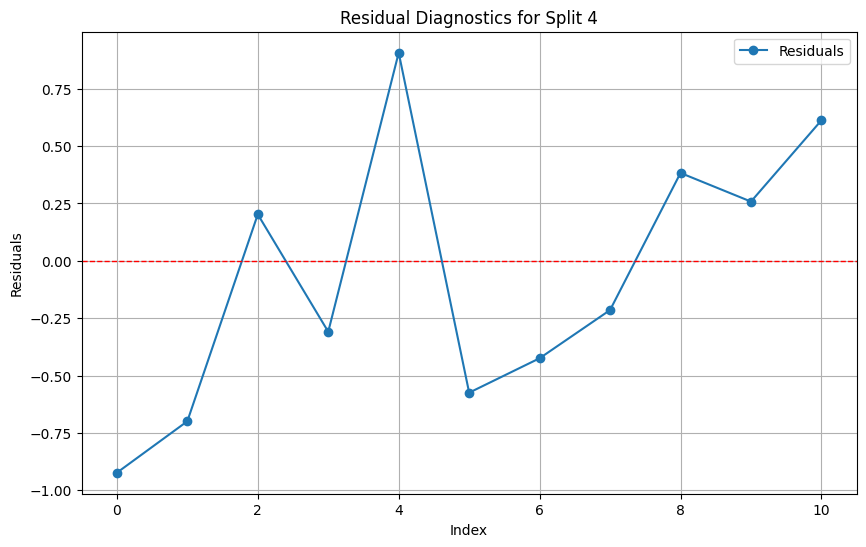

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.3734, MSE=0.1820, RMSE=0.4266, MAPE=50.74%
Residual ADF Statistic: -2.3780541909670654, p-value: 0.14802648736659618


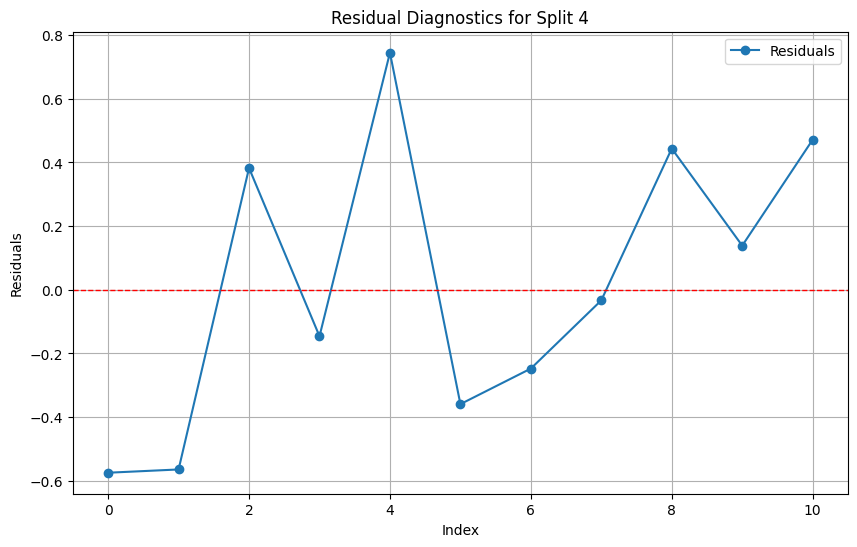

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.4912, MSE=0.3059, RMSE=0.5531, MAPE=66.18%
Residual ADF Statistic: -2.3927441013726787, p-value: 0.14379481405882932


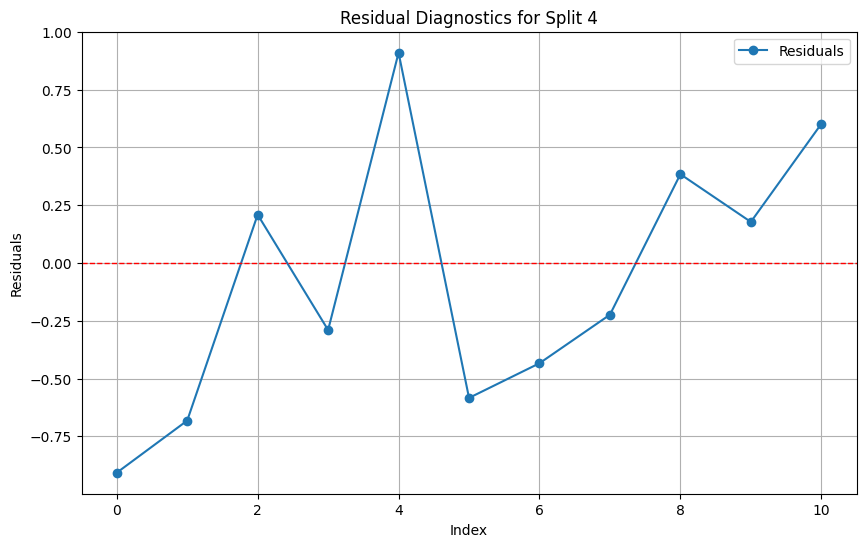

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.3742, MSE=0.1808, RMSE=0.4252, MAPE=50.95%
Residual ADF Statistic: -2.539367648189109, p-value: 0.1061871456038625


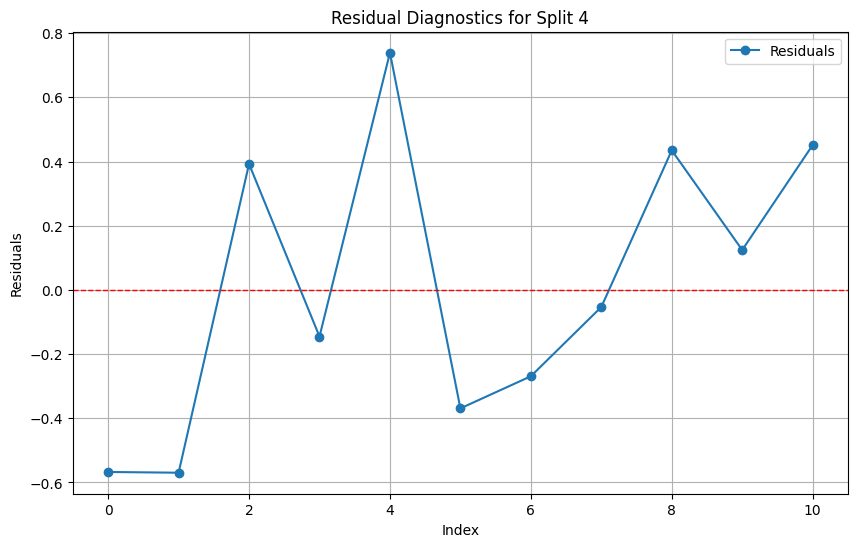

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.4903, MSE=0.3031, RMSE=0.5506, MAPE=65.69%
Residual ADF Statistic: -2.458623245833838, p-value: 0.1258689684962096


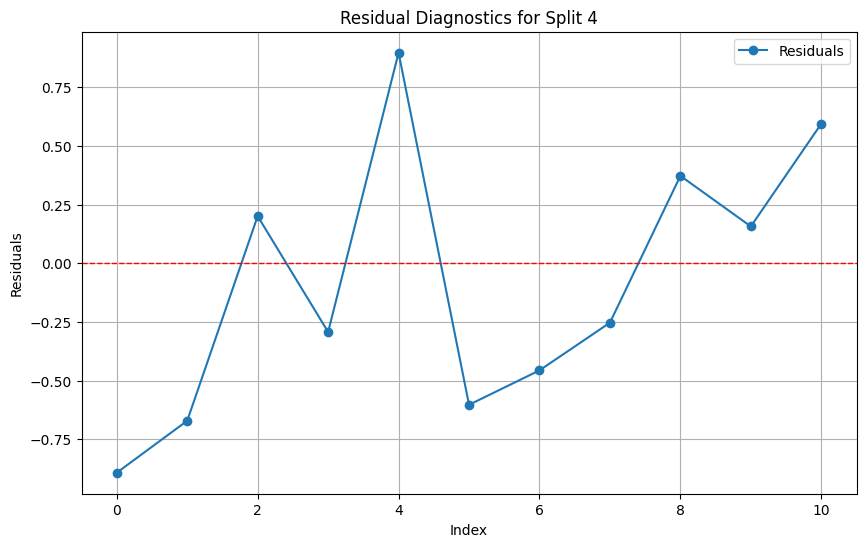

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.4303, MSE=0.2246, RMSE=0.4739, MAPE=42.28%
Residual ADF Statistic: -1.8361000742377442, p-value: 0.36269194513379377


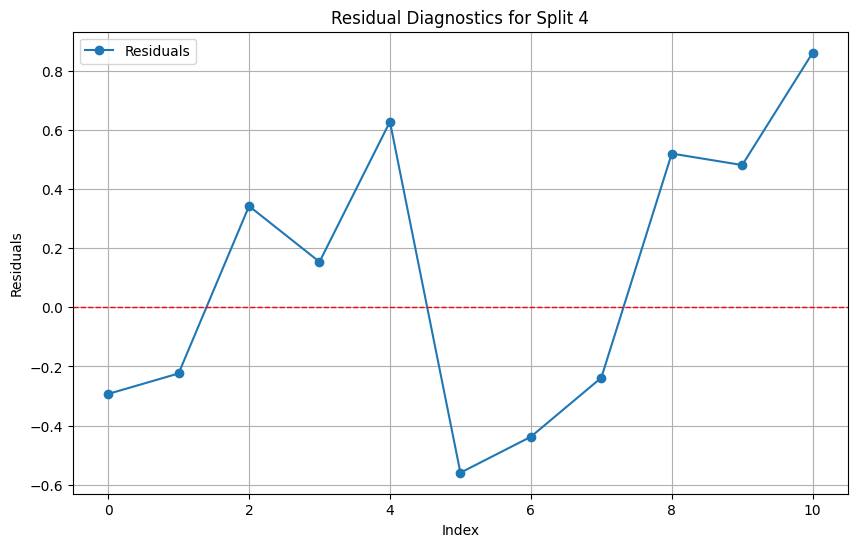

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.5811, MSE=0.4518, RMSE=0.6721, MAPE=46.68%
Residual ADF Statistic: -2.7421362294456273, p-value: 0.06702633534889549


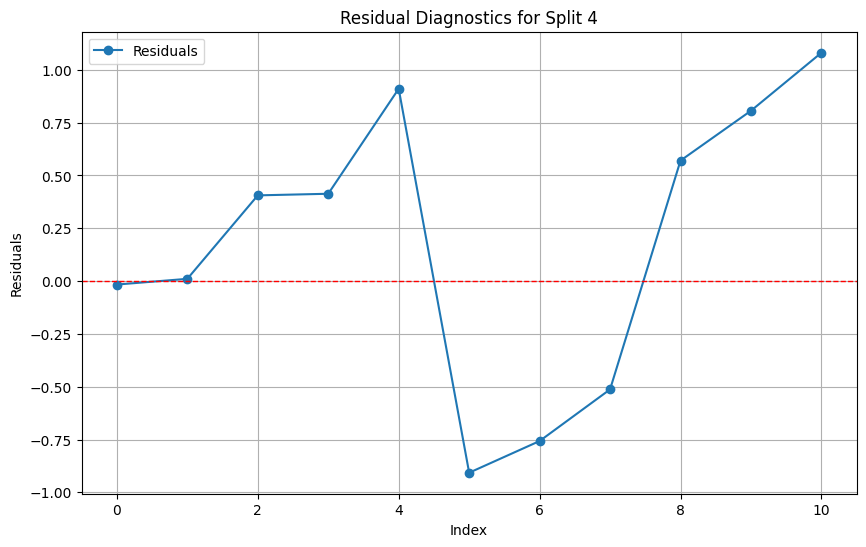

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.4398, MSE=0.2312, RMSE=0.4809, MAPE=43.82%
Residual ADF Statistic: -1.7547875365656158, p-value: 0.40312800269537125


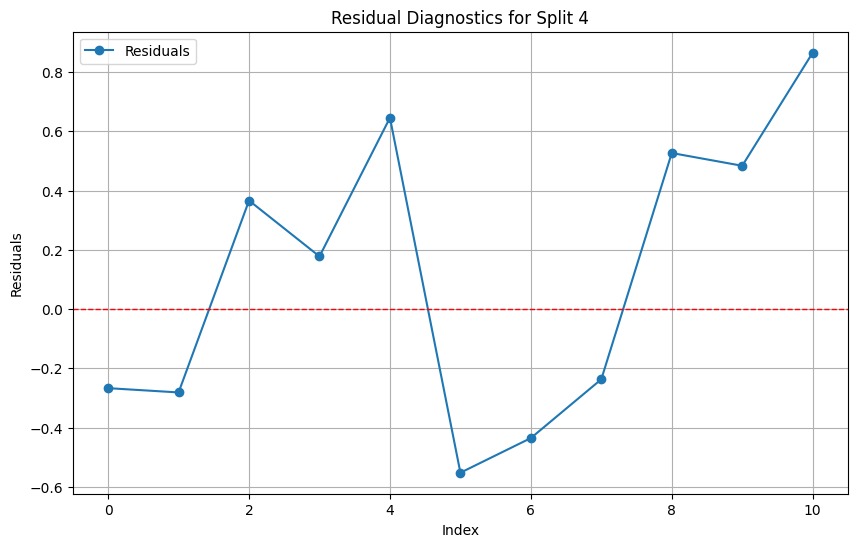

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.5870, MSE=0.4583, RMSE=0.6770, MAPE=47.35%
Residual ADF Statistic: -2.8067800038799517, p-value: 0.05731180032013246


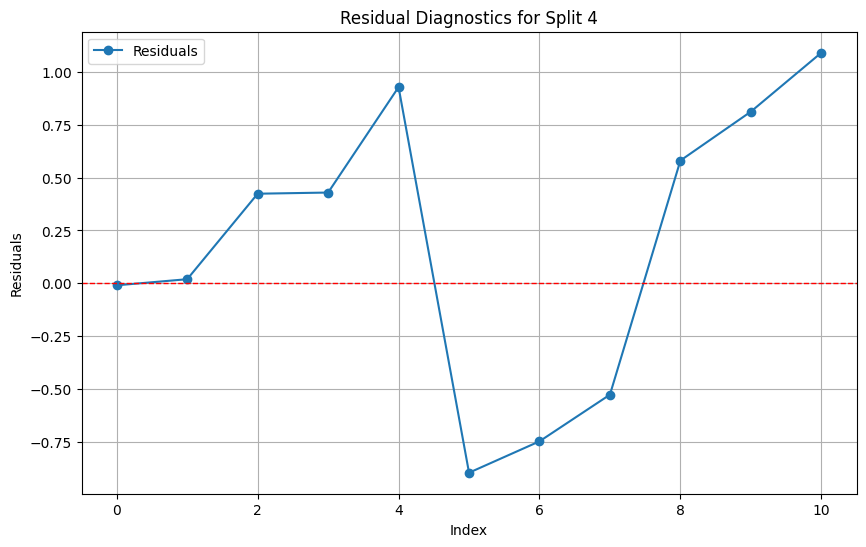

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.4432, MSE=0.2345, RMSE=0.4842, MAPE=44.12%
Residual ADF Statistic: -1.7491712814294056, p-value: 0.4059724201476539


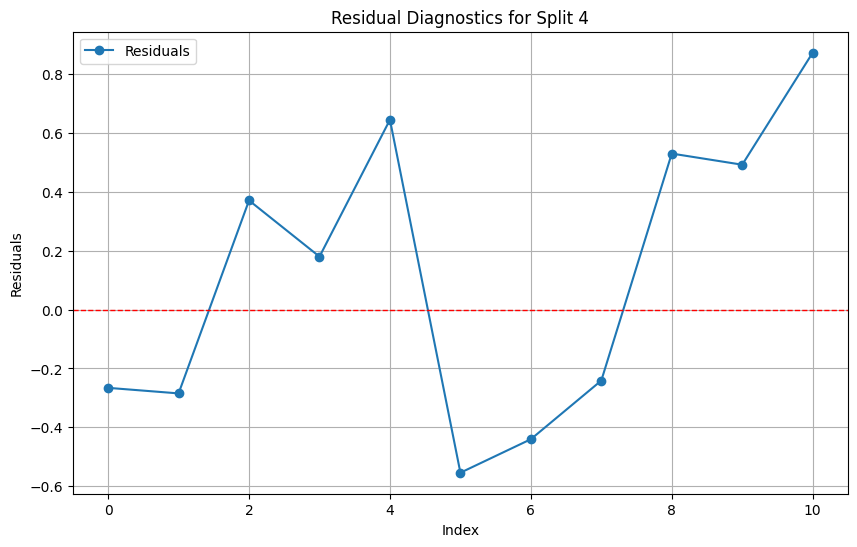

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.5878, MSE=0.4595, RMSE=0.6779, MAPE=47.37%
Residual ADF Statistic: -2.813383919543587, p-value: 0.056387256681283235


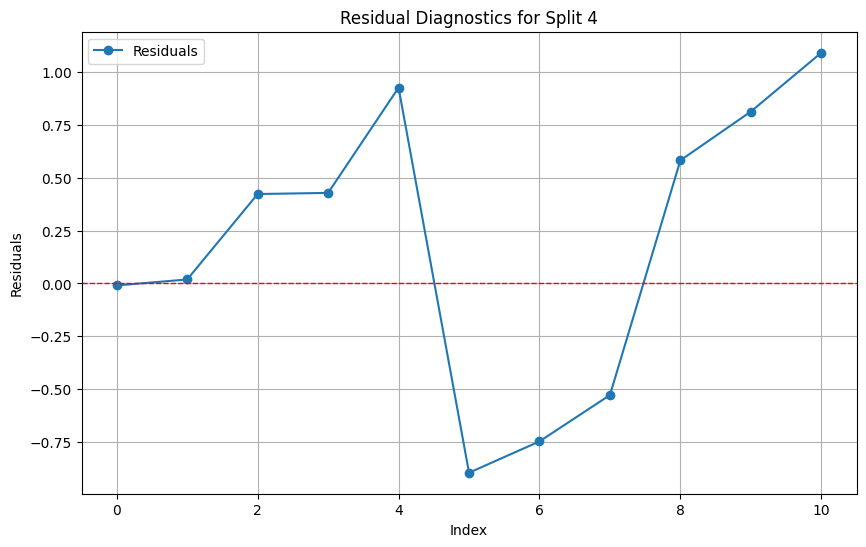

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.4346, MSE=0.2328, RMSE=0.4825, MAPE=44.48%
Residual ADF Statistic: -2.3629015443582277, p-value: 0.1524820293869174


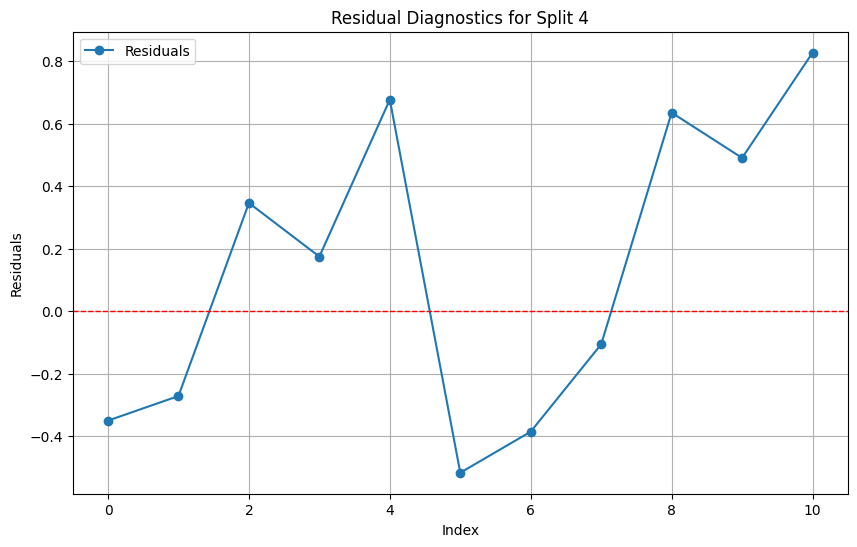

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.6530, MSE=0.5571, RMSE=0.7464, MAPE=53.23%
Residual ADF Statistic: -2.689980261249293, p-value: 0.07578822812283624


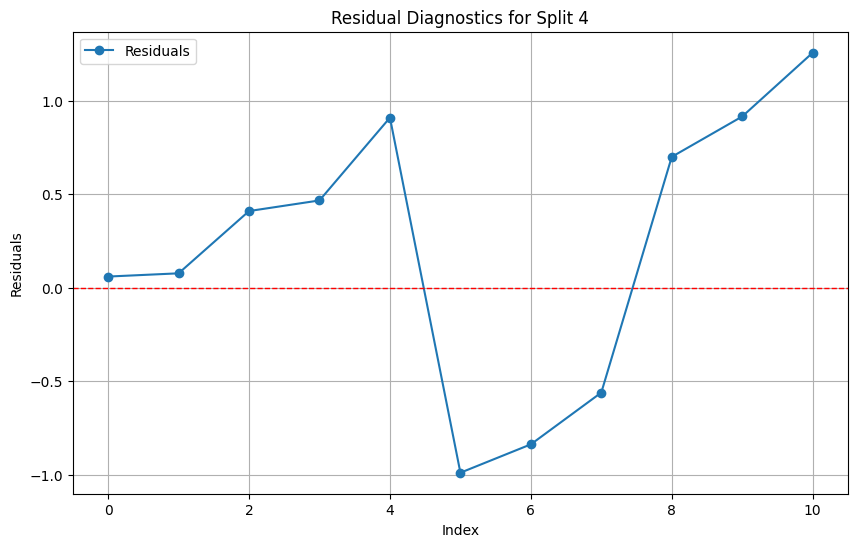

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.4383, MSE=0.2380, RMSE=0.4879, MAPE=44.92%
Residual ADF Statistic: -2.4838205892186154, p-value: 0.11946074266177509


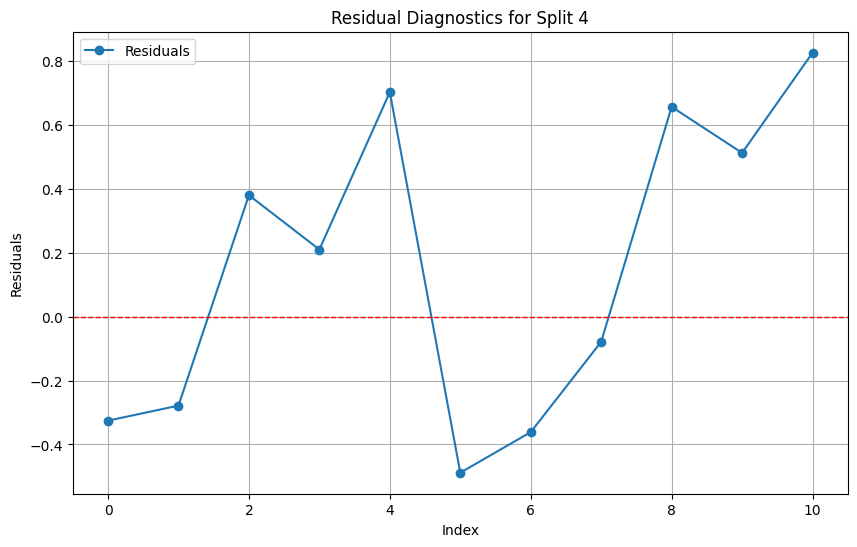

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.6627, MSE=0.5627, RMSE=0.7501, MAPE=55.26%
Residual ADF Statistic: -2.7097212888055227, p-value: 0.07237111558121485


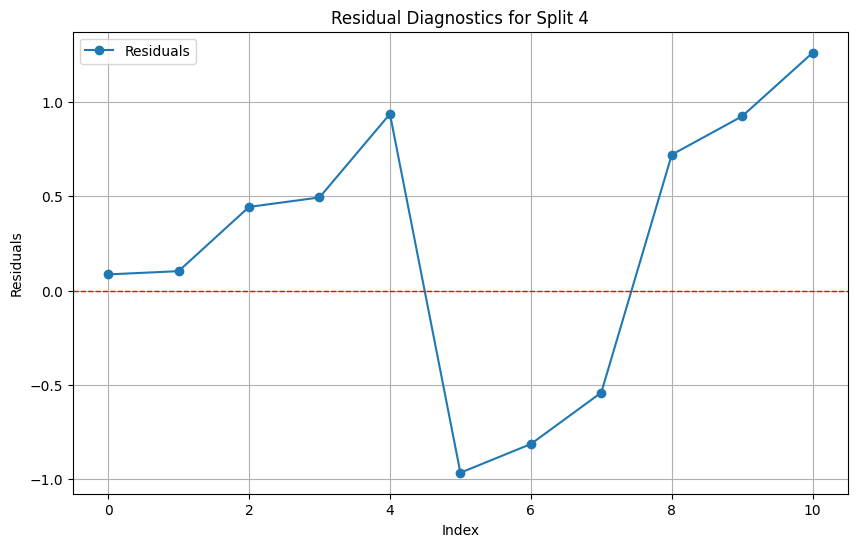

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.4396, MSE=0.2395, RMSE=0.4893, MAPE=45.03%
Residual ADF Statistic: -2.4995455842342484, p-value: 0.11558492817454308


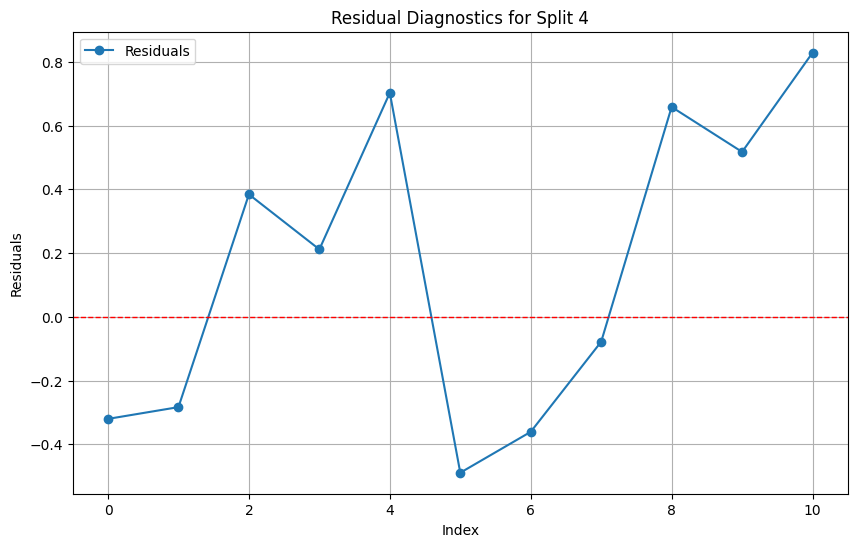

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.6628, MSE=0.5627, RMSE=0.7501, MAPE=55.28%
Residual ADF Statistic: -2.7103660295129157, p-value: 0.07226160633995178


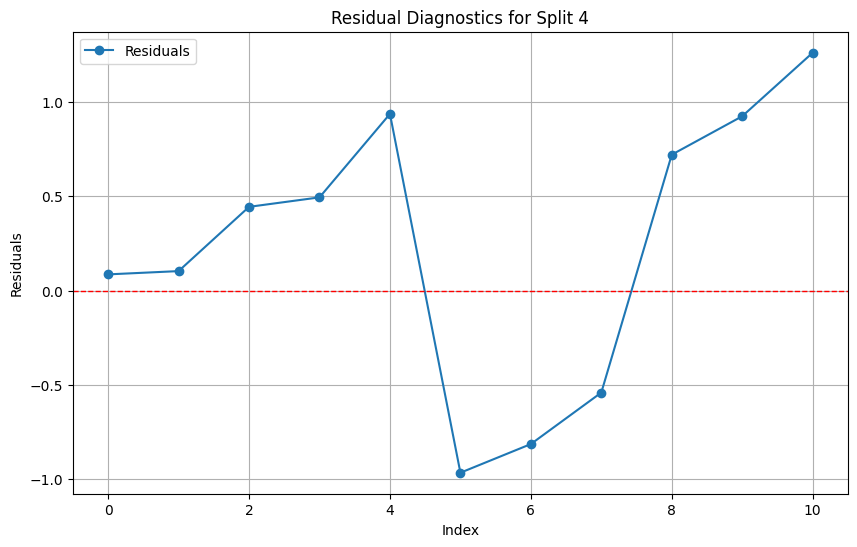

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.3897, MSE=0.1911, RMSE=0.4372, MAPE=51.48%
Residual ADF Statistic: -2.452353091315715, p-value: 0.12750176131084562


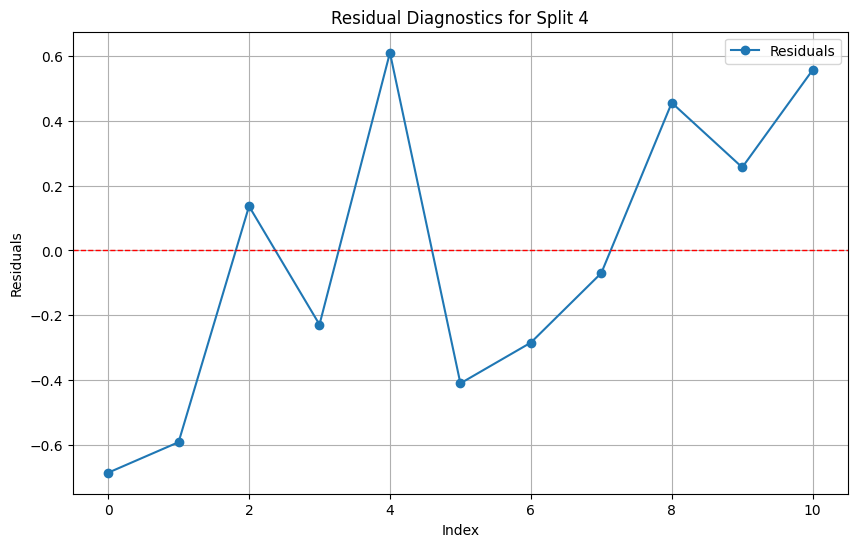

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.4897, MSE=0.2973, RMSE=0.5453, MAPE=66.90%
Residual ADF Statistic: -2.83215194308503, p-value: 0.05382583079377929


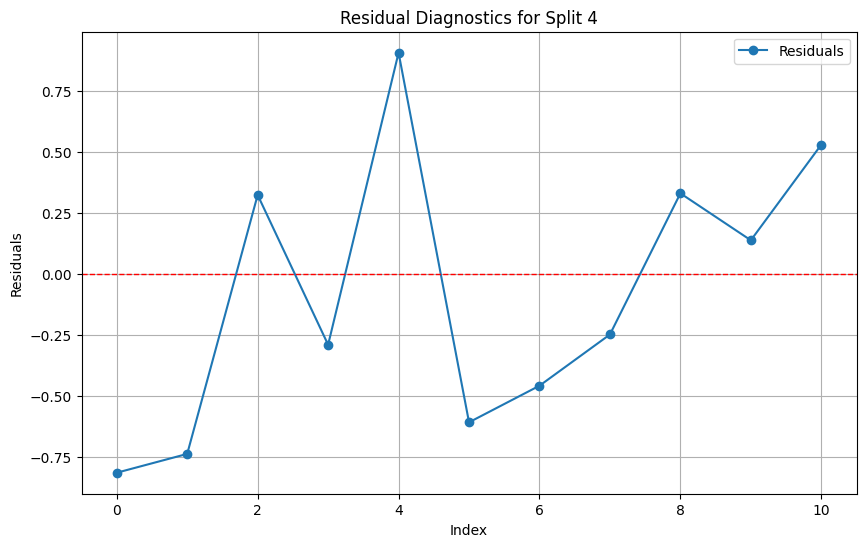

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.3990, MSE=0.1978, RMSE=0.4447, MAPE=52.68%
Residual ADF Statistic: -2.4341681423675325, p-value: 0.13232397211274333


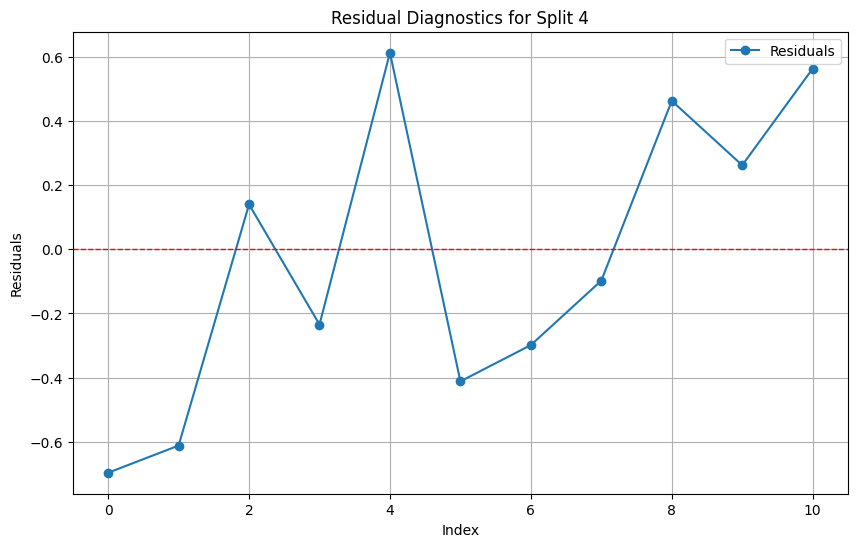

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.4915, MSE=0.2986, RMSE=0.5464, MAPE=67.26%
Residual ADF Statistic: -2.840556006030593, p-value: 0.0527100778626827


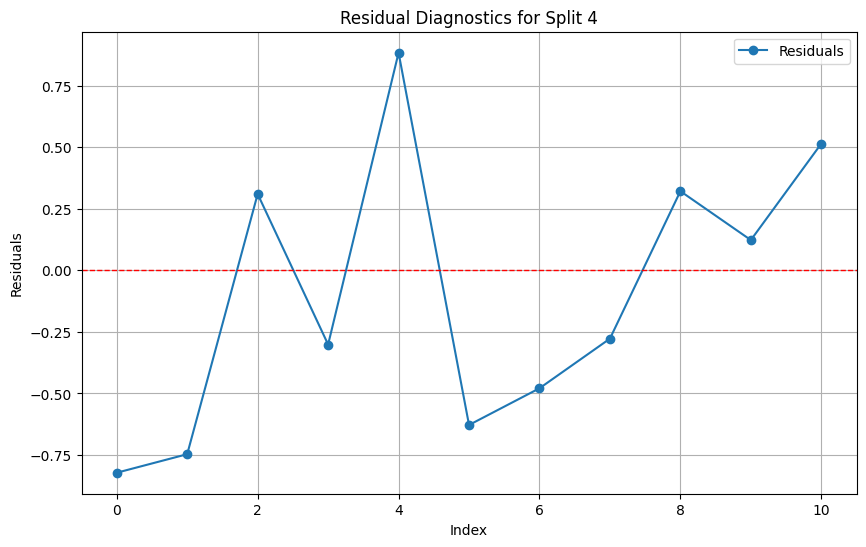

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.4039, MSE=0.2021, RMSE=0.4496, MAPE=53.16%
Residual ADF Statistic: -2.39674167964039, p-value: 0.14265815823032968


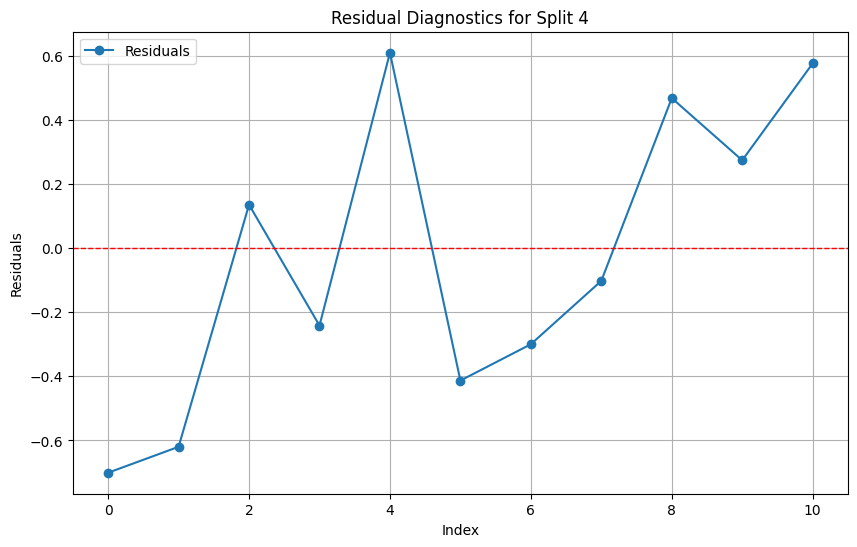

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.4914, MSE=0.2984, RMSE=0.5463, MAPE=67.28%
Residual ADF Statistic: -2.8444003216082057, p-value: 0.05220604054174313


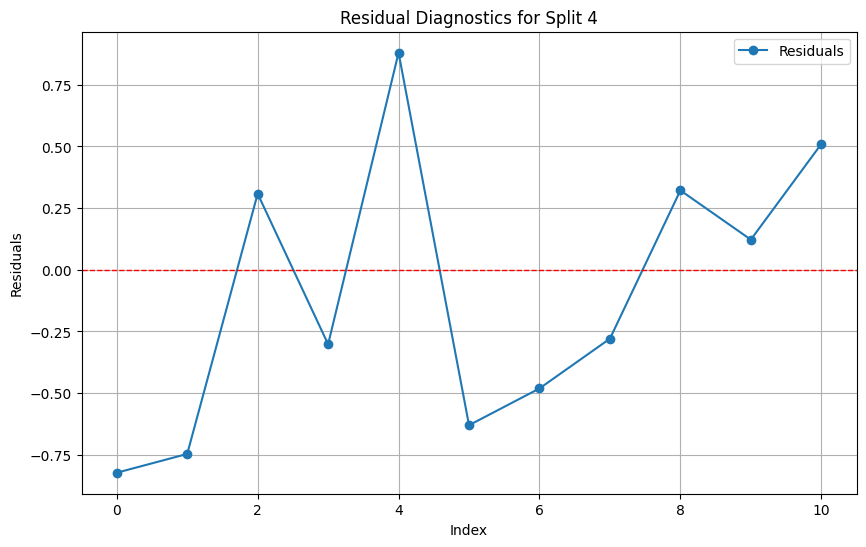

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.3422, MSE=0.1388, RMSE=0.3725, MAPE=36.69%
Residual ADF Statistic: -2.1167905446524835, p-value: 0.23781685635144112


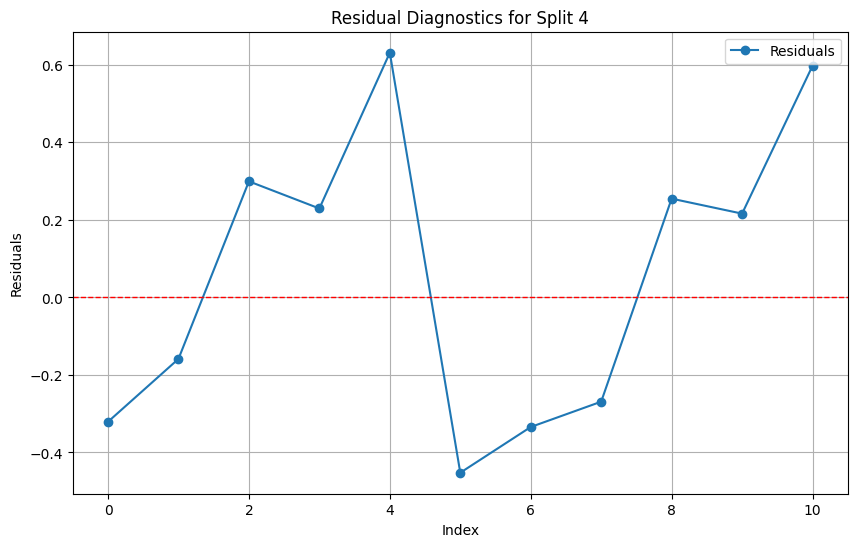

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.5798, MSE=0.4153, RMSE=0.6445, MAPE=56.94%
Residual ADF Statistic: -1.9616603107082051, p-value: 0.3036324718562875


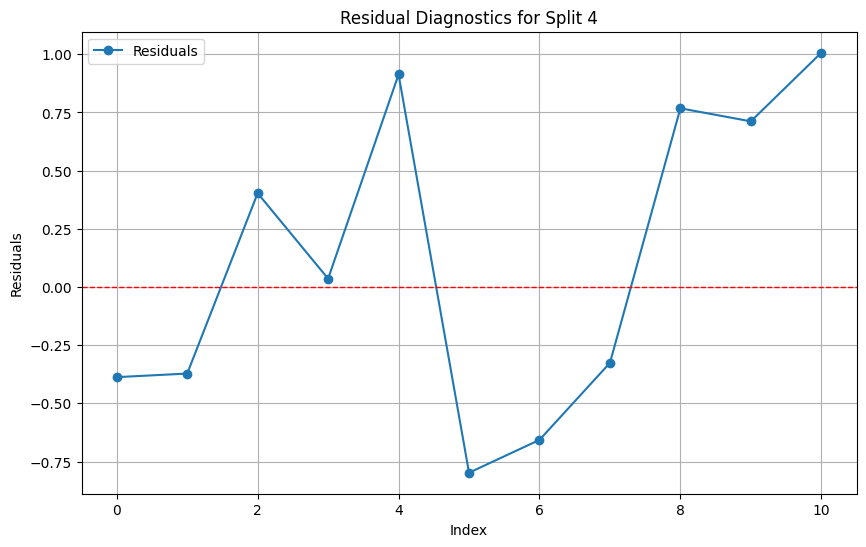

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.3441, MSE=0.1394, RMSE=0.3733, MAPE=36.85%
Residual ADF Statistic: -2.0787923105212585, p-value: 0.25312737565371113


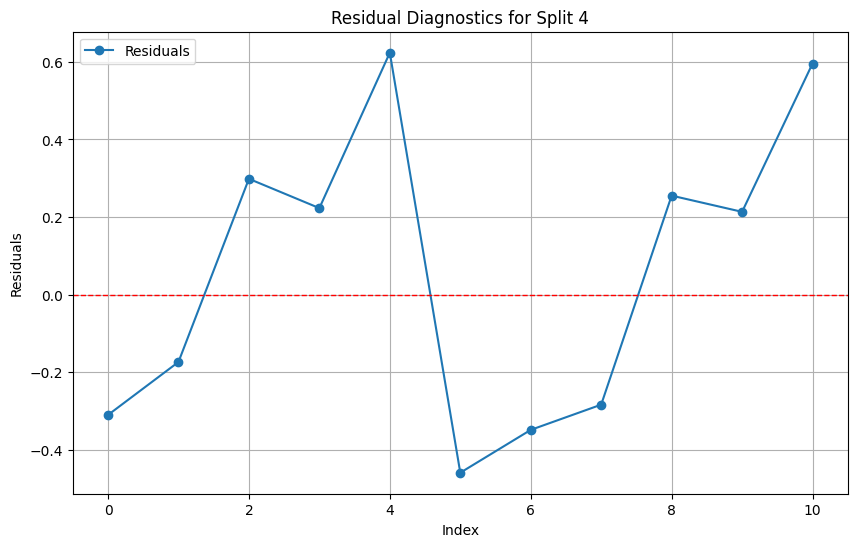

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.5801, MSE=0.4159, RMSE=0.6449, MAPE=56.95%
Residual ADF Statistic: -1.9584654681360398, p-value: 0.3050760507110053


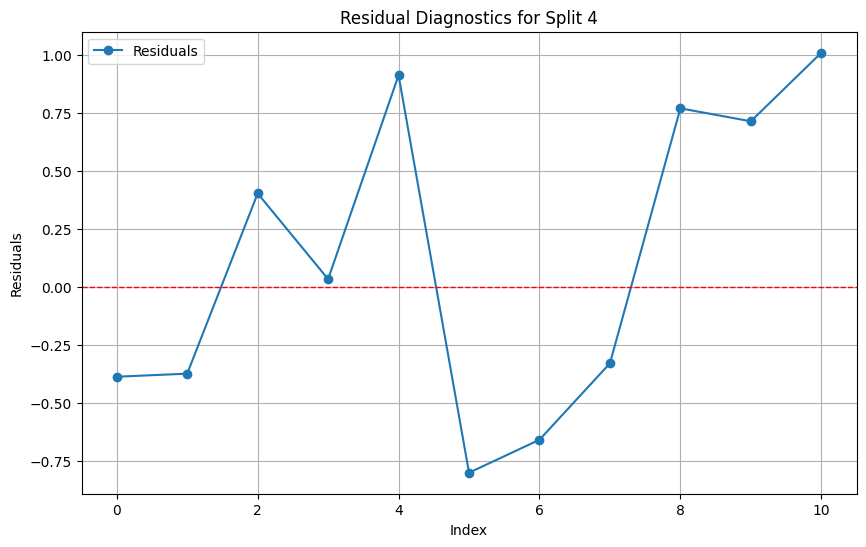

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.3441, MSE=0.1393, RMSE=0.3733, MAPE=36.85%
Residual ADF Statistic: -2.0795104757676057, p-value: 0.2528329496830839


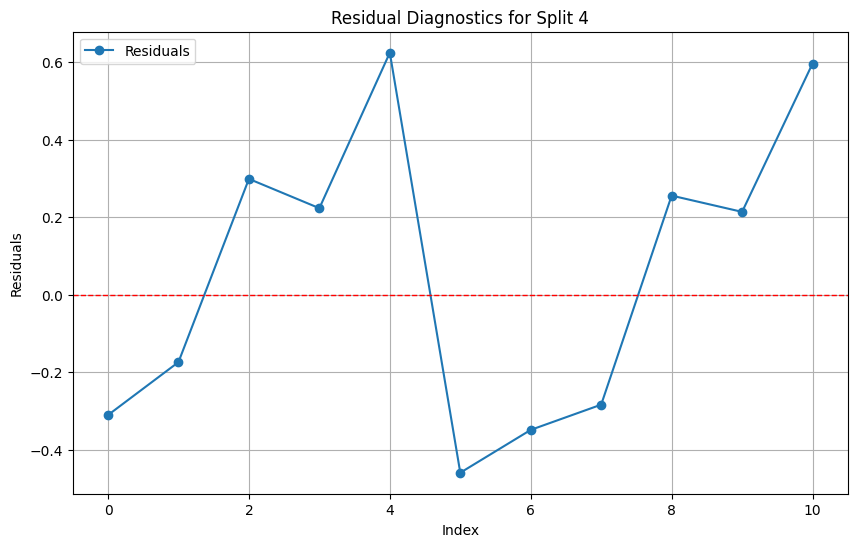

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.5801, MSE=0.4159, RMSE=0.6449, MAPE=56.95%
Residual ADF Statistic: -1.958466124367569, p-value: 0.30507575385419244


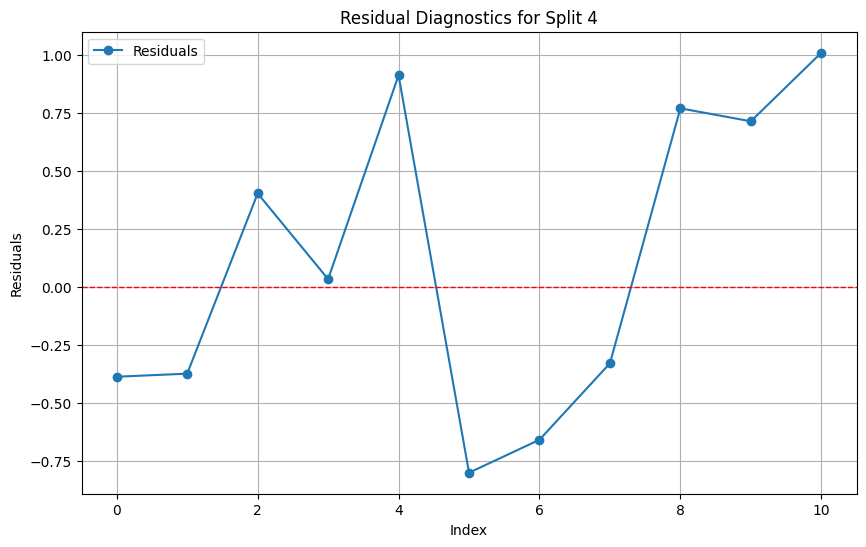

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.3745, MSE=0.1714, RMSE=0.4139, MAPE=39.93%
Residual ADF Statistic: -2.0648597567578477, p-value: 0.25887732392064566


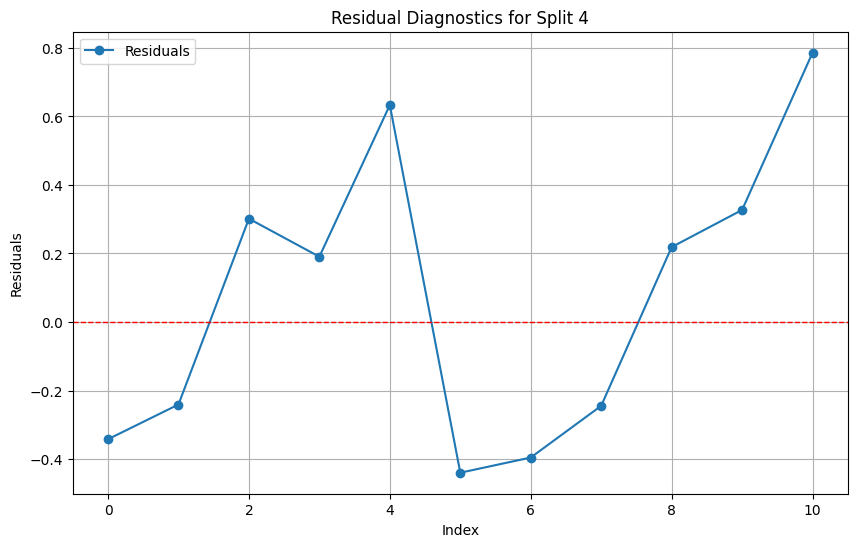

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.6421, MSE=0.5343, RMSE=0.7310, MAPE=56.76%
Residual ADF Statistic: -1.81680295802851, p-value: 0.3721519763798522


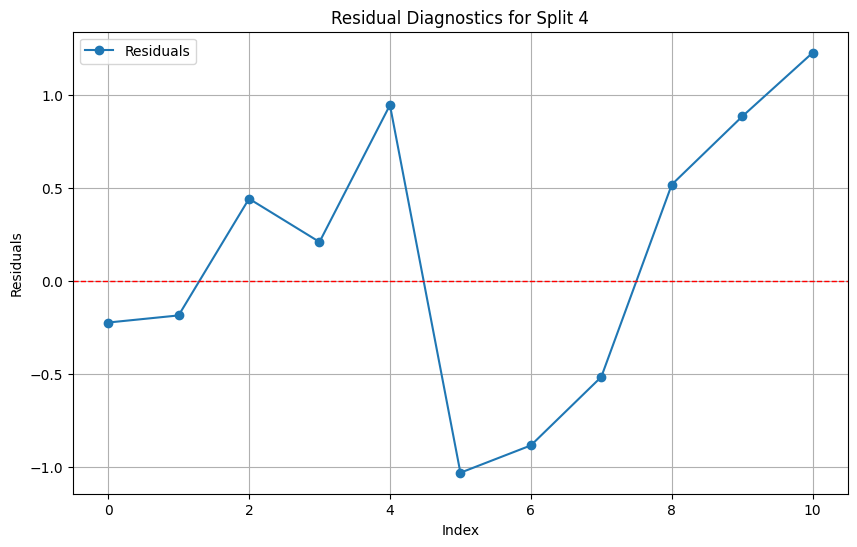

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.3760, MSE=0.1723, RMSE=0.4151, MAPE=40.22%
Residual ADF Statistic: -2.0460245045273284, p-value: 0.2667644359142566


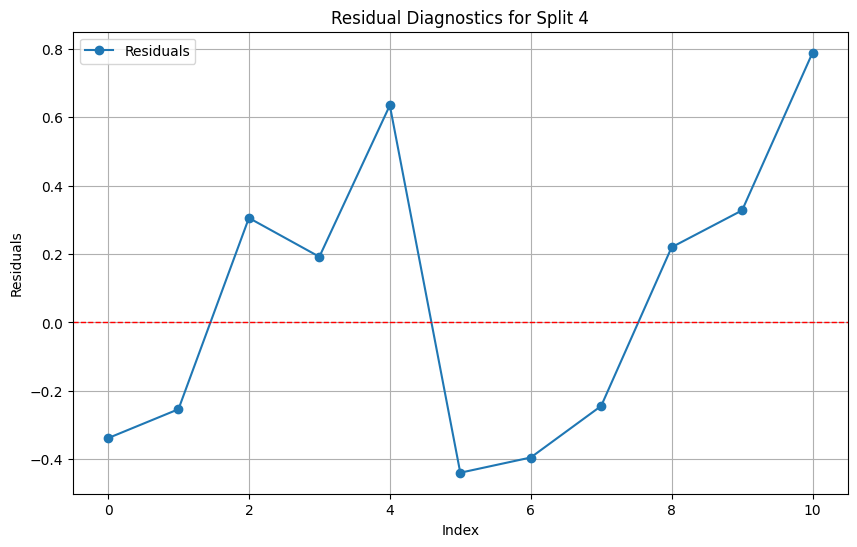

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.6421, MSE=0.5343, RMSE=0.7310, MAPE=56.76%
Residual ADF Statistic: -1.8167955719234619, p-value: 0.3721556145731592


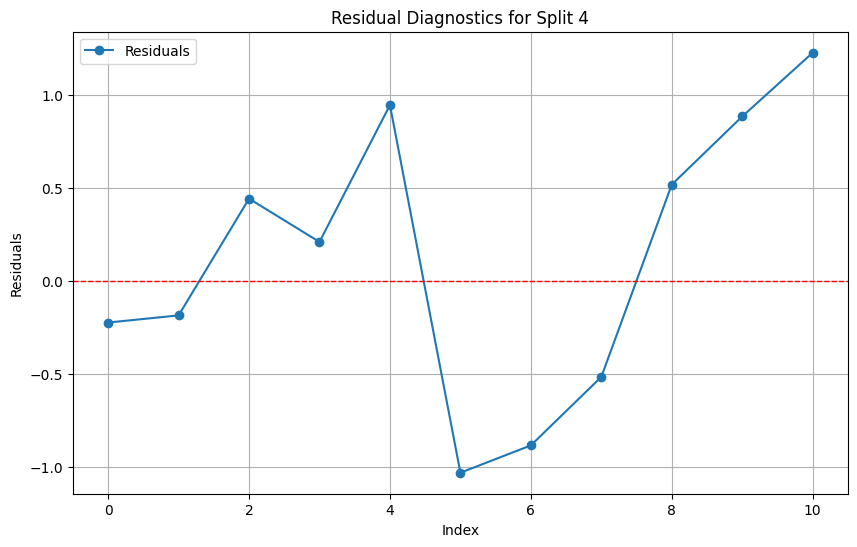

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.3759, MSE=0.1722, RMSE=0.4150, MAPE=40.21%
Residual ADF Statistic: -2.045826966971921, p-value: 0.2668478394394491


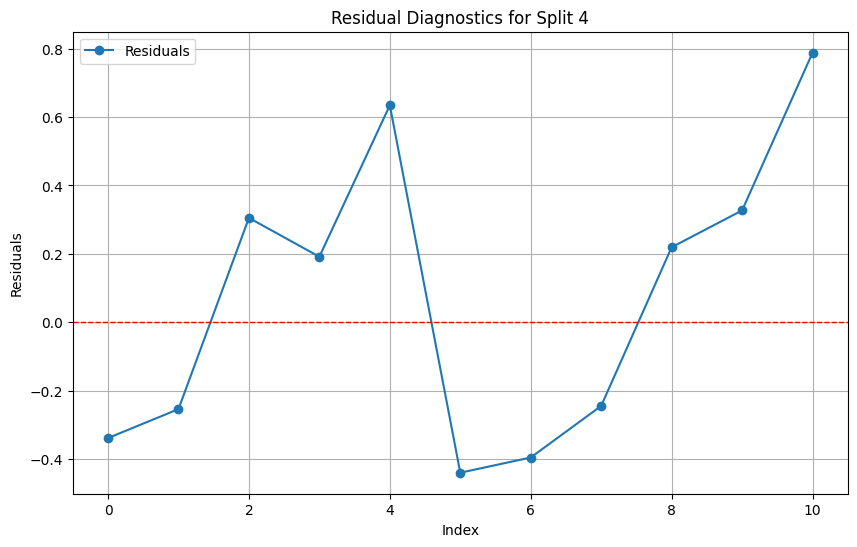

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.6421, MSE=0.5343, RMSE=0.7310, MAPE=56.76%
Residual ADF Statistic: -1.8167957778535644, p-value: 0.37215551313744755


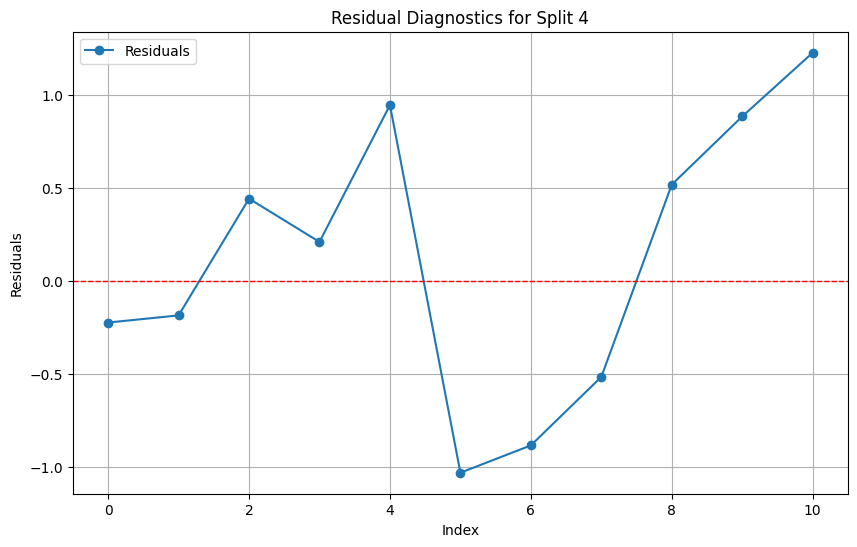

Processing Split 5...
Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=1.6871, MSE=3.3180, RMSE=1.8215, MAPE=81.16%
Residual ADF Statistic: -11.358389299457823, p-value: 9.607637102418452e-21


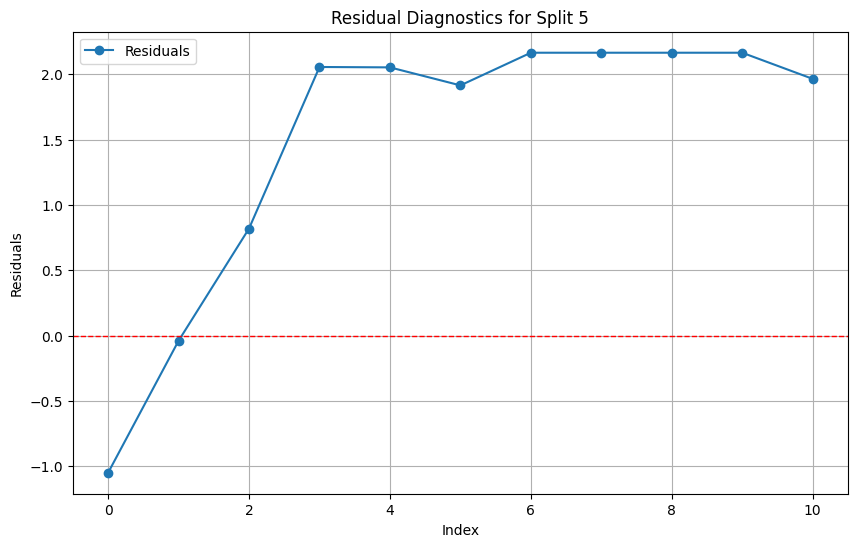

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=1.6754, MSE=3.2726, RMSE=1.8090, MAPE=80.69%
Residual ADF Statistic: -12.867116990862264, p-value: 4.968038883722964e-24


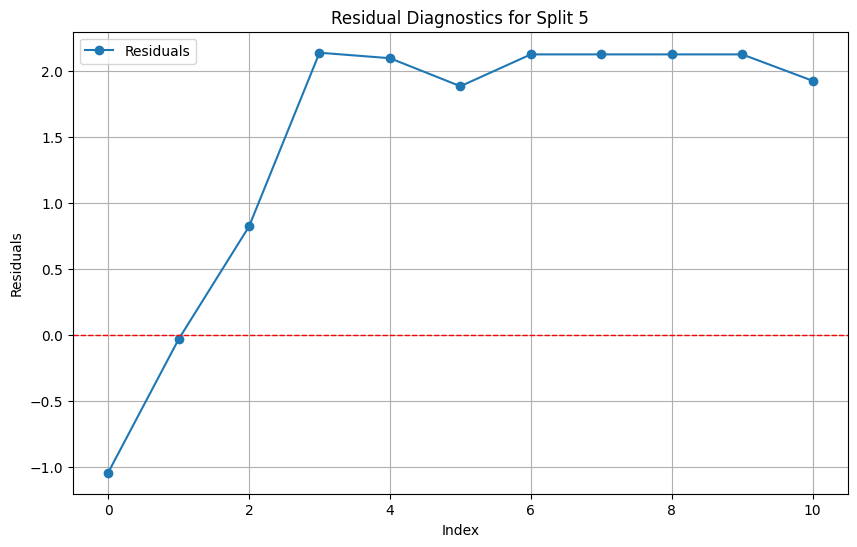

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=1.2078, MSE=1.6289, RMSE=1.2763, MAPE=55.78%
Residual ADF Statistic: -3.164963697592875, p-value: 0.022104419508883852


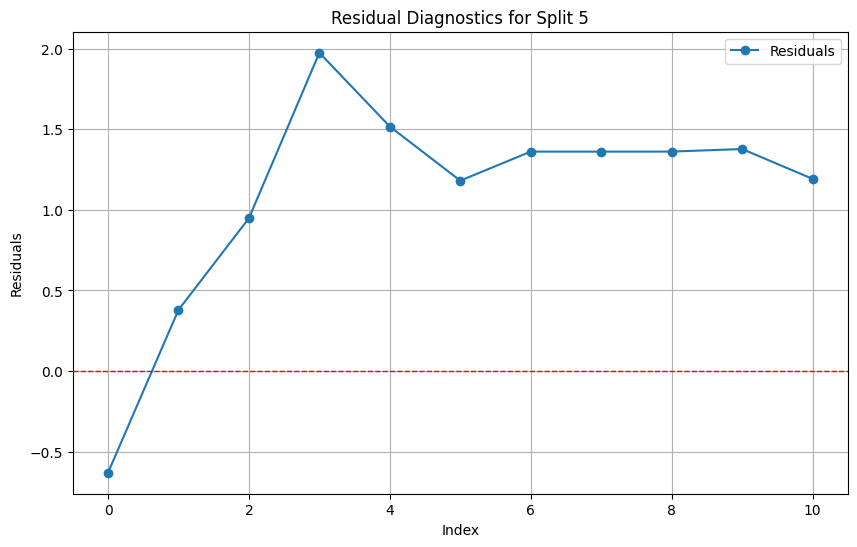

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=1.2057, MSE=1.6308, RMSE=1.2770, MAPE=55.41%
Residual ADF Statistic: -3.208351913608344, p-value: 0.019506299100728892


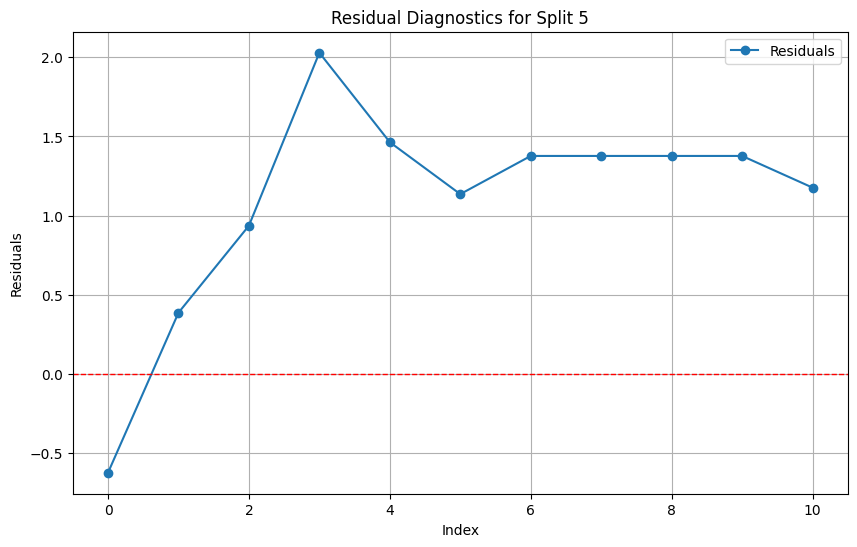

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.7071, MSE=0.6555, RMSE=0.8097, MAPE=30.42%
Residual ADF Statistic: -4.227015103218964, p-value: 0.0005928523172072449


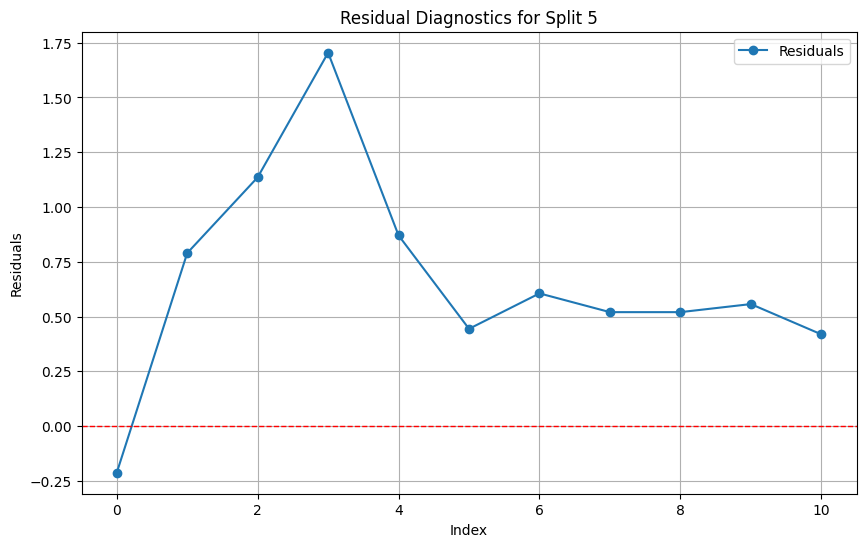

Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.6819, MSE=0.6259, RMSE=0.7912, MAPE=29.72%
Residual ADF Statistic: -1.7888068802748198, p-value: 0.3860327557833421


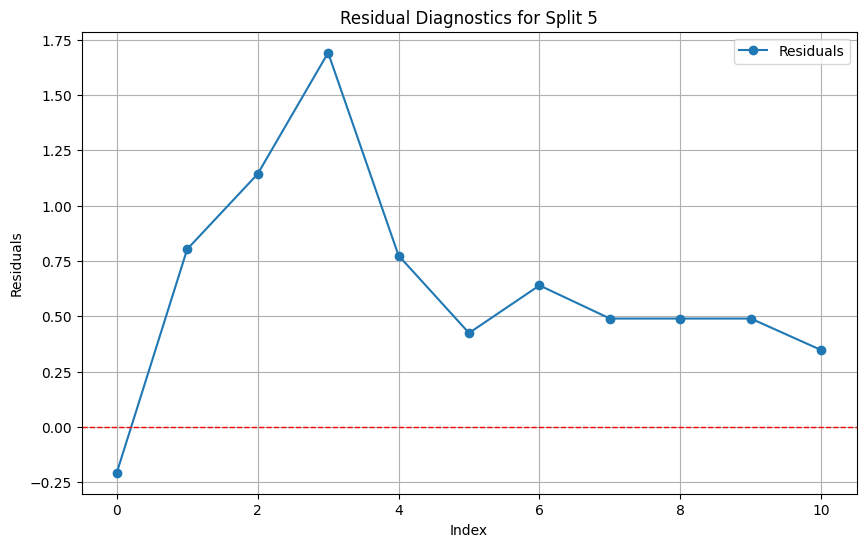

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=1.6803, MSE=3.2893, RMSE=1.8137, MAPE=81.06%
Residual ADF Statistic: -10.03996662743861, p-value: 1.5053454318177015e-17


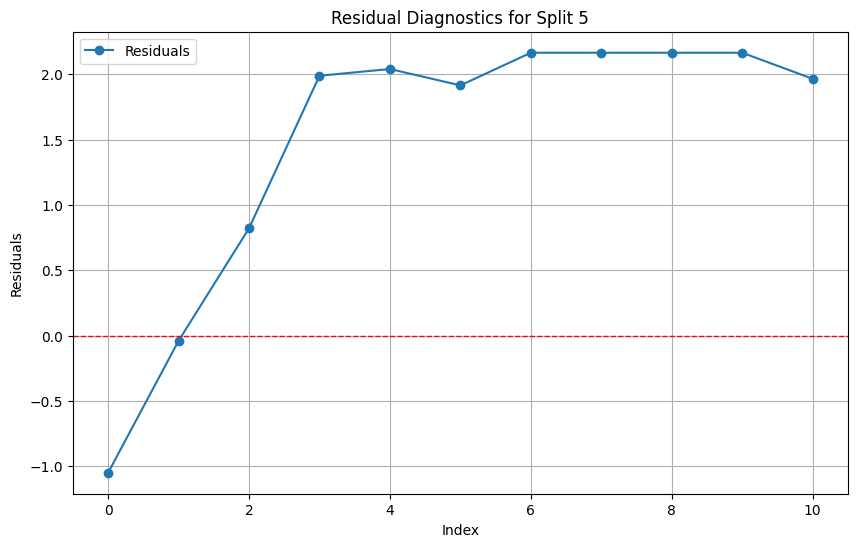

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=1.6623, MSE=3.2208, RMSE=1.7947, MAPE=80.44%
Residual ADF Statistic: -11.079759603272386, p-value: 4.340984048168737e-20


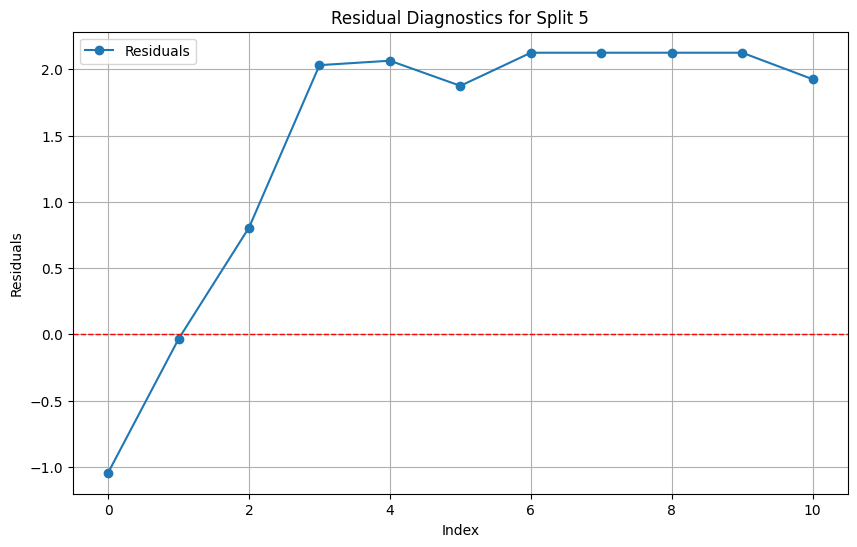

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=1.1943, MSE=1.5814, RMSE=1.2575, MAPE=55.57%
Residual ADF Statistic: -3.167901773784282, p-value: 0.021919465897096743


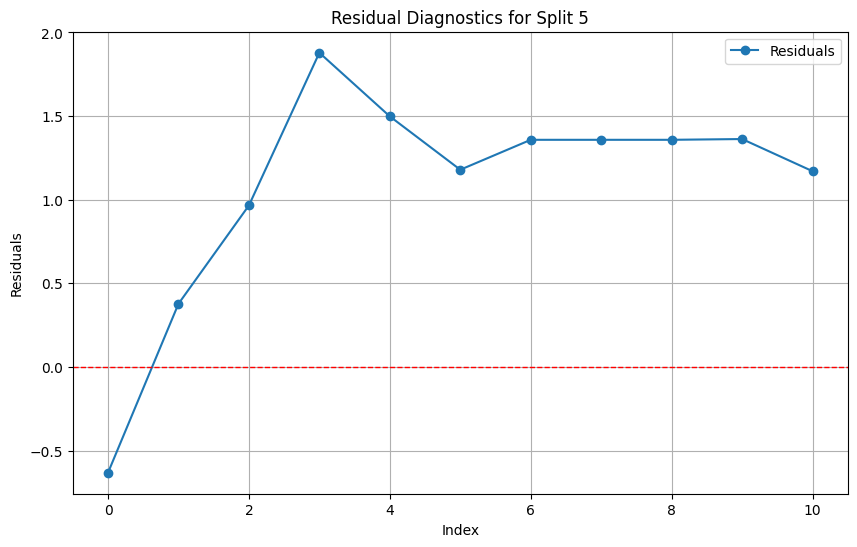

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=1.1816, MSE=1.5510, RMSE=1.2454, MAPE=54.97%
Residual ADF Statistic: -3.1019679484340963, p-value: 0.026407893862766825


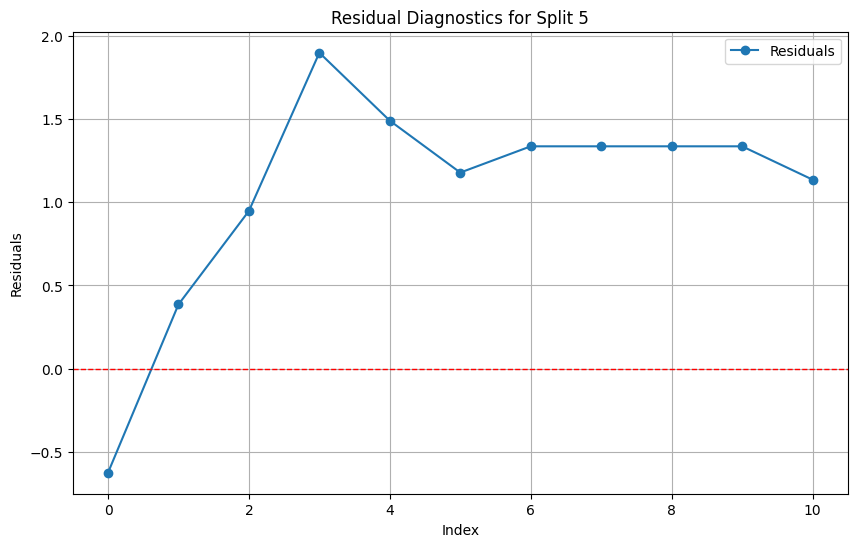

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.6996, MSE=0.6538, RMSE=0.8086, MAPE=29.95%
Residual ADF Statistic: -1.927551904282354, p-value: 0.3192128728995751


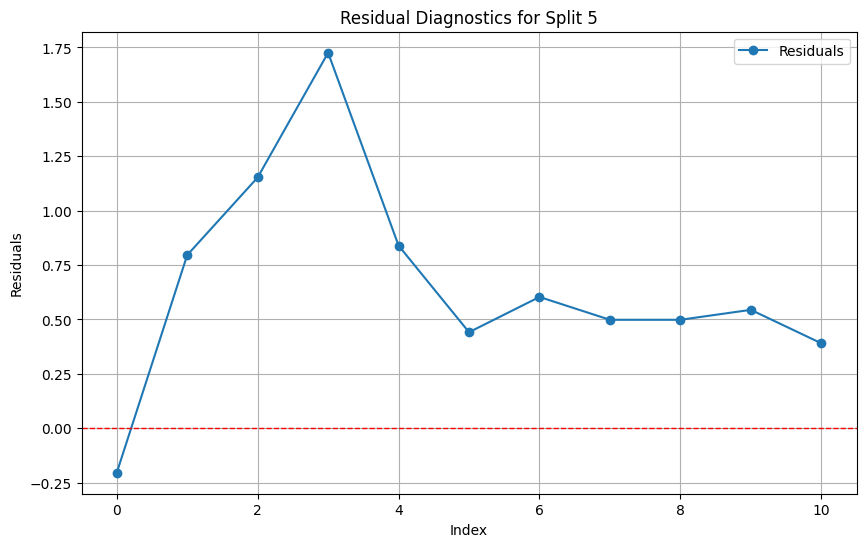

Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.7149, MSE=0.6850, RMSE=0.8276, MAPE=30.12%
Residual ADF Statistic: -1.941437308886015, p-value: 0.31282565724577305


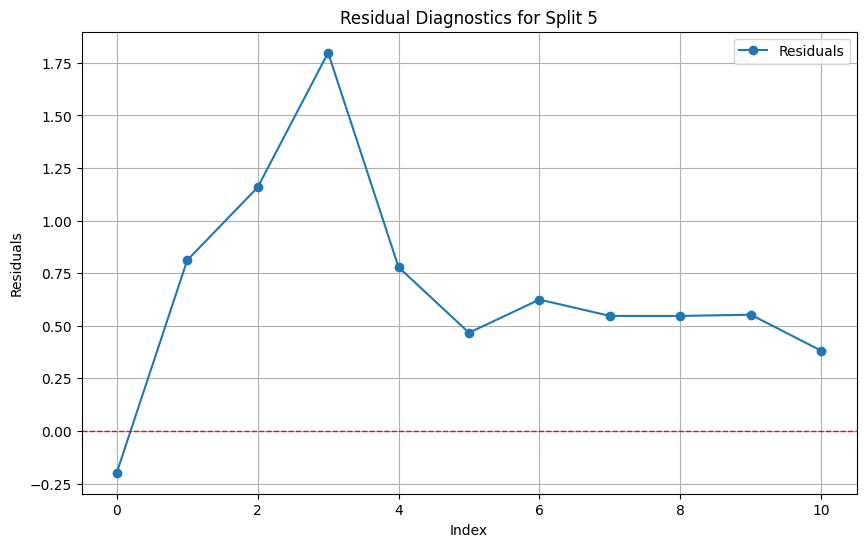

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=1.6831, MSE=3.2936, RMSE=1.8148, MAPE=81.16%
Residual ADF Statistic: -9.593677735111529, p-value: 2.0046446433325724e-16


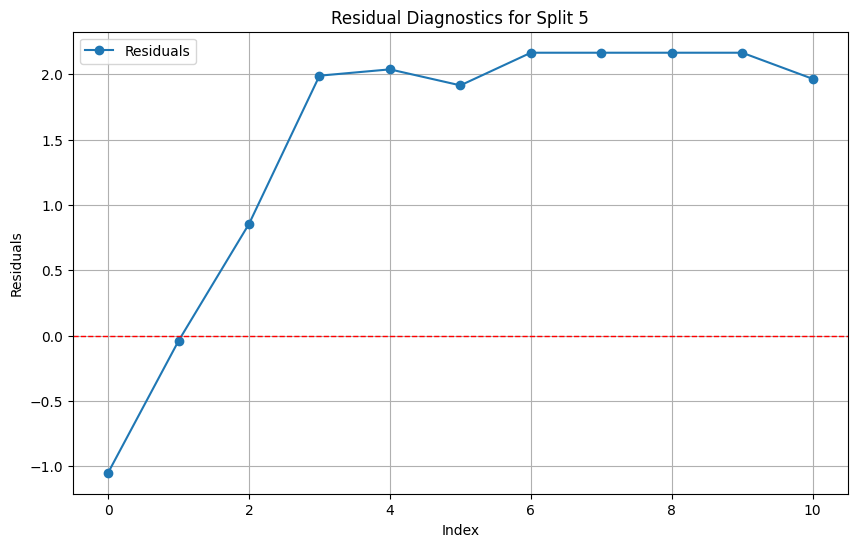

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=1.6697, MSE=3.2333, RMSE=1.7981, MAPE=80.76%
Residual ADF Statistic: -9.856498359744617, p-value: 4.3453927682549905e-17


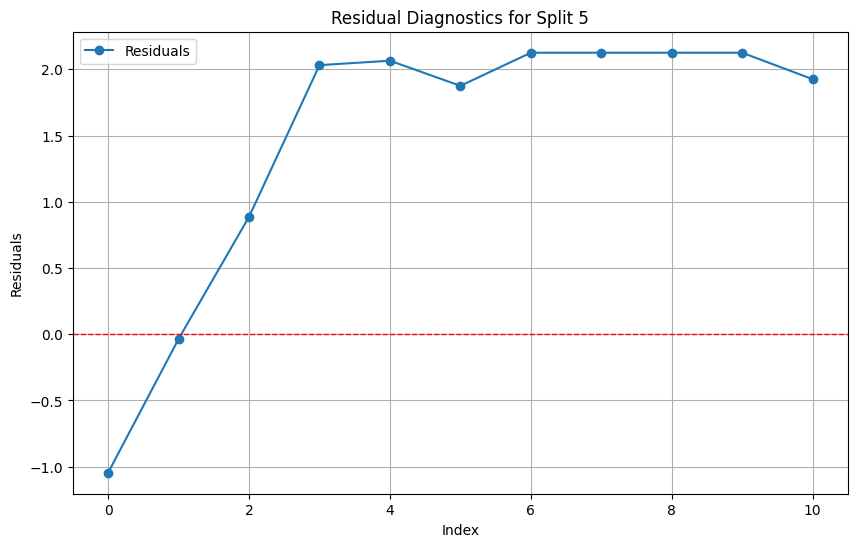

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=1.1975, MSE=1.5871, RMSE=1.2598, MAPE=55.68%
Residual ADF Statistic: -3.2455374065558824, p-value: 0.01749554483415919


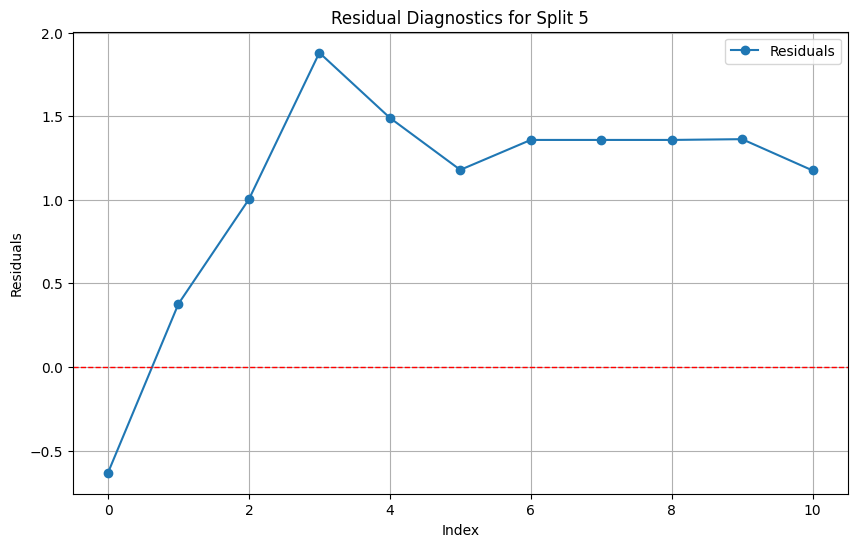

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=1.1886, MSE=1.5621, RMSE=1.2499, MAPE=55.20%
Residual ADF Statistic: -3.23134075379197, p-value: 0.018240732495989412


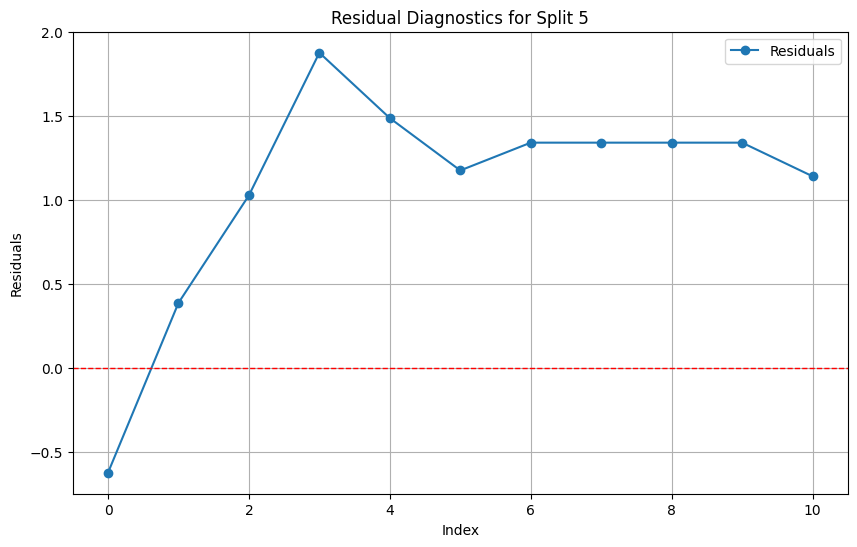

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.6906, MSE=0.6435, RMSE=0.8022, MAPE=29.83%
Residual ADF Statistic: -1.8590192623590849, p-value: 0.3515783582743244


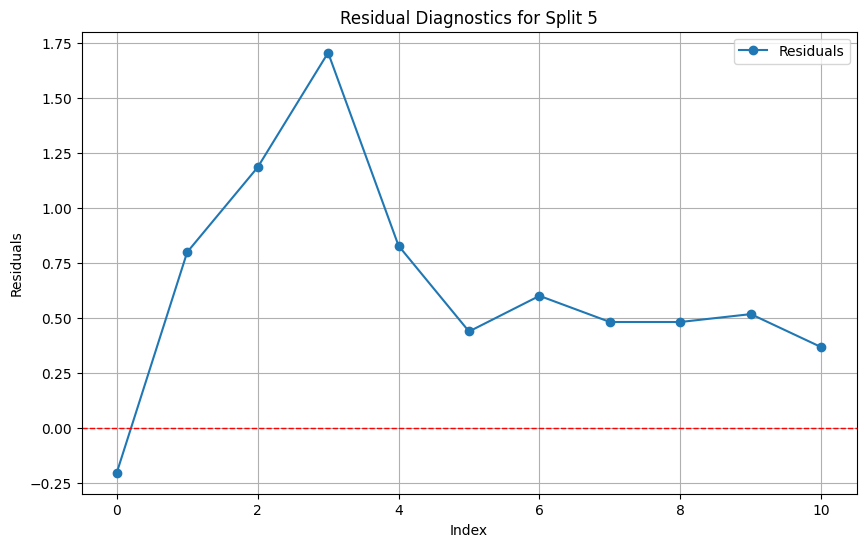

Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.7087, MSE=0.6621, RMSE=0.8137, MAPE=30.00%
Residual ADF Statistic: -1.8830333615266155, p-value: 0.34008436239563616


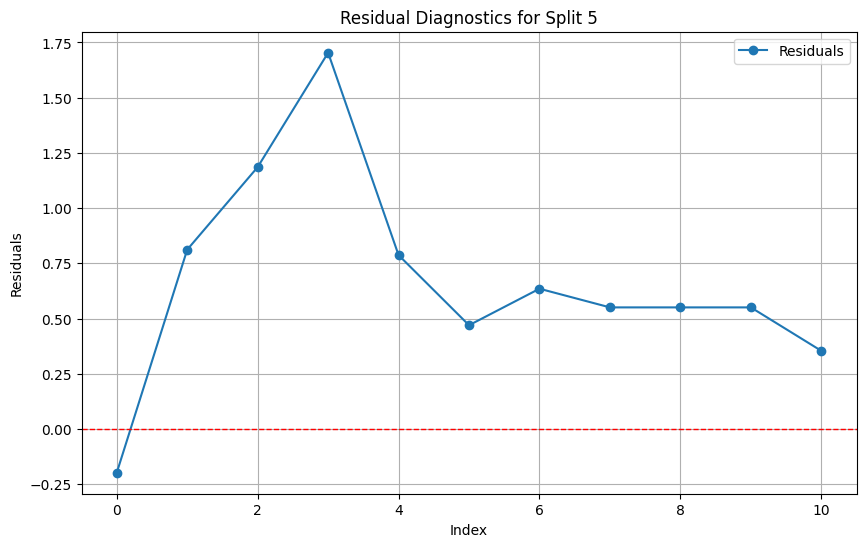

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.4785, MSE=0.5194, RMSE=0.7207, MAPE=20.22%
Residual ADF Statistic: -9.524012140043888, p-value: 3.011596619674632e-16


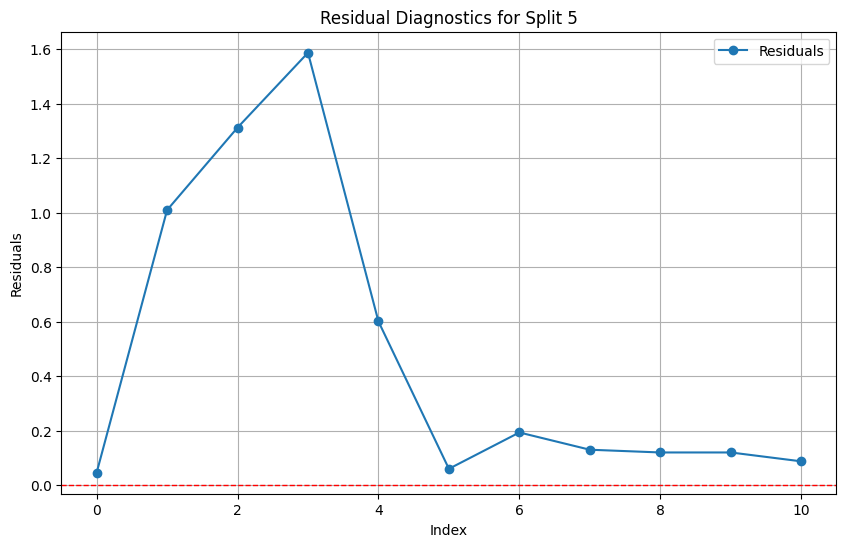

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.4865, MSE=0.5243, RMSE=0.7241, MAPE=20.59%
Residual ADF Statistic: -1.8851092539667234, p-value: 0.3390982844925242


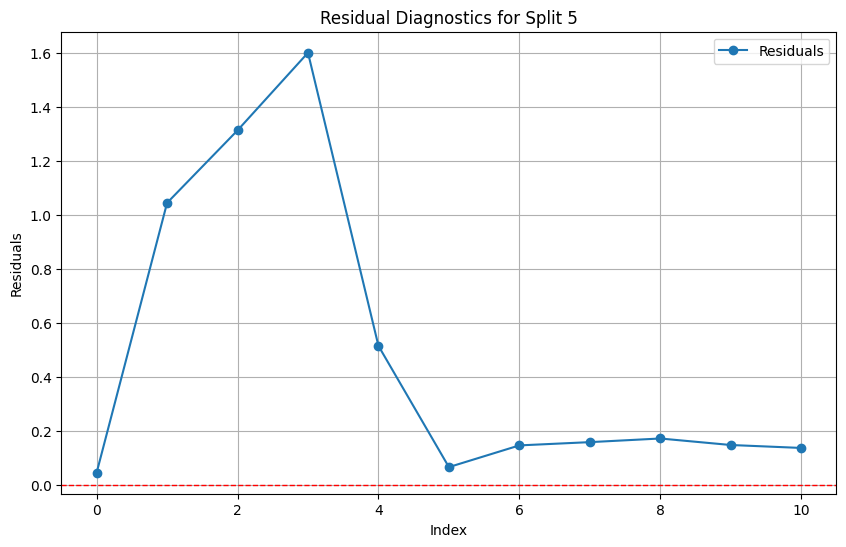

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.4586, MSE=0.5195, RMSE=0.7207, MAPE=20.00%
Residual ADF Statistic: -13.066889838351633, p-value: 1.993822687832799e-24


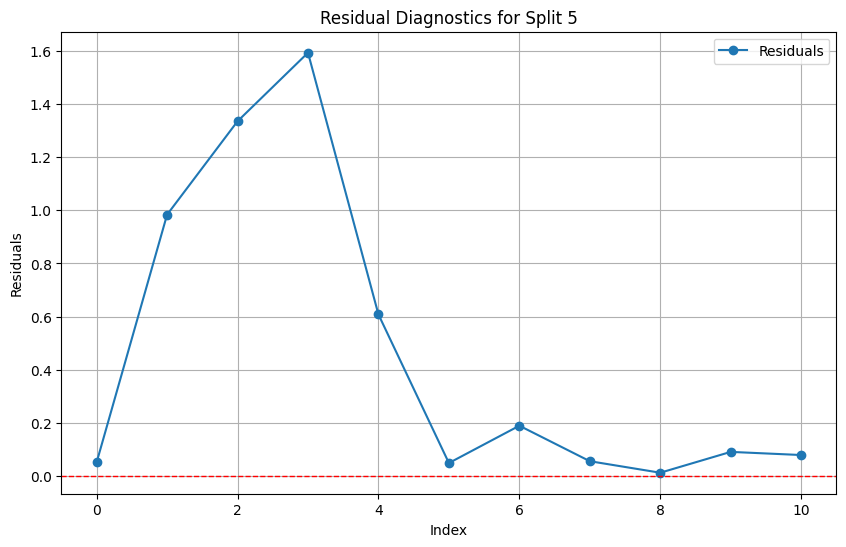

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.4605, MSE=0.5045, RMSE=0.7103, MAPE=20.87%
Residual ADF Statistic: -61.651998589567604, p-value: 0.0


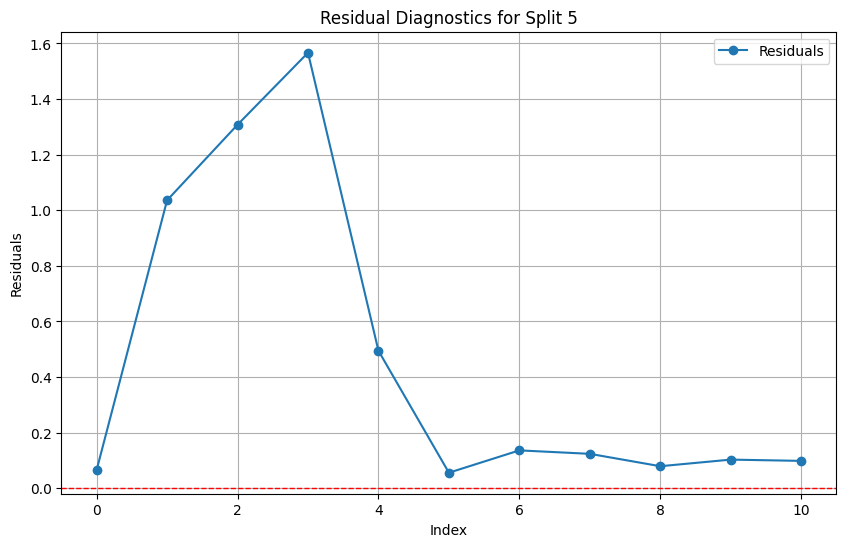

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.4614, MSE=0.5049, RMSE=0.7106, MAPE=20.31%
Residual ADF Statistic: -20.676388345141945, p-value: 0.0


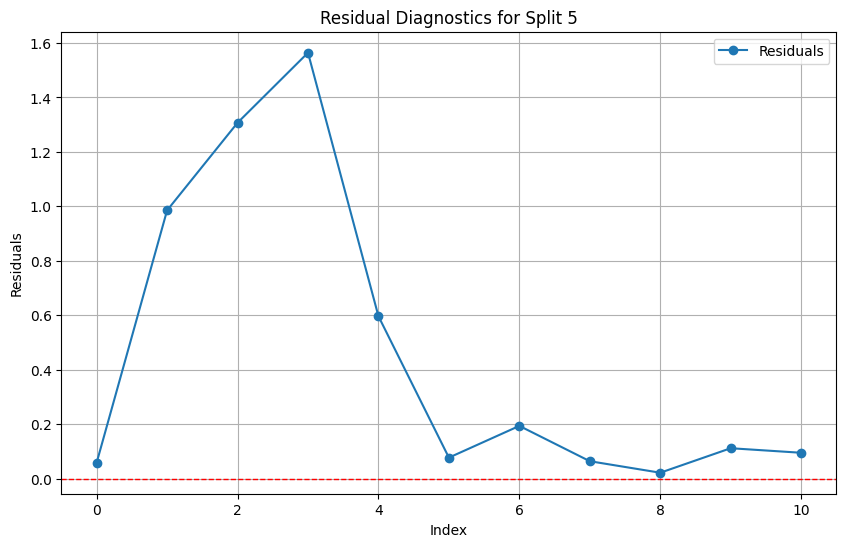

Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.4371, MSE=0.4718, RMSE=0.6869, MAPE=20.84%
Residual ADF Statistic: -24.724100353146984, p-value: 0.0


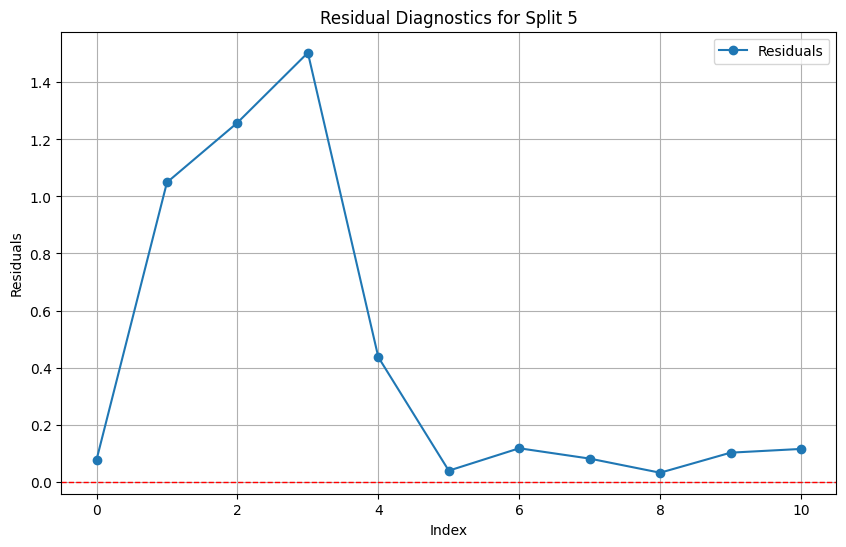

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.5068, MSE=0.5399, RMSE=0.7348, MAPE=21.27%
Residual ADF Statistic: -9.477734682590963, p-value: 3.947891834954603e-16


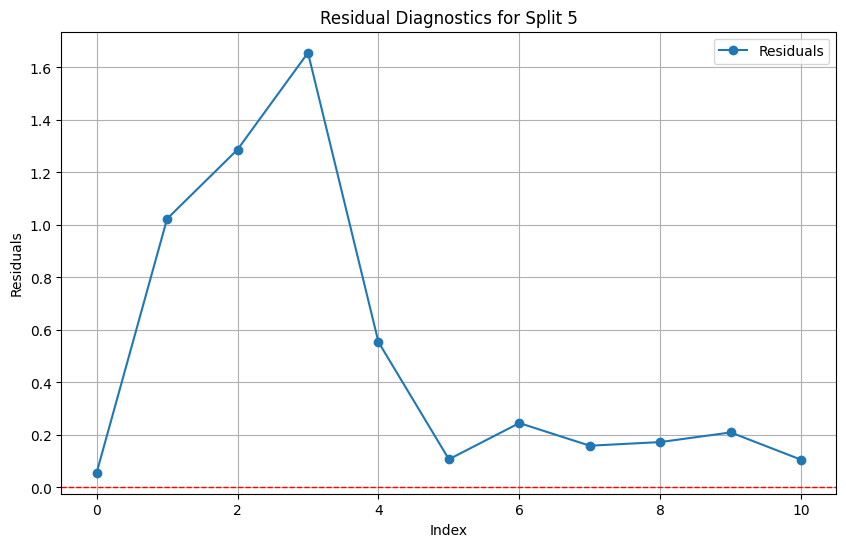

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.4614, MSE=0.5336, RMSE=0.7305, MAPE=20.88%
Residual ADF Statistic: -15.797786225530734, p-value: 1.0830478779670112e-28


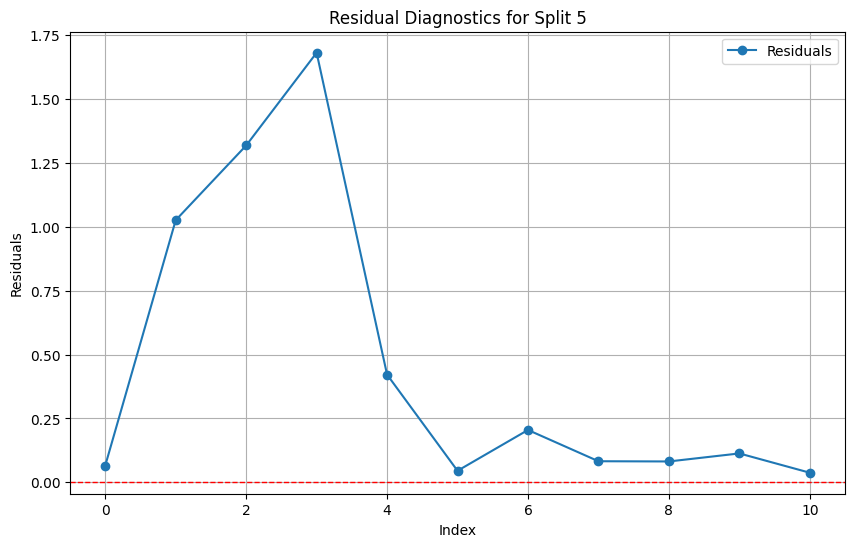

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.4812, MSE=0.5187, RMSE=0.7202, MAPE=20.96%
Residual ADF Statistic: -12.957553661894691, p-value: 3.2767735448229937e-24


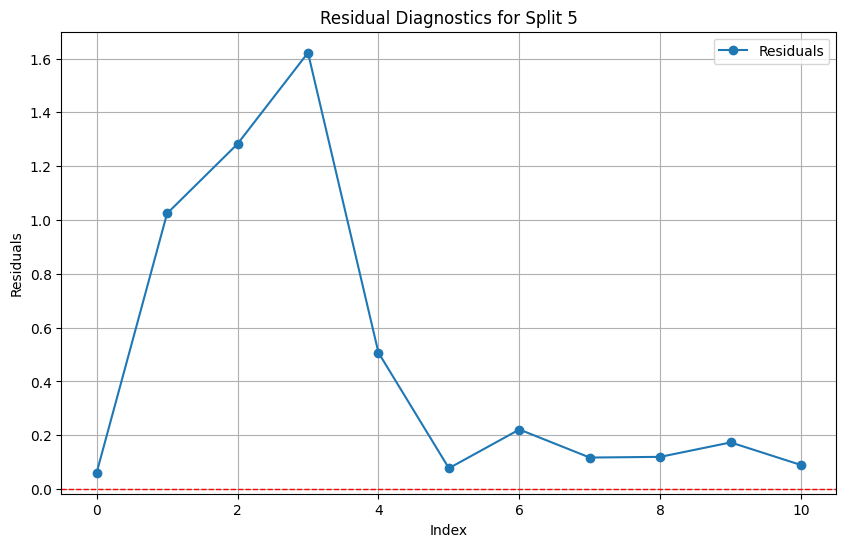

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.4190, MSE=0.5171, RMSE=0.7191, MAPE=20.37%
Residual ADF Statistic: -62.85396831872746, p-value: 0.0


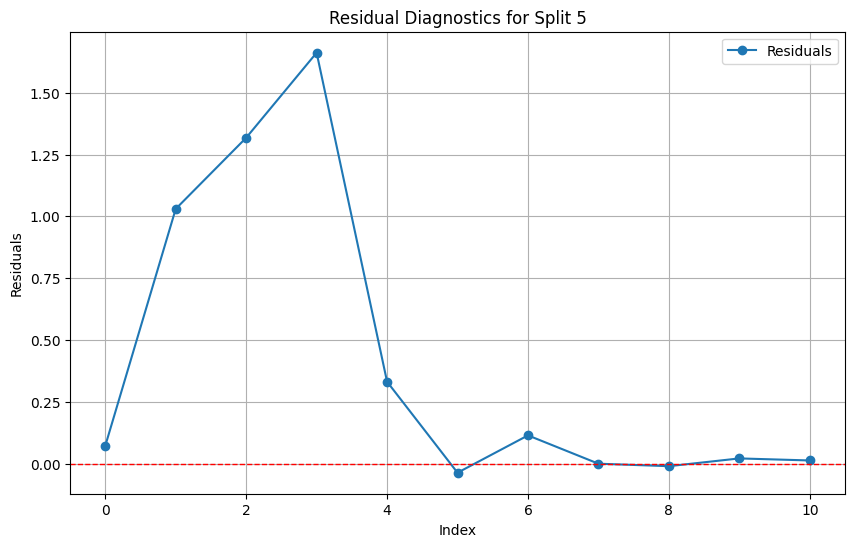

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.4809, MSE=0.5180, RMSE=0.7197, MAPE=20.95%
Residual ADF Statistic: -13.08120343371429, p-value: 1.8692448659611886e-24


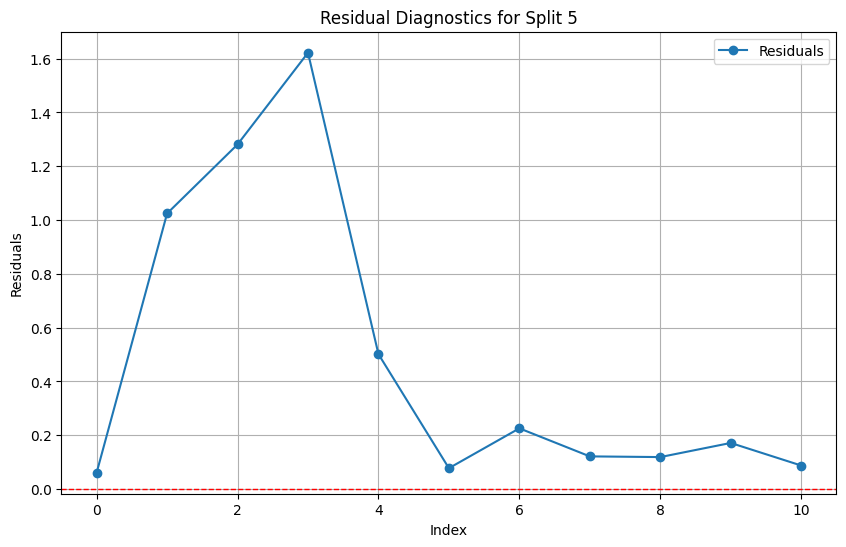

Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.4178, MSE=0.5146, RMSE=0.7173, MAPE=20.35%
Residual ADF Statistic: -67.05246189909607, p-value: 0.0


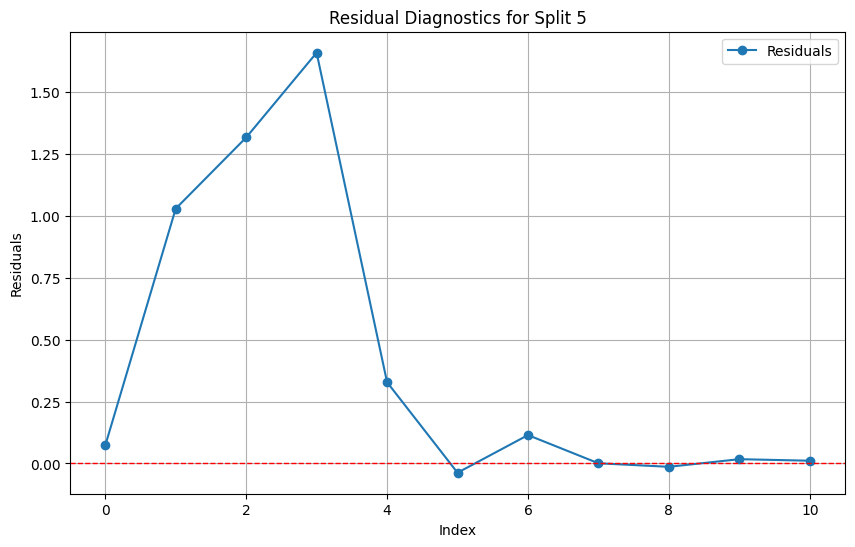

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.5001, MSE=0.5132, RMSE=0.7164, MAPE=21.67%
Residual ADF Statistic: -7.495260565929478, p-value: 4.396803397985405e-11


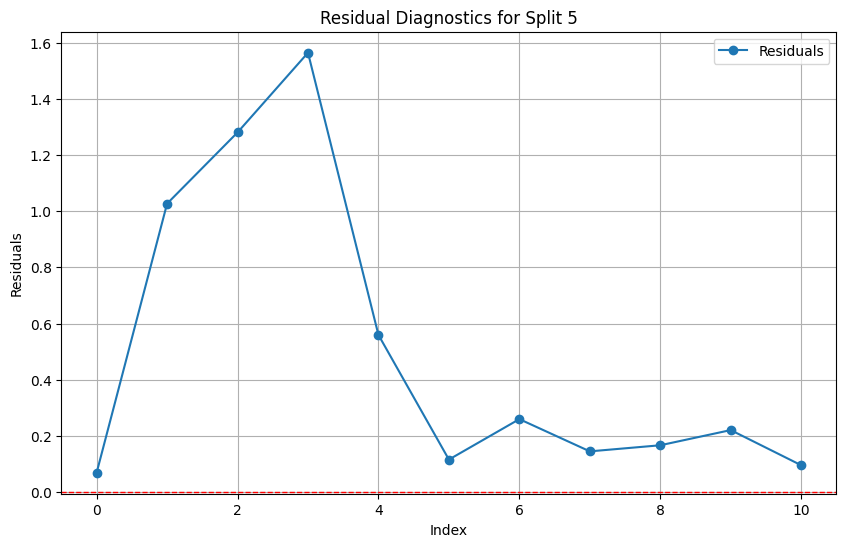

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.4616, MSE=0.5053, RMSE=0.7108, MAPE=21.54%
Residual ADF Statistic: -9.519921815054527, p-value: 3.0844918117495715e-16


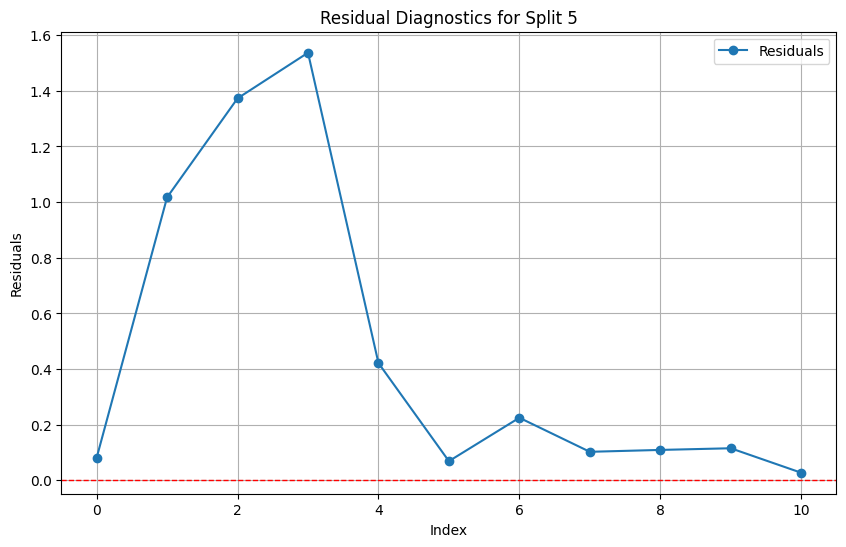

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.4748, MSE=0.4997, RMSE=0.7069, MAPE=21.80%
Residual ADF Statistic: -9.854739392625577, p-value: 4.389917833378162e-17


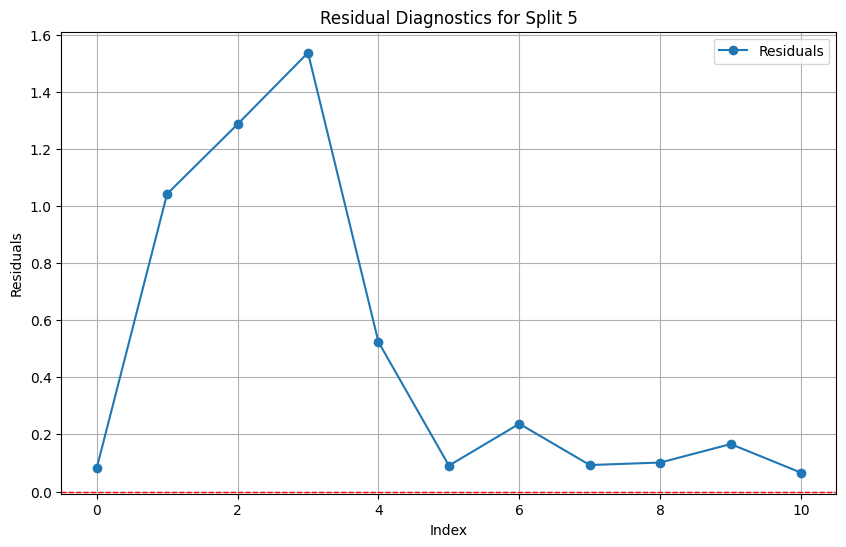

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.4329, MSE=0.4947, RMSE=0.7033, MAPE=21.42%
Residual ADF Statistic: -12.334327377259417, p-value: 6.323027170288682e-23


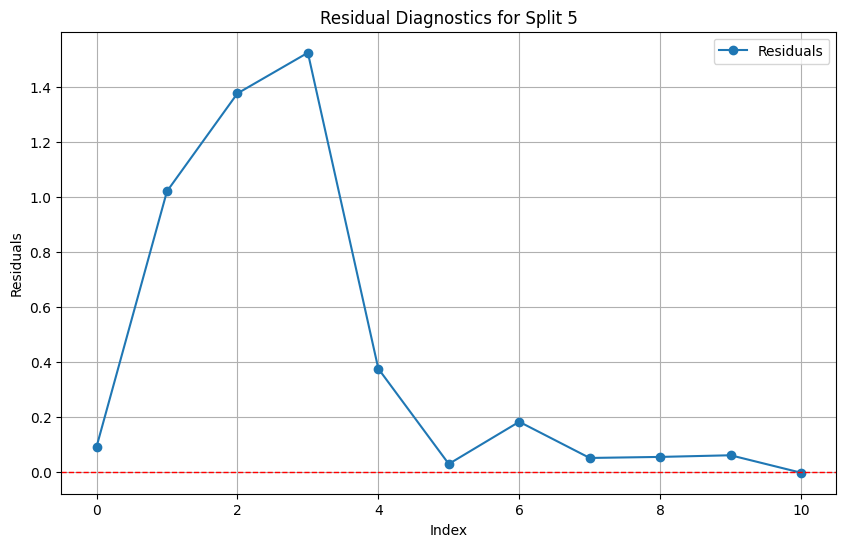

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.4749, MSE=0.5007, RMSE=0.7076, MAPE=21.79%
Residual ADF Statistic: -10.04300495197369, p-value: 1.4792322602050054e-17


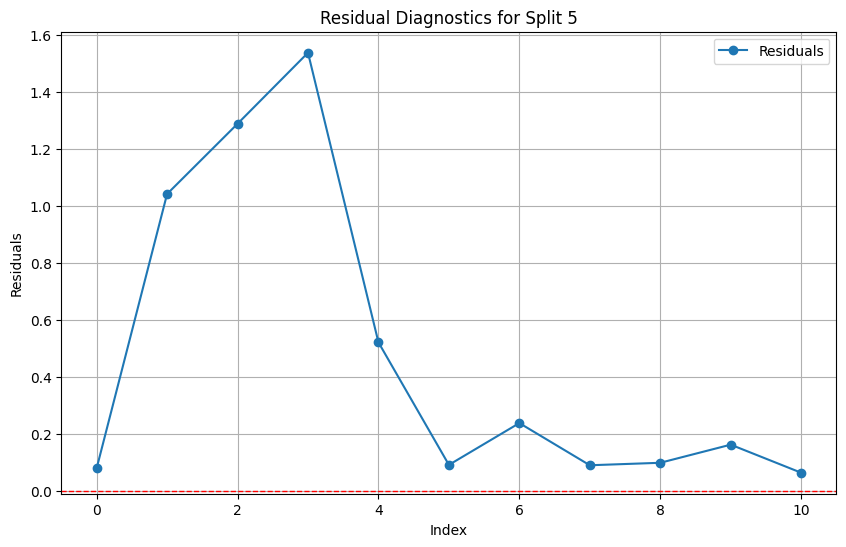

Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.4309, MSE=0.4941, RMSE=0.7029, MAPE=21.38%
Residual ADF Statistic: -12.720138884215512, p-value: 9.867893362480548e-24


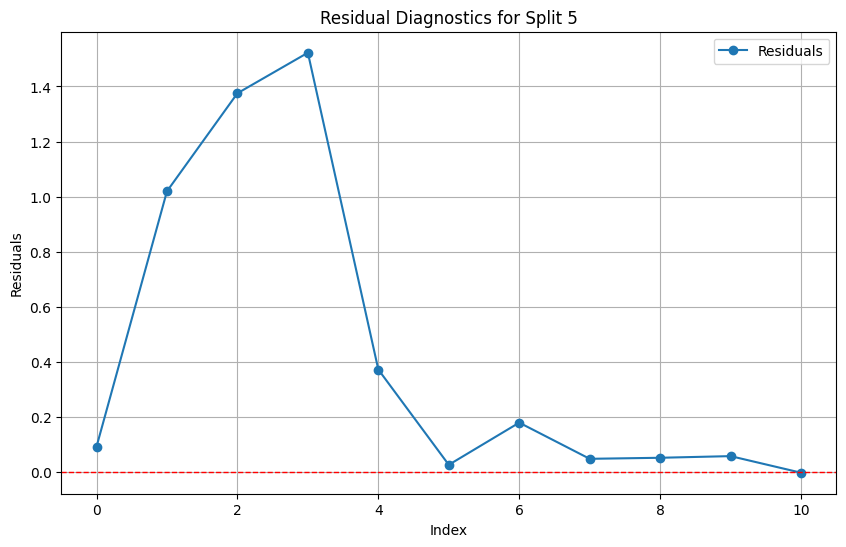

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.4982, MSE=0.5056, RMSE=0.7110, MAPE=21.85%
Residual ADF Statistic: -19.67192287177981, p-value: 0.0


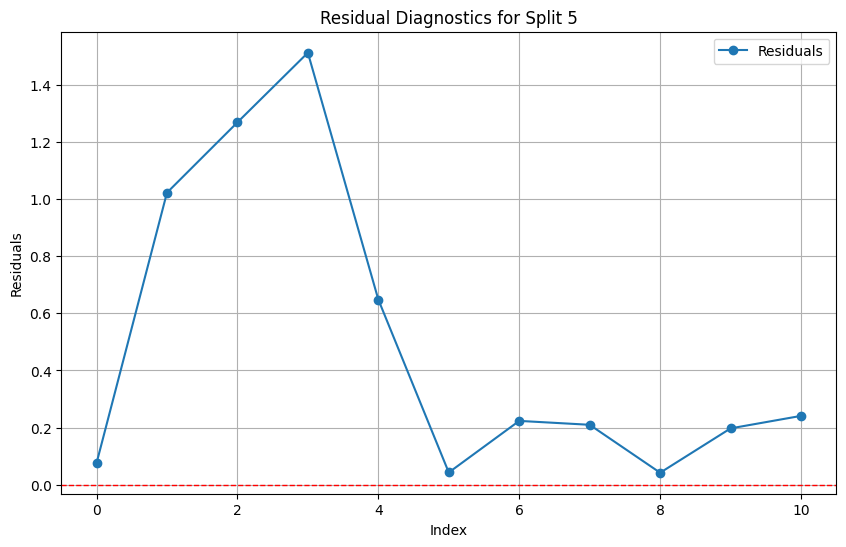

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.4521, MSE=0.4550, RMSE=0.6745, MAPE=21.03%
Residual ADF Statistic: -8.789593062388969, p-value: 2.2594350667462253e-14


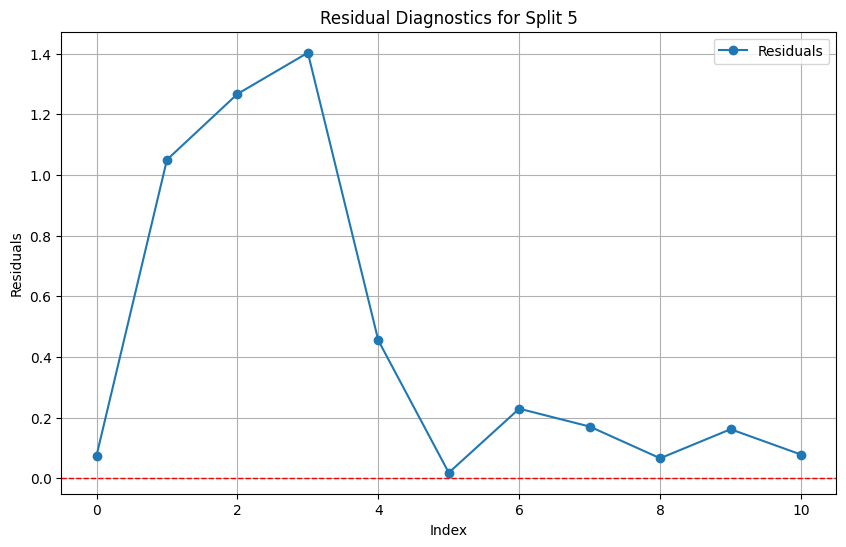

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.5239, MSE=0.5237, RMSE=0.7237, MAPE=22.66%
Residual ADF Statistic: -13.836057571568087, p-value: 7.439659919683339e-26


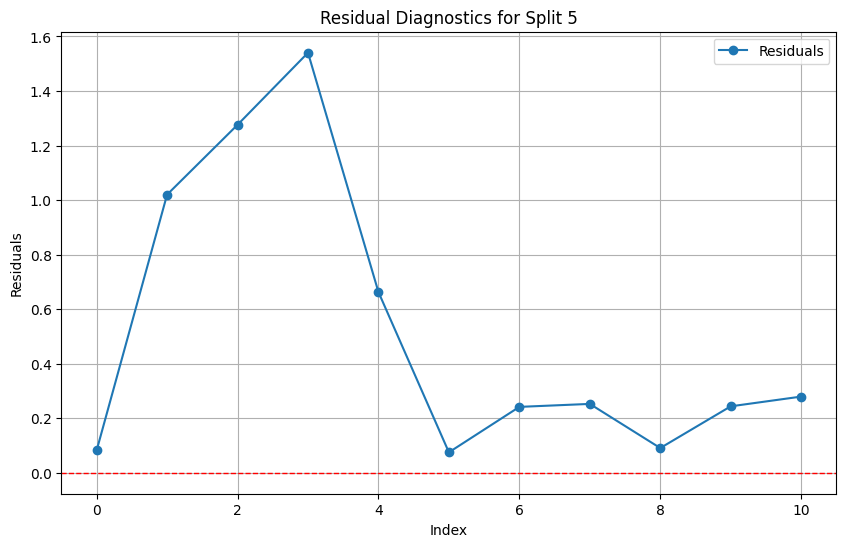

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.4396, MSE=0.4358, RMSE=0.6601, MAPE=21.09%
Residual ADF Statistic: -10.500430501552692, p-value: 1.087596175881139e-18


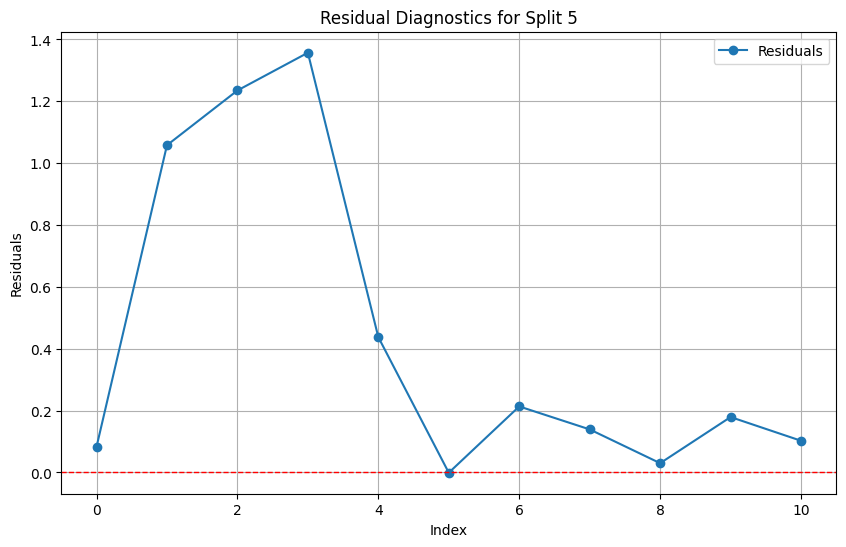

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.5204, MSE=0.5202, RMSE=0.7213, MAPE=22.54%
Residual ADF Statistic: -13.139815534254405, p-value: 1.4370682656505524e-24


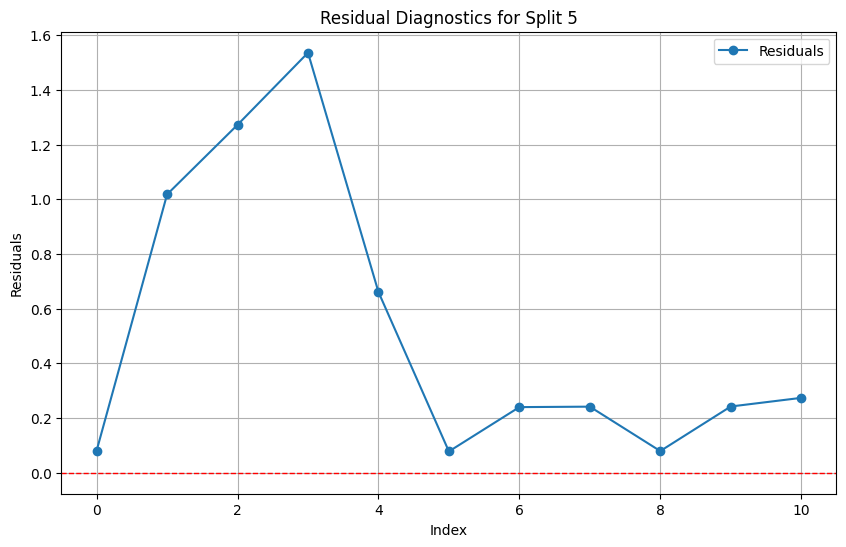

Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.4362, MSE=0.4328, RMSE=0.6579, MAPE=20.99%
Residual ADF Statistic: -11.025484234563635, p-value: 5.842691513279212e-20


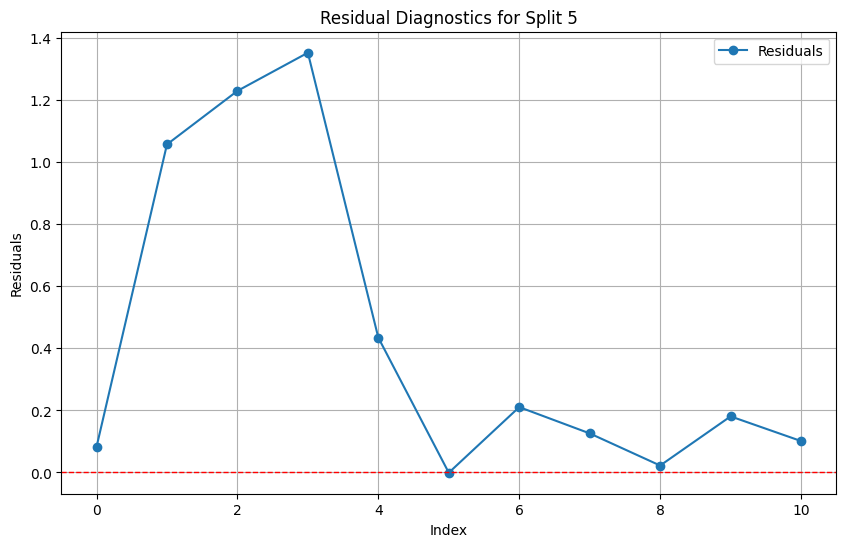

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.5570, MSE=0.5671, RMSE=0.7531, MAPE=22.57%
Residual ADF Statistic: -11.138031625466844, p-value: 3.1591580198309503e-20


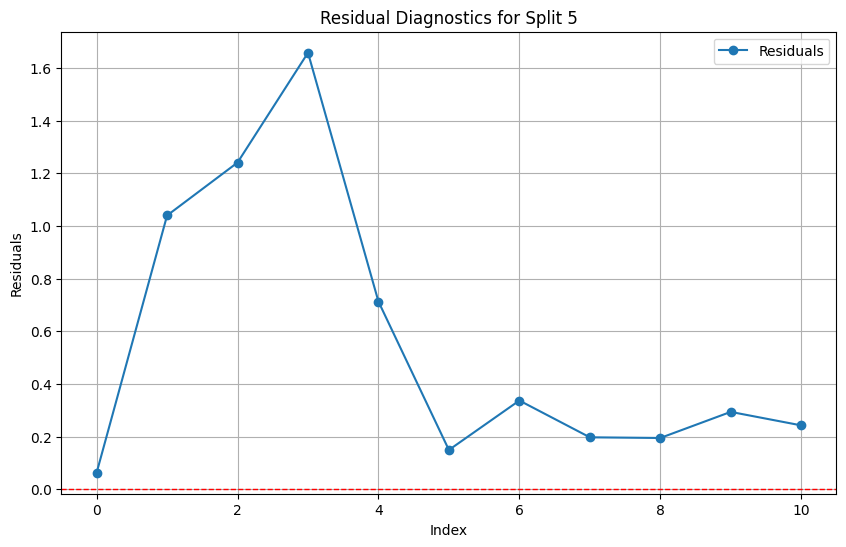

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.4227, MSE=0.5214, RMSE=0.7221, MAPE=20.15%
Residual ADF Statistic: -1.5675362687474357, p-value: 0.49987752197242546


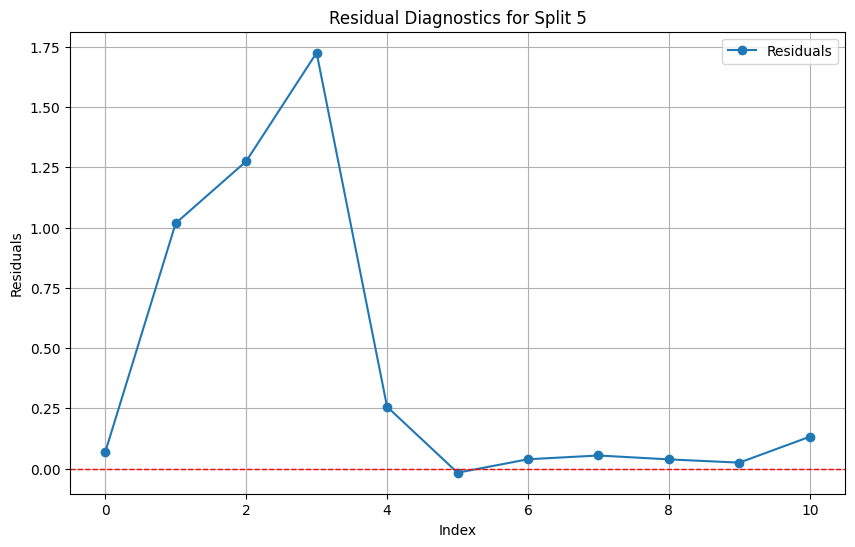

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.5559, MSE=0.5639, RMSE=0.7509, MAPE=22.47%
Residual ADF Statistic: -10.843467900302903, p-value: 1.5941159883235646e-19


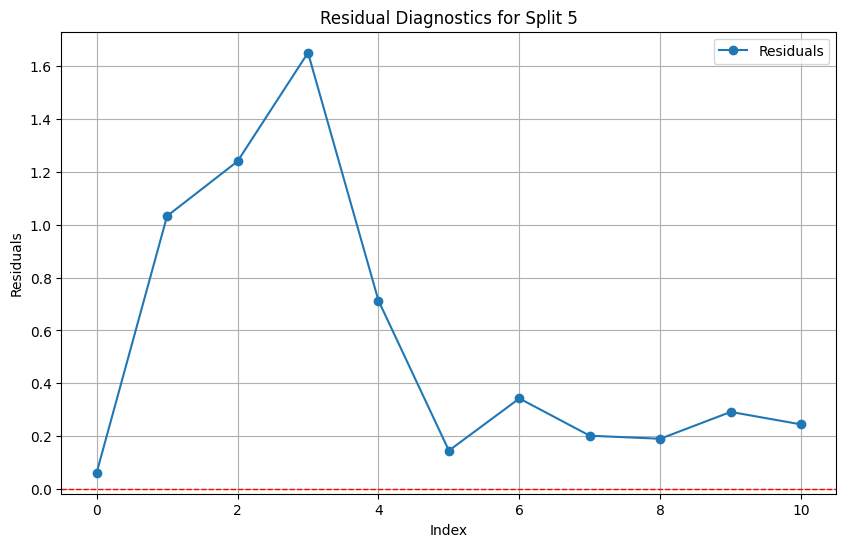

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.4210, MSE=0.5178, RMSE=0.7196, MAPE=20.09%
Residual ADF Statistic: -1.5640163081684637, p-value: 0.501639696600266


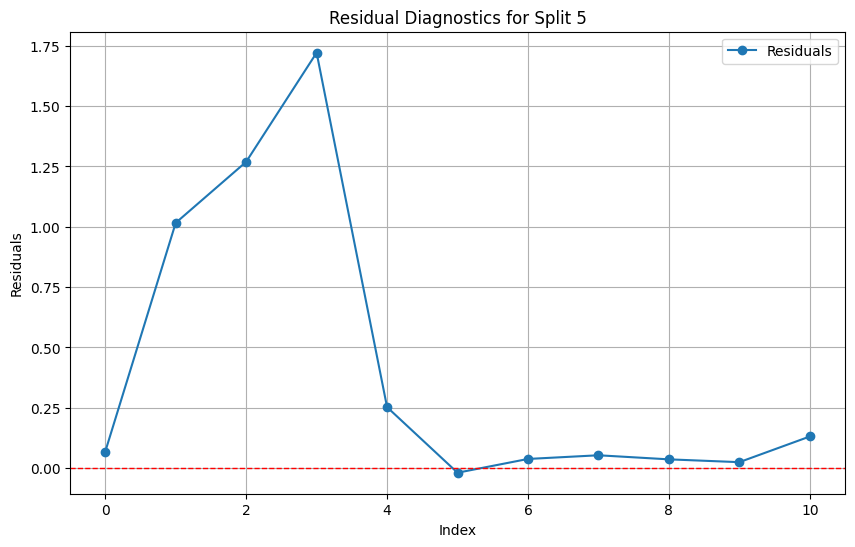

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.5559, MSE=0.5638, RMSE=0.7509, MAPE=22.46%
Residual ADF Statistic: -10.882901130200022, p-value: 1.2813654033021527e-19


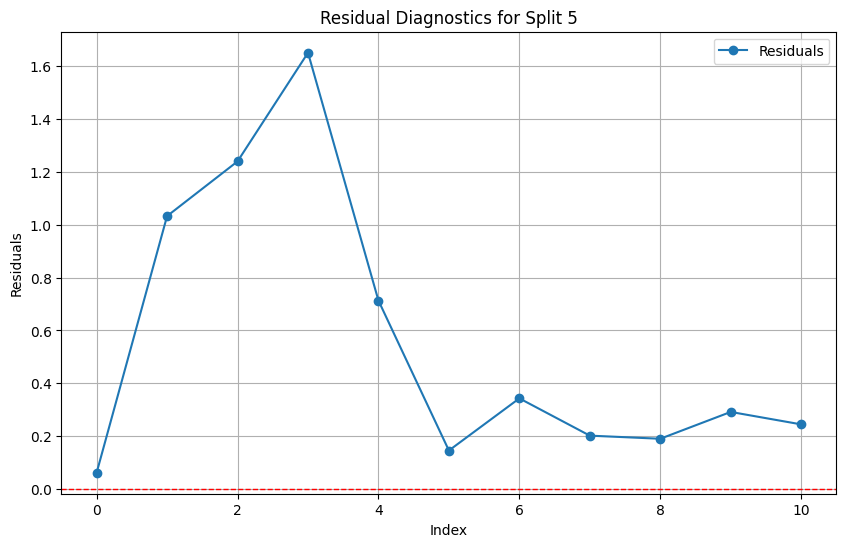

Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.4210, MSE=0.5178, RMSE=0.7196, MAPE=20.09%
Residual ADF Statistic: -1.5640159845136792, p-value: 0.5016398585926781


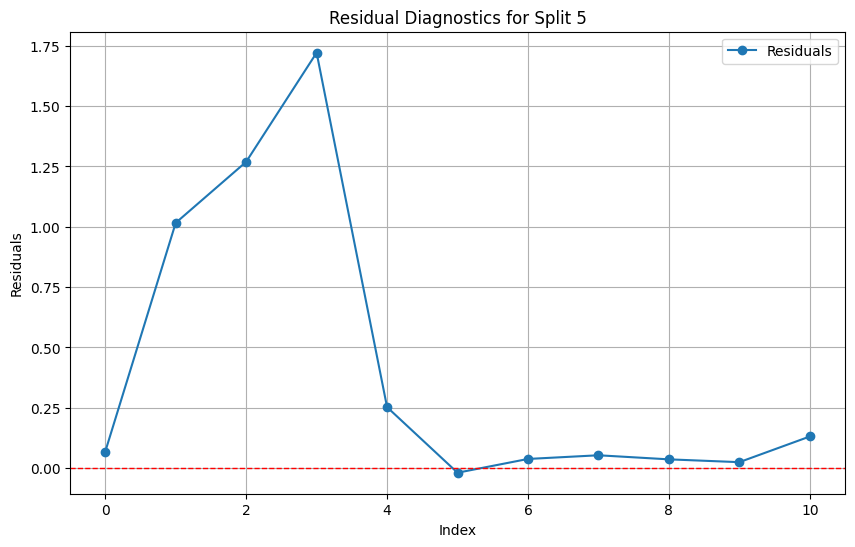

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50, 'subsample': 0.8}, Metrics: MAE=0.4591, MSE=0.5123, RMSE=0.7157, MAPE=21.40%
Residual ADF Statistic: -6.794439423786954, p-value: 2.3201908565349443e-09


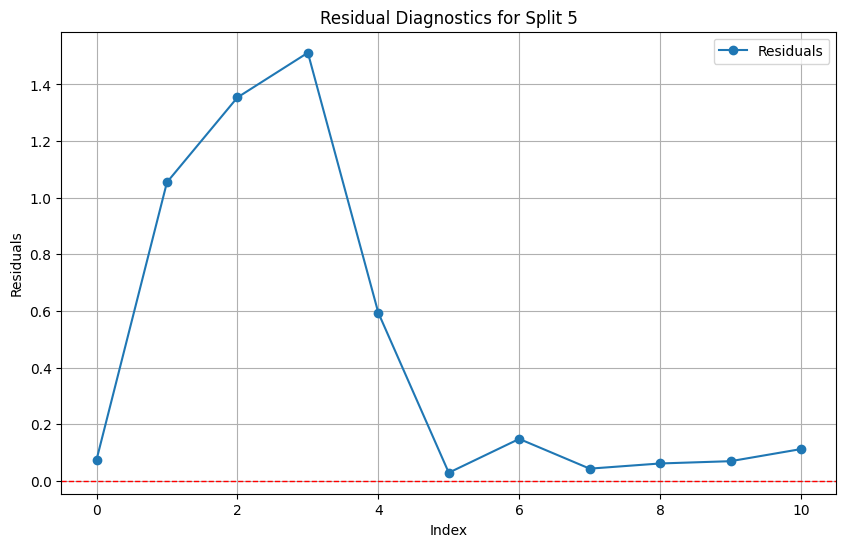

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50, 'subsample': 1.0}, Metrics: MAE=0.4239, MSE=0.4824, RMSE=0.6946, MAPE=20.77%
Residual ADF Statistic: -1.9381679841672095, p-value: 0.3143241028104081


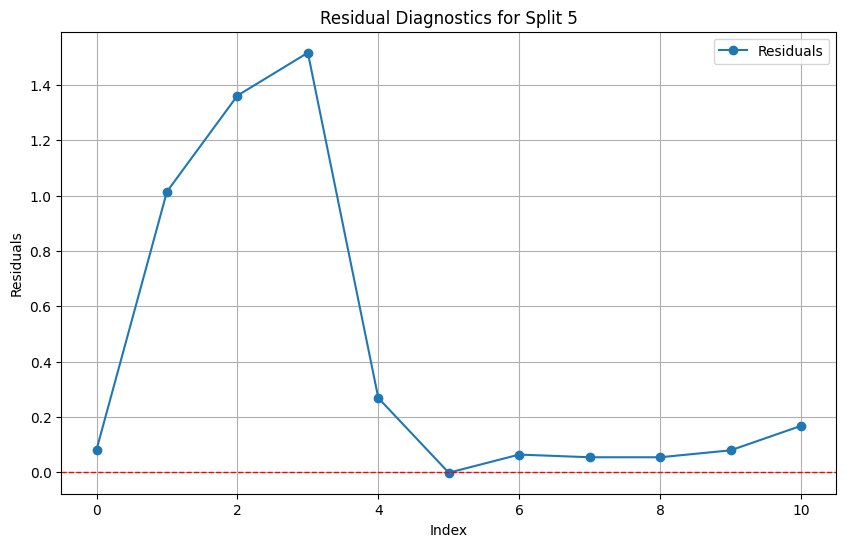

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.8}, Metrics: MAE=0.4578, MSE=0.5113, RMSE=0.7150, MAPE=21.40%
Residual ADF Statistic: -7.008983135439255, p-value: 7.001302876346213e-10


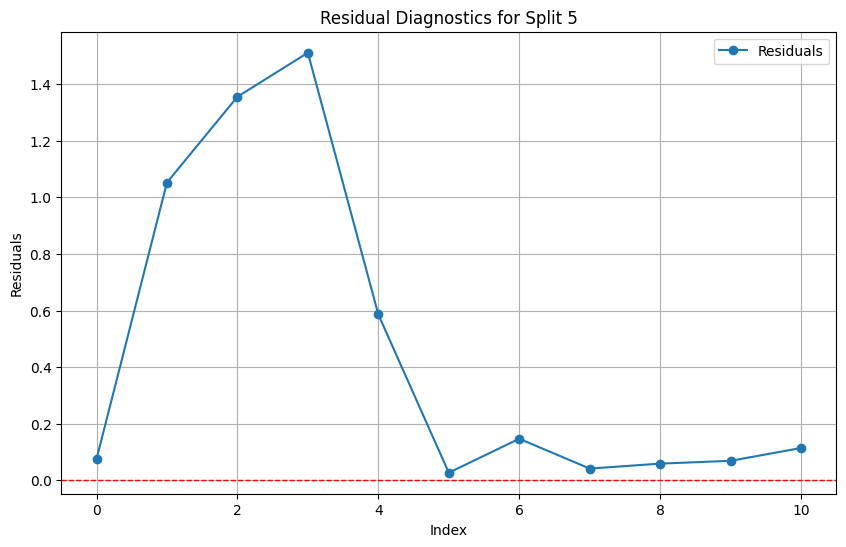

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 100, 'subsample': 1.0}, Metrics: MAE=0.4218, MSE=0.4819, RMSE=0.6942, MAPE=20.73%
Residual ADF Statistic: -1.9351522861323702, p-value: 0.3157092792013928


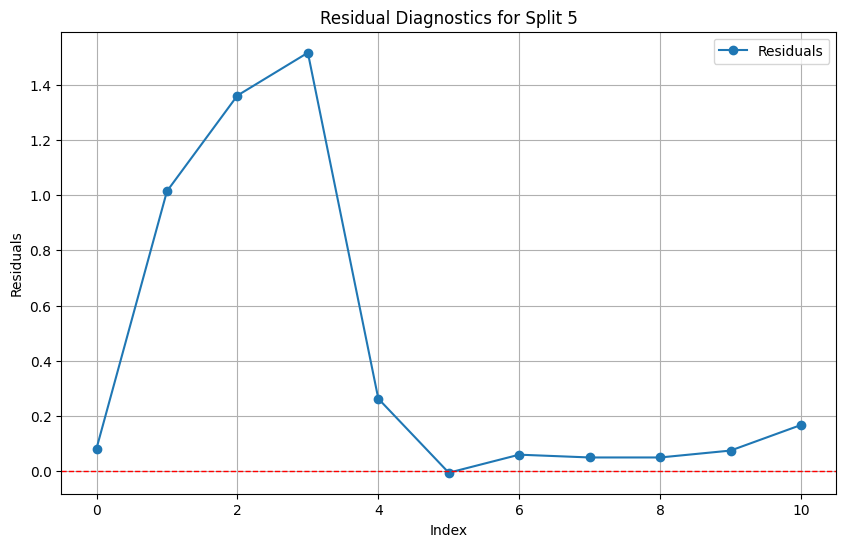

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8}, Metrics: MAE=0.4578, MSE=0.5113, RMSE=0.7151, MAPE=21.41%
Residual ADF Statistic: -7.014598325663335, p-value: 6.783743426385984e-10


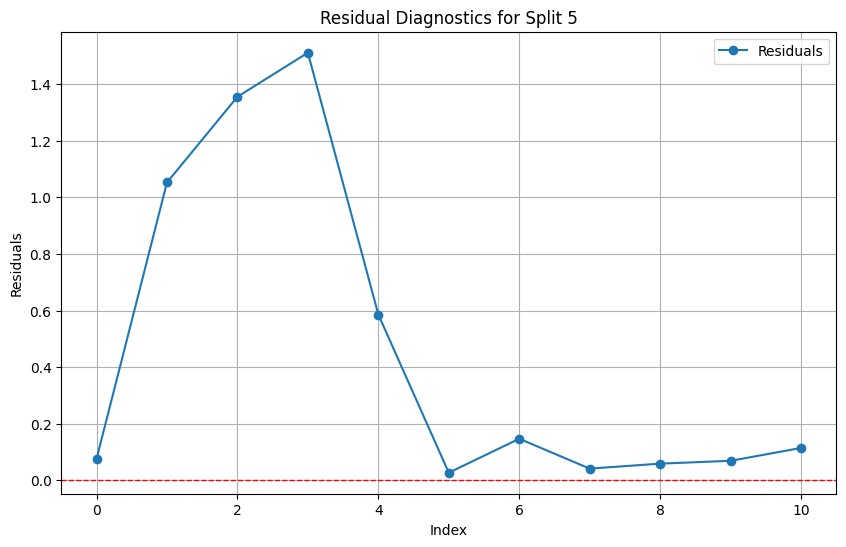

Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 200, 'subsample': 1.0}, Metrics: MAE=0.4218, MSE=0.4819, RMSE=0.6942, MAPE=20.73%
Residual ADF Statistic: -1.9351524349802252, p-value: 0.3157092107620587


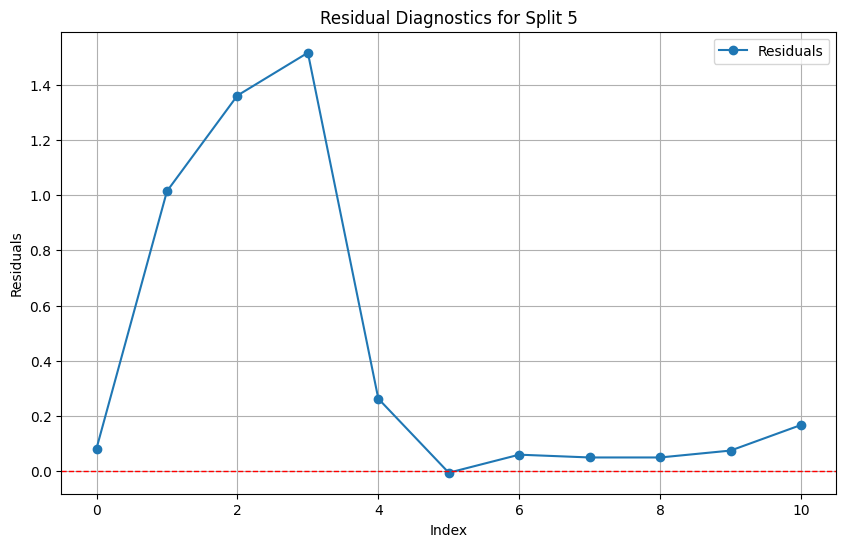

Best model saved as 'best_xgboost_model.pkl'.
Best Model Details:
Best Parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
MAE: 0.3070
MSE: 0.1736
RMSE: 0.4167
MAPE: 9.5536


In [48]:
import xgboost as xgb
from sklearn.model_selection import ParameterGrid
from xgboost import XGBRegressor
def create_lagged_features(data, lag):
    df = pd.DataFrame(data, columns=["value"])
    for i in range(1, lag + 1):
        df[f"lag_{i}"] = df["value"].shift(i)
    return df.dropna()
def grid_search_xgboost(splits, param_grid, lag=12):
    best_model = None
    best_metrics = {}
    best_params = None
    best_mape = float('inf')

    for i, (train, test) in enumerate(splits):
        print(f"Processing Split {i + 1}...")

        # Create lagged features
        train_df = create_lagged_features(train[:, -1], lag)
        test_df = create_lagged_features(test[:, -1], lag)

        X_train, y_train = train_df.iloc[:, 1:].values, train_df["value"].values
        X_test, y_test = test_df.iloc[:, 1:].values, test_df["value"].values

        # Perform grid search
        for params in ParameterGrid(param_grid):
            model = XGBRegressor(**params, random_state=42)
            model.fit(X_train, y_train)
            predictions = model.predict(X_test)

            mae, mse, rmse, mape = evaluate_metrics(y_test, predictions)
            print(f"Parameters: {params}, Metrics: MAE={mae:.4f}, MSE={mse:.4f}, RMSE={rmse:.4f}, MAPE={mape:.2f}%")

            # Update best model if MAPE improves
            if mape < best_mape:
                best_mape = mape
                best_model = model
                best_metrics = {'MAE': mae, 'MSE': mse, 'RMSE': rmse, 'MAPE': mape}
                best_params = params

            # Residual diagnostics
            residuals = y_test - predictions
            adf_test = adfuller(residuals)
            print(f"Residual ADF Statistic: {adf_test[0]}, p-value: {adf_test[1]}")

            # Plot residuals
            plt.figure(figsize=(10, 6))
            plt.plot(residuals, marker='o', linestyle='-', label='Residuals')
            plt.axhline(0, color='red', linestyle='--', linewidth=1)
            plt.title(f"Residual Diagnostics for Split {i + 1}")
            plt.xlabel("Index")
            plt.ylabel("Residuals")
            plt.legend()
            plt.grid(True)
            plt.show()

    return best_model, best_params, best_metrics

# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 1.0],
}

# Perform grid search with cross-validation
best_model, best_params, best_metrics = grid_search_xgboost(splits, param_grid, lag=12)

# Save the best model
if best_model:
    with open('best_xgboost_model.pkl', 'wb') as file:
        pickle.dump(best_model, file)
    print("Best model saved as 'best_xgboost_model.pkl'.")

# Print the best model details
print("Best Model Details:")
print(f"Best Parameters: {best_params}")
for metric, value in best_metrics.items():
    print(f"{metric}: {value:.4f}")

We have got the lowest value of **MAPE = 9.5536** so the XGBoost model is the best performing model.

# Neural Network based time series models:

## Long Short-Term Memory (LSTM)

- **A type of RNN** proposed by Hochreiter and Schmidhuber in 1997 as a solution to the vanishing gradients problem.

---

### Key Characteristics:
- On step $t$:
  - There is a **hidden state** $h^{(t)}$ and a **cell state** $c^{(t)}$.
  - Both are vectors of length $n$.
  - The cell stores **long-term information**.
  - The LSTM can **erase**, **write**, and **read** information from the cell.

---

### Gate Mechanism:
- The selection of which information is erased/written/read is controlled by **three corresponding gates**:
  - The gates are also vectors of length $n$.
  - On each timestep, each element of the gates can be:
  - **Open** ($1$),
  - **Closed** ($0$),
  - Or somewhere **in-between**.
  - The gates are **dynamic**: their value is computed based on the current context.

### LSTM Gate Operations

We have a sequence of inputs $x^{(t)}$, and we compute a sequence of hidden states $h^{(t)}$ and cell states $c^{(t)}$ on time step $t$:

#### Gates

1. **Forget Gate**: Controls what is kept vs. forgotten from the previous cell state
   $$ f^{(t)} = \sigma(W_f h^{(t-1)} + U_f x^{(t)} + b_f) $$

2. **Input Gate**: Controls what parts of the new cell content are written to the cell
   $$ i^{(t)} = \sigma(W_i h^{(t-1)} + U_i x^{(t)} + b_i) $$

3. **Output Gate**: Controls what parts of the cell are output to the hidden state
   $$ o^{(t)} = \sigma(W_o h^{(t-1)} + U_o x^{(t)} + b_o) $$

---

#### Cell and Hidden State Updates

1. **New Cell Content**: This is the new content to be written to the cell
   $$ \tilde{c}^{(t)} = \tanh(W_c h^{(t-1)} + U_c x^{(t)} + b_c) $$

2. **Cell Content**: Erase ("forget") some content from the last cell state and write ("input") some new cell content
   $$ c^{(t)} = f^{(t)} \odot c^{(t-1)} + i^{(t)} \odot \tilde{c}^{(t)} $$

3. **Hidden State**: Read ("output") some content from the cell
   $$ h^{(t)} = o^{(t)} \odot \tanh(c^{(t)}) $$

---

![LSTM_Image](https://drive.google.com/uc?id=1-Bbz1n9XNZ2NvJGPS0W-BQ9pemXXh8d_)
#### Notes
- $\sigma$: Sigmoid activation function.
- $\tanh$: Hyperbolic tangent activation function.
- $\odot$: Element-wise product (Hadamard product).
- Gates dynamically decide what information to keep, update, or output.



![LSTM_Image2](https://drive.google.com/uc?id=1lFTXMaws-Ax3yFKwuK6S659gacjnta3j)

#### How Does LSTM Solve Vanishing Gradients?

- The LSTM architecture makes it easier for the RNN to preserve information over many timesteps:
  - For example, if the forget gate is set to remember everything on every timestep, then the information in the cell is preserved indefinitely.
  - By contrast, it is harder for a vanilla RNN to learn a recurrent weight matrix $W_h$ that preserves information in the hidden state.

---

- LSTM doesn’t guarantee that there is no vanishing or exploding gradient, but it does provide an easier way for the model to learn long-distance dependencies.


In [103]:
class EnhancedRNN(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size, dropout_rate=0.1):
        super(EnhancedRNN, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(
            input_size,
            hidden_size,
            num_layers,
            batch_first=True,
            dropout=dropout_rate if num_layers > 1 else 0.0
        )
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        batch_size = x.size(0)
        h0 = torch.zeros(self.num_layers, batch_size, self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, batch_size, self.hidden_size).to(x.device)
        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])  # Take the output from the last time step
        return out


def grid_search_rnn(splits, param_grid, input_size, output_size):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    best_model, best_params, best_metrics = None, None, {'MAPE': float('inf')}

    for params in itertools.product(*param_grid.values()):
        hidden_size, num_layers, learning_rate, num_epochs, batch_size, dropout_rate = params
        print(f"Evaluating params: {params}")

        metrics = {'MAPE': 0, 'MAE': 0, 'MSE': 0, 'RMSE': 0}
        for i, (train, test) in enumerate(splits):
            X_train, y_train = train[:, :-1], train[:, -1]
            X_test, y_test = test[:, :-1], test[:, -1]

            # Normalize Data
            scaler = MinMaxScaler()
            X_train = scaler.fit_transform(X_train)
            X_test = scaler.transform(X_test)
            y_train = scaler.fit_transform(y_train.reshape(-1, 1)).flatten()
            y_test = scaler.transform(y_test.reshape(-1, 1)).flatten()

            # Convert to Tensor
            train_dataset = TensorDataset(
                torch.tensor(X_train, dtype=torch.float32).view(-1, 1, input_size),
                torch.tensor(y_train, dtype=torch.float32)
            )
            test_dataset = TensorDataset(
                torch.tensor(X_test, dtype=torch.float32).view(-1, 1, input_size),
                torch.tensor(y_test, dtype=torch.float32)
            )

            train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
            test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

            # Initialize Model
            model = EnhancedRNN(input_size, hidden_size, num_layers, output_size, dropout_rate).to(device)
            criterion = nn.MSELoss()
            optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

            # Train Model
            model.train()
            for epoch in range(num_epochs):
                epoch_loss = 0
                for X_batch, y_batch in train_loader:
                    optimizer.zero_grad()
                    output = model(X_batch.to(device))
                    loss = criterion(output, y_batch.to(device).unsqueeze(-1))
                    loss.backward()
                    optimizer.step()
                    epoch_loss += loss.item()

                if (epoch + 1) % 10 == 0:
                    print(f"Epoch {epoch + 1}/{num_epochs}, Loss: {epoch_loss/len(train_loader):.4f}")

            # Evaluate Model
            model.eval()
            y_true, y_pred = [], []
            with torch.no_grad():
                for X_batch, y_batch in test_loader:
                    output = model(X_batch.to(device))
                    y_true.extend(y_batch.numpy())
                    y_pred.extend(output.cpu().numpy().flatten())

            # Calculate Metrics
            y_true, y_pred = np.array(y_true), np.array(y_pred)
            mape = np.mean(np.abs((y_true - y_pred) / np.maximum(y_true, 1e-5))) * 100
            mae = np.mean(np.abs(y_true - y_pred))
            mse = np.mean((y_true - y_pred) ** 2)
            rmse = np.sqrt(mse)
            metrics['MAPE'] += mape
            metrics['MAE'] += mae
            metrics['MSE'] += mse
            metrics['RMSE'] += rmse

        # Average Metrics
        for key in metrics:
            metrics[key] /= len(splits)

        print(f"Metrics: {metrics}")
        if metrics['MAPE'] < best_metrics['MAPE']:
            best_metrics = metrics
            best_model = model
            best_params = {
                'hidden_size': hidden_size,
                'num_layers': num_layers,
                'learning_rate': learning_rate,
                'num_epochs': num_epochs,
                'batch_size': batch_size,
                'dropout_rate': dropout_rate,
            }

    return best_model, best_params, best_metrics


# Define Parameter Grid
param_grid = {
    'hidden_size': [8, 16, 32,64,128],
    'num_layers': [1, 2],
    'learning_rate': [0.001, 0.01,0.1],
    'num_epochs': [50],
    'batch_size': [16, 32,64,128],
    'dropout_rate': [0.1, 0.2, 0.3,0.4,0.5]
}

# Perform Grid Search
best_model, best_params, best_metrics = grid_search_rnn(splits, param_grid, input_size=500, output_size=1)

# Save Best Model
torch.save(best_model.state_dict(), "best_rnn_model.pth")
print("Best Model Saved as 'best_rnn_model.pth'")
print("Best Parameters:", best_params)
print("Best Metrics:", best_metrics)


Streaming output truncated to the last 5000 lines.
Epoch 50/50, Loss: 0.0304
Metrics: {'MAPE': 9179.973542690277, 'MAE': 0.11616891622543335, 'MSE': 0.02133561559021473, 'RMSE': 0.1389753356575966}
Evaluating params: (64, 1, 0.1, 50, 128, 0.1)
Epoch 10/50, Loss: 0.1515
Epoch 20/50, Loss: 0.1117
Epoch 30/50, Loss: 0.0258
Epoch 40/50, Loss: 0.0269
Epoch 50/50, Loss: 0.0250
Epoch 10/50, Loss: 0.1790
Epoch 20/50, Loss: 0.1141
Epoch 30/50, Loss: 0.0320
Epoch 40/50, Loss: 0.0287
Epoch 50/50, Loss: 0.0286
Epoch 10/50, Loss: 0.1368
Epoch 20/50, Loss: 0.0296
Epoch 30/50, Loss: 0.0269
Epoch 40/50, Loss: 0.0311
Epoch 50/50, Loss: 0.0429
Epoch 10/50, Loss: 0.1006
Epoch 20/50, Loss: 0.0253
Epoch 30/50, Loss: 0.0265
Epoch 40/50, Loss: 0.0242
Epoch 50/50, Loss: 0.0256
Epoch 10/50, Loss: 0.0683
Epoch 20/50, Loss: 0.0256
Epoch 30/50, Loss: 0.0314
Epoch 40/50, Loss: 0.0296
Epoch 50/50, Loss: 0.0303
Metrics: {'MAPE': 10689.111907482147, 'MAE': 0.14265497922897338, 'MSE': 0.02971787638962269, 'RMSE': 0.17

### Network Architecture and Reasoning for Best Model

##### Best Model Parameters
- Hidden Size: 64
- Number of Layers: 1
- Learning Rate: 0.001
- Number of Epochs: 50
- Batch Size: 16
- Dropout Rate: 0.3

---

#### Reasoning for the Selected Architecture

1. Hidden Size (64):
    - *Rationale*: A hidden size of 64 represents a moderate level of complexity, allowing the model to capture intricate patterns in the time series data without overfitting. Larger hidden sizes may introduce redundancy, while smaller sizes might miss key relationships.

2. Number of Layers (1):
    - *Rationale*: A single layer simplifies the model, reducing computational complexity and the risk of vanishing gradients. This is particularly effective for datasets without hierarchical or deeply nested temporal dependencies.

3. Learning Rate (0.001):
    - *Rationale*: A lower learning rate ensures the model converges steadily without overshooting the loss minimum. For time series, this helps in fine-tuning weights to achieve better forecasting accuracy.

4. Number of Epochs (50):
    - *Rationale*: 50 epochs balance training time and performance. Early stopping could further refine this if implemented, but this duration was sufficient to converge for the given dataset.

5. Batch Size (16):
    - *Rationale*: A smaller batch size ensures that the model updates frequently, improving generalization for small datasets like time series. It also reduces memory requirements during training.

6. Dropout Rate (0.3):
    - *Rationale*: A dropout rate of 30% introduces randomness into training, preventing overfitting and improving the model's ability to generalize. For a single-layer RNN, this acts as a crucial regularization technique.

---

#### Network Layers

1. Input Layer:
    - Receives a sequence of lagged values (500 timesteps in this case) as input features.
    - The input shape is `(batch_size, sequence_length, input_size)`.

2. LSTM Layer:
    - The LSTM layer, with 64 hidden units, processes the sequential data. It learns temporal dependencies and captures time-dependent patterns effectively.
    - Since `num_layers = 1`, this is a single-layer LSTM network, which suffices for datasets with limited hierarchical temporal patterns.

3. Dropout:
    - Dropout is applied after each LSTM layer, with a rate of 0.3 to mitigate overfitting.
    - It ensures that the model does not rely excessively on specific neurons.

4. Fully Connected (FC) Layer:
    - Maps the LSTM's output from the last timestep to the final prediction.
    - This layer reduces the dimensionality to match the output size (1).

---

#### Overall Suitability

- The simplicity of the architecture (single LSTM layer) aligns well with the relatively straightforward time series forecasting task.
- The chosen hyperparameters strike a balance between computational efficiency and the ability to capture temporal dependencies, as evidenced by the low MAPE of 11.2%.

This architecture effectively avoids overfitting while leveraging LSTMs' ability to model temporal sequences, resulting in a robust and interpretable model for time series forecasting.


## b. Gated Recurrent Units (GRU) for time series prediction:

Proposed by Cho et al. in 2014 as a simpler alternative to the LSTM.  
On each time step $t$, we have input $x^{(t)}$ and hidden state $h^{(t)}$ (no cell state).

---

### Gates in GRU

- Update Gate: Controls what parts of the hidden state are updated vs preserved.

  $$ u^{(t)} = \sigma(W_u h^{(t-1)} + U_u x^{(t)} + b_u) $$

- Reset Gate: Controls what parts of the previous hidden state are used to compute new content.

  $$ r^{(t)} = \sigma(W_r h^{(t-1)} + U_r x^{(t)} + b_r) $$

---

## Hidden State Update

- New Hidden State Content: Reset gate selects useful parts of the previous hidden state. Use this and current input to compute new hidden content.

  $$ \tilde{h}^{(t)} = \tanh(W_h (r^{(t)} \odot h^{(t-1)}) + U_h x^{(t)} + b_h) $$

- Hidden State: Update gate simultaneously controls what is kept from the previous hidden state and what is updated to the new hidden state content.

  $$ h^{(t)} = (1 - u^{(t)}) \odot h^{(t-1)} + u^{(t)} \odot \tilde{h}^{(t)} $$

---

## **How Does This Solve Vanishing Gradient?**

- Like LSTM, GRU makes it easier to retain long-term information (e.g., by setting the update gate $u^{(t)} = 0$).


In [123]:
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import itertools

class GRUModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size, dropout_rate=0.1):
        super(GRUModel, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.gru = nn.GRU(
            input_size, hidden_size, num_layers, batch_first=True, dropout=dropout_rate if num_layers > 1 else 0.0
        )
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        out, _ = self.gru(x, h0)
        out = self.fc(out[:, -1, :])  # Use output of the last time step
        return out

# Grid Search and Evaluation
def grid_search_gru(splits, param_grid, input_size, output_size):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    best_model, best_params, best_metrics = None, None, {'MAPE': float('inf')}

    for params in itertools.product(*param_grid.values()):
        hidden_size, num_layers, learning_rate, num_epochs, batch_size, dropout_rate = params
        print(f"Evaluating params: {params}")

        metrics = {'MAPE': 0, 'MAE': 0, 'MSE': 0, 'RMSE': 0}
        for i, (train, test) in enumerate(splits):

            X_train, y_train = train[:, :-1], train[:, -1]
            X_test, y_test = test[:, :-1], test[:, -1]

            # Normalize Data
            scaler = MinMaxScaler()
            X_train = scaler.fit_transform(X_train)
            X_test = scaler.transform(X_test)
            y_train = scaler.fit_transform(y_train.reshape(-1, 1)).flatten()
            y_test = scaler.transform(y_test.reshape(-1, 1)).flatten()

            # Convert to Tensor
            train_dataset = TensorDataset(
                torch.tensor(X_train, dtype=torch.float32).view(-1, 1, input_size),
                torch.tensor(y_train, dtype=torch.float32)
            )
            test_dataset = TensorDataset(
                torch.tensor(X_test, dtype=torch.float32).view(-1, 1, input_size),
                torch.tensor(y_test, dtype=torch.float32)
            )

            train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
            test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

            model = GRUModel(input_size, hidden_size, num_layers, output_size, dropout_rate).to(device)
            criterion = nn.MSELoss()
            optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

            # Train
            model.train()
            for epoch in range(num_epochs):
                for X_batch, y_batch in train_loader:
                    optimizer.zero_grad()
                    output = model(X_batch.to(device))
                    loss = criterion(output, y_batch.to(device).unsqueeze(-1))
                    loss.backward()
                    optimizer.step()

            # Evaluate
            model.eval()
            y_true, y_pred = [], []
            with torch.no_grad():
                for X_batch, y_batch in test_loader:
                    output = model(X_batch.to(device))
                    y_true.extend(y_batch.numpy())
                    y_pred.extend(output.cpu().numpy().flatten())

            y_true, y_pred = np.array(y_true), np.array(y_pred)
            mape = np.mean(np.abs((y_true - y_pred) / np.maximum(y_true, 1e-5))) * 100
            mae = np.mean(np.abs(y_true - y_pred))
            mse = np.mean((y_true - y_pred) ** 2)
            rmse = np.sqrt(mse)

            metrics['MAPE'] += mape
            metrics['MAE'] += mae
            metrics['MSE'] += mse
            metrics['RMSE'] += rmse

        for key in metrics:
            metrics[key] /= len(splits)

        print(f"Metrics: {metrics}")
        if metrics['MAPE'] < best_metrics['MAPE']:
            best_metrics = metrics
            best_model = model
            best_params = {
                'hidden_size': hidden_size,
                'num_layers': num_layers,
                'learning_rate': learning_rate,
                'num_epochs': num_epochs,
                'batch_size': batch_size,
                'dropout_rate': dropout_rate
            }

    return best_model, best_params, best_metrics

# Residual Diagnostics
def plot_residuals(y_true, y_pred):
    residuals = y_true - y_pred
    plt.figure(figsize=(10, 5))
    plt.scatter(y_pred, residuals, alpha=0.5)
    plt.axhline(0, color='red', linestyle='--')
    plt.xlabel("Predicted Values")
    plt.ylabel("Residuals")
    plt.title("Residual Diagnostics")
    plt.show()

# Define Parameter Grid
param_grid = {
    'hidden_size': [8, 16, 32,64,128],
    'num_layers': [1, 2,3],
    'learning_rate': [0.001, 0.01,0.1],
    'num_epochs': [50],
    'batch_size': [8,16, 32,64,128],
    'dropout_rate': [0.1, 0.2, 0.3,0.4,0.5]
}




best_model, best_params, best_metrics = grid_search_gru(splits, param_grid, input_size=500, output_size=1)
# Save Best Model
torch.save(best_model.state_dict(), "best_gru_model.pth")
print("Best Model Saved as 'best_gru_model.pth'")
print("Best Parameters:", best_params)
print("Best Metrics:", best_metrics)


Evaluating params: (8, 1, 0.001, 50, 8, 0.1)
Metrics: {'MAPE': 214.72602248191833, 'MAE': 0.00517443121643737, 'MSE': 5.3194589759186785e-05, 'RMSE': 0.00599804068915546}
Evaluating params: (8, 1, 0.001, 50, 8, 0.2)
Metrics: {'MAPE': 129.78627741336823, 'MAE': 0.004597615846432745, 'MSE': 5.490258745339815e-05, 'RMSE': 0.006001153402030468}
Evaluating params: (8, 1, 0.001, 50, 8, 0.3)
Metrics: {'MAPE': 165.2252671122551, 'MAE': 0.0084232609719038, 'MSE': 0.0002190610460274911, 'RMSE': 0.010365874180570245}
Evaluating params: (8, 1, 0.001, 50, 8, 0.4)
Metrics: {'MAPE': 195.86420893669128, 'MAE': 0.005972347222268581, 'MSE': 0.00010950400892397738, 'RMSE': 0.007426670147106051}
Evaluating params: (8, 1, 0.001, 50, 8, 0.5)
Metrics: {'MAPE': 213.08528989553452, 'MAE': 0.010003292001783848, 'MSE': 0.00046364725840248867, 'RMSE': 0.013067981554195284}
Evaluating params: (8, 1, 0.001, 50, 16, 0.1)
Metrics: {'MAPE': 73.84828820824623, 'MAE': 0.0014774101437069476, 'MSE': 3.6113456076236615e-06